In [1]:
# import package
import os 
import sys
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy.interpolate import griddata
from matplotlib import cm, ticker


In [2]:
#  set parameters

#  work path
wd_ = 'C:/Users/daizh/sheared_granular_gouge/20231116_FifthRun3_Stage4/PythonFile_CalculateGranularQuantity'


#%% define index to be calculated
index_ = [int(i_) for i_ in range(1, 601)]

    
# set the mesh grid
precision_ = 100
x_lol_ = 0.5e-3 # lower limit of x
x_upl_ = 3.5e-3 # upper limit of x
y_lol_ = 1e-3 # lower limit of y
y_upl_ = 3e-3 # upper limit of y
xx_ = np.linspace(x_lol_,x_upl_, num = 2 * precision_)
yy_ = np.linspace(y_lol_,y_upl_, num = precision_)
grid_xx_, grid_yy_ = np.meshgrid(xx_, yy_)

# set the translate threshold
thresh_trans_ = 0

# set the plot parameter
vmax_ = 10e3
vmin_ = 10e-5

# set the two figure plot index
index_fig_ = [250, 370]

# set the animation range
index_ani_ = [int(i_) for i_ in range(250, 601)]

# set the filter extrem threshold
thresh_ = float('Inf')

# set the average layers
n_layers_ = 15

In [3]:
# change wd and import functions
#%% change current directory
os.chdir(wd_)
# import functions
from import_data import *


Reading friction state...

Index(['Load pointer displacement', ' Friction', ' Top plate displacement',
       ' Bottom plate displacement', ' Top plate velocity',
       ' Bottom plate velocity'],
      dtype='object')

Read friction state successful

(array([380], dtype=int64),)


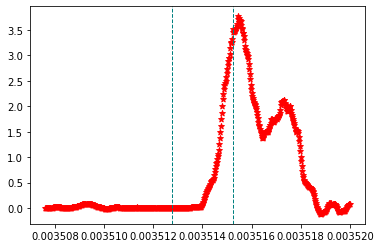

In [4]:
# plot the friction state and set the two figure index
path_FrictionState_ = '../particle_info/particle_info_friction_state.txt'
FrictionState_ = read_FrictionState(path_FrictionState_)
plt.scatter(FrictionState_[:, 0],  \
            FrictionState_[:, 4] - FrictionState_[:, 5]\
              , c = 'r', marker = '*')

plt.axvline(x = FrictionState_[250, 0],  color='teal', ls='--', lw=1)
plt.axvline(x = FrictionState_[370, 0],  color='teal', ls='--', lw=1)

v_plate_ = (FrictionState_[:, 4] - FrictionState_[:, 5])/2
print(np.where(v_plate_ == v_plate_.max()))

In [5]:
#%% Screen particles according to x to avoid effects caused by BC
def screen_grains_by_x(l_lim_, u_lim_, c_, v_):
    '''
    l_lim_ - lower limit
    u_lim_ - upper limit
    c_ - c coodinate
    v_ - corresponding variables
    
    returns:
        cnew_ - the  coodinate in a centain range
        vnew_ - the correspnding coodinate in a certain range
    
    '''
    cnew_, vnew_ = [], [] # initialize
    for i_ in range(c_.shape[0]):
        
        if c_[i_][0] > l_lim_ and c_[i_][0]  < u_lim_:
            cnew_.append(c_[i_][:])
            vnew_.append(v_[i_])

    return np.array(cnew_), np.array(vnew_)  # return handled coodinate and variables.

# cnew_, ynew_ = screen_grains_by_x(0.5, 3.5, x_, y_)
# cnew_, vnew_ = screen_grains_by_x(0.5, 3.5, x_, vx_)



Read granular temperature at 1


Reading particle info 1...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 1 successful

Read coordinate done


Interpolation done



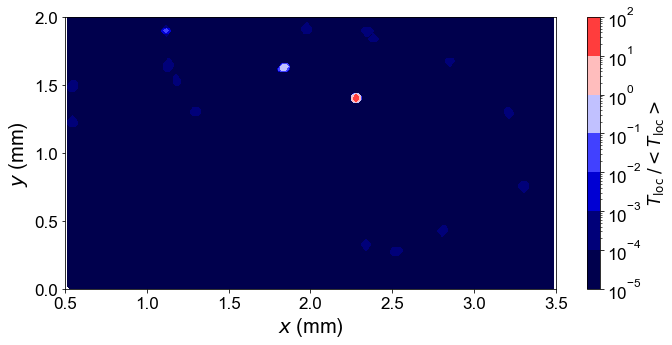


-----------------------------------------------------


Read granular temperature at 2


Reading particle info 2...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 2 successful

Read coordinate done


Interpolation done



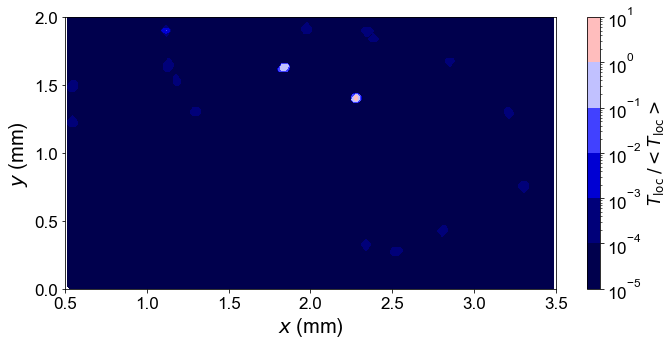


-----------------------------------------------------


Read granular temperature at 3


Reading particle info 3...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 3 successful

Read coordinate done


Interpolation done



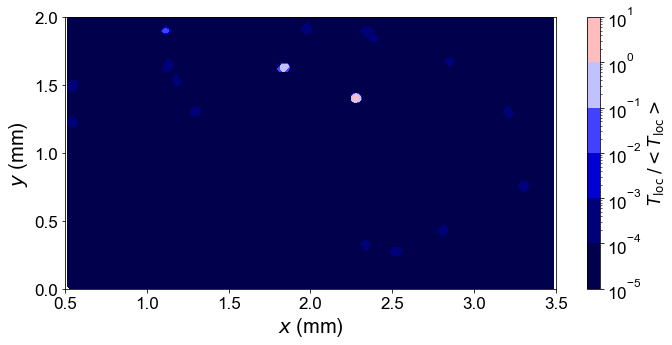


-----------------------------------------------------


Read granular temperature at 4


Reading particle info 4...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 4 successful

Read coordinate done


Interpolation done



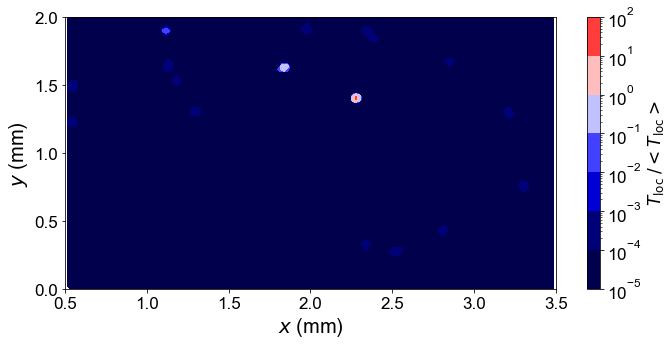


-----------------------------------------------------


Read granular temperature at 5


Reading particle info 5...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 5 successful

Read coordinate done


Interpolation done



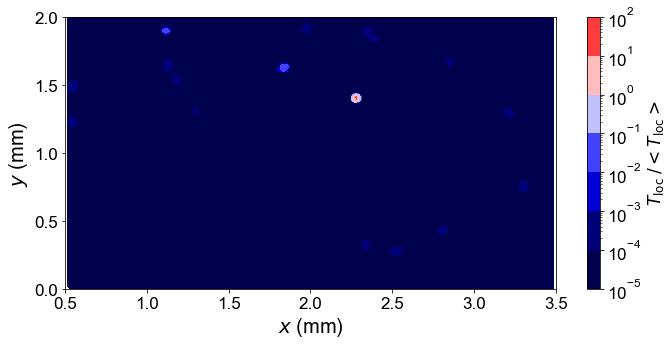


-----------------------------------------------------


Read granular temperature at 6


Reading particle info 6...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 6 successful

Read coordinate done


Interpolation done



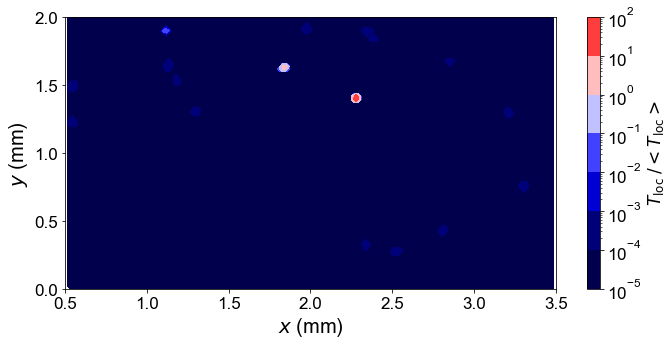


-----------------------------------------------------


Read granular temperature at 7


Reading particle info 7...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 7 successful

Read coordinate done


Interpolation done



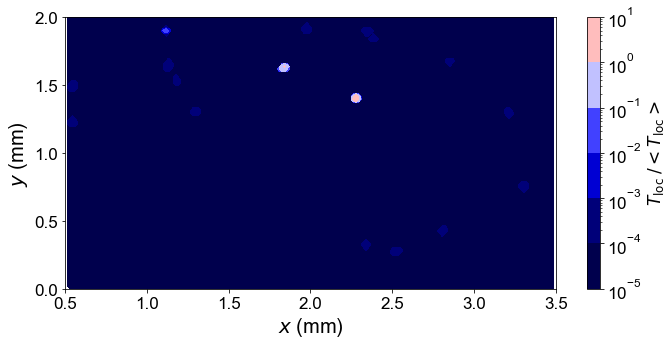


-----------------------------------------------------


Read granular temperature at 8


Reading particle info 8...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 8 successful

Read coordinate done


Interpolation done



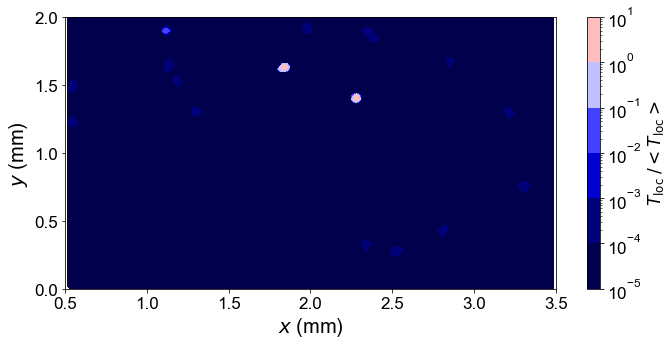


-----------------------------------------------------


Read granular temperature at 9


Reading particle info 9...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 9 successful

Read coordinate done


Interpolation done



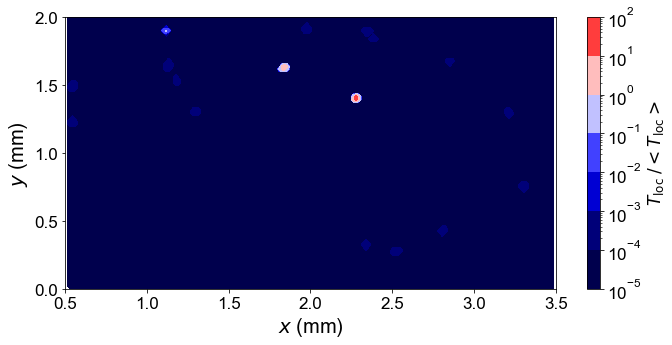


-----------------------------------------------------


Read granular temperature at 10


Reading particle info 10...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 10 successful

Read coordinate done


Interpolation done



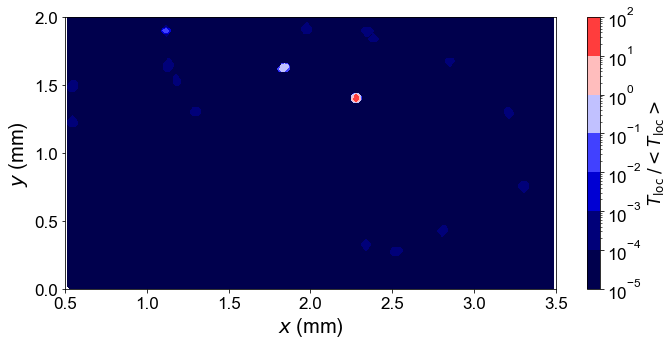


-----------------------------------------------------


Read granular temperature at 11


Reading particle info 11...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 11 successful

Read coordinate done


Interpolation done



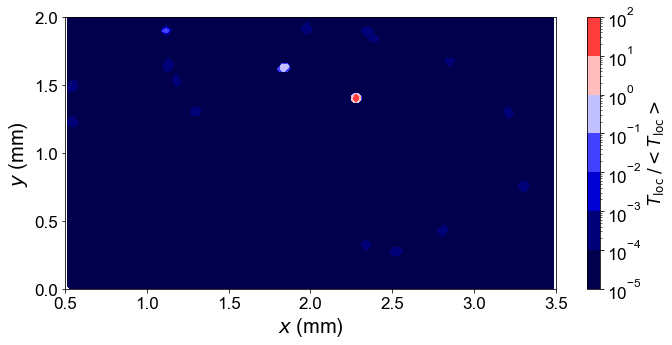


-----------------------------------------------------


Read granular temperature at 12


Reading particle info 12...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 12 successful

Read coordinate done


Interpolation done



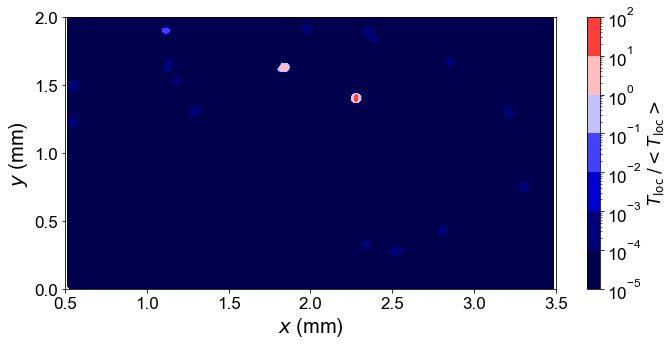


-----------------------------------------------------


Read granular temperature at 13


Reading particle info 13...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 13 successful

Read coordinate done


Interpolation done



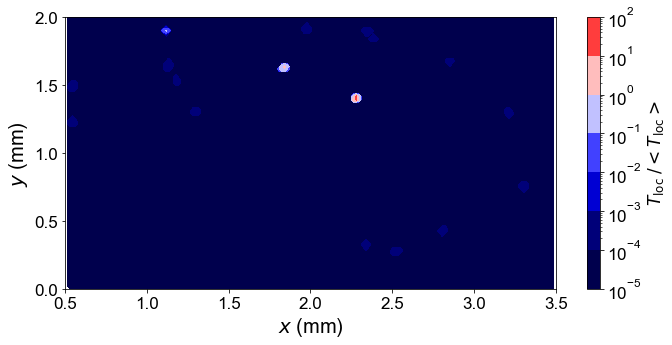


-----------------------------------------------------


Read granular temperature at 14


Reading particle info 14...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 14 successful

Read coordinate done


Interpolation done



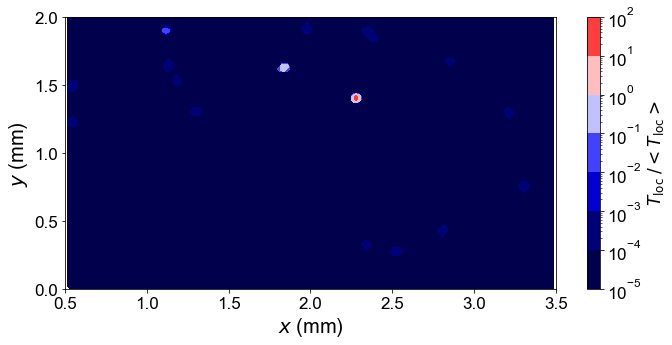


-----------------------------------------------------


Read granular temperature at 15


Reading particle info 15...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 15 successful

Read coordinate done


Interpolation done



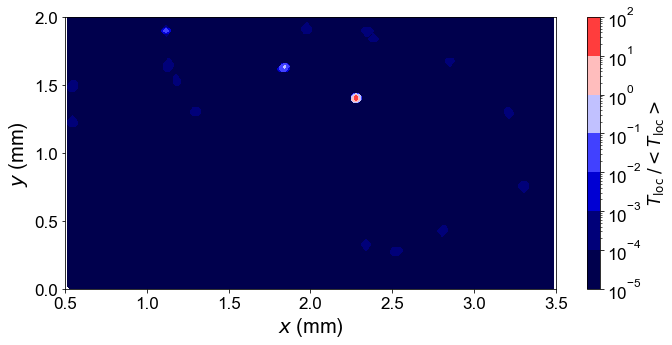


-----------------------------------------------------


Read granular temperature at 16


Reading particle info 16...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 16 successful

Read coordinate done


Interpolation done



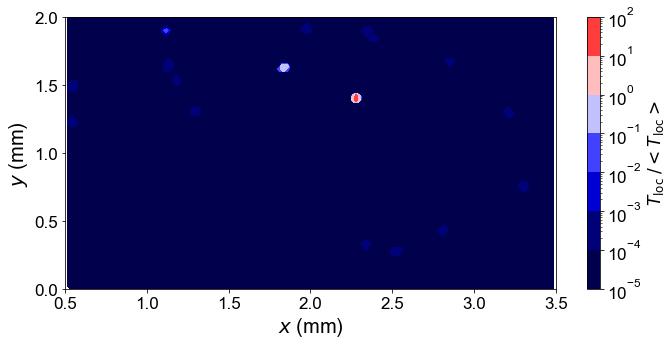


-----------------------------------------------------


Read granular temperature at 17


Reading particle info 17...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 17 successful

Read coordinate done


Interpolation done



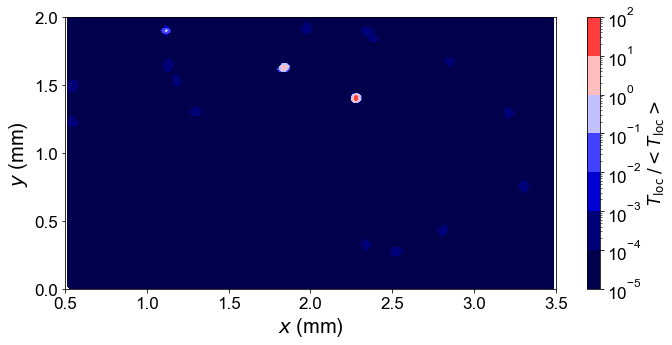


-----------------------------------------------------


Read granular temperature at 18


Reading particle info 18...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 18 successful

Read coordinate done


Interpolation done



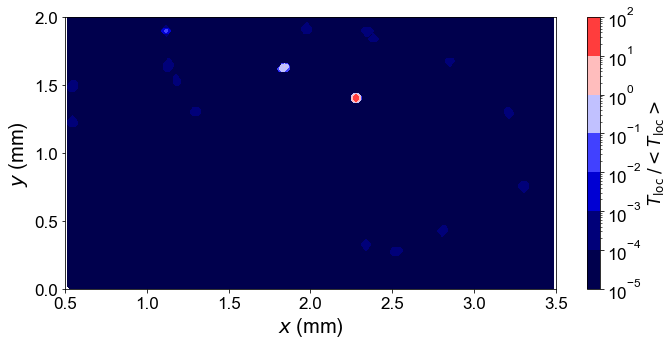


-----------------------------------------------------


Read granular temperature at 19


Reading particle info 19...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 19 successful

Read coordinate done


Interpolation done



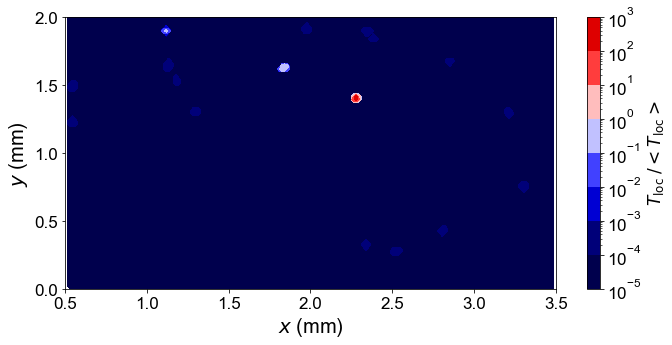


-----------------------------------------------------


Read granular temperature at 20


Reading particle info 20...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 20 successful

Read coordinate done


Interpolation done



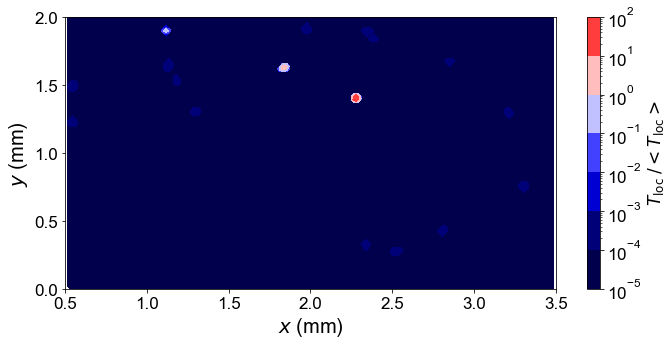


-----------------------------------------------------


Read granular temperature at 21


Reading particle info 21...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 21 successful

Read coordinate done


Interpolation done



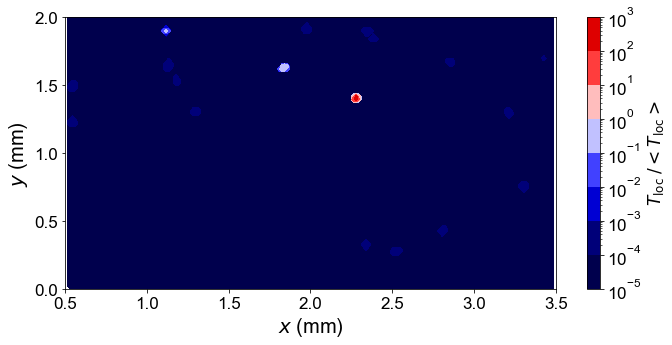


-----------------------------------------------------


Read granular temperature at 22


Reading particle info 22...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 22 successful

Read coordinate done


Interpolation done



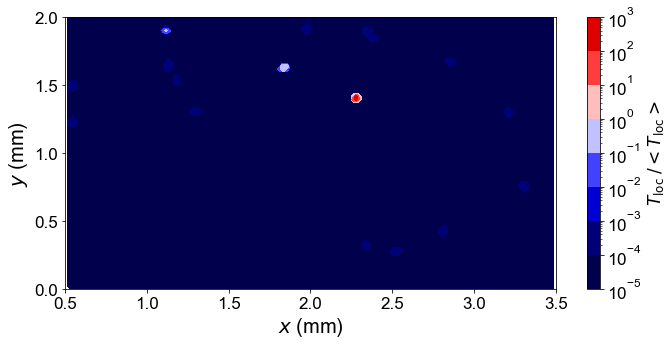


-----------------------------------------------------


Read granular temperature at 23


Reading particle info 23...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 23 successful

Read coordinate done


Interpolation done



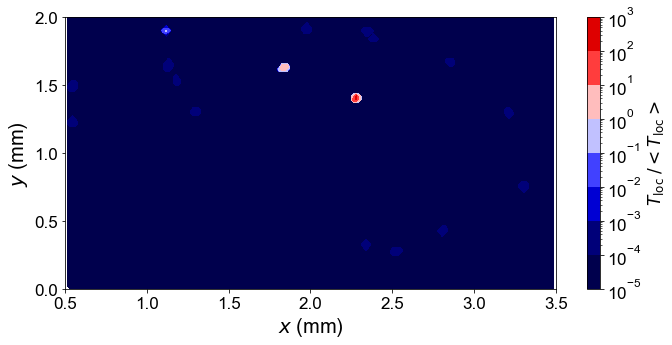


-----------------------------------------------------


Read granular temperature at 24


Reading particle info 24...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 24 successful

Read coordinate done


Interpolation done



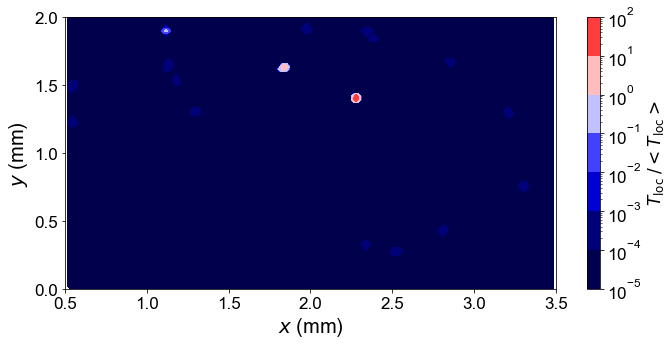


-----------------------------------------------------


Read granular temperature at 25


Reading particle info 25...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 25 successful

Read coordinate done


Interpolation done



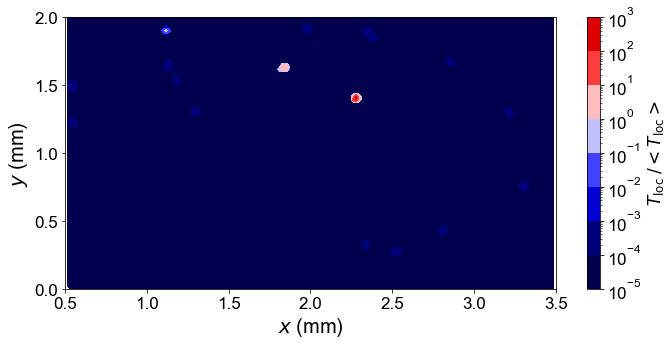


-----------------------------------------------------


Read granular temperature at 26


Reading particle info 26...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 26 successful

Read coordinate done


Interpolation done



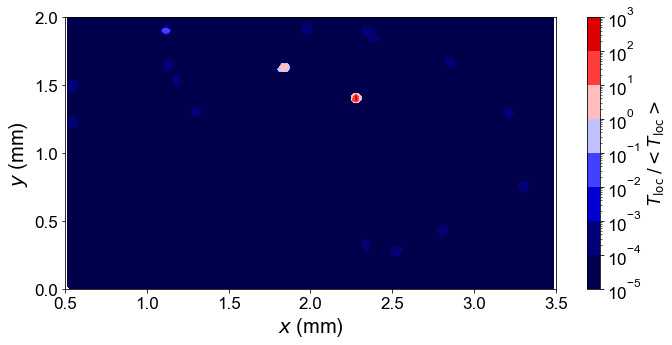


-----------------------------------------------------


Read granular temperature at 27


Reading particle info 27...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 27 successful

Read coordinate done


Interpolation done



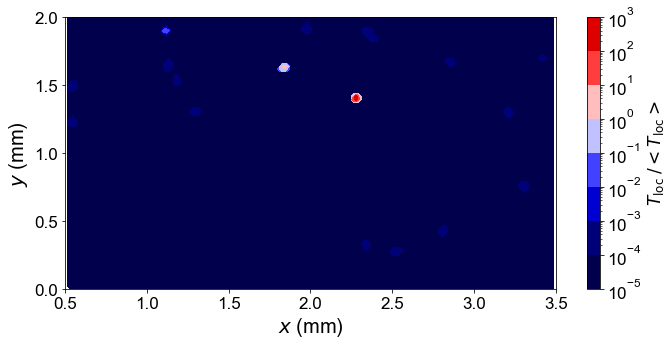


-----------------------------------------------------


Read granular temperature at 28


Reading particle info 28...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 28 successful

Read coordinate done


Interpolation done



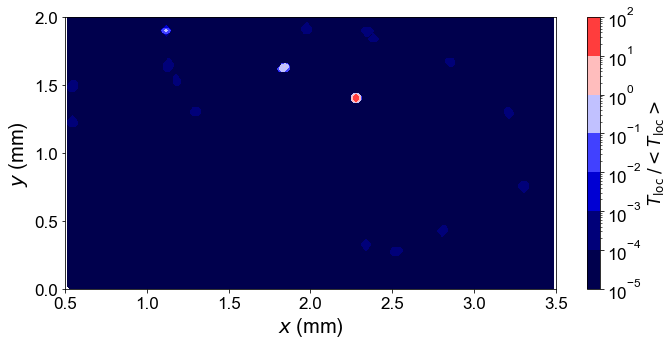


-----------------------------------------------------


Read granular temperature at 29


Reading particle info 29...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 29 successful

Read coordinate done


Interpolation done



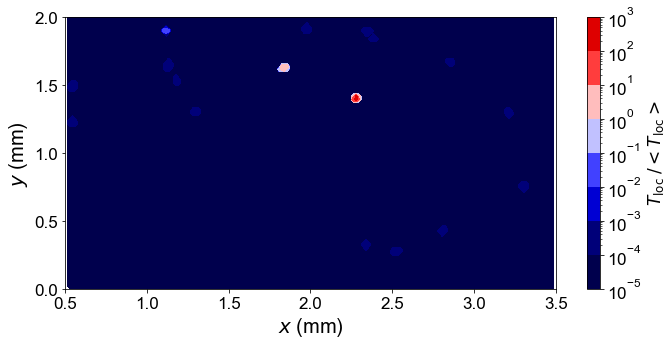


-----------------------------------------------------


Read granular temperature at 30


Reading particle info 30...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 30 successful

Read coordinate done


Interpolation done



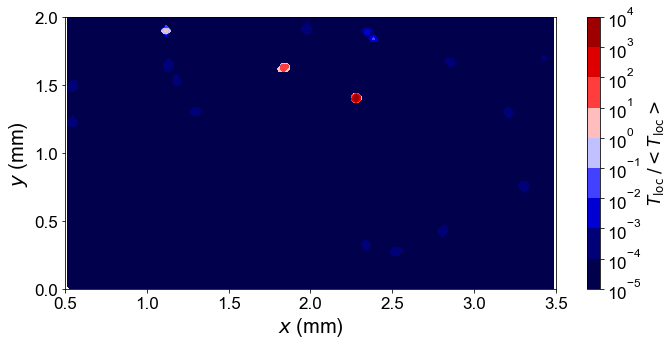


-----------------------------------------------------


Read granular temperature at 31


Reading particle info 31...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 31 successful

Read coordinate done


Interpolation done



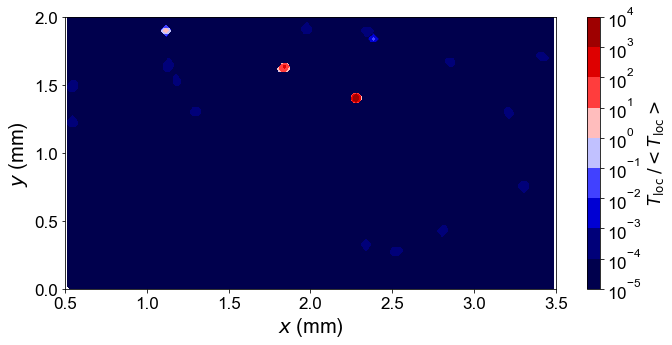


-----------------------------------------------------


Read granular temperature at 32


Reading particle info 32...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 32 successful

Read coordinate done


Interpolation done



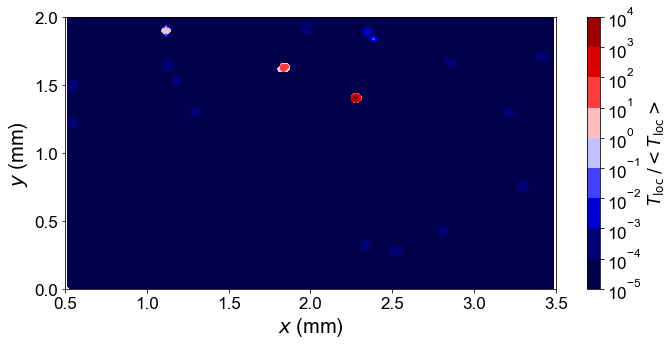


-----------------------------------------------------


Read granular temperature at 33


Reading particle info 33...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 33 successful

Read coordinate done


Interpolation done



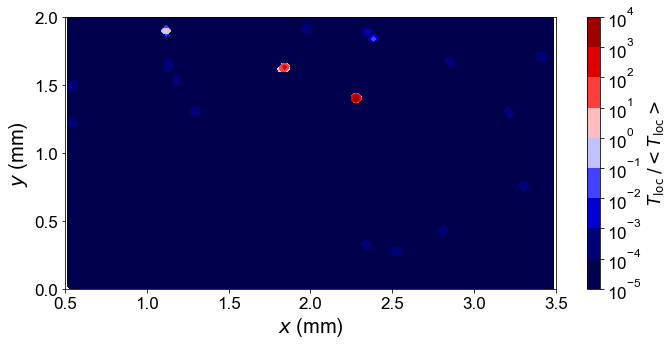


-----------------------------------------------------


Read granular temperature at 34


Reading particle info 34...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 34 successful

Read coordinate done


Interpolation done



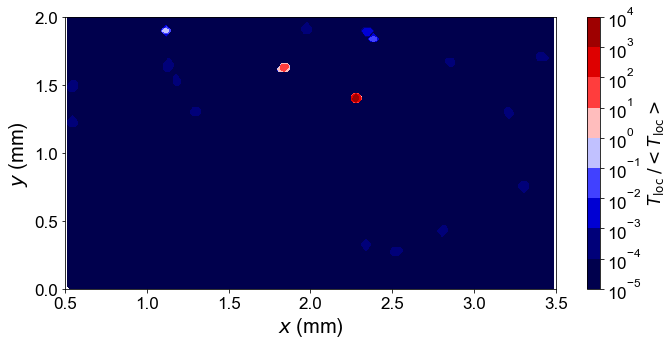


-----------------------------------------------------


Read granular temperature at 35


Reading particle info 35...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 35 successful

Read coordinate done


Interpolation done



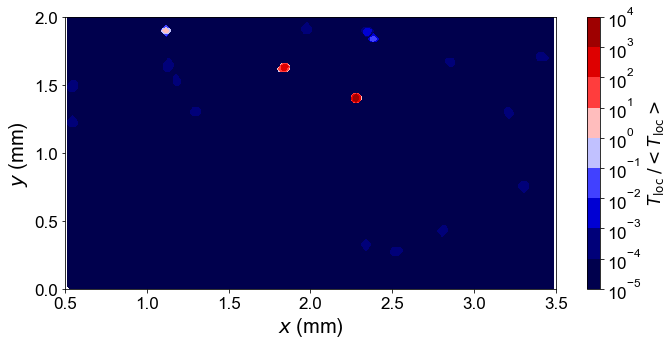


-----------------------------------------------------


Read granular temperature at 36


Reading particle info 36...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 36 successful

Read coordinate done


Interpolation done



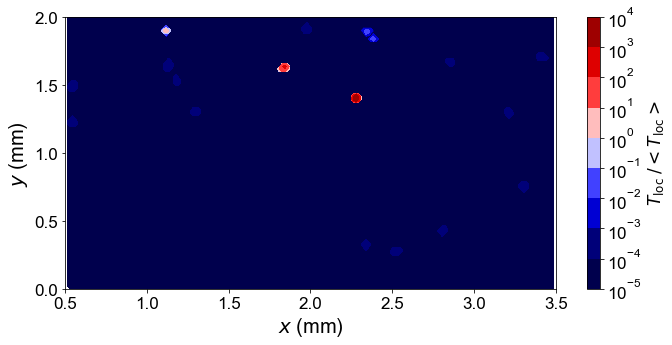


-----------------------------------------------------


Read granular temperature at 37


Reading particle info 37...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 37 successful

Read coordinate done


Interpolation done



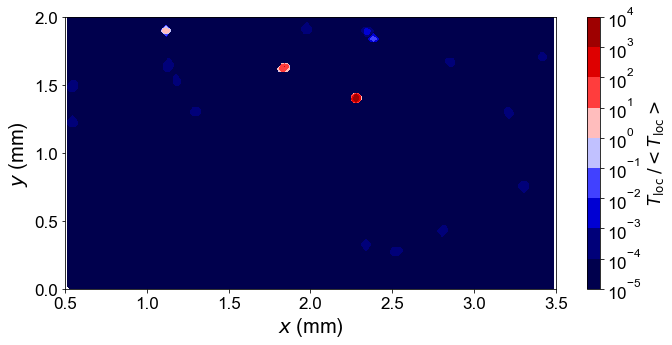


-----------------------------------------------------


Read granular temperature at 38


Reading particle info 38...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 38 successful

Read coordinate done


Interpolation done



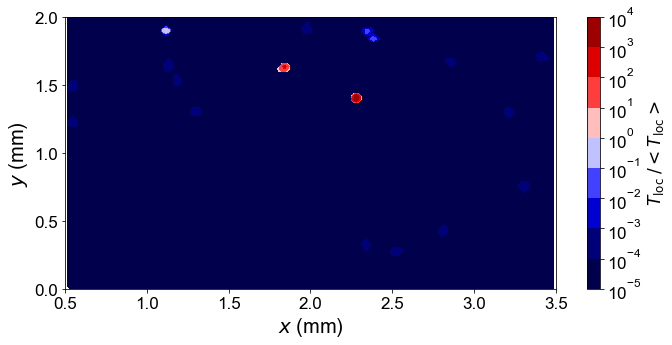


-----------------------------------------------------


Read granular temperature at 39


Reading particle info 39...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 39 successful

Read coordinate done


Interpolation done



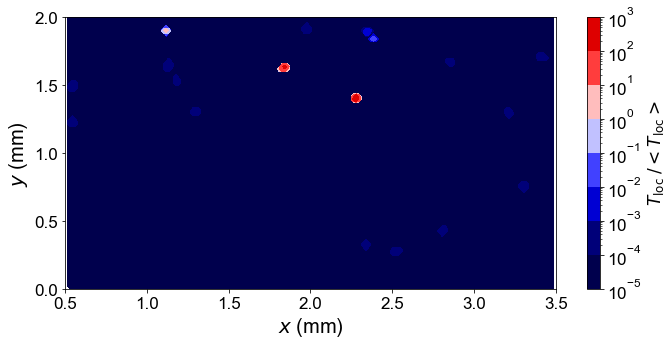


-----------------------------------------------------


Read granular temperature at 40


Reading particle info 40...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 40 successful

Read coordinate done


Interpolation done



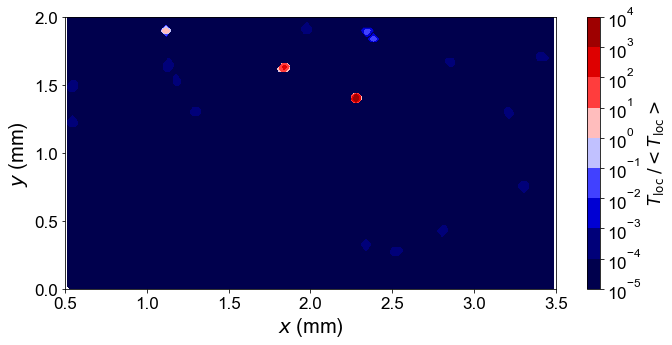


-----------------------------------------------------


Read granular temperature at 41


Reading particle info 41...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 41 successful

Read coordinate done


Interpolation done



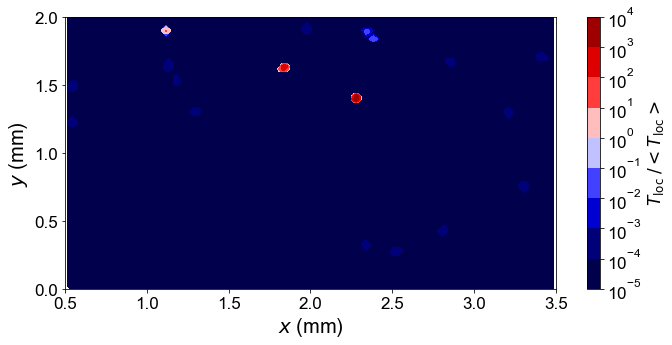


-----------------------------------------------------


Read granular temperature at 42


Reading particle info 42...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 42 successful

Read coordinate done


Interpolation done



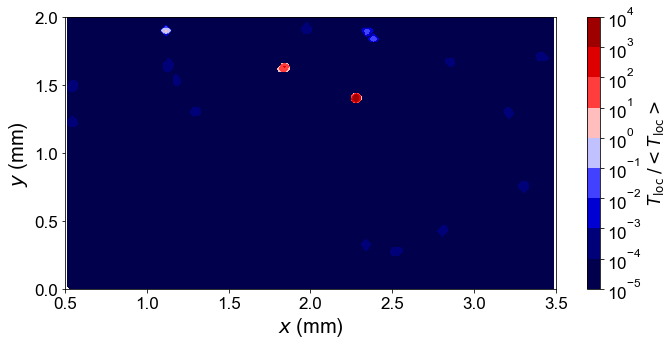


-----------------------------------------------------


Read granular temperature at 43


Reading particle info 43...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 43 successful

Read coordinate done


Interpolation done



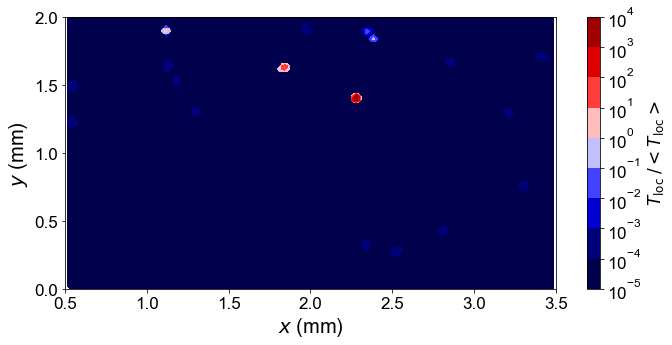


-----------------------------------------------------


Read granular temperature at 44


Reading particle info 44...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 44 successful

Read coordinate done


Interpolation done



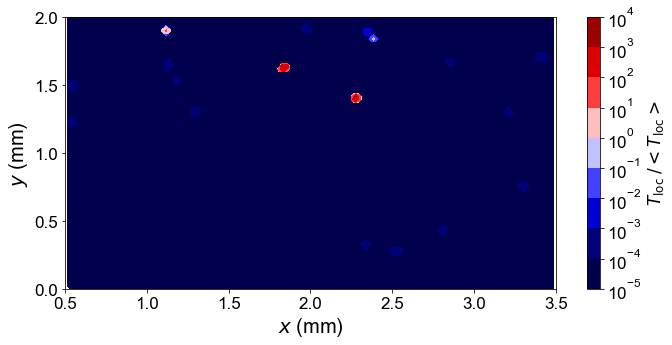


-----------------------------------------------------


Read granular temperature at 45


Reading particle info 45...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 45 successful

Read coordinate done


Interpolation done



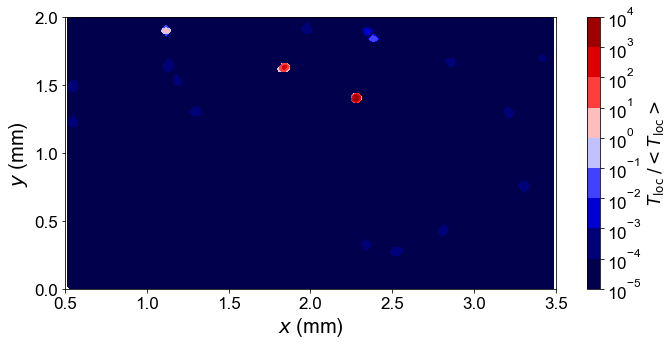


-----------------------------------------------------


Read granular temperature at 46


Reading particle info 46...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 46 successful

Read coordinate done


Interpolation done



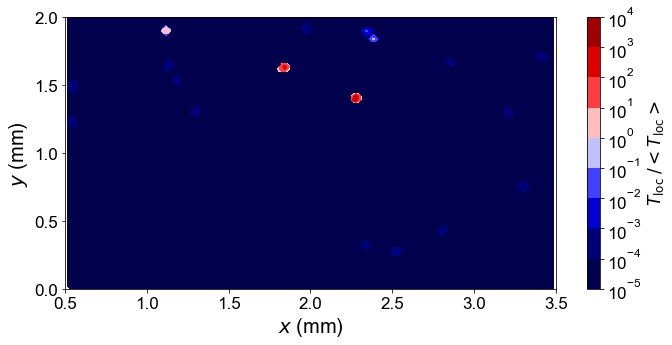


-----------------------------------------------------


Read granular temperature at 47


Reading particle info 47...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 47 successful

Read coordinate done


Interpolation done



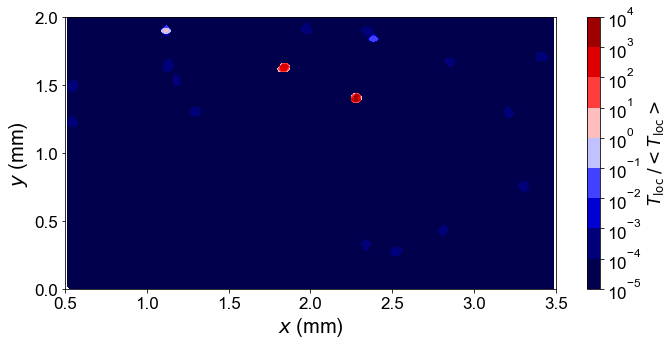


-----------------------------------------------------


Read granular temperature at 48


Reading particle info 48...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 48 successful

Read coordinate done


Interpolation done



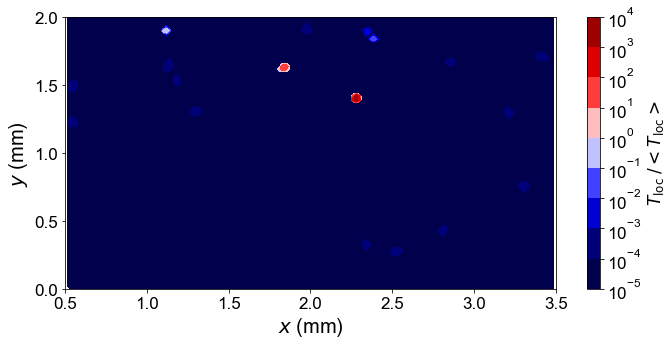


-----------------------------------------------------


Read granular temperature at 49


Reading particle info 49...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 49 successful

Read coordinate done


Interpolation done



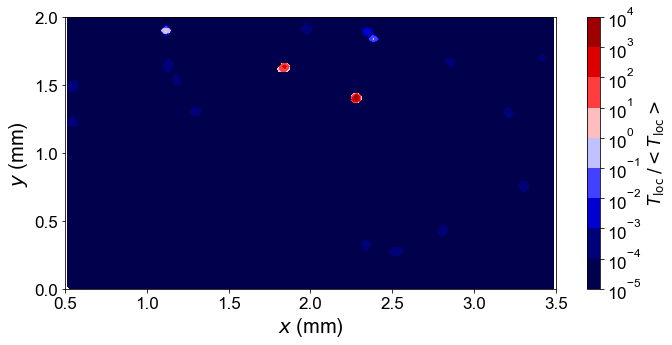


-----------------------------------------------------


Read granular temperature at 50


Reading particle info 50...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 50 successful

Read coordinate done


Interpolation done



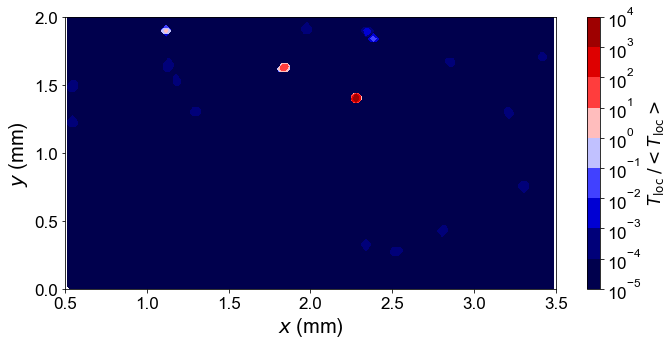


-----------------------------------------------------


Read granular temperature at 51


Reading particle info 51...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 51 successful

Read coordinate done


Interpolation done



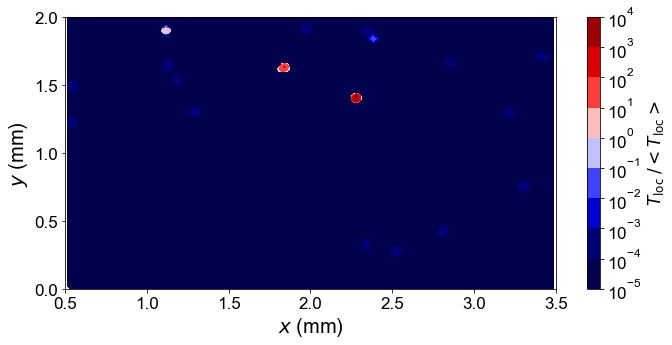


-----------------------------------------------------


Read granular temperature at 52


Reading particle info 52...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 52 successful

Read coordinate done


Interpolation done



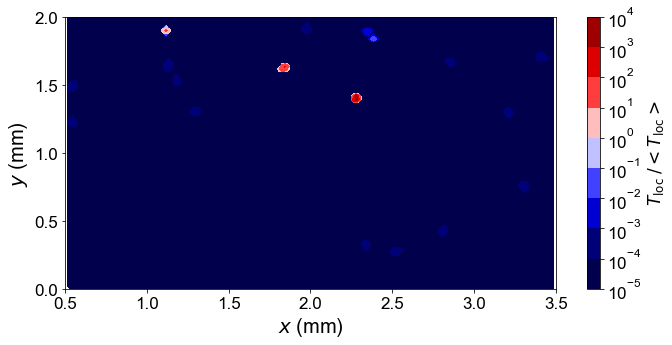


-----------------------------------------------------


Read granular temperature at 53


Reading particle info 53...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 53 successful

Read coordinate done


Interpolation done



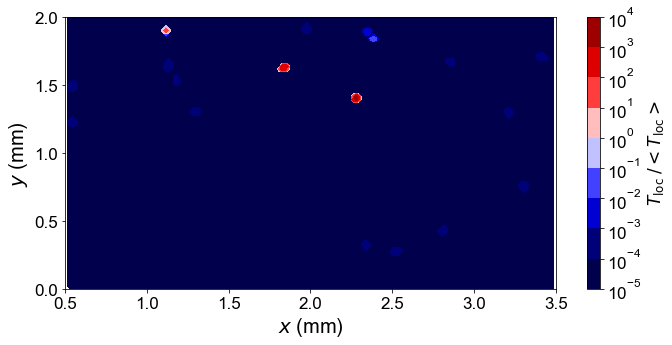


-----------------------------------------------------


Read granular temperature at 54


Reading particle info 54...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 54 successful

Read coordinate done


Interpolation done



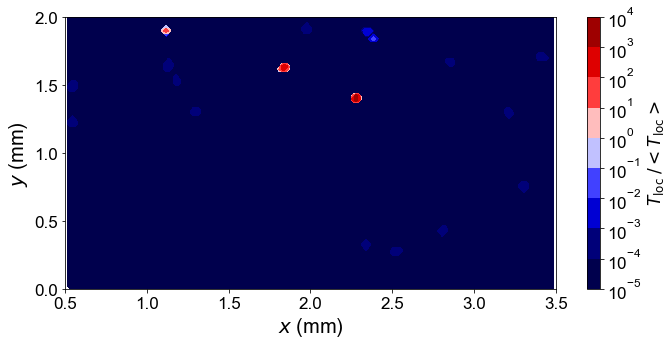


-----------------------------------------------------


Read granular temperature at 55


Reading particle info 55...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 55 successful

Read coordinate done


Interpolation done



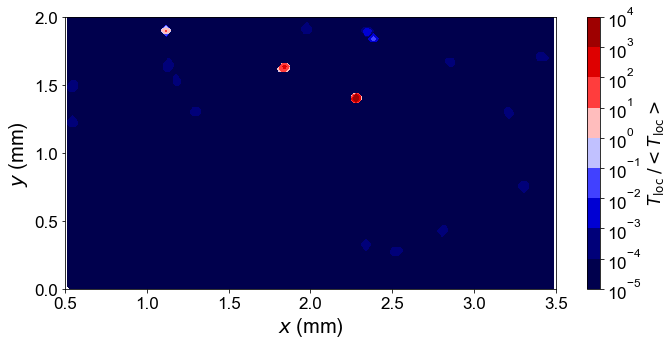


-----------------------------------------------------


Read granular temperature at 56


Reading particle info 56...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 56 successful

Read coordinate done


Interpolation done



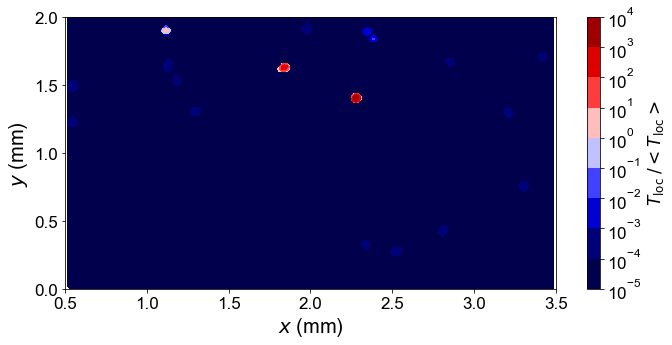


-----------------------------------------------------


Read granular temperature at 57


Reading particle info 57...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 57 successful

Read coordinate done


Interpolation done



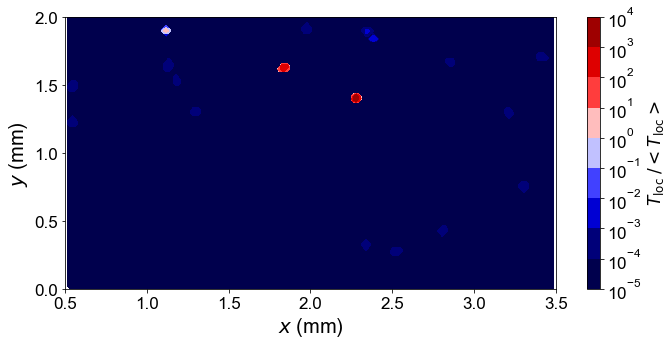


-----------------------------------------------------


Read granular temperature at 58


Reading particle info 58...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 58 successful

Read coordinate done


Interpolation done



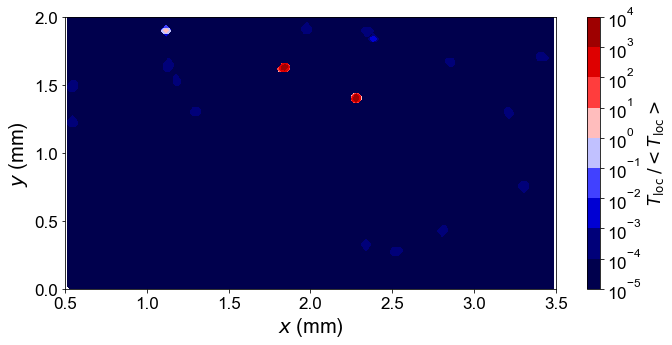


-----------------------------------------------------


Read granular temperature at 59


Reading particle info 59...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 59 successful

Read coordinate done


Interpolation done



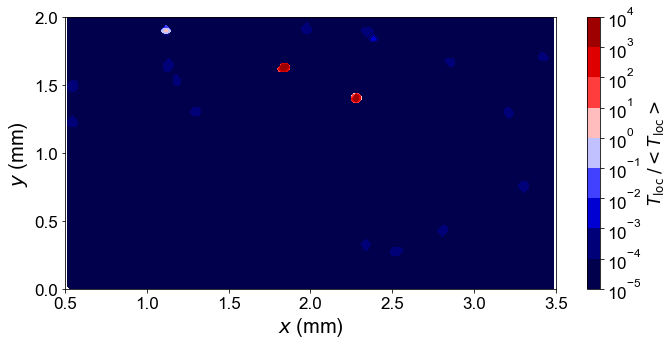


-----------------------------------------------------


Read granular temperature at 60


Reading particle info 60...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 60 successful

Read coordinate done


Interpolation done



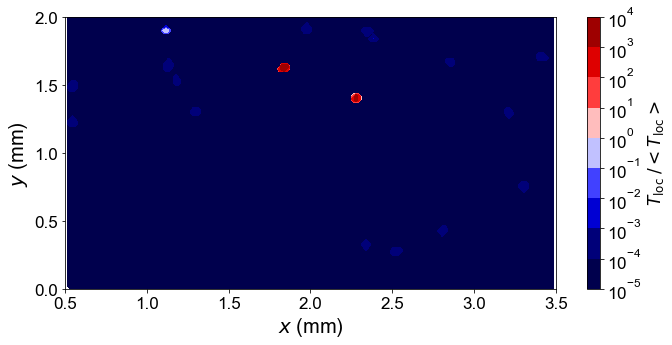


-----------------------------------------------------


Read granular temperature at 61


Reading particle info 61...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 61 successful

Read coordinate done


Interpolation done



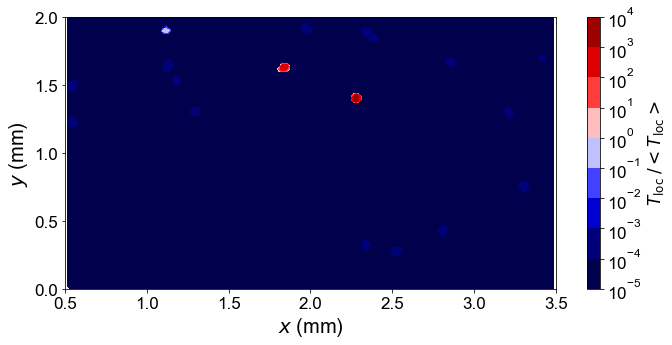


-----------------------------------------------------


Read granular temperature at 62


Reading particle info 62...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 62 successful

Read coordinate done


Interpolation done



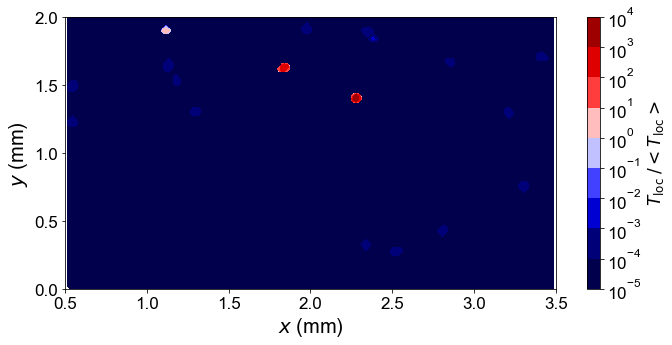


-----------------------------------------------------


Read granular temperature at 63


Reading particle info 63...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 63 successful

Read coordinate done


Interpolation done



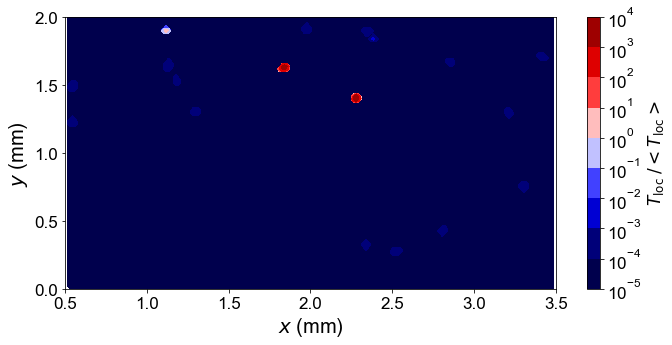


-----------------------------------------------------


Read granular temperature at 64


Reading particle info 64...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 64 successful

Read coordinate done


Interpolation done



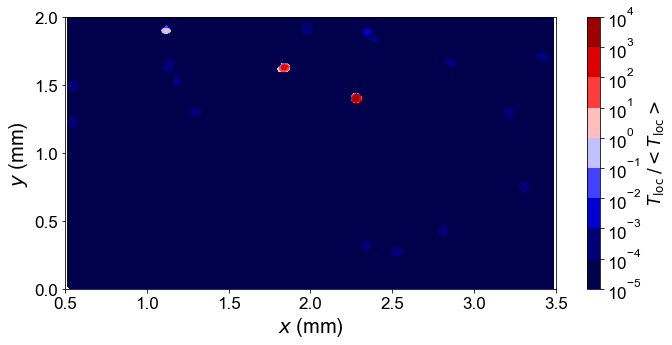


-----------------------------------------------------


Read granular temperature at 65


Reading particle info 65...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 65 successful

Read coordinate done


Interpolation done



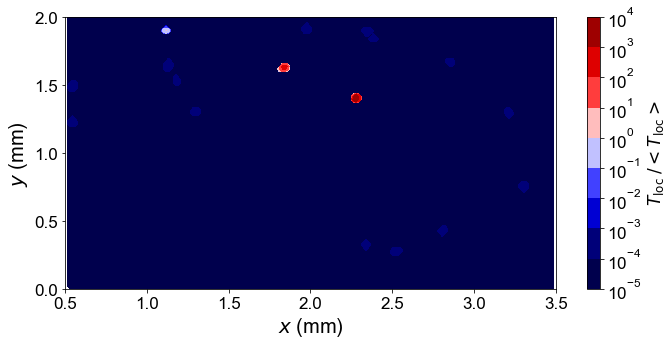


-----------------------------------------------------


Read granular temperature at 66


Reading particle info 66...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 66 successful

Read coordinate done


Interpolation done



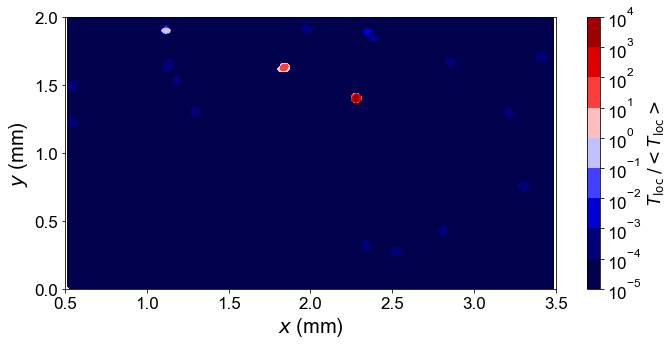


-----------------------------------------------------


Read granular temperature at 67


Reading particle info 67...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 67 successful

Read coordinate done


Interpolation done



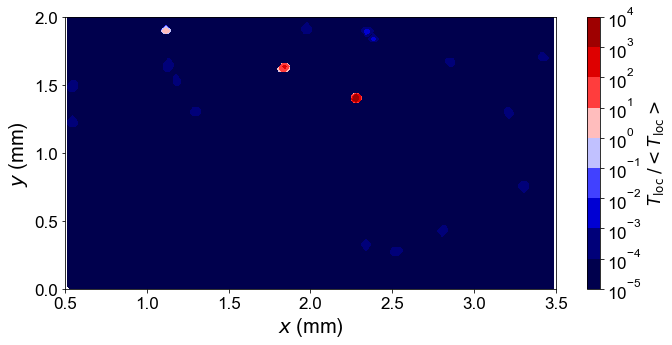


-----------------------------------------------------


Read granular temperature at 68


Reading particle info 68...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 68 successful

Read coordinate done


Interpolation done



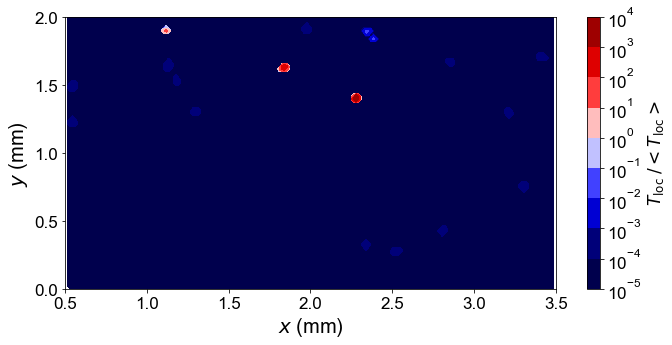


-----------------------------------------------------


Read granular temperature at 69


Reading particle info 69...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 69 successful

Read coordinate done


Interpolation done



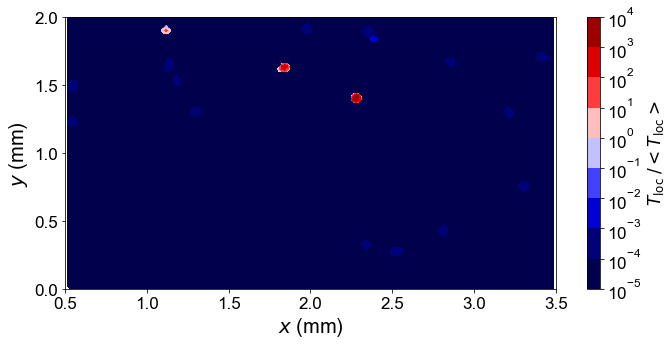


-----------------------------------------------------


Read granular temperature at 70


Reading particle info 70...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 70 successful

Read coordinate done


Interpolation done



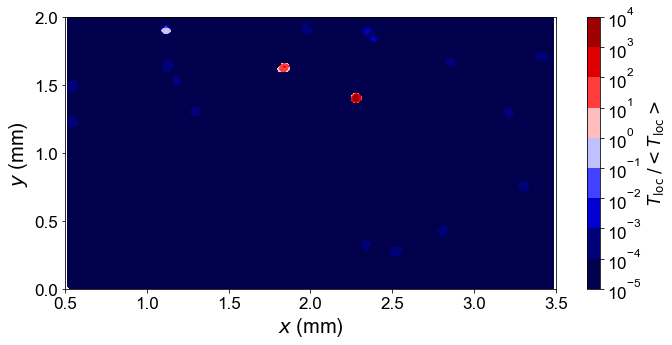


-----------------------------------------------------


Read granular temperature at 71


Reading particle info 71...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 71 successful

Read coordinate done


Interpolation done



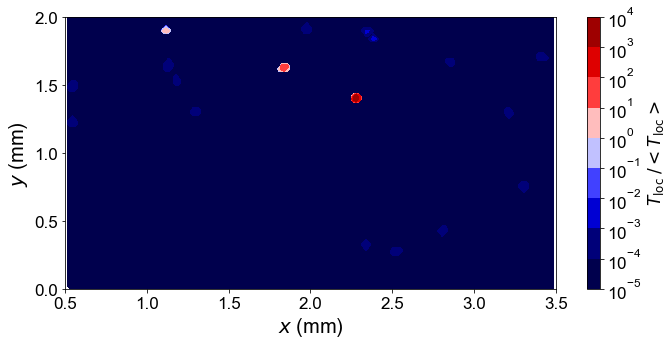


-----------------------------------------------------


Read granular temperature at 72


Reading particle info 72...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 72 successful

Read coordinate done


Interpolation done



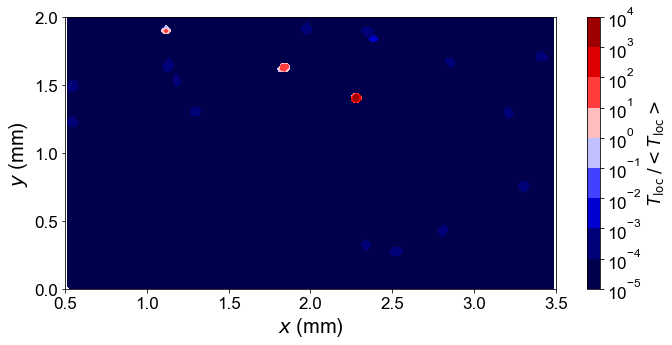


-----------------------------------------------------


Read granular temperature at 73


Reading particle info 73...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 73 successful

Read coordinate done


Interpolation done



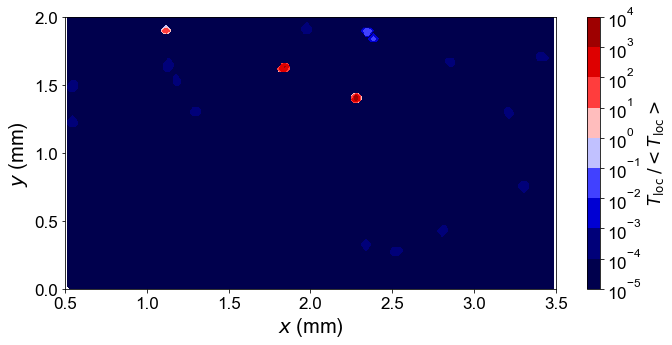


-----------------------------------------------------


Read granular temperature at 74


Reading particle info 74...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 74 successful

Read coordinate done


Interpolation done



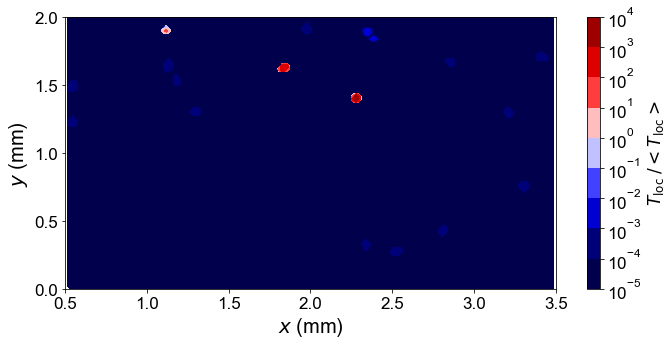


-----------------------------------------------------


Read granular temperature at 75


Reading particle info 75...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 75 successful

Read coordinate done


Interpolation done



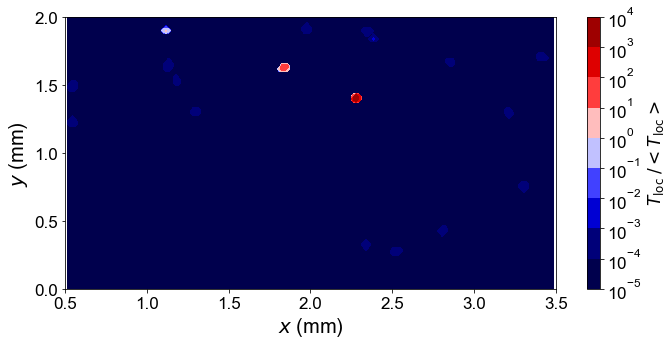


-----------------------------------------------------


Read granular temperature at 76


Reading particle info 76...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 76 successful

Read coordinate done


Interpolation done



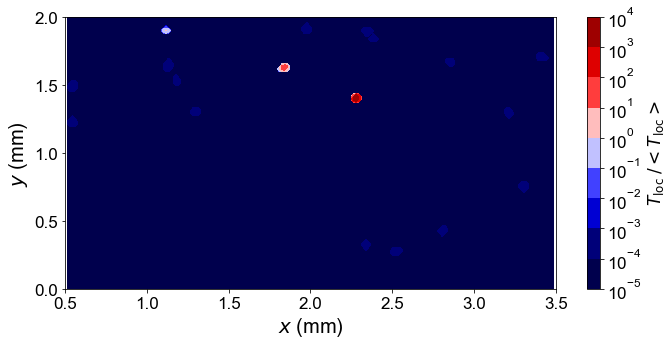


-----------------------------------------------------


Read granular temperature at 77


Reading particle info 77...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 77 successful

Read coordinate done


Interpolation done



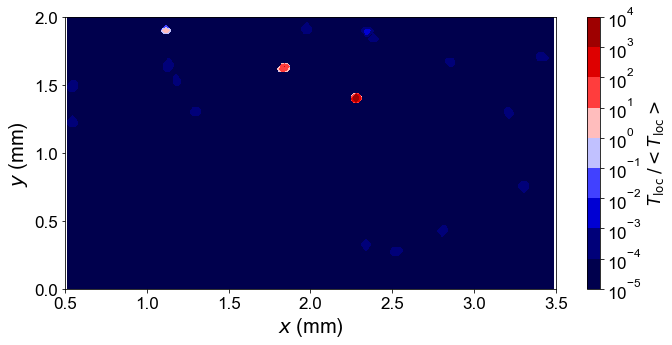


-----------------------------------------------------


Read granular temperature at 78


Reading particle info 78...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 78 successful

Read coordinate done


Interpolation done



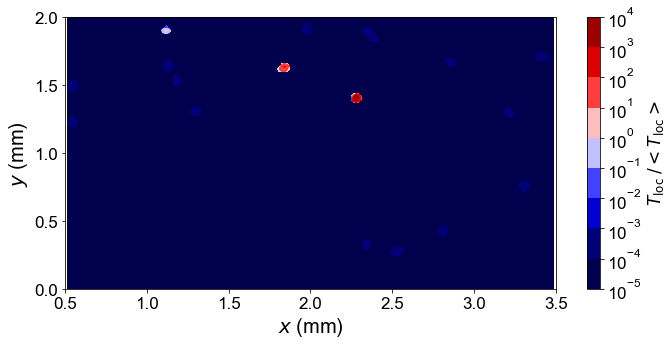


-----------------------------------------------------


Read granular temperature at 79


Reading particle info 79...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 79 successful

Read coordinate done


Interpolation done



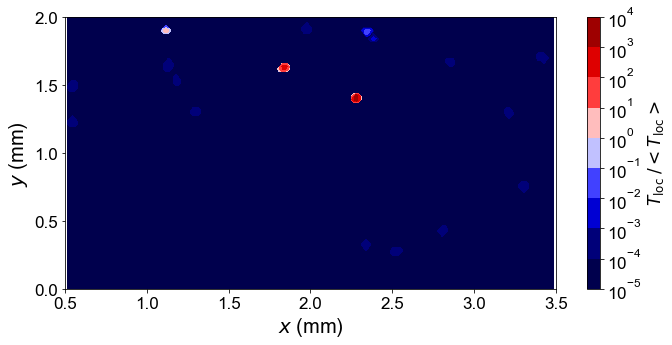


-----------------------------------------------------


Read granular temperature at 80


Reading particle info 80...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 80 successful

Read coordinate done


Interpolation done



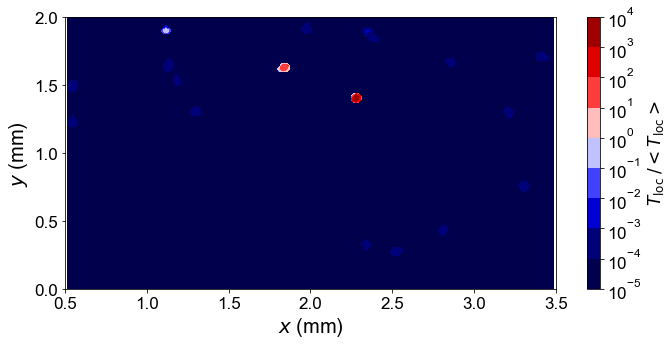


-----------------------------------------------------


Read granular temperature at 81


Reading particle info 81...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 81 successful

Read coordinate done


Interpolation done



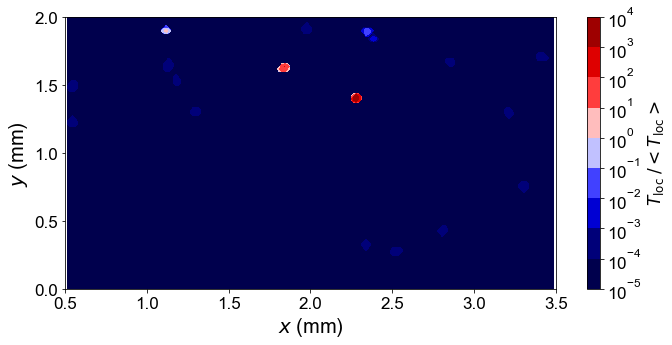


-----------------------------------------------------


Read granular temperature at 82


Reading particle info 82...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 82 successful

Read coordinate done


Interpolation done



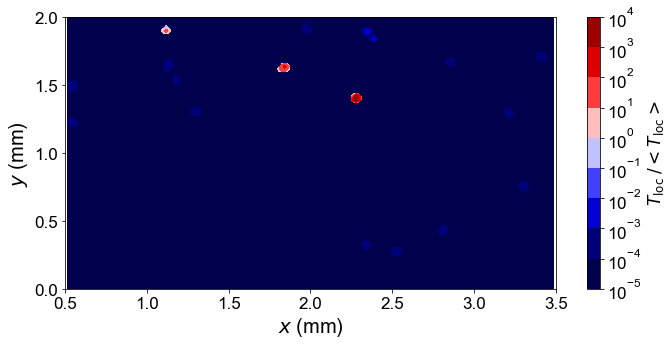


-----------------------------------------------------


Read granular temperature at 83


Reading particle info 83...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 83 successful

Read coordinate done


Interpolation done



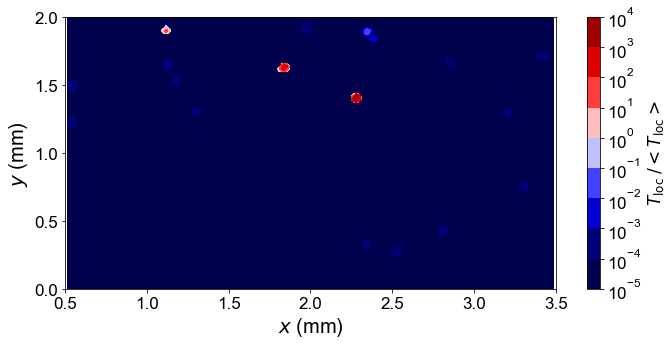


-----------------------------------------------------


Read granular temperature at 84


Reading particle info 84...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 84 successful

Read coordinate done


Interpolation done



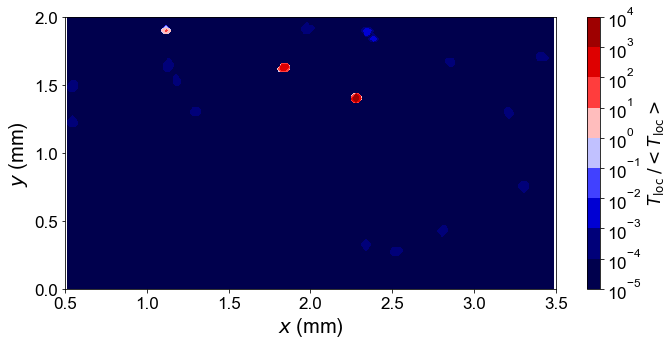


-----------------------------------------------------


Read granular temperature at 85


Reading particle info 85...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 85 successful

Read coordinate done


Interpolation done



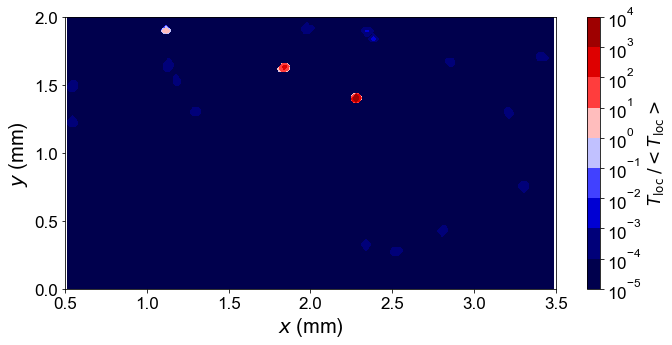


-----------------------------------------------------


Read granular temperature at 86


Reading particle info 86...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 86 successful

Read coordinate done


Interpolation done



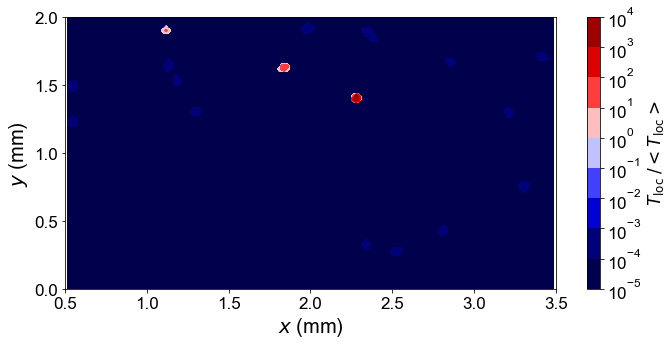


-----------------------------------------------------


Read granular temperature at 87


Reading particle info 87...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 87 successful

Read coordinate done


Interpolation done



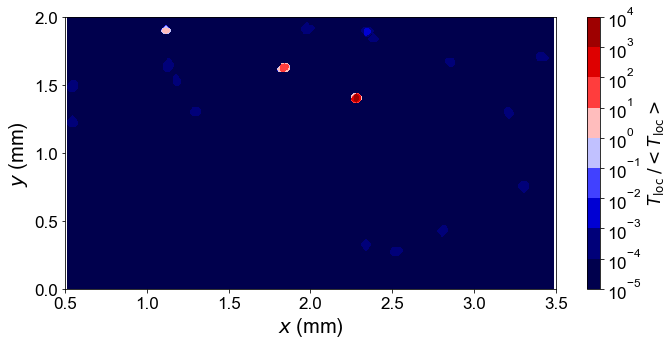


-----------------------------------------------------


Read granular temperature at 88


Reading particle info 88...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 88 successful

Read coordinate done


Interpolation done



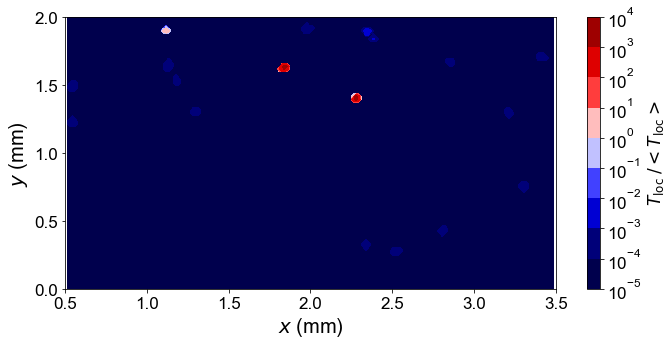


-----------------------------------------------------


Read granular temperature at 89


Reading particle info 89...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 89 successful

Read coordinate done


Interpolation done



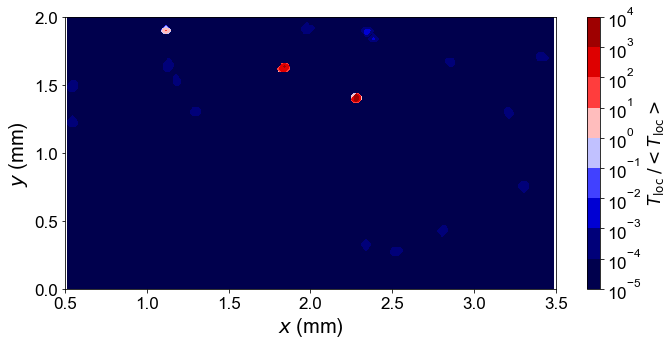


-----------------------------------------------------


Read granular temperature at 90


Reading particle info 90...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 90 successful

Read coordinate done


Interpolation done



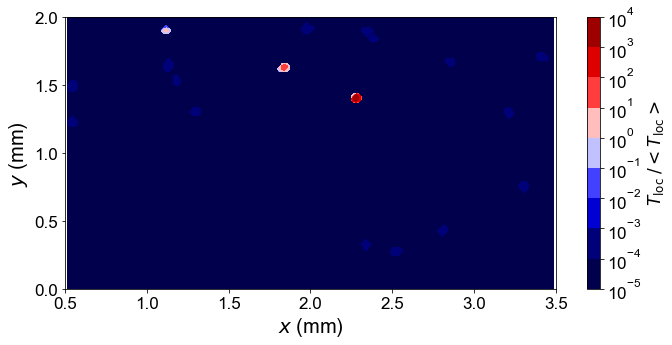


-----------------------------------------------------


Read granular temperature at 91


Reading particle info 91...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 91 successful

Read coordinate done


Interpolation done



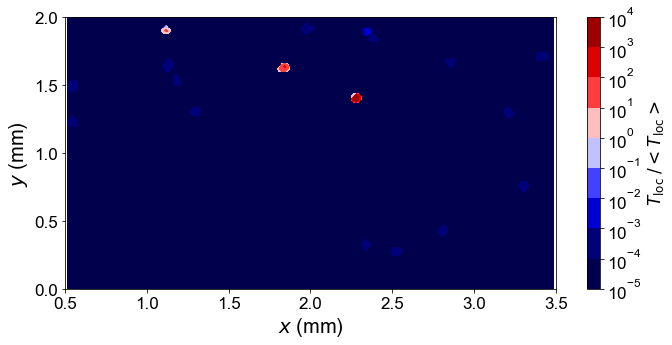


-----------------------------------------------------


Read granular temperature at 92


Reading particle info 92...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 92 successful

Read coordinate done


Interpolation done



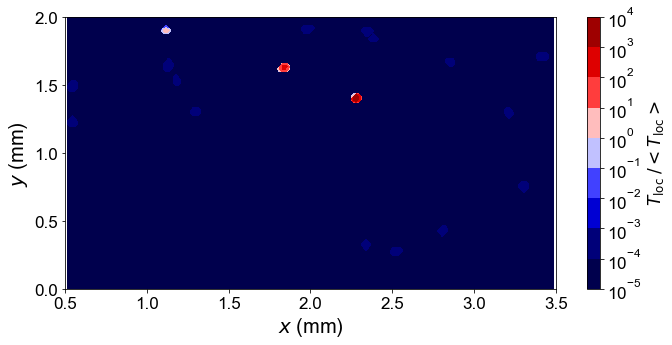


-----------------------------------------------------


Read granular temperature at 93


Reading particle info 93...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 93 successful

Read coordinate done


Interpolation done



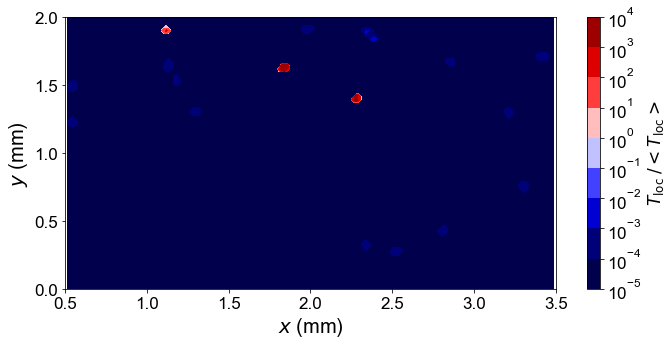


-----------------------------------------------------


Read granular temperature at 94


Reading particle info 94...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 94 successful

Read coordinate done


Interpolation done



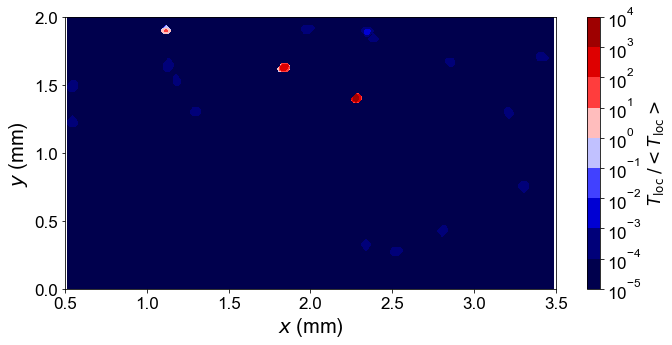


-----------------------------------------------------


Read granular temperature at 95


Reading particle info 95...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 95 successful

Read coordinate done


Interpolation done



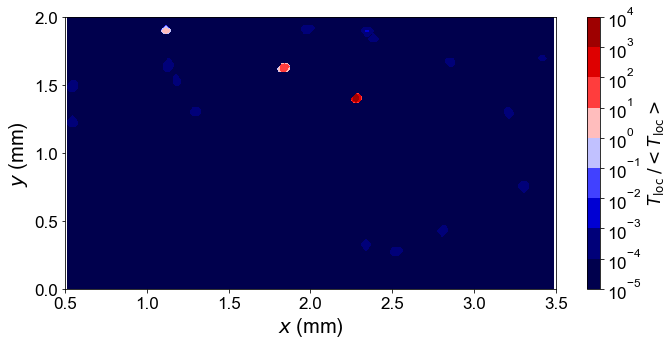


-----------------------------------------------------


Read granular temperature at 96


Reading particle info 96...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 96 successful

Read coordinate done


Interpolation done



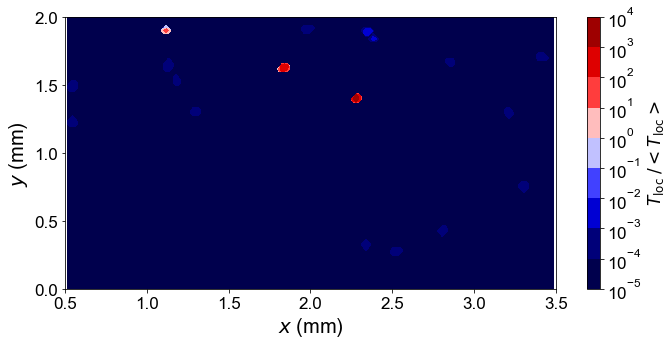


-----------------------------------------------------


Read granular temperature at 97


Reading particle info 97...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 97 successful

Read coordinate done


Interpolation done



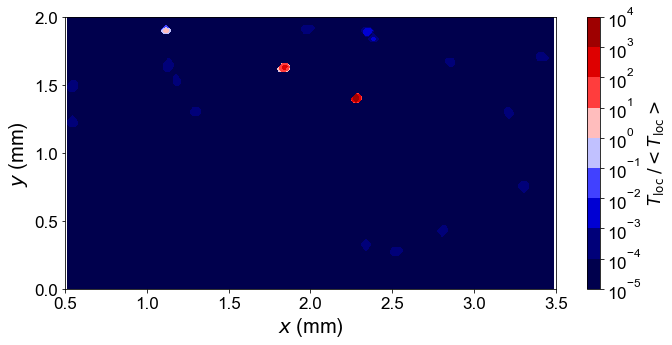


-----------------------------------------------------


Read granular temperature at 98


Reading particle info 98...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 98 successful

Read coordinate done


Interpolation done



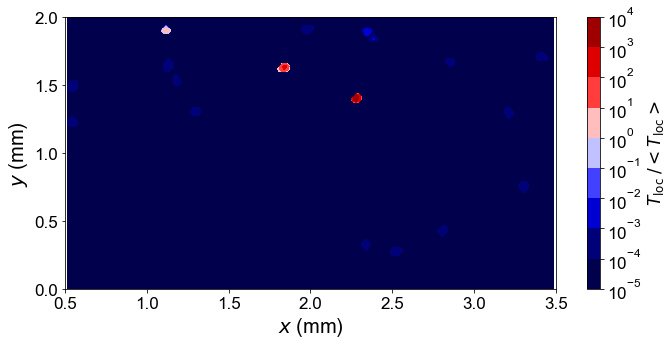


-----------------------------------------------------


Read granular temperature at 99


Reading particle info 99...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 99 successful

Read coordinate done


Interpolation done



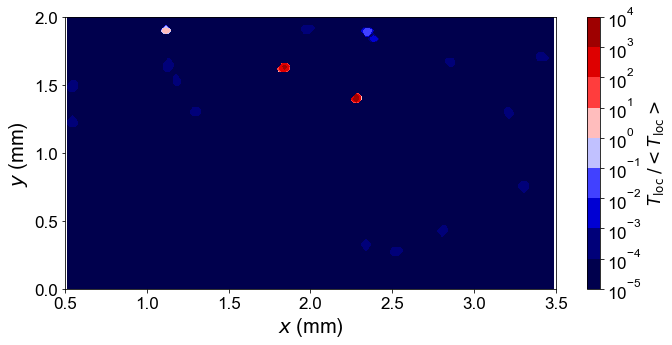


-----------------------------------------------------


Read granular temperature at 100


Reading particle info 100...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 100 successful

Read coordinate done


Interpolation done



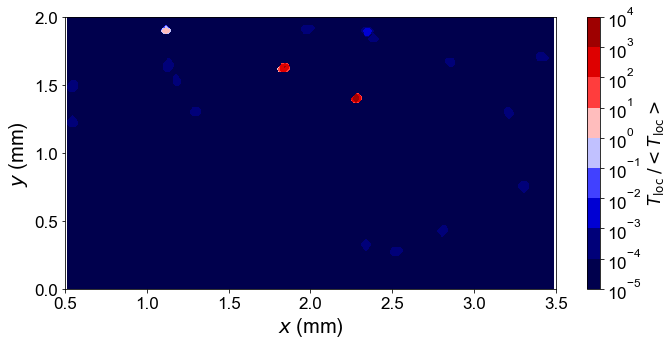


-----------------------------------------------------


Read granular temperature at 101


Reading particle info 101...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 101 successful

Read coordinate done


Interpolation done



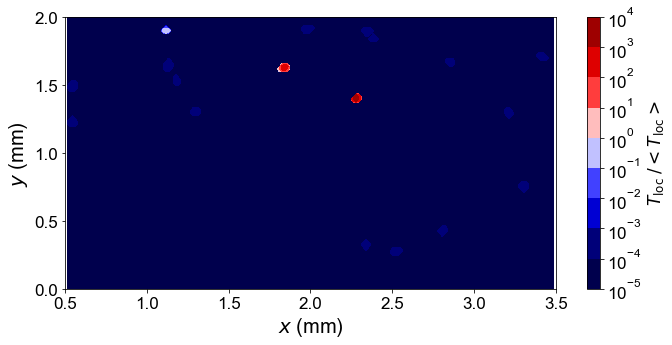


-----------------------------------------------------


Read granular temperature at 102


Reading particle info 102...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 102 successful

Read coordinate done


Interpolation done



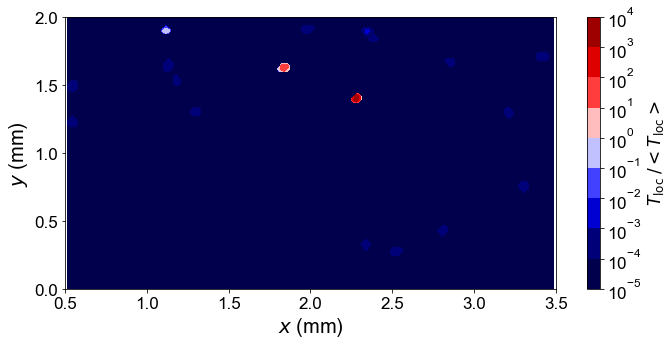


-----------------------------------------------------


Read granular temperature at 103


Reading particle info 103...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 103 successful

Read coordinate done


Interpolation done



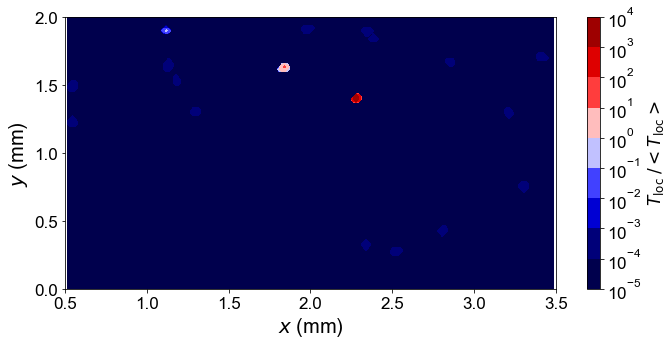


-----------------------------------------------------


Read granular temperature at 104


Reading particle info 104...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 104 successful

Read coordinate done


Interpolation done



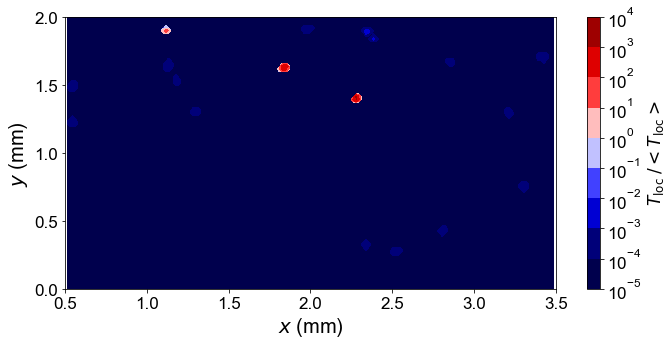


-----------------------------------------------------


Read granular temperature at 105


Reading particle info 105...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 105 successful

Read coordinate done


Interpolation done



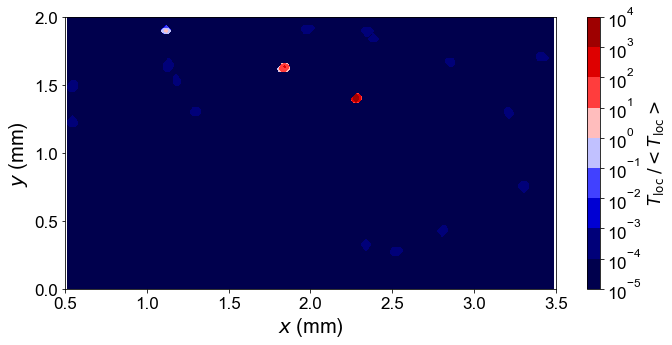


-----------------------------------------------------


Read granular temperature at 106


Reading particle info 106...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 106 successful

Read coordinate done


Interpolation done



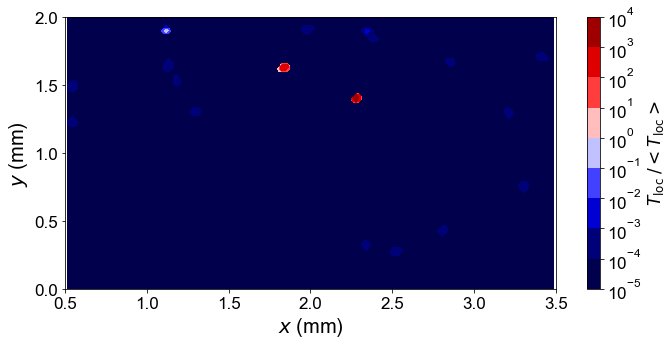


-----------------------------------------------------


Read granular temperature at 107


Reading particle info 107...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 107 successful

Read coordinate done


Interpolation done



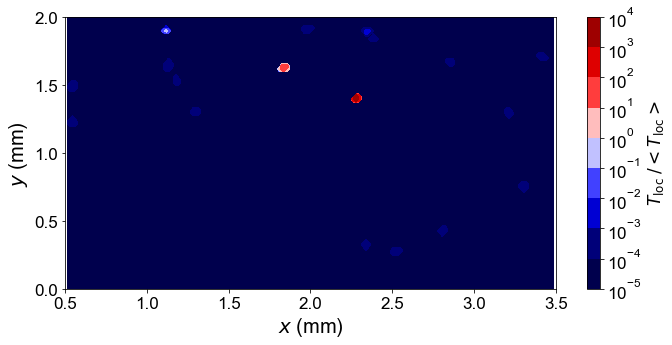


-----------------------------------------------------


Read granular temperature at 108


Reading particle info 108...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 108 successful

Read coordinate done


Interpolation done



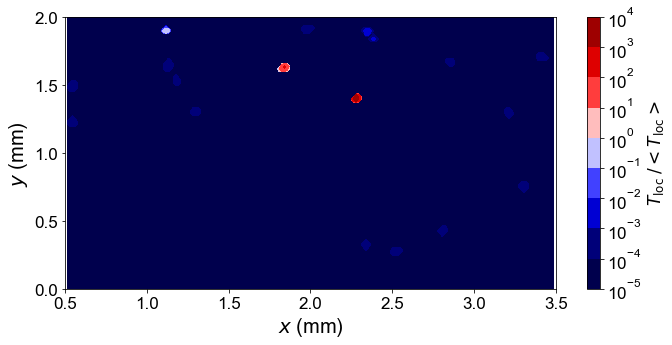


-----------------------------------------------------


Read granular temperature at 109


Reading particle info 109...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 109 successful

Read coordinate done


Interpolation done



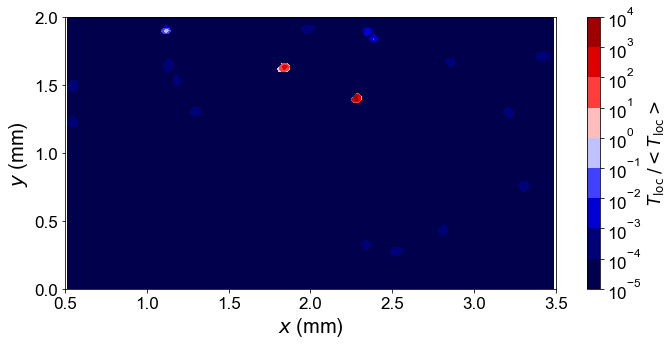


-----------------------------------------------------


Read granular temperature at 110


Reading particle info 110...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 110 successful

Read coordinate done


Interpolation done



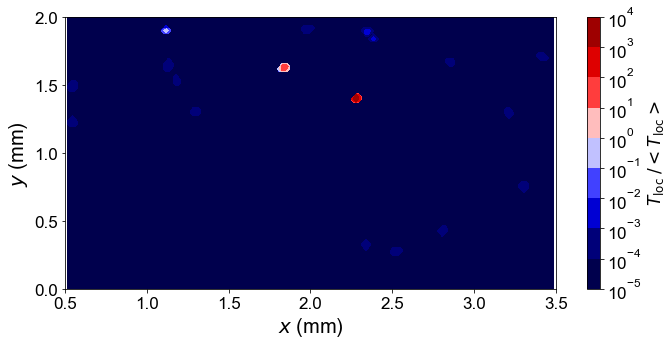


-----------------------------------------------------


Read granular temperature at 111


Reading particle info 111...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 111 successful

Read coordinate done


Interpolation done



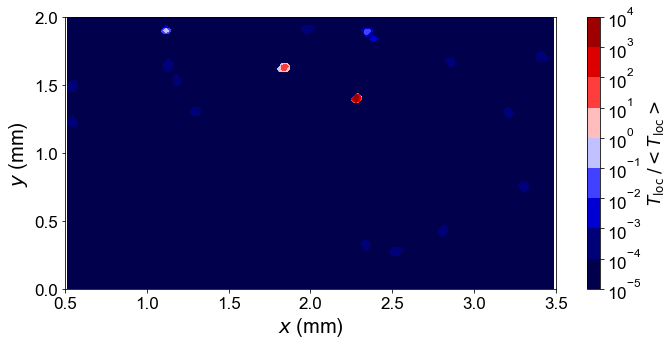


-----------------------------------------------------


Read granular temperature at 112


Reading particle info 112...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 112 successful

Read coordinate done


Interpolation done



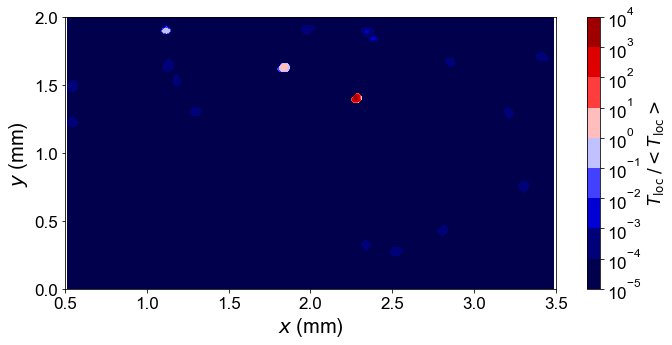


-----------------------------------------------------


Read granular temperature at 113


Reading particle info 113...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 113 successful

Read coordinate done


Interpolation done



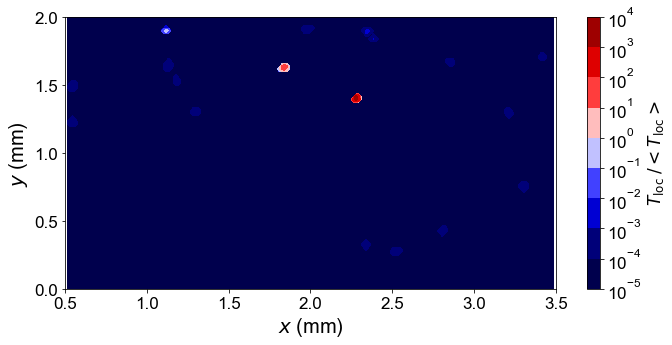


-----------------------------------------------------


Read granular temperature at 114


Reading particle info 114...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 114 successful

Read coordinate done


Interpolation done



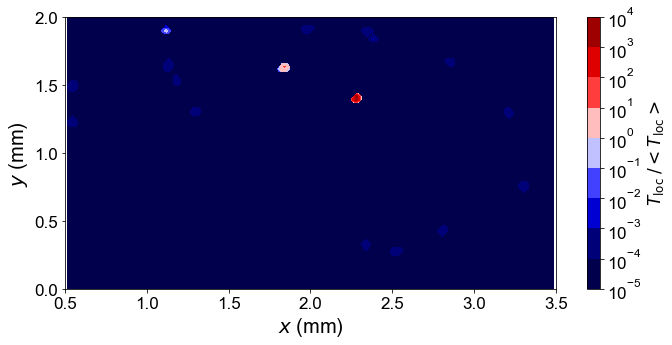


-----------------------------------------------------


Read granular temperature at 115


Reading particle info 115...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 115 successful

Read coordinate done


Interpolation done



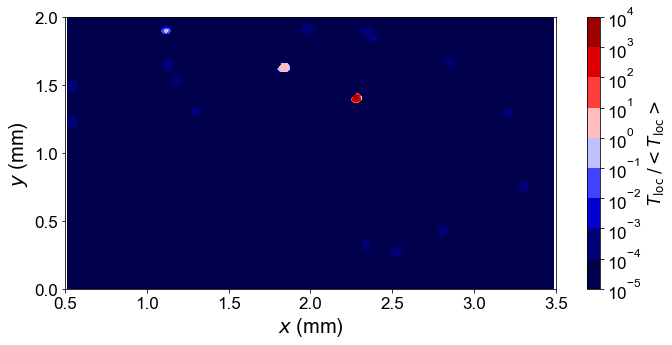


-----------------------------------------------------


Read granular temperature at 116


Reading particle info 116...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 116 successful

Read coordinate done


Interpolation done



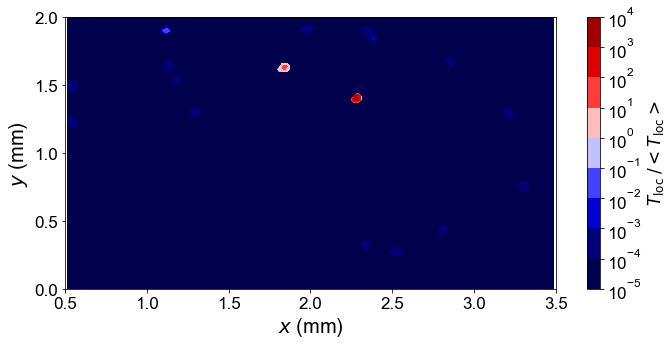


-----------------------------------------------------


Read granular temperature at 117


Reading particle info 117...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 117 successful

Read coordinate done


Interpolation done



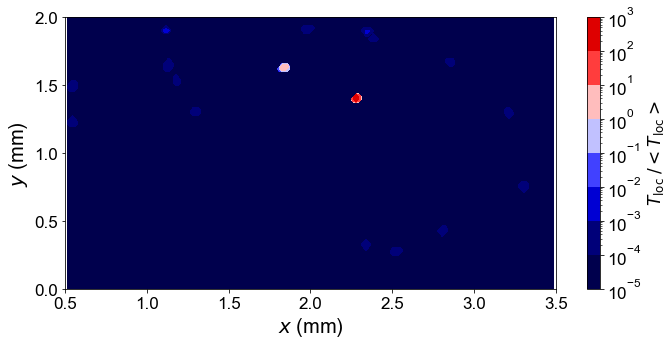


-----------------------------------------------------


Read granular temperature at 118


Reading particle info 118...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 118 successful

Read coordinate done


Interpolation done



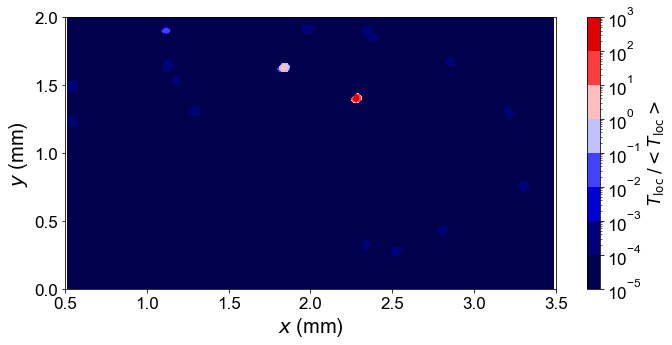


-----------------------------------------------------


Read granular temperature at 119


Reading particle info 119...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 119 successful

Read coordinate done


Interpolation done



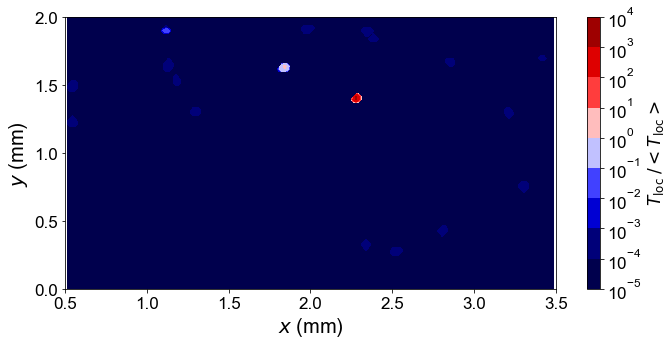


-----------------------------------------------------


Read granular temperature at 120


Reading particle info 120...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 120 successful

Read coordinate done


Interpolation done



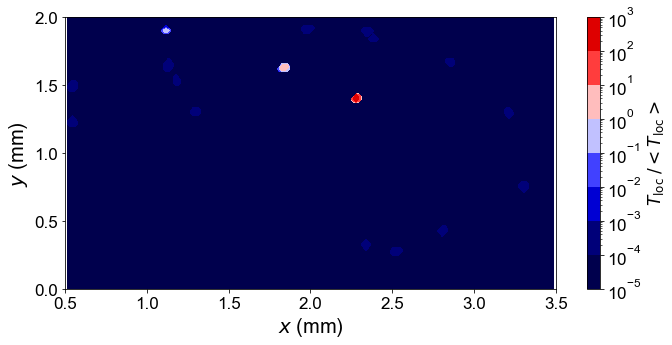


-----------------------------------------------------


Read granular temperature at 121


Reading particle info 121...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 121 successful

Read coordinate done


Interpolation done



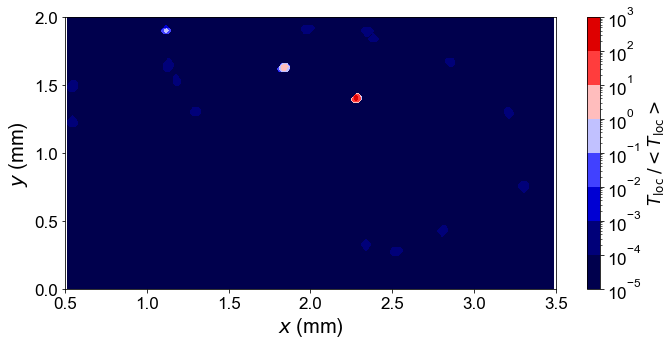


-----------------------------------------------------


Read granular temperature at 122


Reading particle info 122...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 122 successful

Read coordinate done


Interpolation done



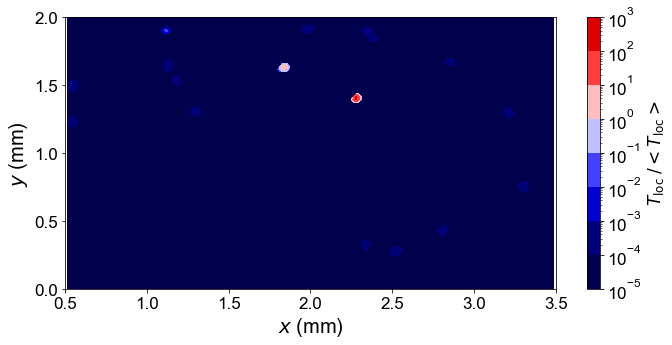


-----------------------------------------------------


Read granular temperature at 123


Reading particle info 123...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 123 successful

Read coordinate done


Interpolation done



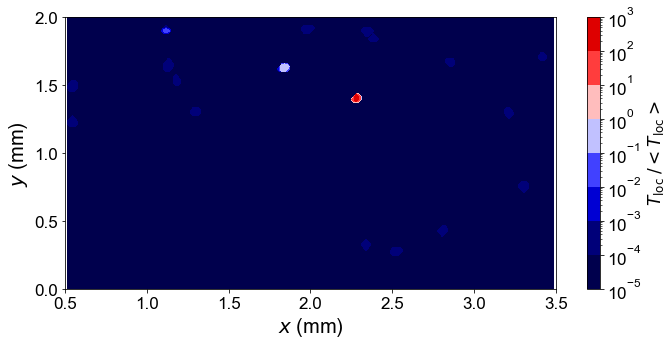


-----------------------------------------------------


Read granular temperature at 124


Reading particle info 124...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 124 successful

Read coordinate done


Interpolation done



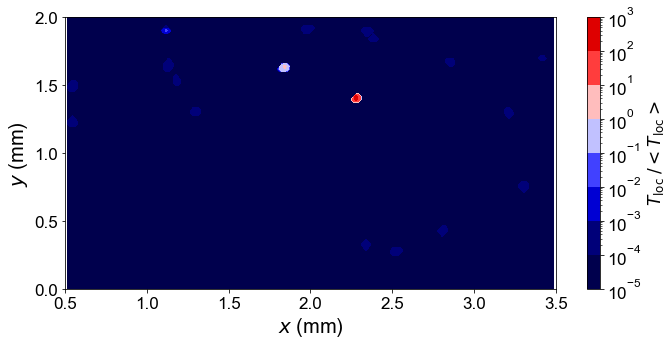


-----------------------------------------------------


Read granular temperature at 125


Reading particle info 125...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 125 successful

Read coordinate done


Interpolation done



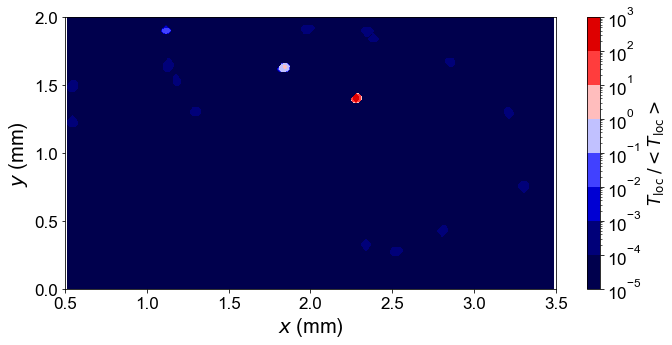


-----------------------------------------------------


Read granular temperature at 126


Reading particle info 126...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 126 successful

Read coordinate done


Interpolation done



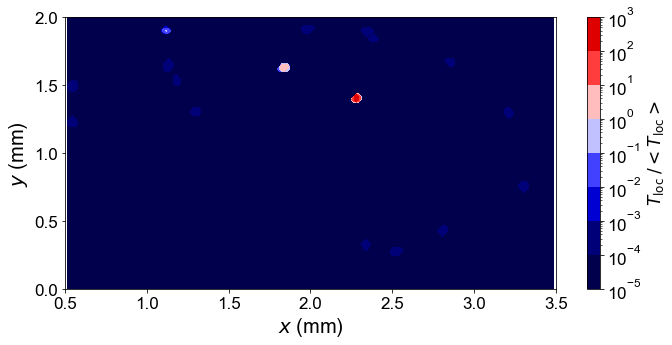


-----------------------------------------------------


Read granular temperature at 127


Reading particle info 127...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 127 successful

Read coordinate done


Interpolation done



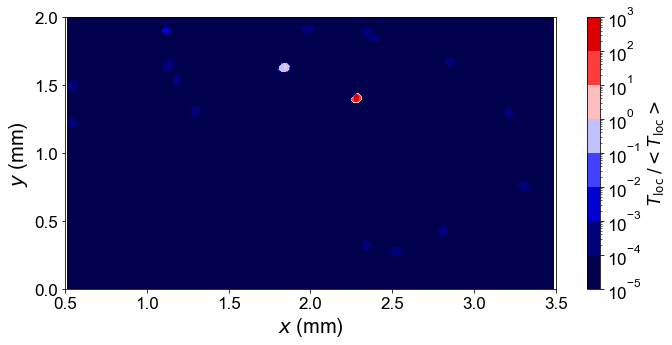


-----------------------------------------------------


Read granular temperature at 128


Reading particle info 128...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 128 successful

Read coordinate done


Interpolation done



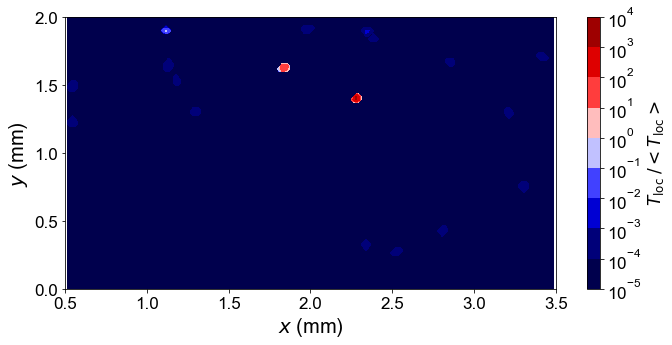


-----------------------------------------------------


Read granular temperature at 129


Reading particle info 129...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 129 successful

Read coordinate done


Interpolation done



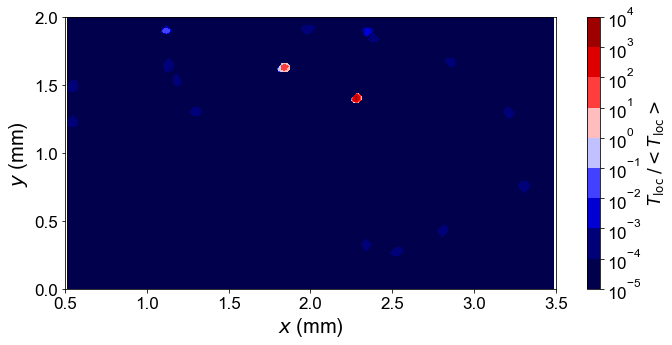


-----------------------------------------------------


Read granular temperature at 130


Reading particle info 130...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 130 successful

Read coordinate done


Interpolation done



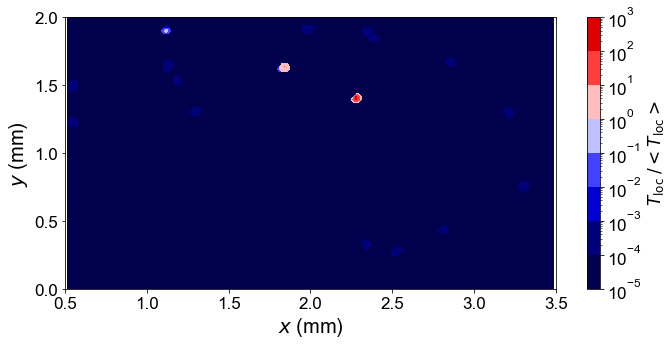


-----------------------------------------------------


Read granular temperature at 131


Reading particle info 131...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 131 successful

Read coordinate done


Interpolation done



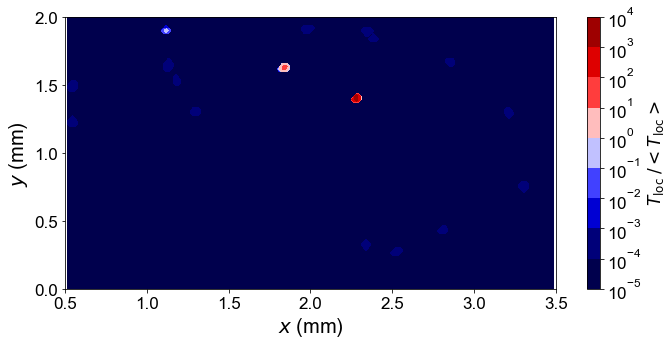


-----------------------------------------------------


Read granular temperature at 132


Reading particle info 132...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 132 successful

Read coordinate done


Interpolation done



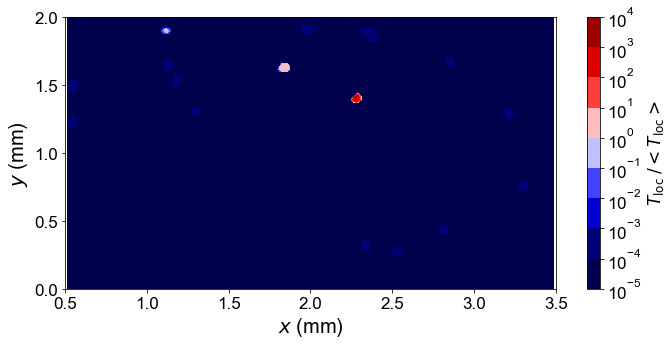


-----------------------------------------------------


Read granular temperature at 133


Reading particle info 133...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 133 successful

Read coordinate done


Interpolation done



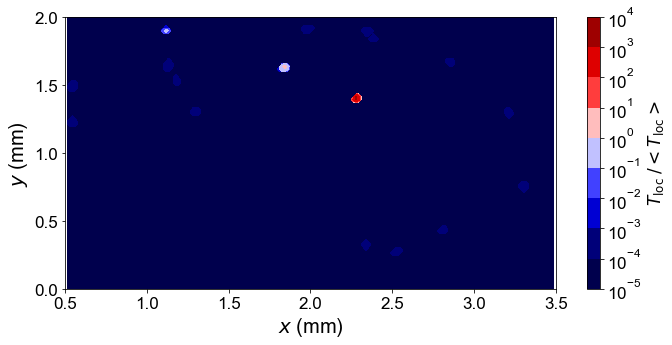


-----------------------------------------------------


Read granular temperature at 134


Reading particle info 134...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 134 successful

Read coordinate done


Interpolation done



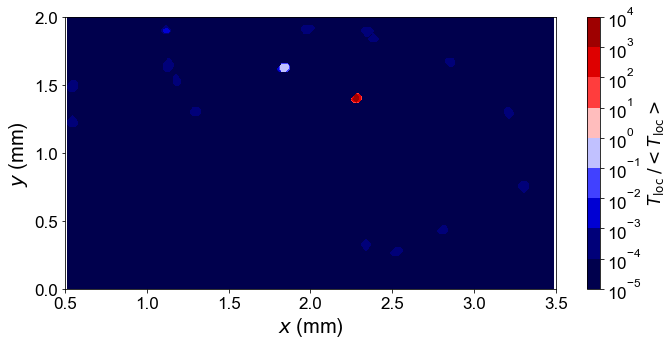


-----------------------------------------------------


Read granular temperature at 135


Reading particle info 135...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 135 successful

Read coordinate done


Interpolation done



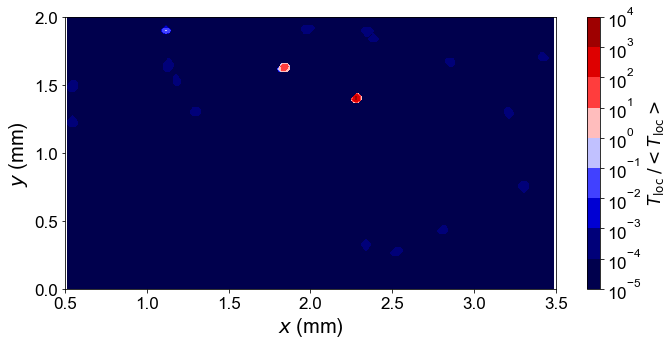


-----------------------------------------------------


Read granular temperature at 136


Reading particle info 136...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 136 successful

Read coordinate done


Interpolation done



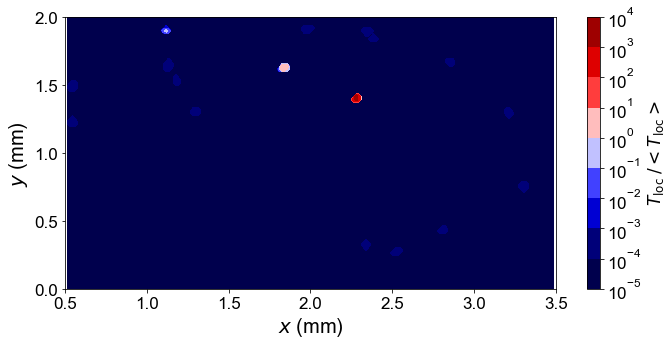


-----------------------------------------------------


Read granular temperature at 137


Reading particle info 137...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 137 successful

Read coordinate done


Interpolation done



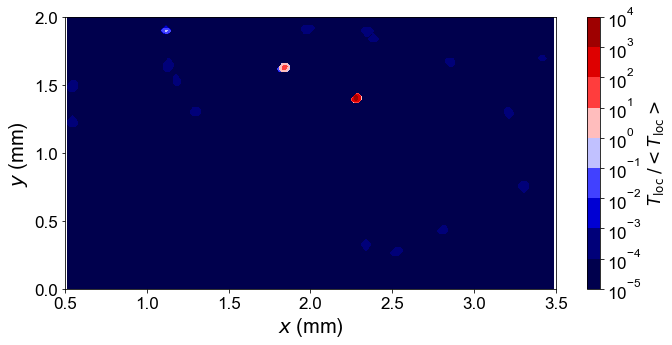


-----------------------------------------------------


Read granular temperature at 138


Reading particle info 138...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 138 successful

Read coordinate done


Interpolation done



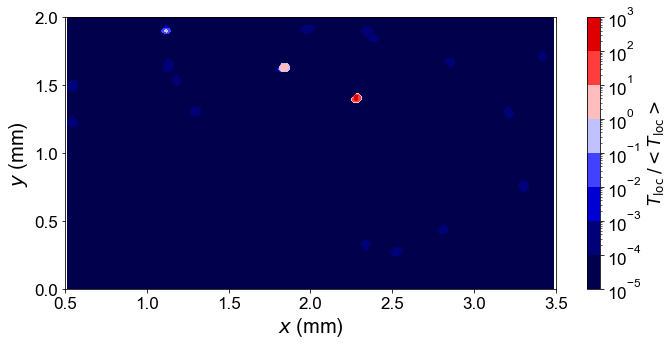


-----------------------------------------------------


Read granular temperature at 139


Reading particle info 139...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 139 successful

Read coordinate done


Interpolation done



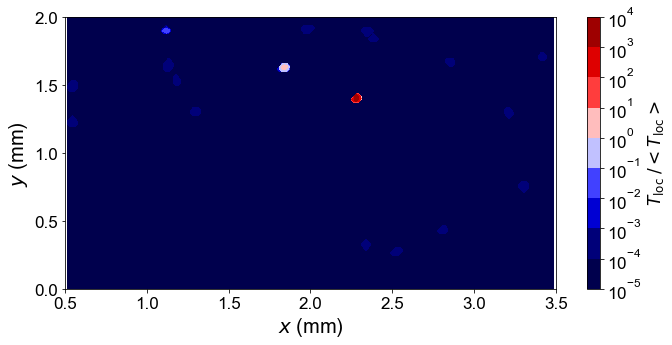


-----------------------------------------------------


Read granular temperature at 140


Reading particle info 140...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 140 successful

Read coordinate done


Interpolation done



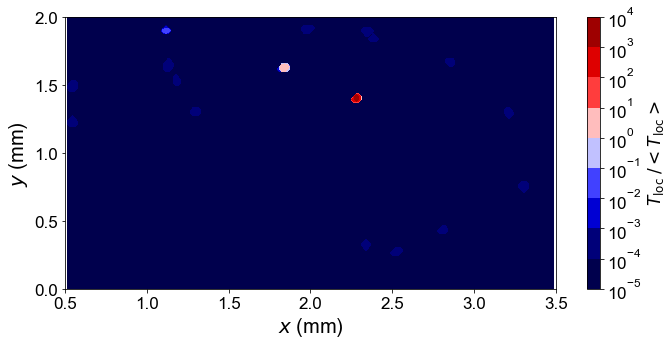


-----------------------------------------------------


Read granular temperature at 141


Reading particle info 141...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 141 successful

Read coordinate done


Interpolation done



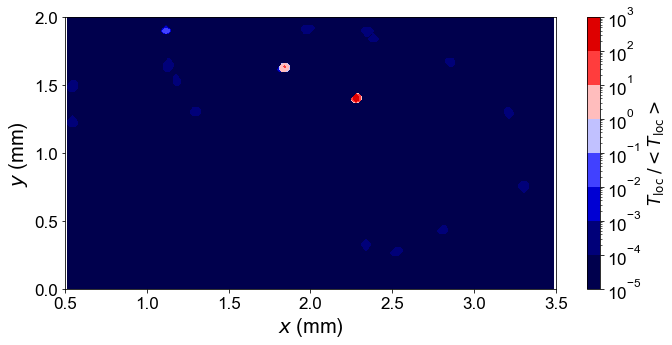


-----------------------------------------------------


Read granular temperature at 142


Reading particle info 142...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 142 successful

Read coordinate done


Interpolation done



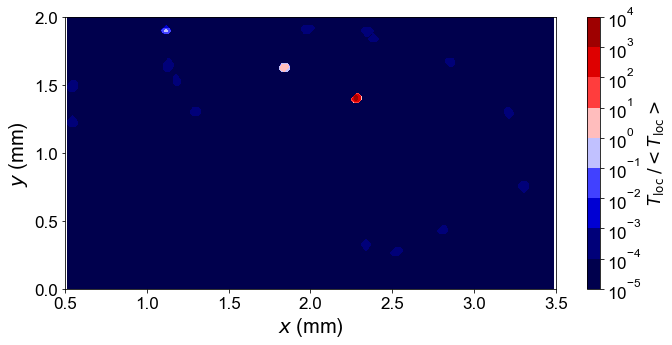


-----------------------------------------------------


Read granular temperature at 143


Reading particle info 143...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 143 successful

Read coordinate done


Interpolation done



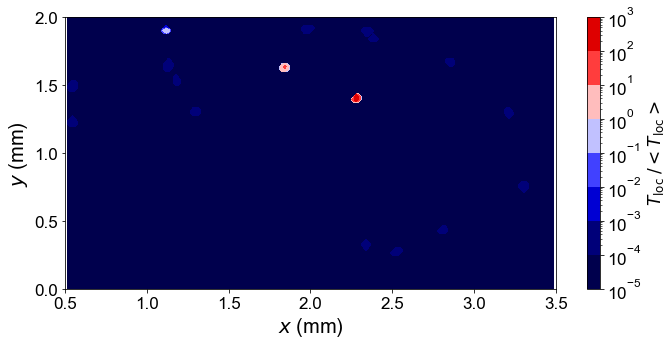


-----------------------------------------------------


Read granular temperature at 144


Reading particle info 144...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 144 successful

Read coordinate done


Interpolation done



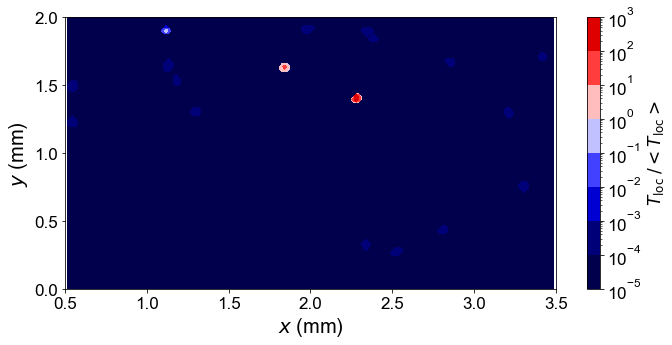


-----------------------------------------------------


Read granular temperature at 145


Reading particle info 145...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 145 successful

Read coordinate done


Interpolation done



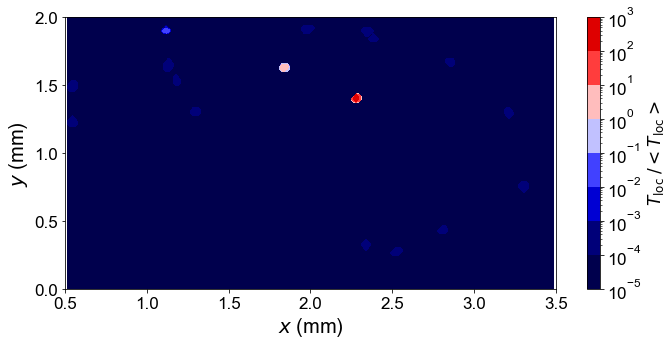


-----------------------------------------------------


Read granular temperature at 146


Reading particle info 146...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 146 successful

Read coordinate done


Interpolation done



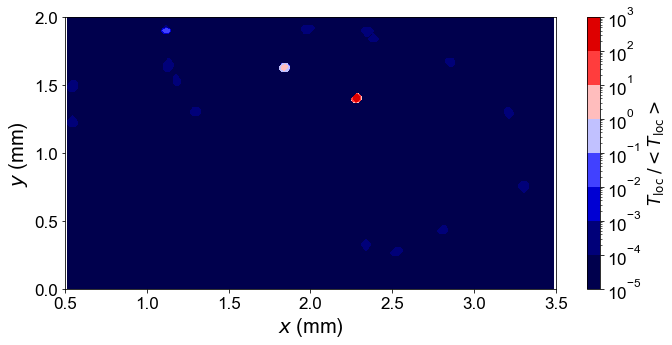


-----------------------------------------------------


Read granular temperature at 147


Reading particle info 147...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 147 successful

Read coordinate done


Interpolation done



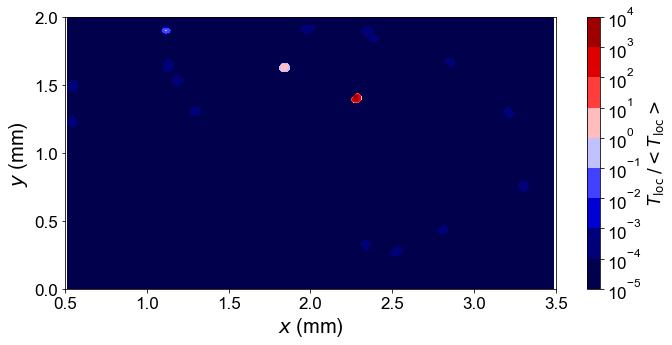


-----------------------------------------------------


Read granular temperature at 148


Reading particle info 148...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 148 successful

Read coordinate done


Interpolation done



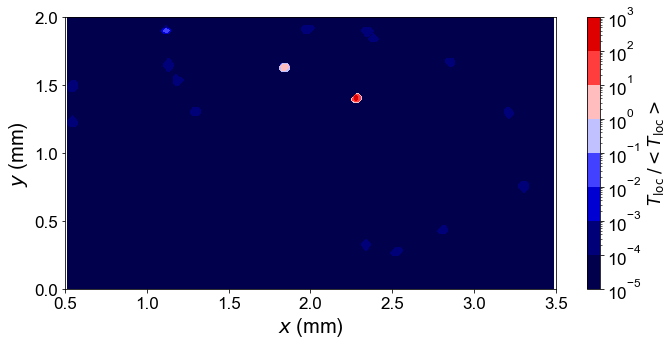


-----------------------------------------------------


Read granular temperature at 149


Reading particle info 149...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 149 successful

Read coordinate done


Interpolation done



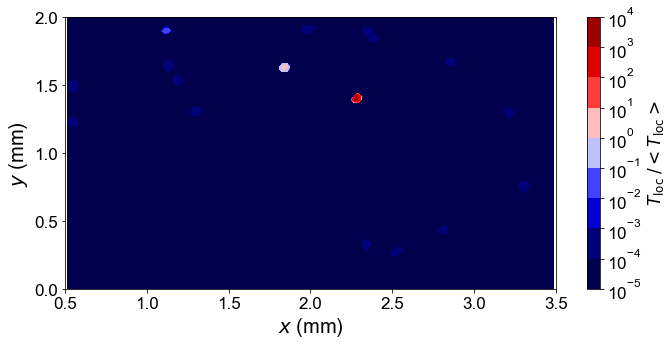


-----------------------------------------------------


Read granular temperature at 150


Reading particle info 150...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 150 successful

Read coordinate done


Interpolation done



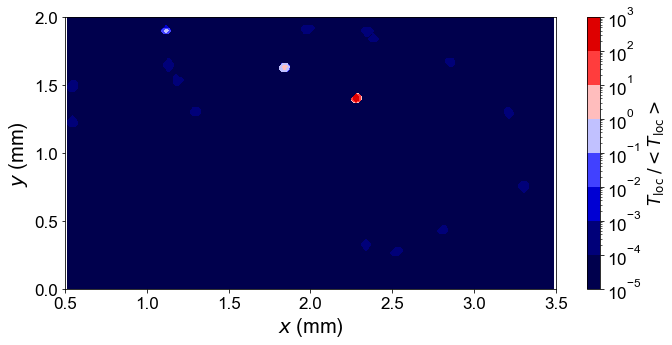


-----------------------------------------------------


Read granular temperature at 151


Reading particle info 151...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 151 successful

Read coordinate done


Interpolation done



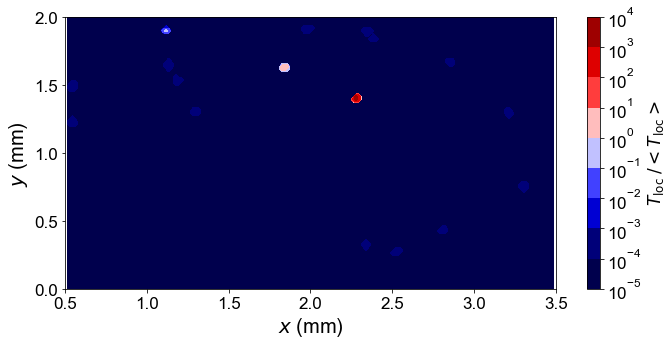


-----------------------------------------------------


Read granular temperature at 152


Reading particle info 152...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 152 successful

Read coordinate done


Interpolation done



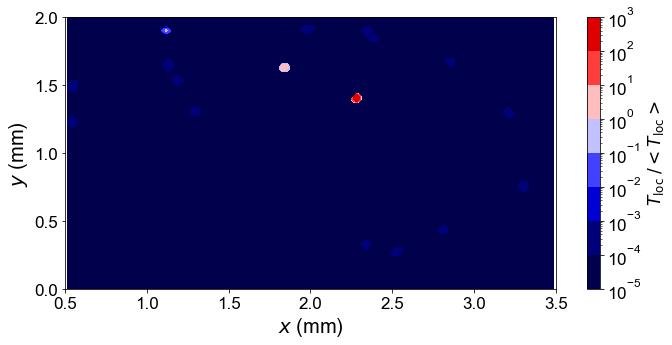


-----------------------------------------------------


Read granular temperature at 153


Reading particle info 153...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 153 successful

Read coordinate done


Interpolation done



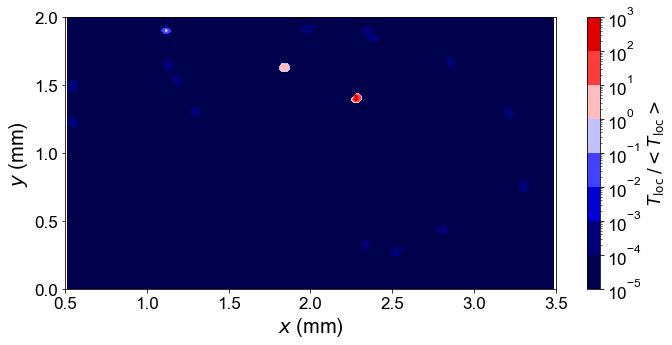


-----------------------------------------------------


Read granular temperature at 154


Reading particle info 154...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 154 successful

Read coordinate done


Interpolation done



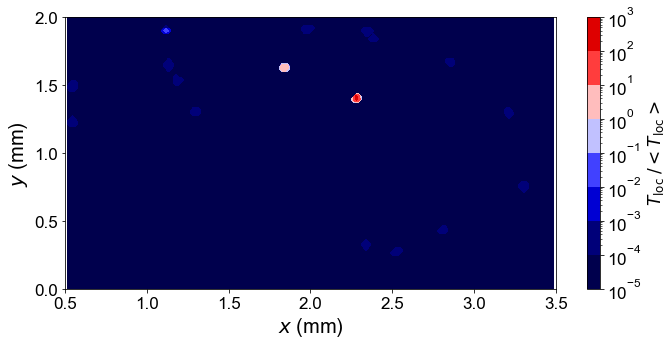


-----------------------------------------------------


Read granular temperature at 155


Reading particle info 155...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 155 successful

Read coordinate done


Interpolation done



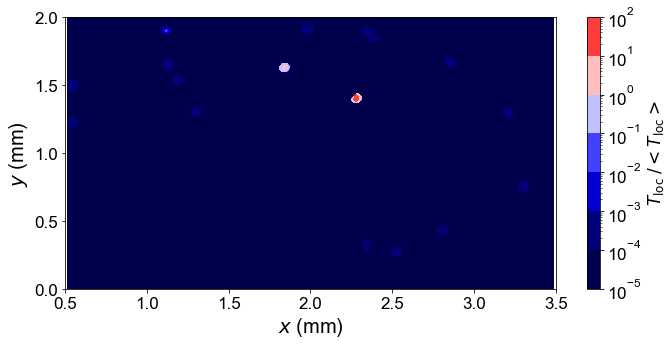


-----------------------------------------------------


Read granular temperature at 156


Reading particle info 156...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 156 successful

Read coordinate done


Interpolation done



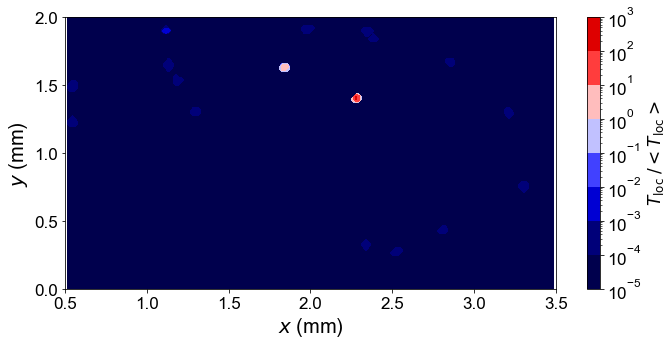


-----------------------------------------------------


Read granular temperature at 157


Reading particle info 157...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 157 successful

Read coordinate done


Interpolation done



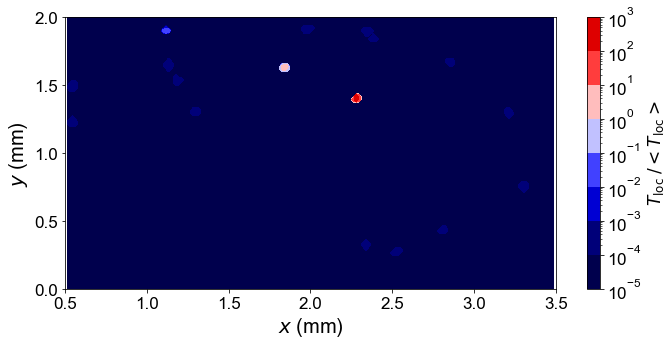


-----------------------------------------------------


Read granular temperature at 158


Reading particle info 158...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 158 successful

Read coordinate done


Interpolation done



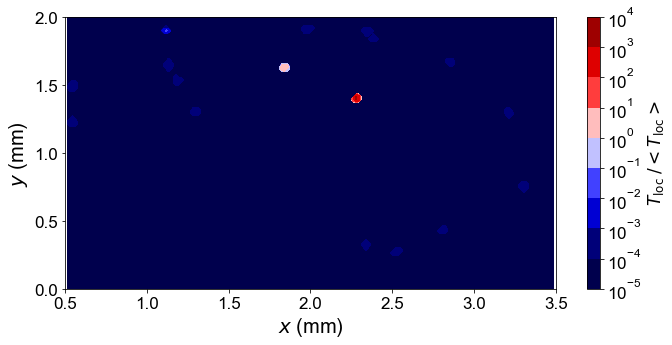


-----------------------------------------------------


Read granular temperature at 159


Reading particle info 159...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 159 successful

Read coordinate done


Interpolation done



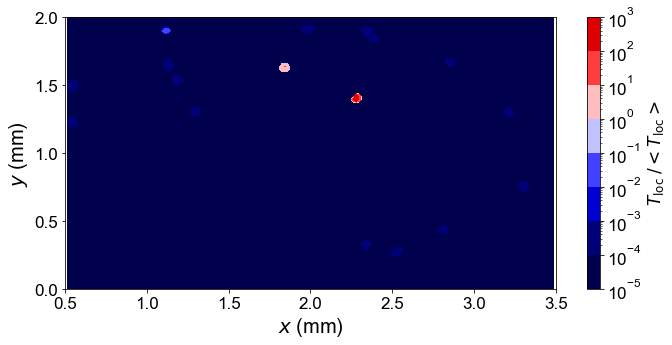


-----------------------------------------------------


Read granular temperature at 160


Reading particle info 160...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 160 successful

Read coordinate done


Interpolation done



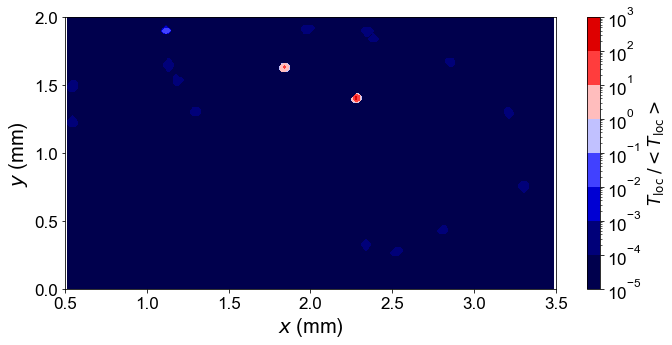


-----------------------------------------------------


Read granular temperature at 161


Reading particle info 161...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 161 successful

Read coordinate done


Interpolation done



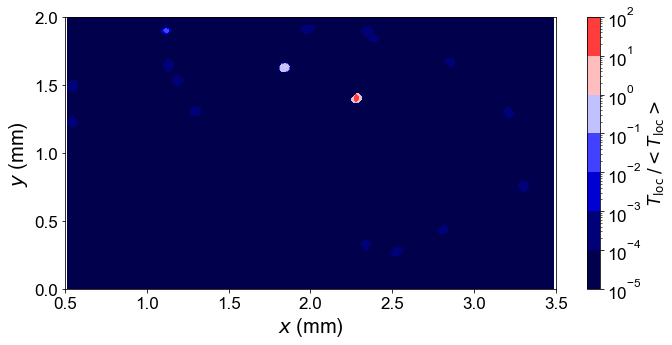


-----------------------------------------------------


Read granular temperature at 162


Reading particle info 162...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 162 successful

Read coordinate done


Interpolation done



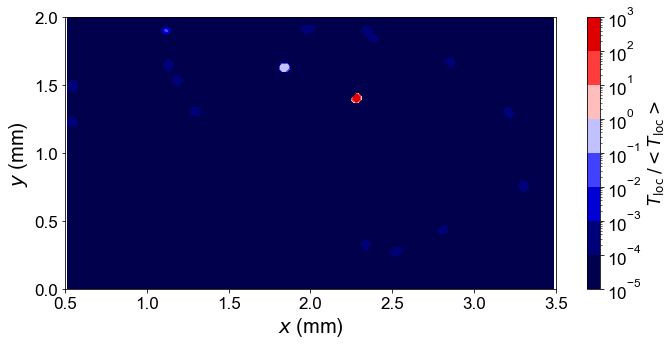


-----------------------------------------------------


Read granular temperature at 163


Reading particle info 163...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 163 successful

Read coordinate done


Interpolation done



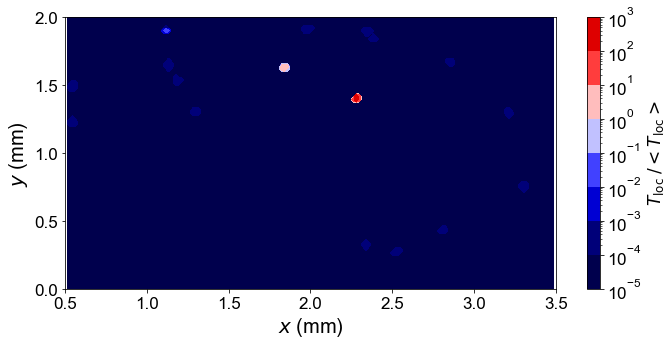


-----------------------------------------------------


Read granular temperature at 164


Reading particle info 164...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 164 successful

Read coordinate done


Interpolation done



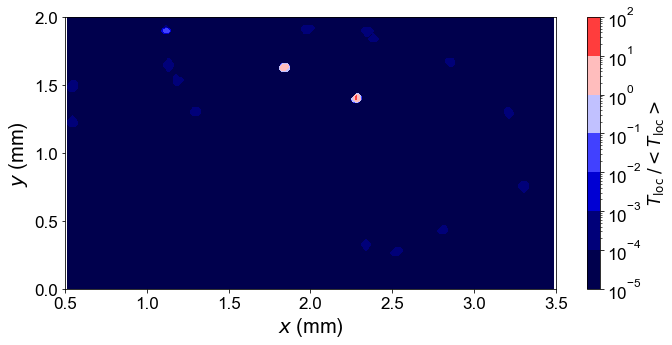


-----------------------------------------------------


Read granular temperature at 165


Reading particle info 165...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 165 successful

Read coordinate done


Interpolation done



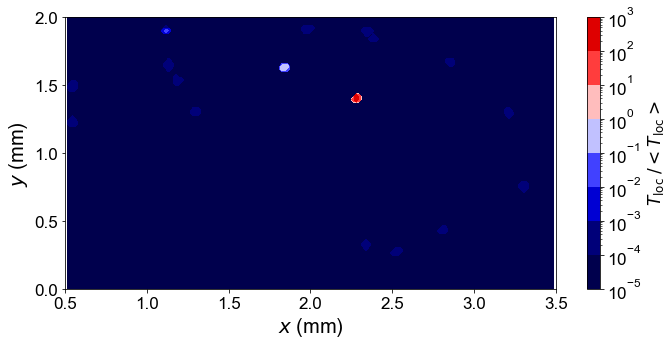


-----------------------------------------------------


Read granular temperature at 166


Reading particle info 166...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 166 successful

Read coordinate done


Interpolation done



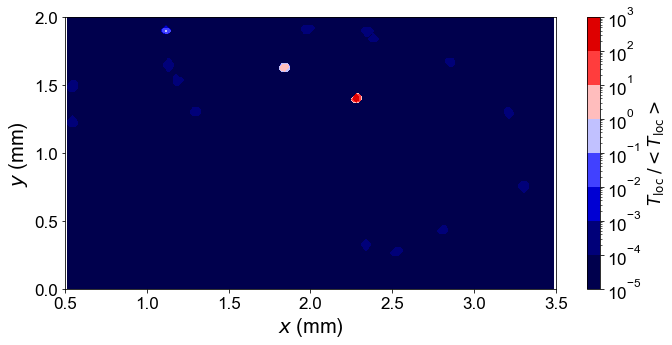


-----------------------------------------------------


Read granular temperature at 167


Reading particle info 167...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 167 successful

Read coordinate done


Interpolation done



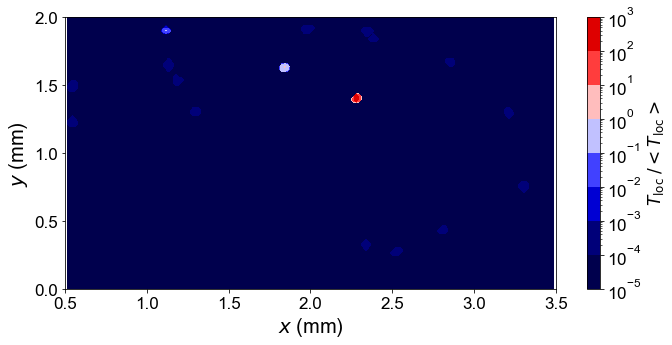


-----------------------------------------------------


Read granular temperature at 168


Reading particle info 168...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 168 successful

Read coordinate done


Interpolation done



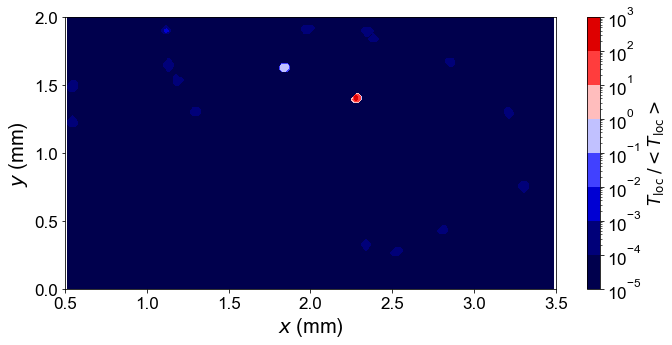


-----------------------------------------------------


Read granular temperature at 169


Reading particle info 169...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 169 successful

Read coordinate done


Interpolation done



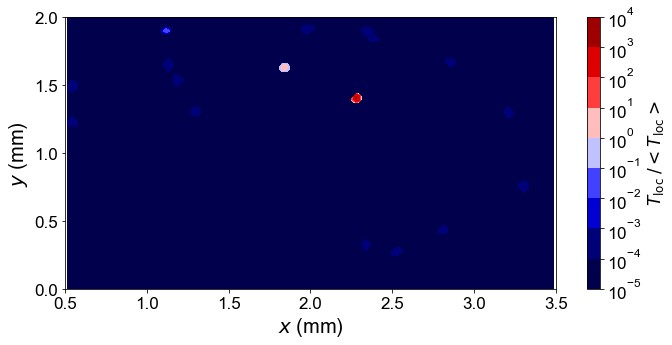


-----------------------------------------------------


Read granular temperature at 170


Reading particle info 170...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 170 successful

Read coordinate done


Interpolation done



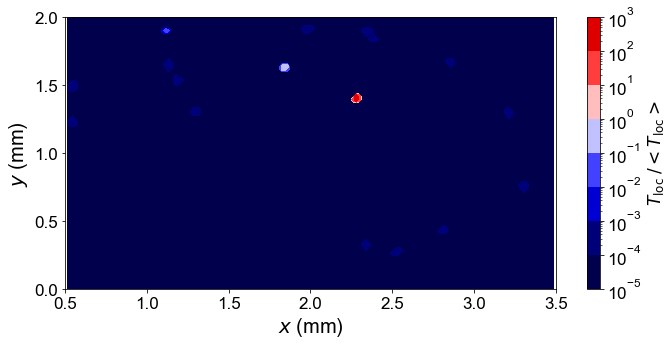


-----------------------------------------------------


Read granular temperature at 171


Reading particle info 171...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 171 successful

Read coordinate done


Interpolation done



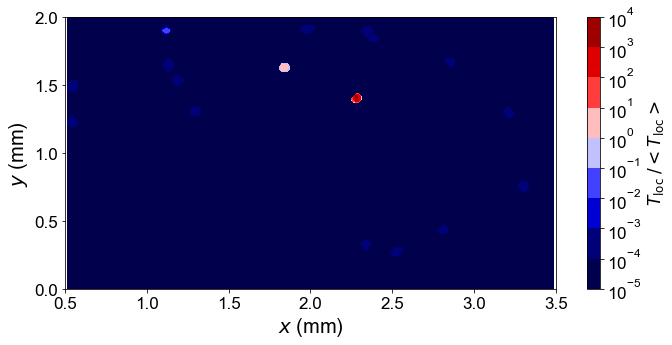


-----------------------------------------------------


Read granular temperature at 172


Reading particle info 172...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 172 successful

Read coordinate done


Interpolation done



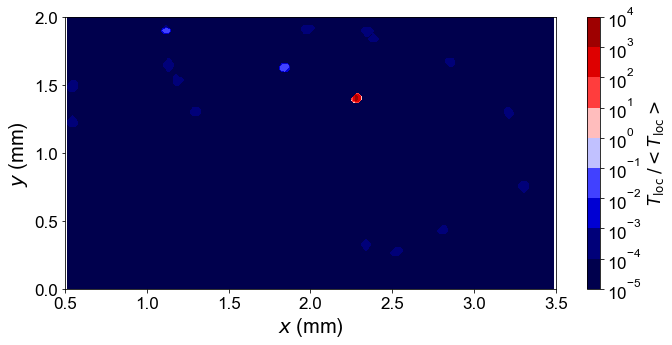


-----------------------------------------------------


Read granular temperature at 173


Reading particle info 173...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 173 successful

Read coordinate done


Interpolation done



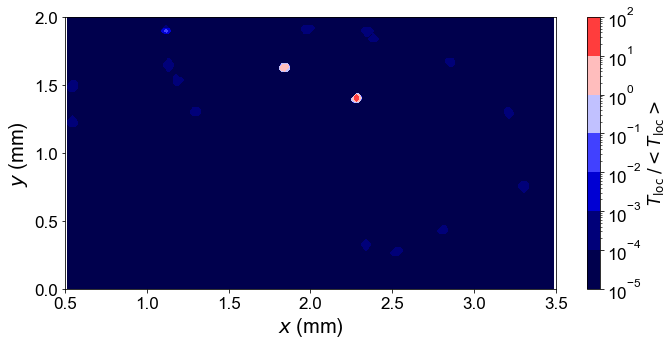


-----------------------------------------------------


Read granular temperature at 174


Reading particle info 174...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 174 successful

Read coordinate done


Interpolation done



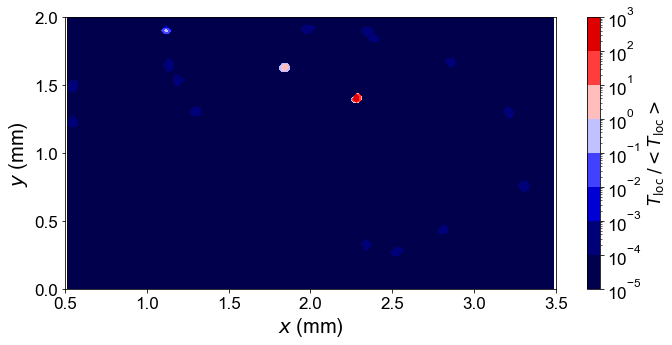


-----------------------------------------------------


Read granular temperature at 175


Reading particle info 175...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 175 successful

Read coordinate done


Interpolation done



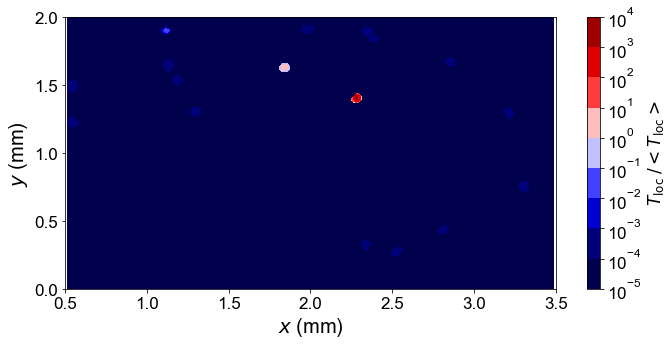


-----------------------------------------------------


Read granular temperature at 176


Reading particle info 176...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 176 successful

Read coordinate done


Interpolation done



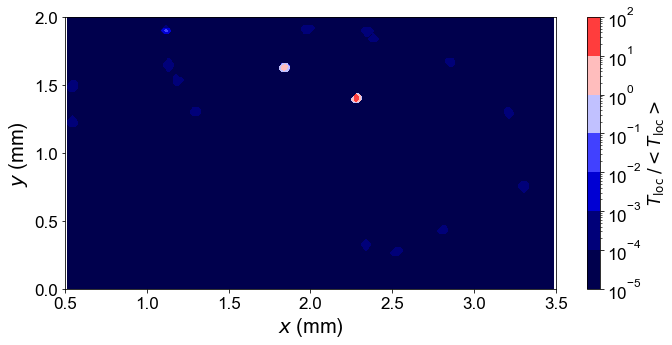


-----------------------------------------------------


Read granular temperature at 177


Reading particle info 177...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 177 successful

Read coordinate done


Interpolation done



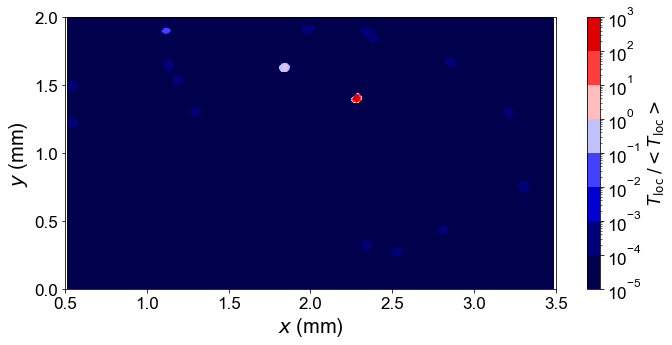


-----------------------------------------------------


Read granular temperature at 178


Reading particle info 178...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 178 successful

Read coordinate done


Interpolation done



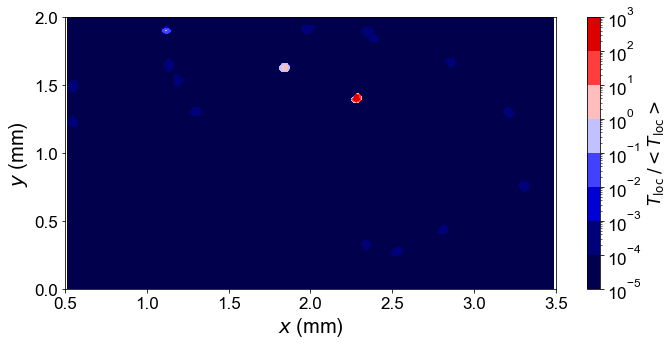


-----------------------------------------------------


Read granular temperature at 179


Reading particle info 179...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 179 successful

Read coordinate done


Interpolation done



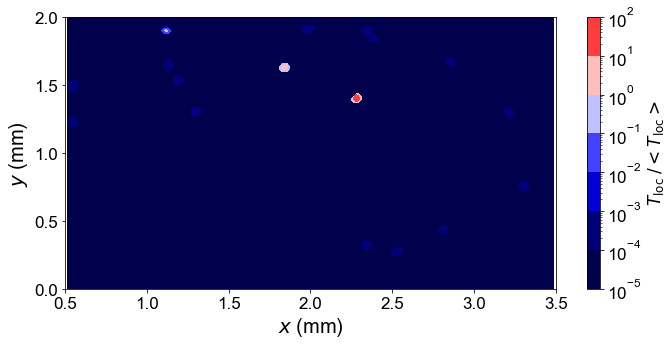


-----------------------------------------------------


Read granular temperature at 180


Reading particle info 180...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 180 successful

Read coordinate done


Interpolation done



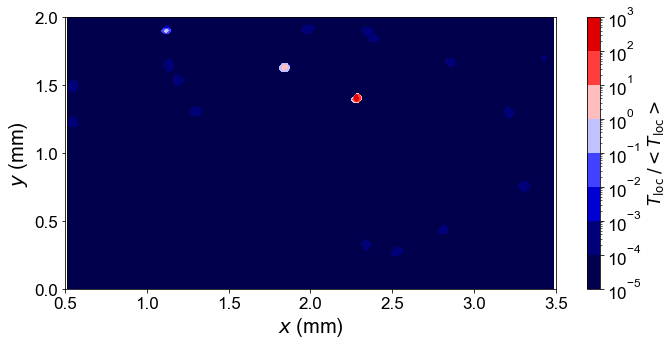


-----------------------------------------------------


Read granular temperature at 181


Reading particle info 181...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 181 successful

Read coordinate done


Interpolation done



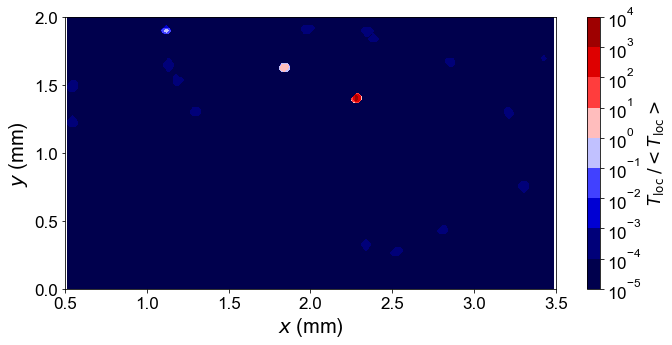


-----------------------------------------------------


Read granular temperature at 182


Reading particle info 182...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 182 successful

Read coordinate done


Interpolation done



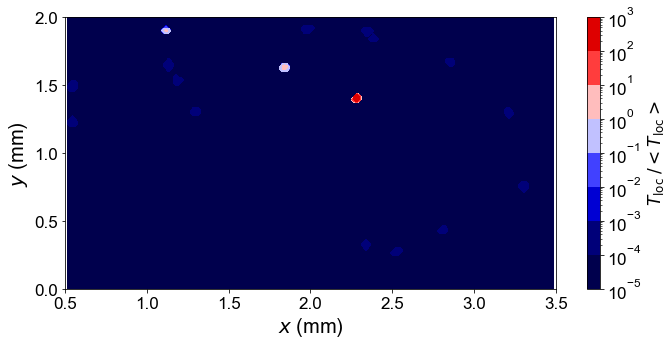


-----------------------------------------------------


Read granular temperature at 183


Reading particle info 183...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 183 successful

Read coordinate done


Interpolation done



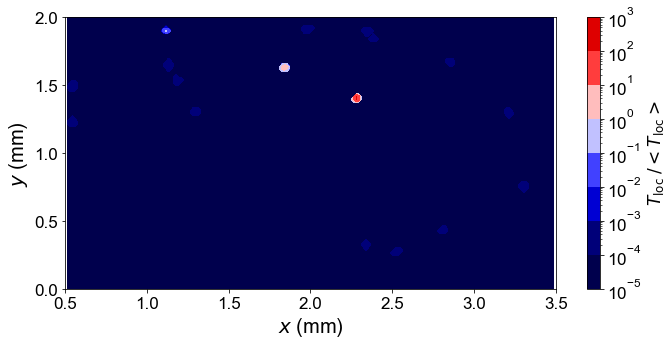


-----------------------------------------------------


Read granular temperature at 184


Reading particle info 184...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 184 successful

Read coordinate done


Interpolation done



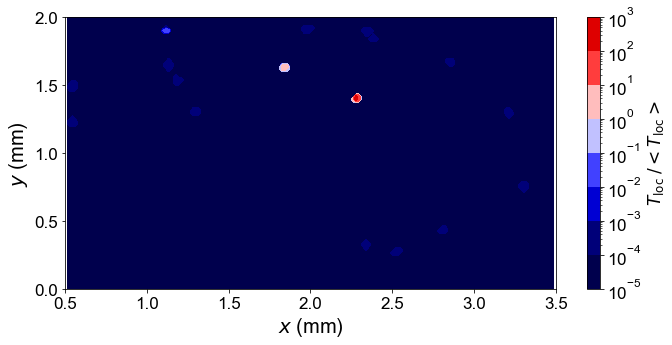


-----------------------------------------------------


Read granular temperature at 185


Reading particle info 185...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 185 successful

Read coordinate done


Interpolation done



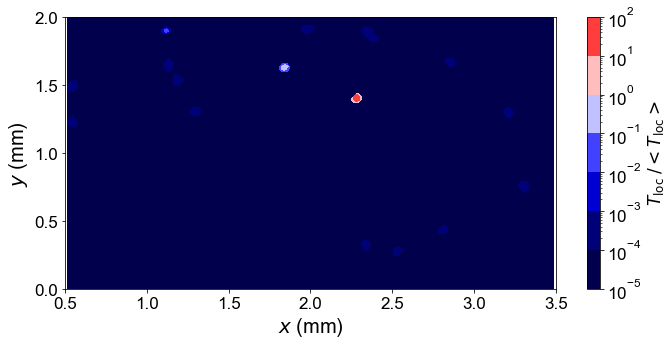


-----------------------------------------------------


Read granular temperature at 186


Reading particle info 186...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 186 successful

Read coordinate done


Interpolation done



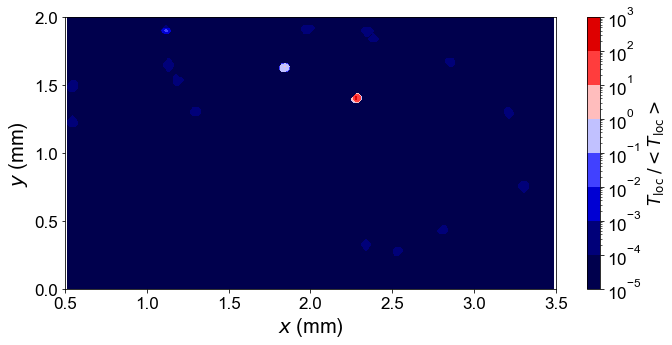


-----------------------------------------------------


Read granular temperature at 187


Reading particle info 187...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 187 successful

Read coordinate done


Interpolation done



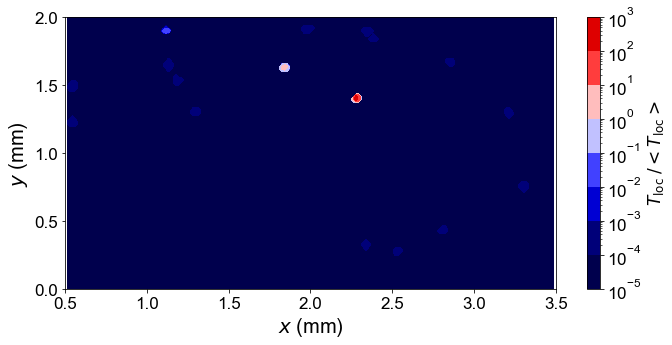


-----------------------------------------------------


Read granular temperature at 188


Reading particle info 188...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 188 successful

Read coordinate done


Interpolation done



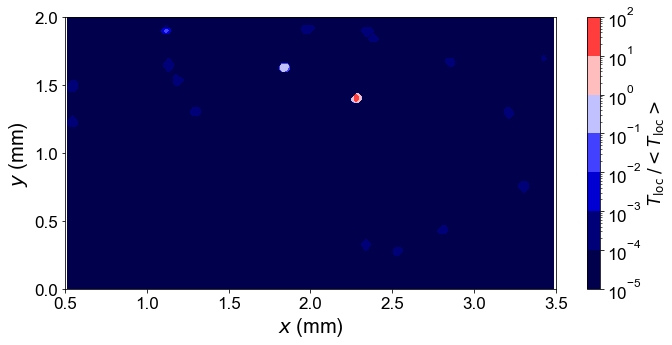


-----------------------------------------------------


Read granular temperature at 189


Reading particle info 189...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 189 successful

Read coordinate done


Interpolation done



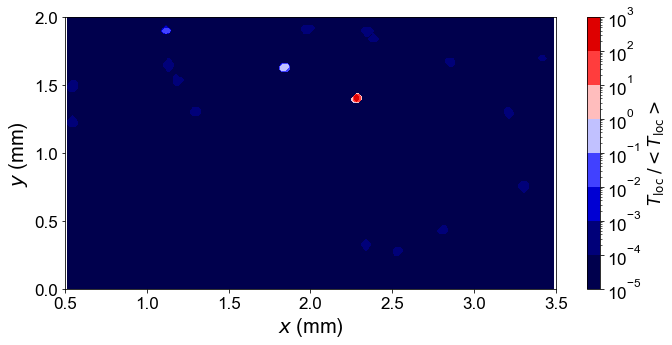


-----------------------------------------------------


Read granular temperature at 190


Reading particle info 190...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 190 successful

Read coordinate done


Interpolation done



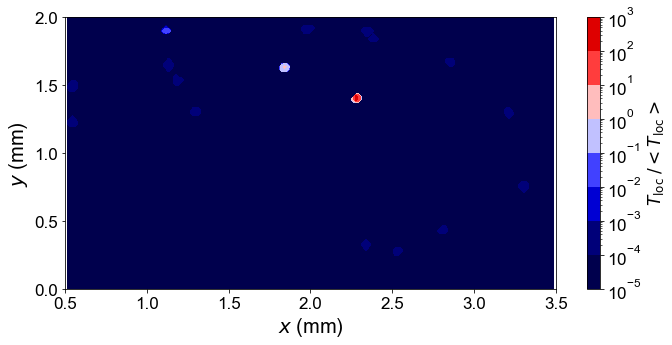


-----------------------------------------------------


Read granular temperature at 191


Reading particle info 191...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 191 successful

Read coordinate done


Interpolation done



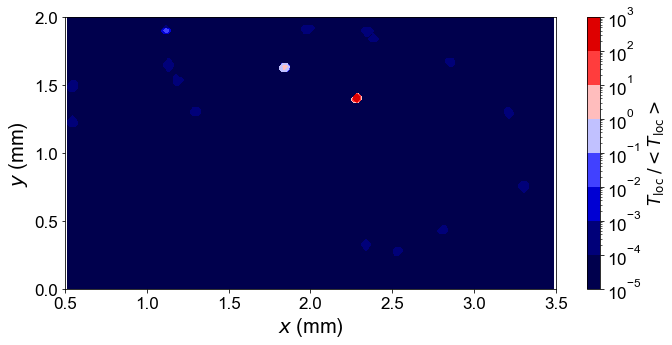


-----------------------------------------------------


Read granular temperature at 192


Reading particle info 192...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 192 successful

Read coordinate done


Interpolation done



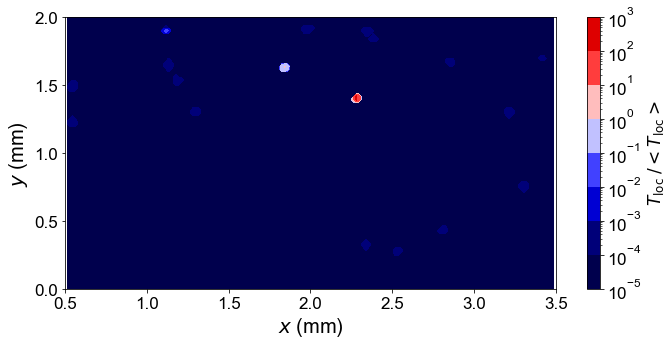


-----------------------------------------------------


Read granular temperature at 193


Reading particle info 193...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 193 successful

Read coordinate done


Interpolation done



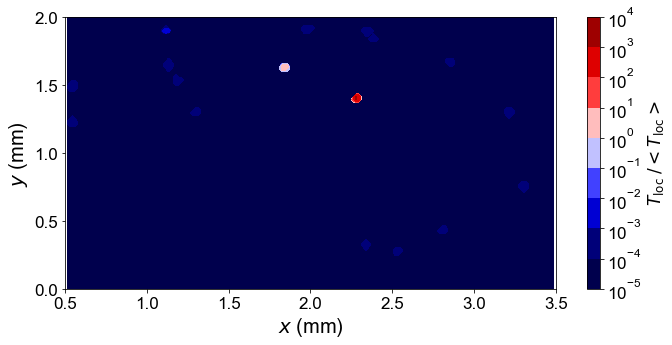


-----------------------------------------------------


Read granular temperature at 194


Reading particle info 194...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 194 successful

Read coordinate done


Interpolation done



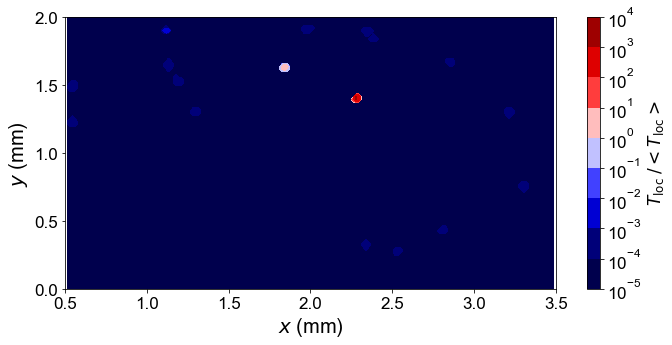


-----------------------------------------------------


Read granular temperature at 195


Reading particle info 195...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 195 successful

Read coordinate done


Interpolation done



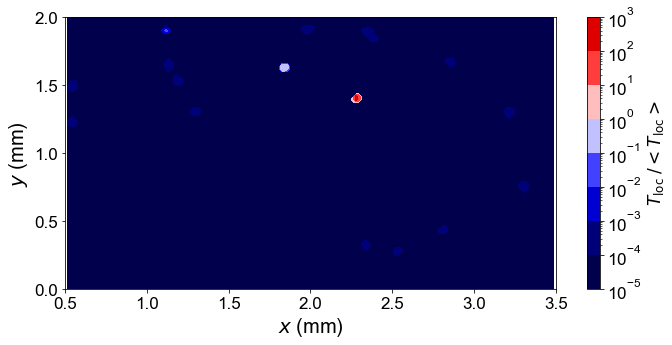


-----------------------------------------------------


Read granular temperature at 196


Reading particle info 196...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 196 successful

Read coordinate done


Interpolation done



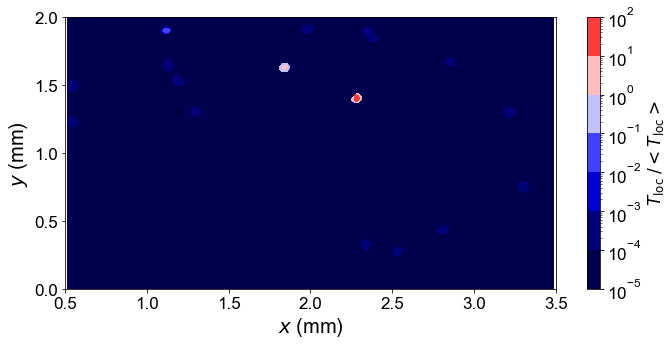


-----------------------------------------------------


Read granular temperature at 197


Reading particle info 197...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 197 successful

Read coordinate done


Interpolation done



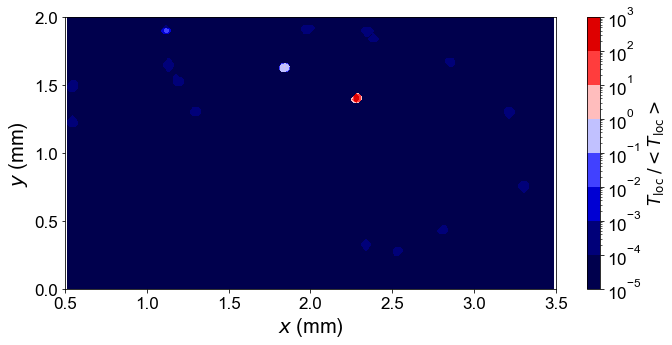


-----------------------------------------------------


Read granular temperature at 198


Reading particle info 198...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 198 successful

Read coordinate done


Interpolation done



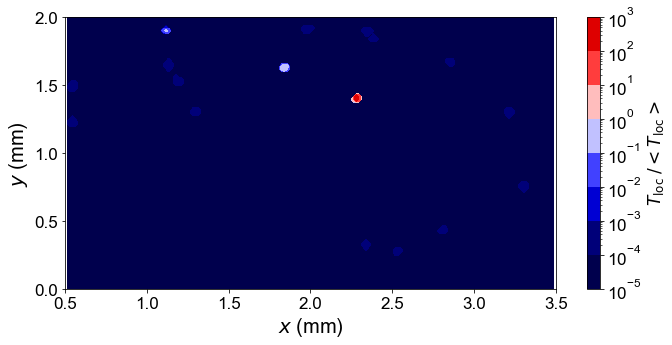


-----------------------------------------------------


Read granular temperature at 199


Reading particle info 199...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 199 successful

Read coordinate done


Interpolation done



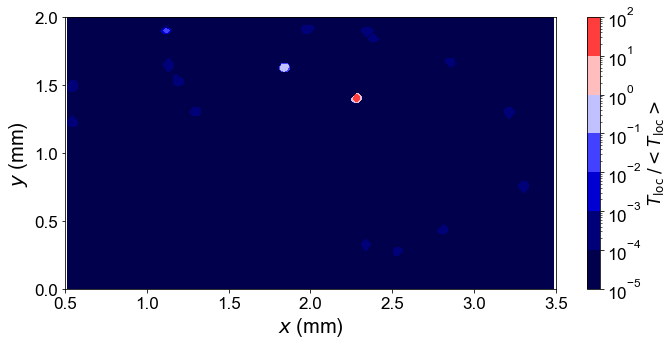


-----------------------------------------------------


Read granular temperature at 200


Reading particle info 200...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 200 successful

Read coordinate done


Interpolation done



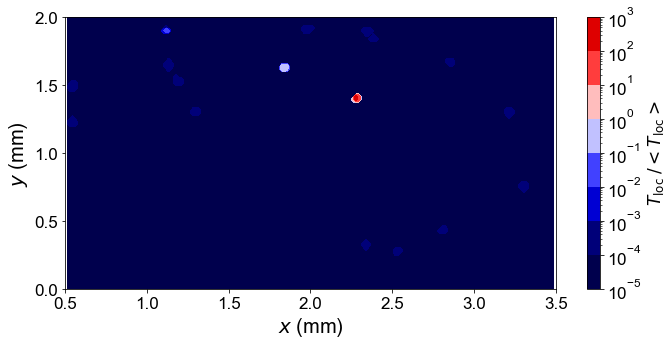


-----------------------------------------------------


Read granular temperature at 201


Reading particle info 201...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 201 successful

Read coordinate done


Interpolation done



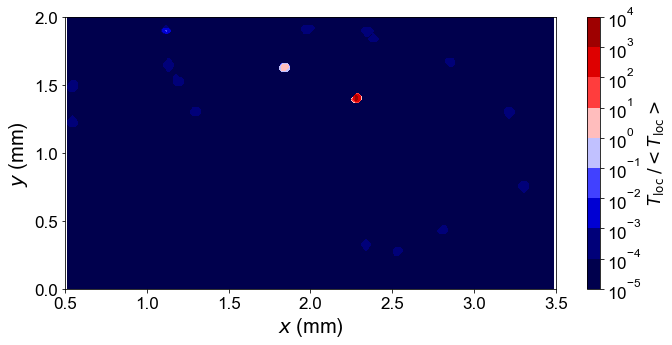


-----------------------------------------------------


Read granular temperature at 202


Reading particle info 202...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 202 successful

Read coordinate done


Interpolation done



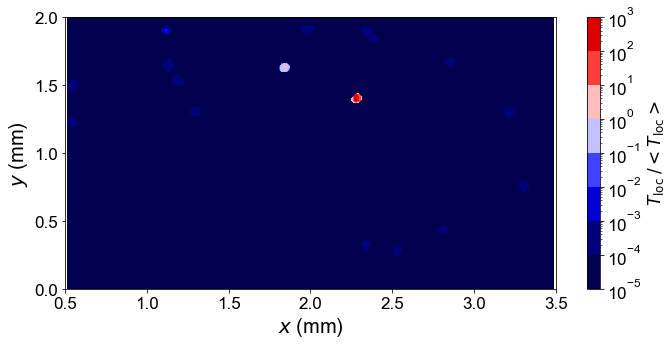


-----------------------------------------------------


Read granular temperature at 203


Reading particle info 203...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 203 successful

Read coordinate done


Interpolation done



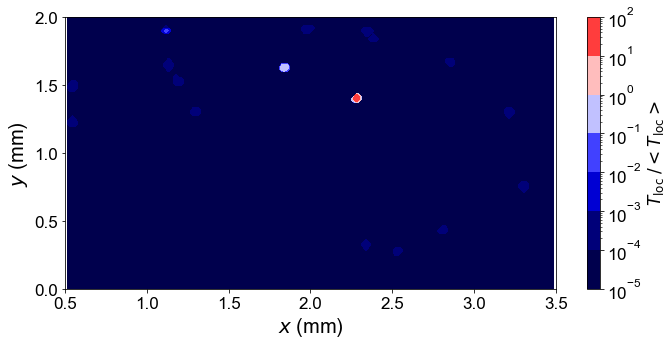


-----------------------------------------------------


Read granular temperature at 204


Reading particle info 204...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 204 successful

Read coordinate done


Interpolation done



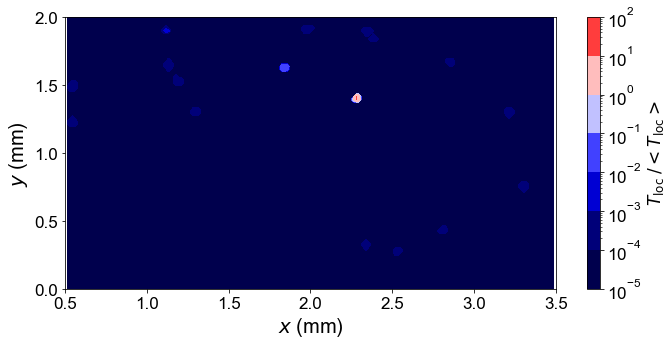


-----------------------------------------------------


Read granular temperature at 205


Reading particle info 205...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 205 successful

Read coordinate done


Interpolation done



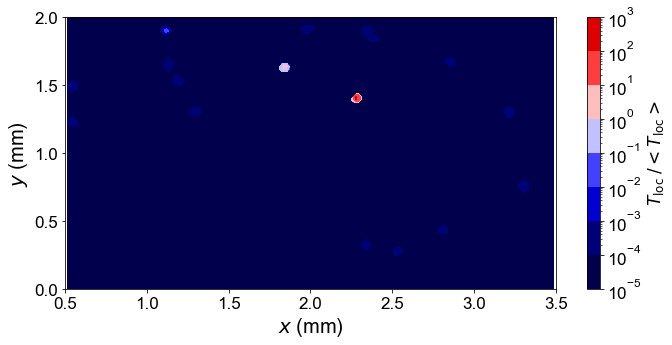


-----------------------------------------------------


Read granular temperature at 206


Reading particle info 206...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 206 successful

Read coordinate done


Interpolation done



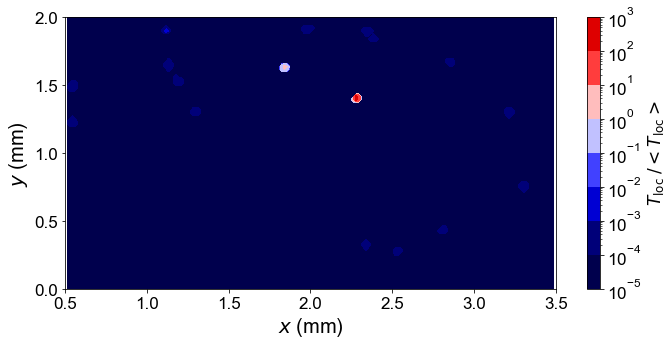


-----------------------------------------------------


Read granular temperature at 207


Reading particle info 207...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 207 successful

Read coordinate done


Interpolation done



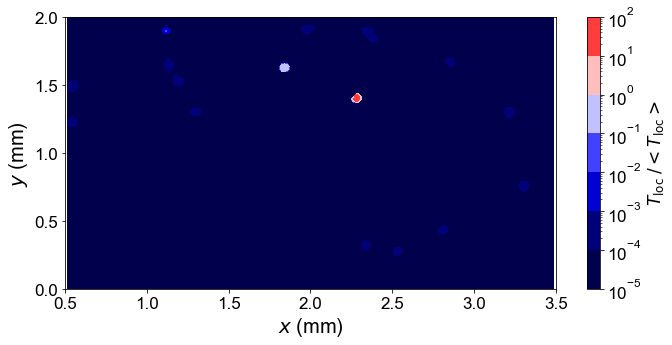


-----------------------------------------------------


Read granular temperature at 208


Reading particle info 208...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 208 successful

Read coordinate done


Interpolation done



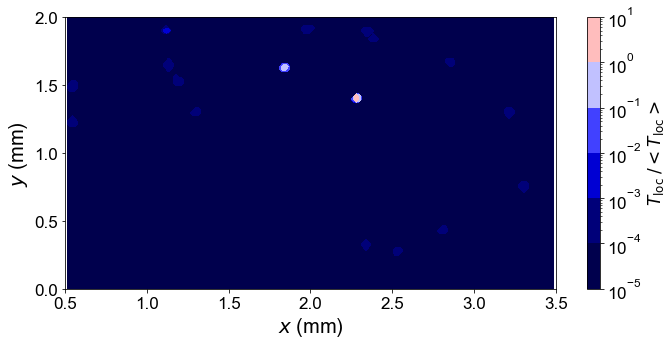


-----------------------------------------------------


Read granular temperature at 209


Reading particle info 209...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 209 successful

Read coordinate done


Interpolation done



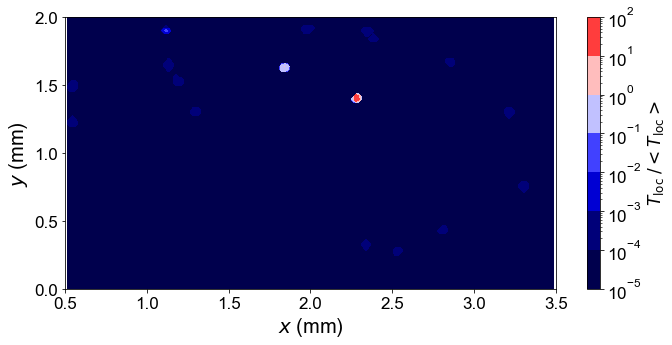


-----------------------------------------------------


Read granular temperature at 210


Reading particle info 210...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 210 successful

Read coordinate done


Interpolation done



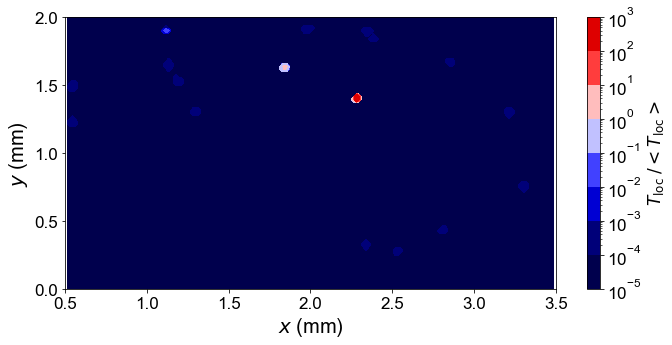


-----------------------------------------------------


Read granular temperature at 211


Reading particle info 211...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 211 successful

Read coordinate done


Interpolation done



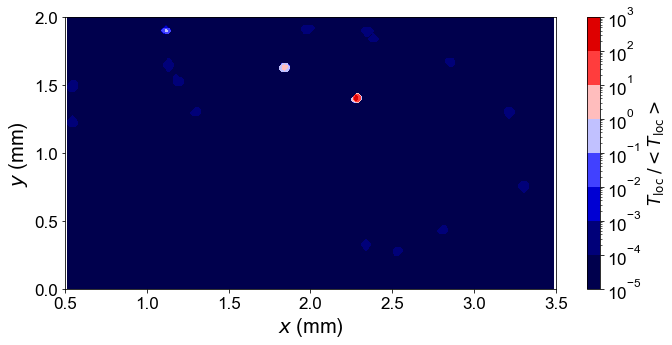


-----------------------------------------------------


Read granular temperature at 212


Reading particle info 212...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 212 successful

Read coordinate done


Interpolation done



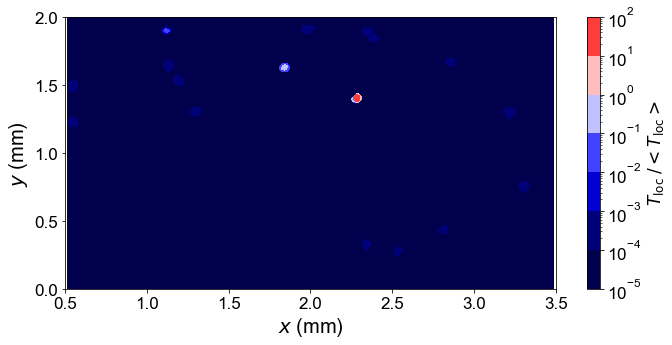


-----------------------------------------------------


Read granular temperature at 213


Reading particle info 213...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 213 successful

Read coordinate done


Interpolation done



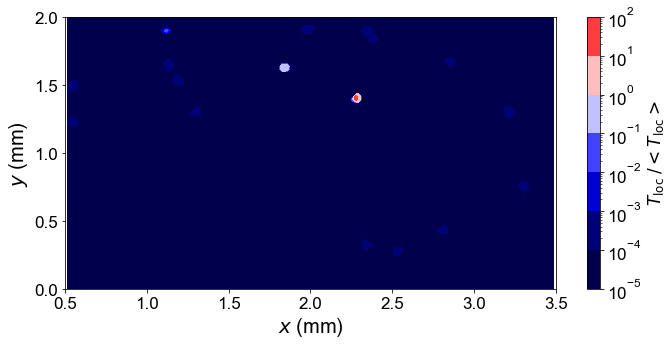


-----------------------------------------------------


Read granular temperature at 214


Reading particle info 214...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 214 successful

Read coordinate done


Interpolation done



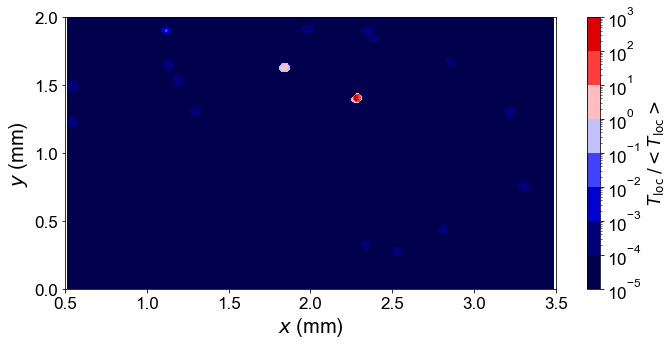


-----------------------------------------------------


Read granular temperature at 215


Reading particle info 215...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 215 successful

Read coordinate done


Interpolation done



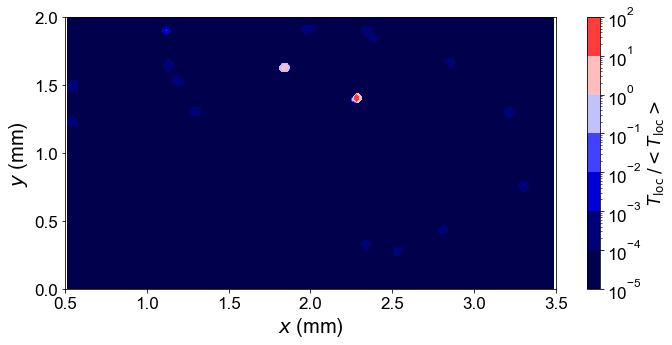


-----------------------------------------------------


Read granular temperature at 216


Reading particle info 216...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 216 successful

Read coordinate done


Interpolation done



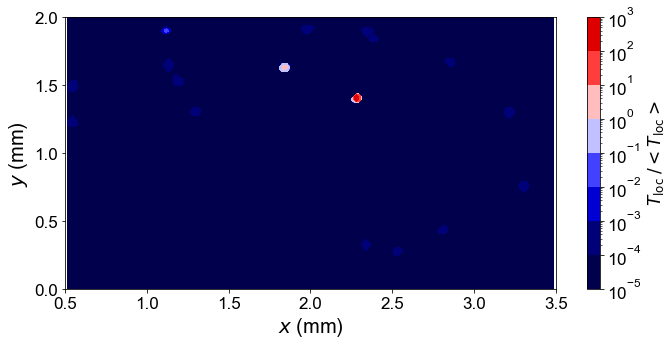


-----------------------------------------------------


Read granular temperature at 217


Reading particle info 217...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 217 successful

Read coordinate done


Interpolation done



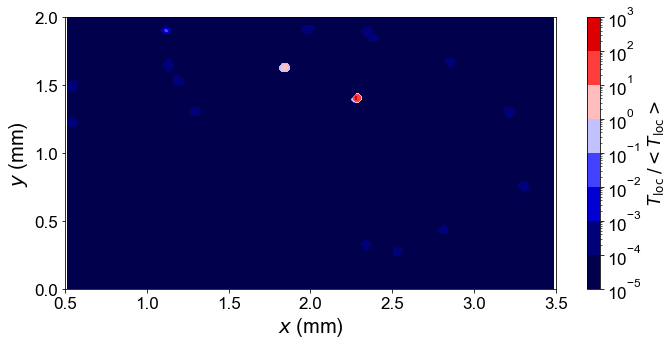


-----------------------------------------------------


Read granular temperature at 218


Reading particle info 218...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 218 successful

Read coordinate done


Interpolation done



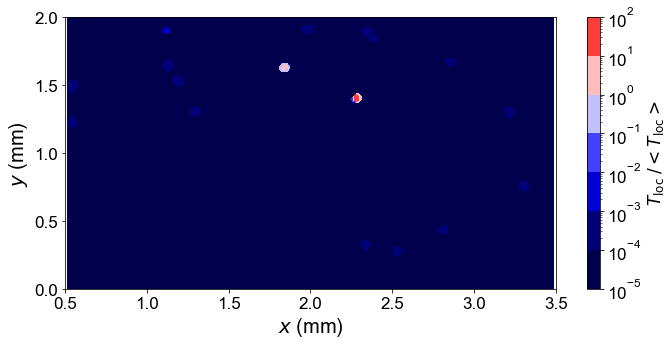


-----------------------------------------------------


Read granular temperature at 219


Reading particle info 219...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 219 successful

Read coordinate done


Interpolation done



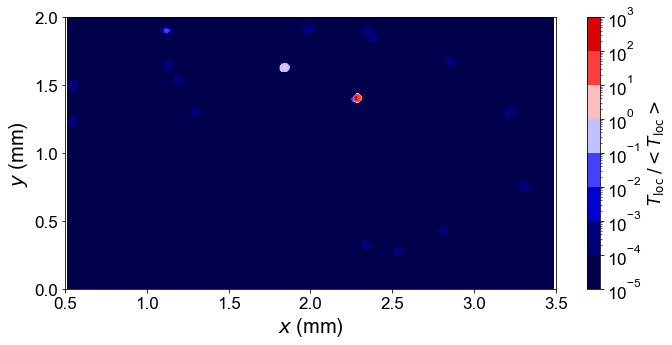


-----------------------------------------------------


Read granular temperature at 220


Reading particle info 220...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 220 successful

Read coordinate done


Interpolation done



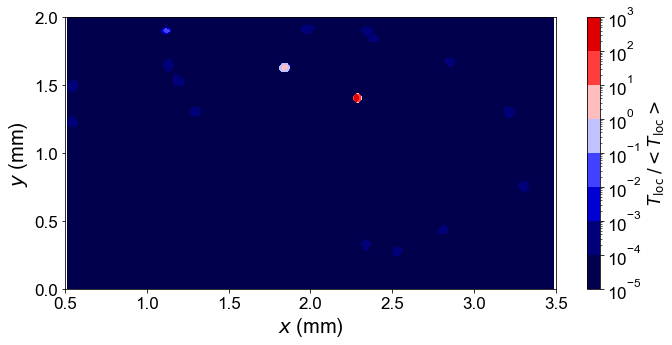


-----------------------------------------------------


Read granular temperature at 221


Reading particle info 221...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 221 successful

Read coordinate done


Interpolation done



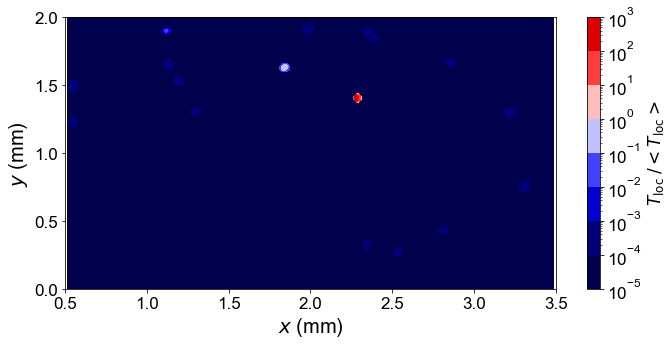


-----------------------------------------------------


Read granular temperature at 222


Reading particle info 222...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 222 successful

Read coordinate done


Interpolation done



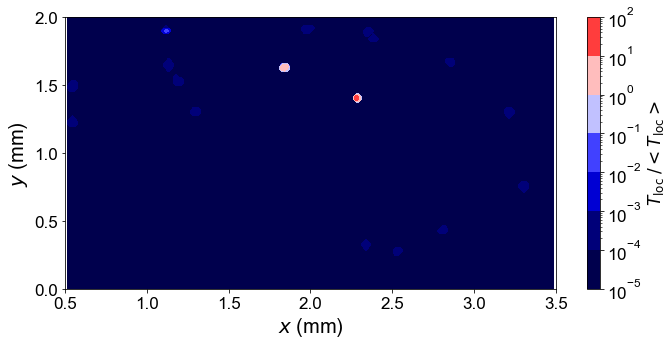


-----------------------------------------------------


Read granular temperature at 223


Reading particle info 223...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 223 successful

Read coordinate done


Interpolation done



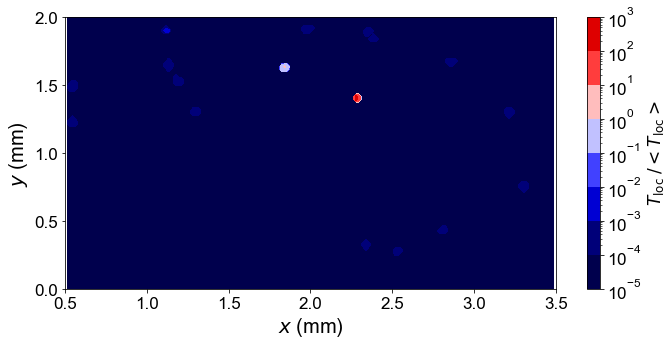


-----------------------------------------------------


Read granular temperature at 224


Reading particle info 224...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 224 successful

Read coordinate done


Interpolation done



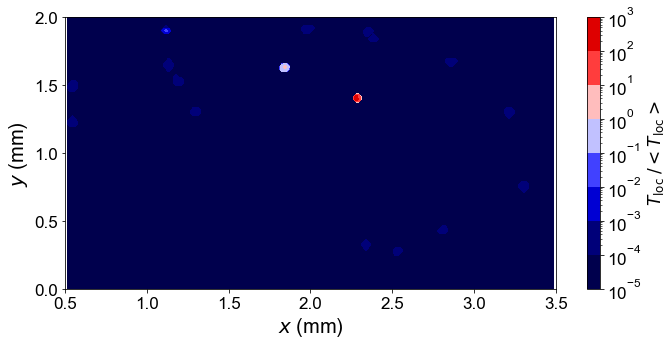


-----------------------------------------------------


Read granular temperature at 225


Reading particle info 225...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 225 successful

Read coordinate done


Interpolation done



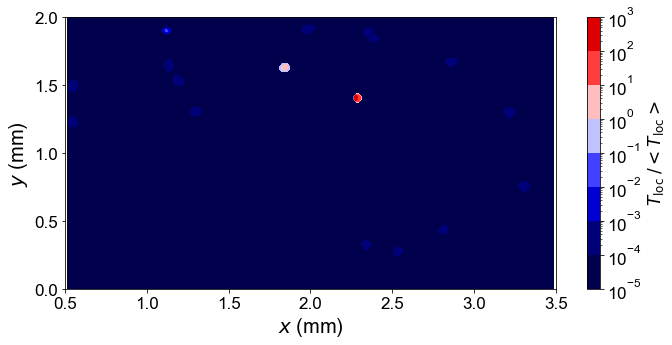


-----------------------------------------------------


Read granular temperature at 226


Reading particle info 226...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 226 successful

Read coordinate done


Interpolation done



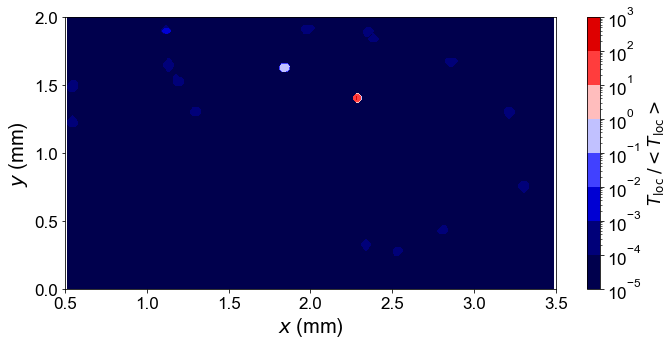


-----------------------------------------------------


Read granular temperature at 227


Reading particle info 227...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 227 successful

Read coordinate done


Interpolation done



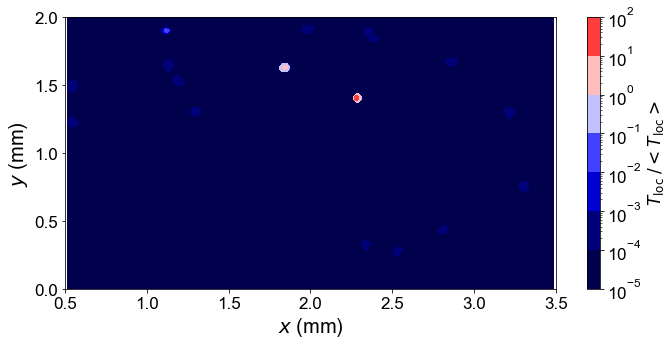


-----------------------------------------------------


Read granular temperature at 228


Reading particle info 228...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 228 successful

Read coordinate done


Interpolation done



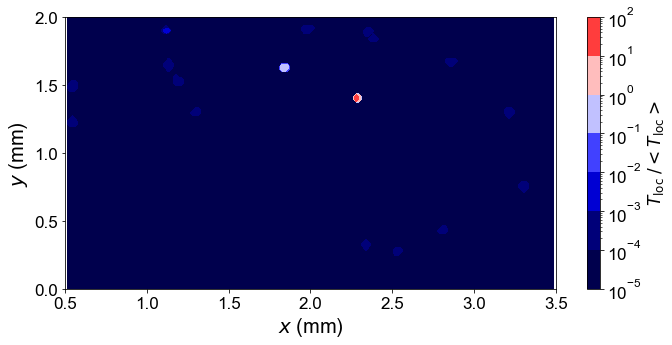


-----------------------------------------------------


Read granular temperature at 229


Reading particle info 229...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 229 successful

Read coordinate done


Interpolation done



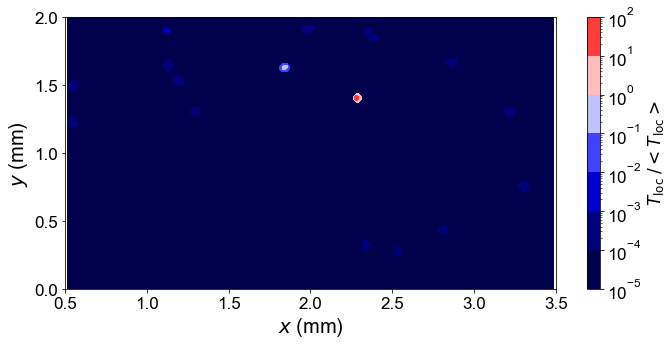


-----------------------------------------------------


Read granular temperature at 230


Reading particle info 230...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 230 successful

Read coordinate done


Interpolation done



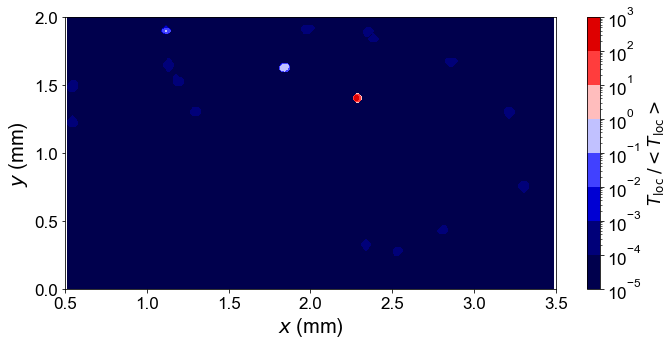


-----------------------------------------------------


Read granular temperature at 231


Reading particle info 231...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 231 successful

Read coordinate done


Interpolation done



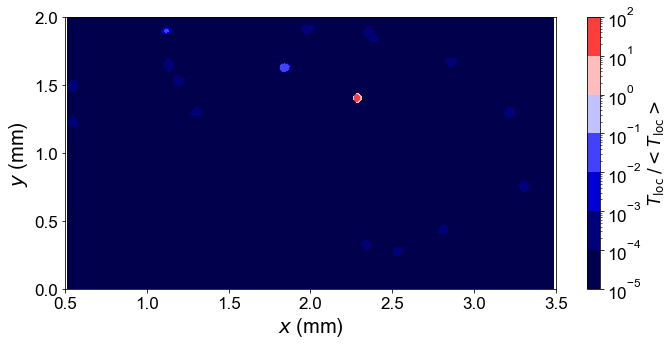


-----------------------------------------------------


Read granular temperature at 232


Reading particle info 232...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 232 successful

Read coordinate done


Interpolation done



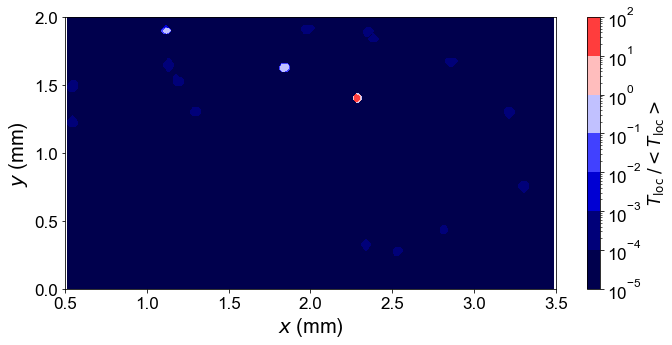


-----------------------------------------------------


Read granular temperature at 233


Reading particle info 233...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 233 successful

Read coordinate done


Interpolation done



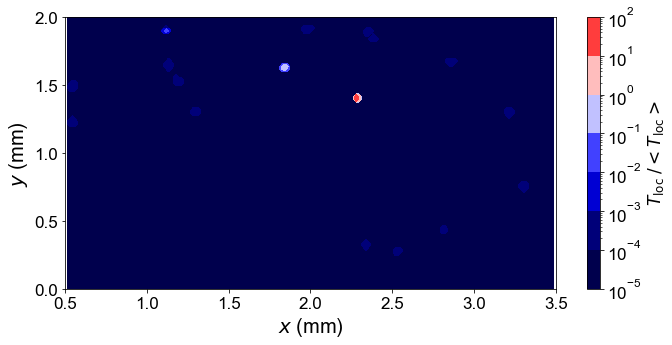


-----------------------------------------------------


Read granular temperature at 234


Reading particle info 234...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 234 successful

Read coordinate done


Interpolation done



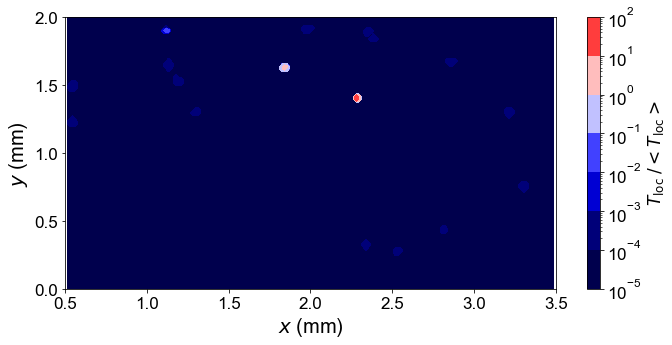


-----------------------------------------------------


Read granular temperature at 235


Reading particle info 235...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 235 successful

Read coordinate done


Interpolation done



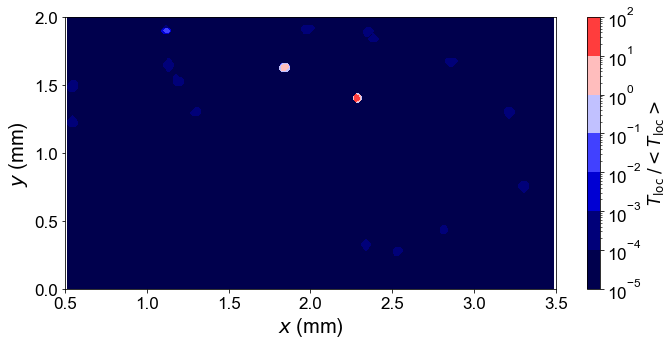


-----------------------------------------------------


Read granular temperature at 236


Reading particle info 236...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 236 successful

Read coordinate done


Interpolation done



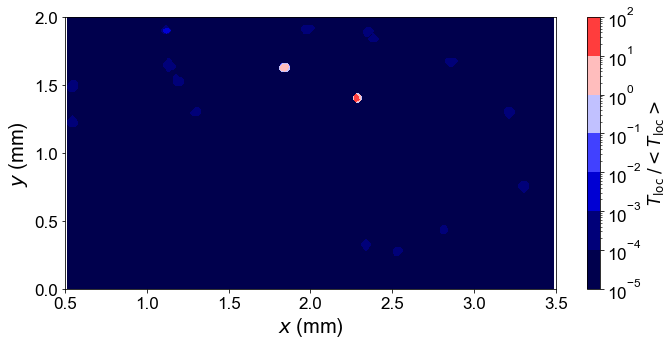


-----------------------------------------------------


Read granular temperature at 237


Reading particle info 237...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 237 successful

Read coordinate done


Interpolation done



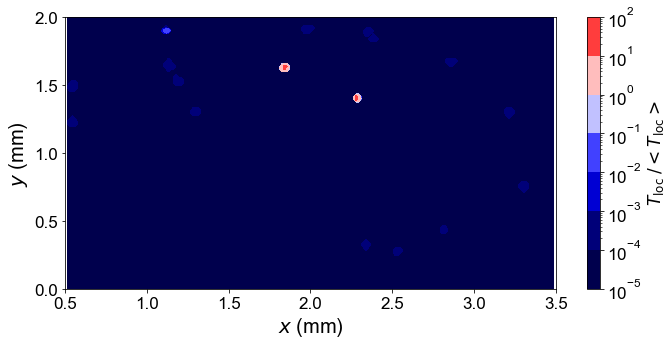


-----------------------------------------------------


Read granular temperature at 238


Reading particle info 238...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 238 successful

Read coordinate done


Interpolation done



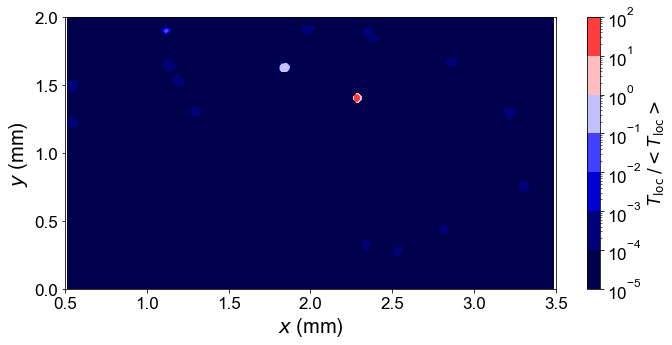


-----------------------------------------------------


Read granular temperature at 239


Reading particle info 239...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 239 successful

Read coordinate done


Interpolation done



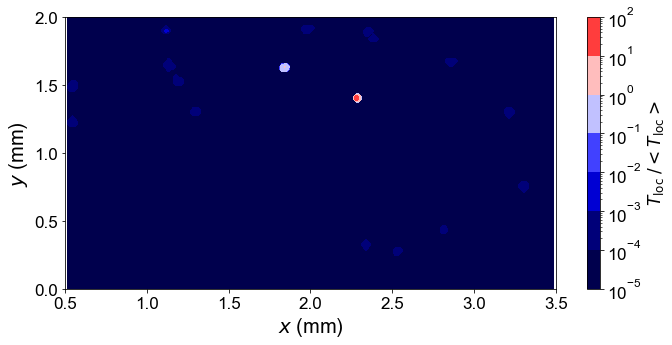


-----------------------------------------------------


Read granular temperature at 240


Reading particle info 240...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 240 successful

Read coordinate done


Interpolation done



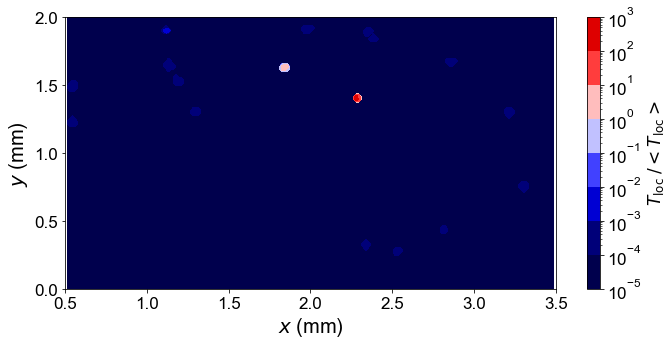


-----------------------------------------------------


Read granular temperature at 241


Reading particle info 241...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 241 successful

Read coordinate done


Interpolation done



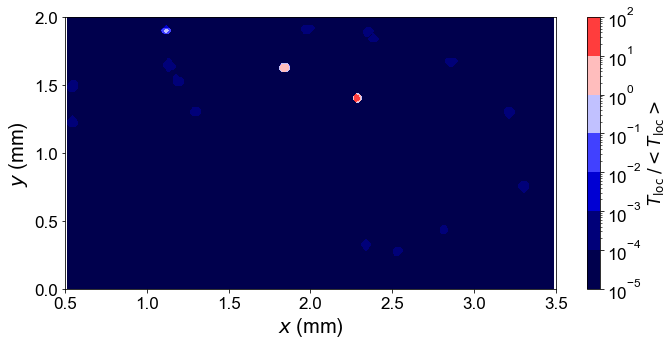


-----------------------------------------------------


Read granular temperature at 242


Reading particle info 242...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 242 successful

Read coordinate done


Interpolation done



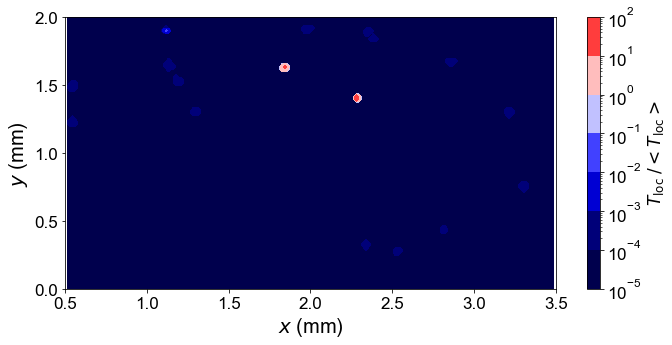


-----------------------------------------------------


Read granular temperature at 243


Reading particle info 243...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 243 successful

Read coordinate done


Interpolation done



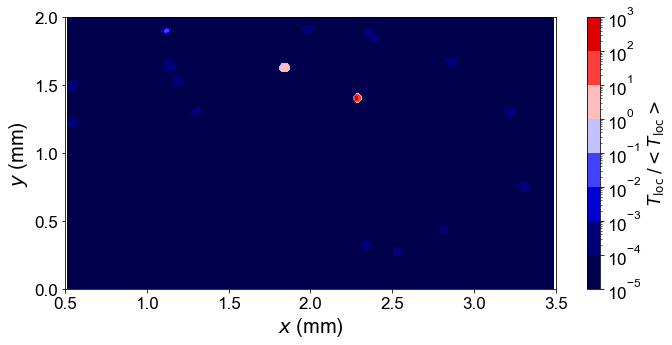


-----------------------------------------------------


Read granular temperature at 244


Reading particle info 244...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 244 successful

Read coordinate done


Interpolation done



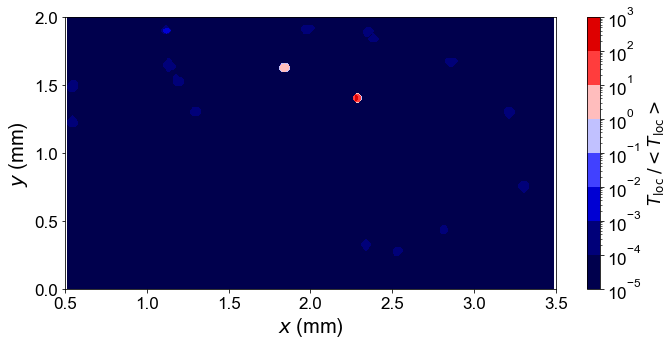


-----------------------------------------------------


Read granular temperature at 245


Reading particle info 245...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 245 successful

Read coordinate done


Interpolation done



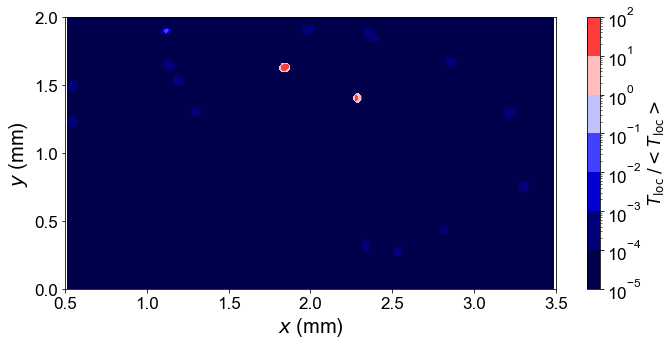


-----------------------------------------------------


Read granular temperature at 246


Reading particle info 246...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 246 successful

Read coordinate done


Interpolation done



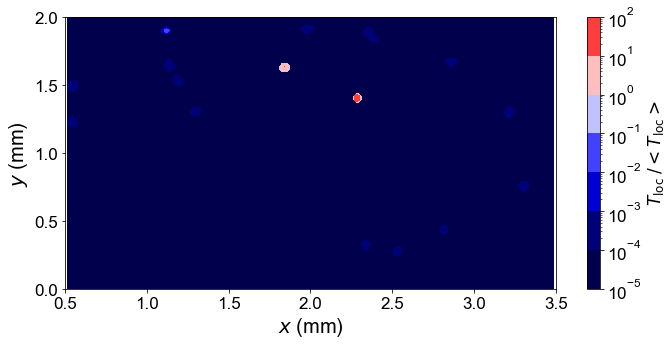


-----------------------------------------------------


Read granular temperature at 247


Reading particle info 247...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 247 successful

Read coordinate done


Interpolation done



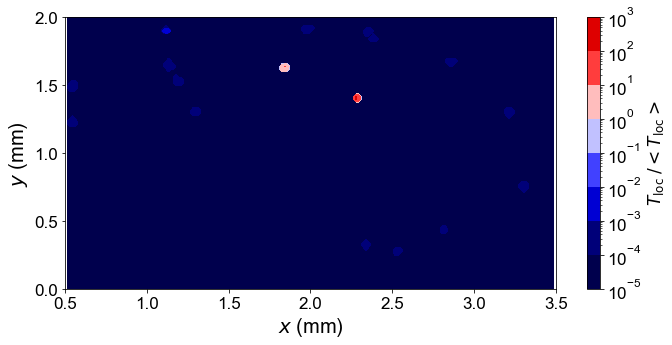


-----------------------------------------------------


Read granular temperature at 248


Reading particle info 248...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 248 successful

Read coordinate done


Interpolation done



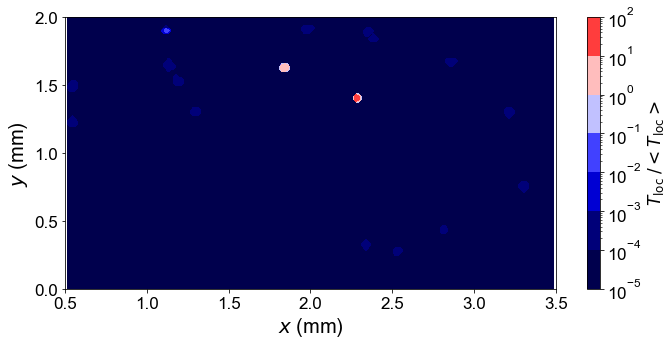


-----------------------------------------------------


Read granular temperature at 249


Reading particle info 249...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 249 successful

Read coordinate done


Interpolation done



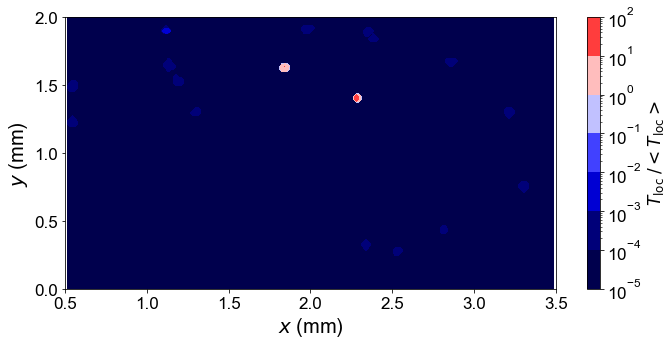


-----------------------------------------------------


Read granular temperature at 250


Reading particle info 250...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 250 successful

Read coordinate done


Interpolation done



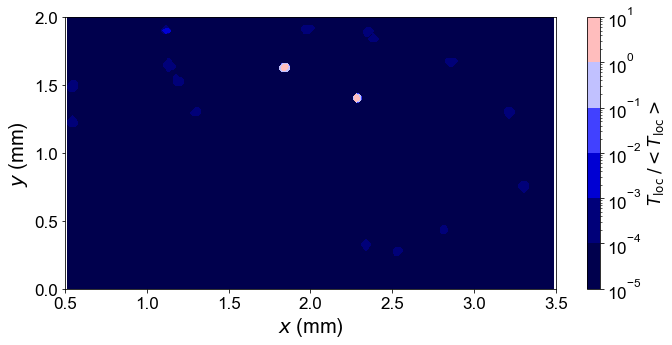


-----------------------------------------------------


Read granular temperature at 251


Reading particle info 251...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 251 successful

Read coordinate done


Interpolation done



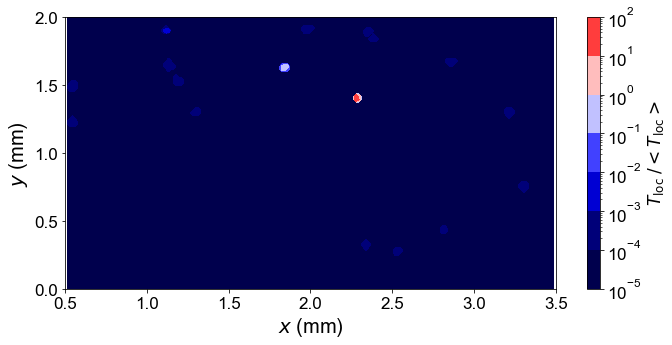


-----------------------------------------------------


Read granular temperature at 252


Reading particle info 252...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 252 successful

Read coordinate done


Interpolation done



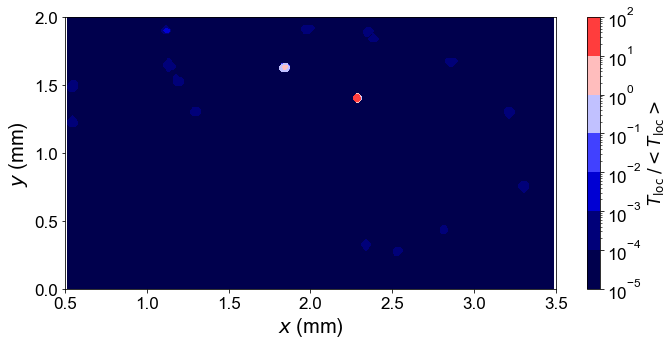


-----------------------------------------------------


Read granular temperature at 253


Reading particle info 253...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 253 successful

Read coordinate done


Interpolation done



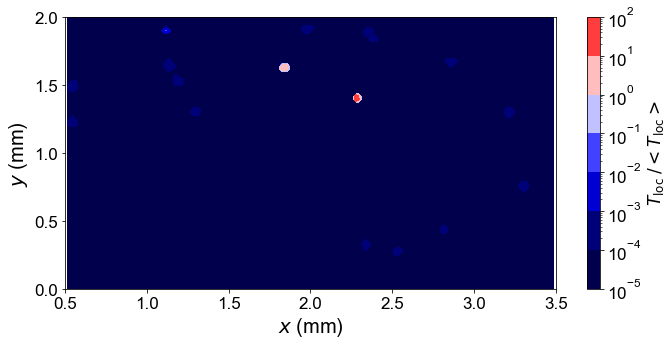


-----------------------------------------------------


Read granular temperature at 254


Reading particle info 254...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 254 successful

Read coordinate done


Interpolation done



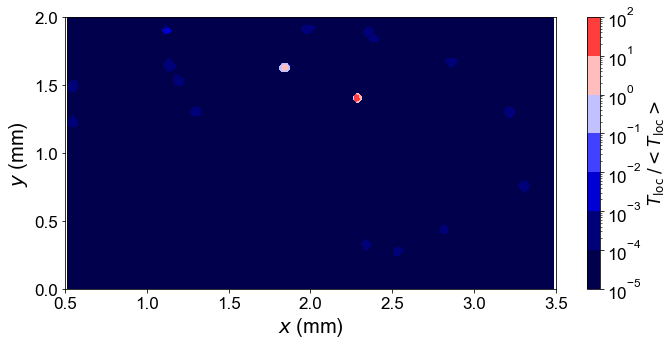


-----------------------------------------------------


Read granular temperature at 255


Reading particle info 255...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 255 successful

Read coordinate done


Interpolation done



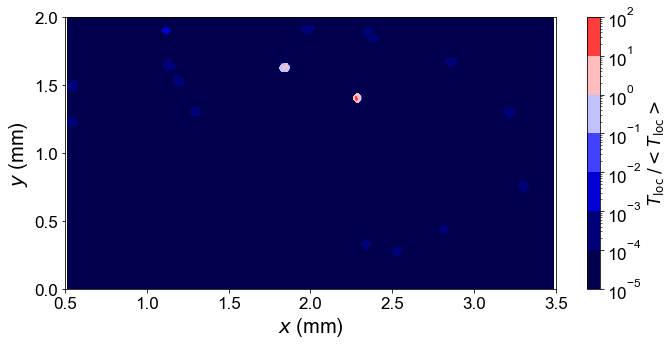


-----------------------------------------------------


Read granular temperature at 256


Reading particle info 256...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 256 successful

Read coordinate done


Interpolation done



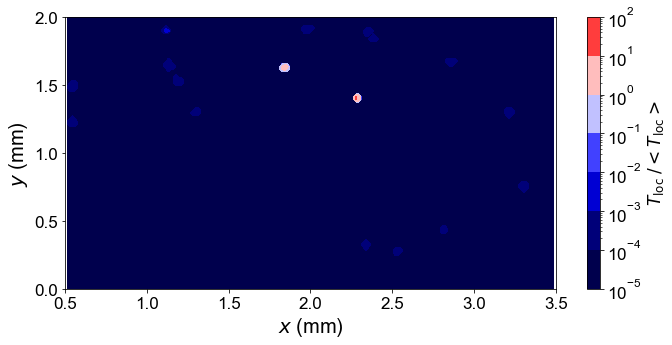


-----------------------------------------------------


Read granular temperature at 257


Reading particle info 257...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 257 successful

Read coordinate done


Interpolation done



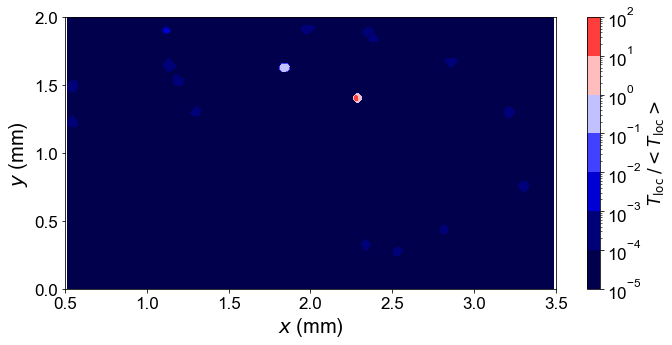


-----------------------------------------------------


Read granular temperature at 258


Reading particle info 258...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 258 successful

Read coordinate done


Interpolation done



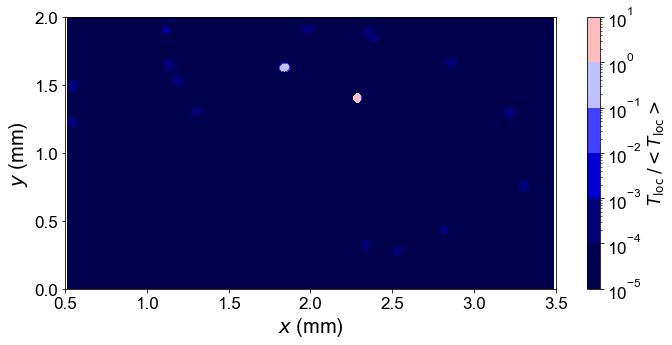


-----------------------------------------------------


Read granular temperature at 259


Reading particle info 259...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 259 successful

Read coordinate done


Interpolation done



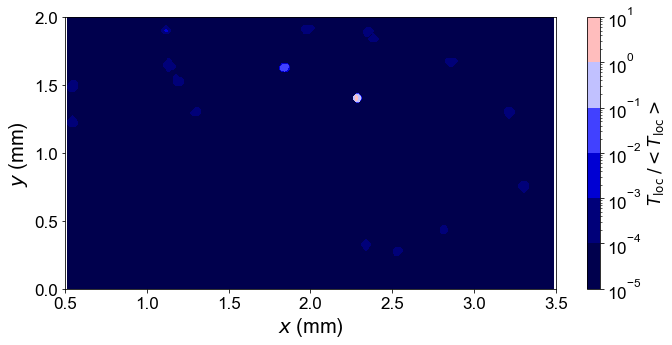


-----------------------------------------------------


Read granular temperature at 260


Reading particle info 260...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 260 successful

Read coordinate done


Interpolation done



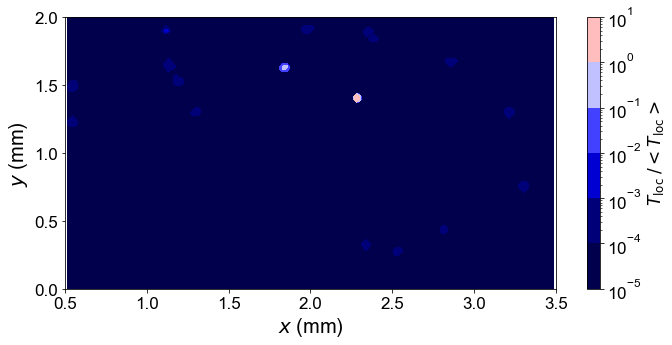


-----------------------------------------------------


Read granular temperature at 261


Reading particle info 261...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 261 successful

Read coordinate done


Interpolation done



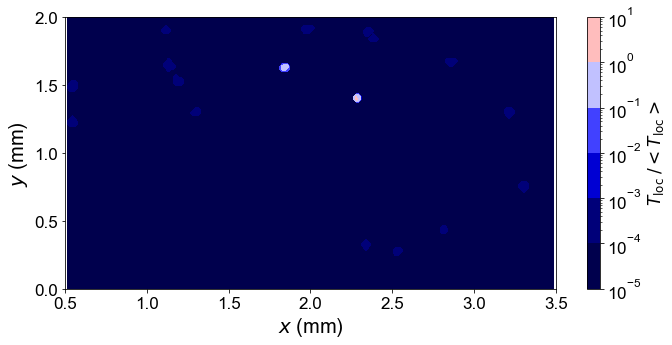


-----------------------------------------------------


Read granular temperature at 262


Reading particle info 262...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 262 successful

Read coordinate done


Interpolation done



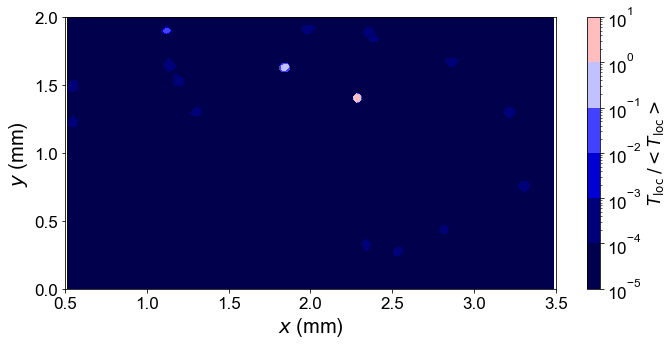


-----------------------------------------------------


Read granular temperature at 263


Reading particle info 263...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 263 successful

Read coordinate done


Interpolation done



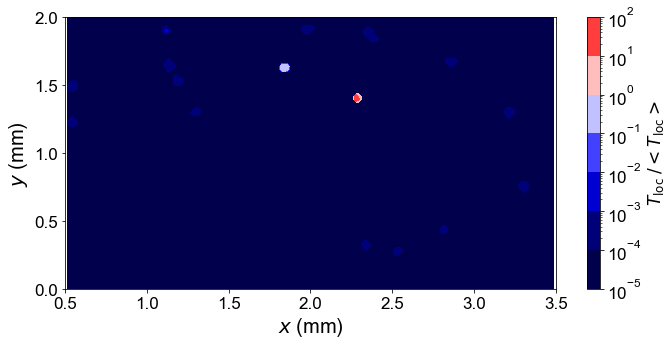


-----------------------------------------------------


Read granular temperature at 264


Reading particle info 264...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 264 successful

Read coordinate done


Interpolation done



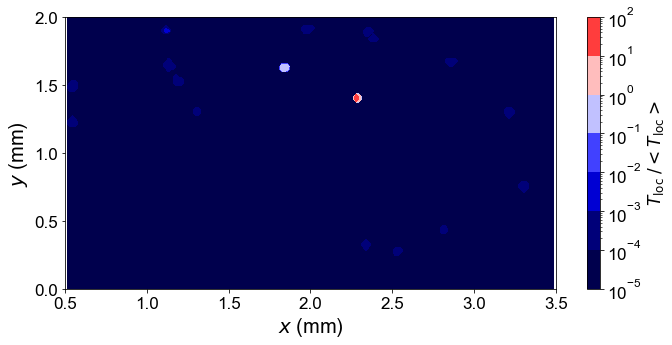


-----------------------------------------------------


Read granular temperature at 265


Reading particle info 265...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 265 successful

Read coordinate done


Interpolation done



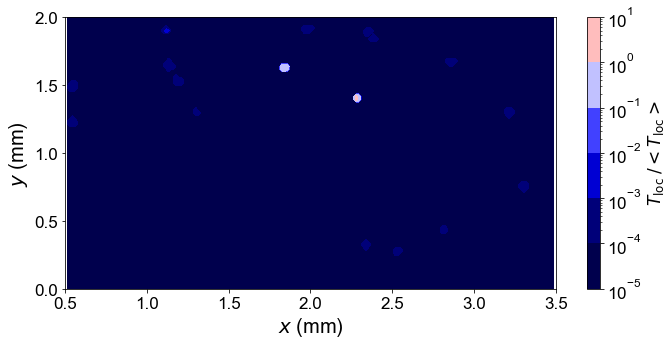


-----------------------------------------------------


Read granular temperature at 266


Reading particle info 266...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 266 successful

Read coordinate done


Interpolation done



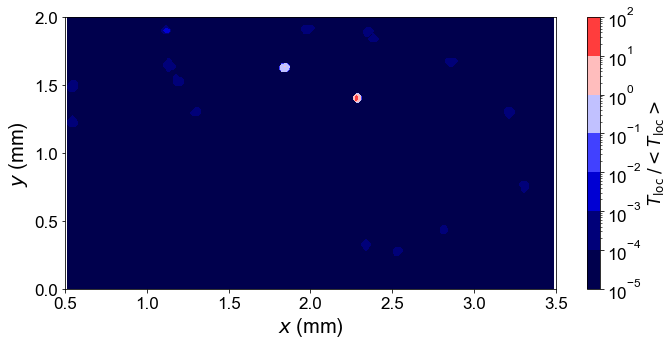


-----------------------------------------------------


Read granular temperature at 267


Reading particle info 267...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 267 successful

Read coordinate done


Interpolation done



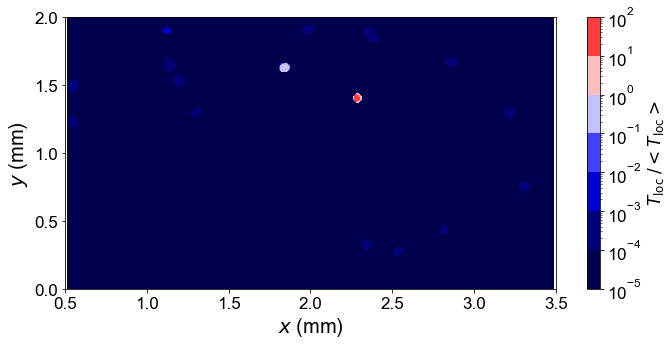


-----------------------------------------------------


Read granular temperature at 268


Reading particle info 268...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 268 successful

Read coordinate done


Interpolation done



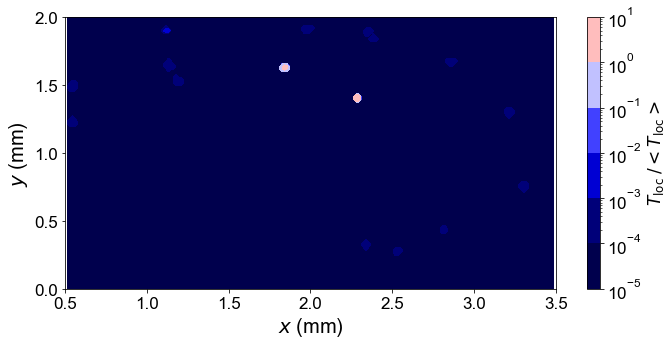


-----------------------------------------------------


Read granular temperature at 269


Reading particle info 269...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 269 successful

Read coordinate done


Interpolation done



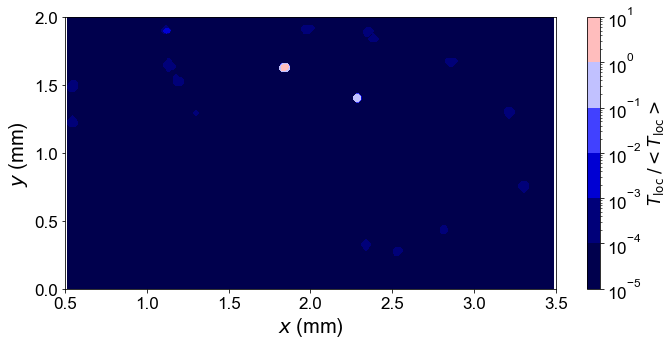


-----------------------------------------------------


Read granular temperature at 270


Reading particle info 270...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 270 successful

Read coordinate done


Interpolation done



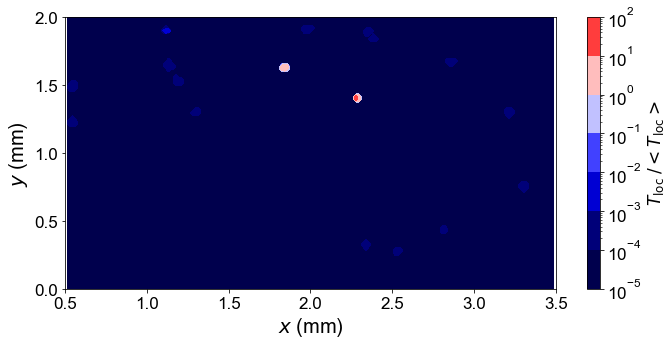


-----------------------------------------------------


Read granular temperature at 271


Reading particle info 271...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 271 successful

Read coordinate done


Interpolation done



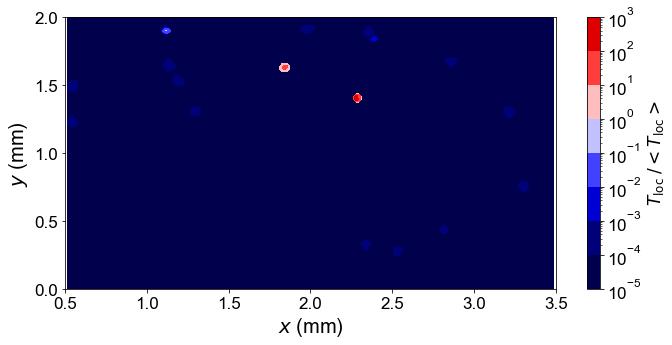


-----------------------------------------------------


Read granular temperature at 272


Reading particle info 272...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 272 successful

Read coordinate done


Interpolation done



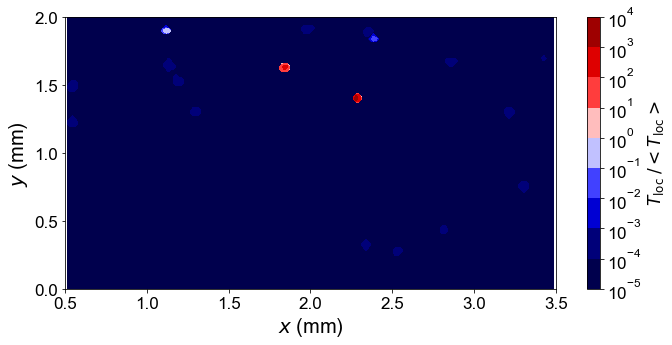


-----------------------------------------------------


Read granular temperature at 273


Reading particle info 273...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 273 successful

Read coordinate done


Interpolation done



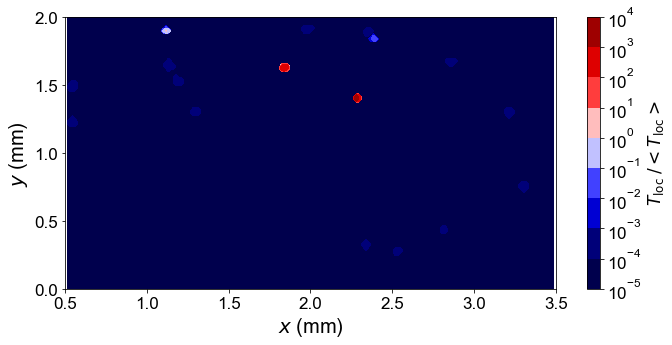


-----------------------------------------------------


Read granular temperature at 274


Reading particle info 274...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 274 successful

Read coordinate done


Interpolation done



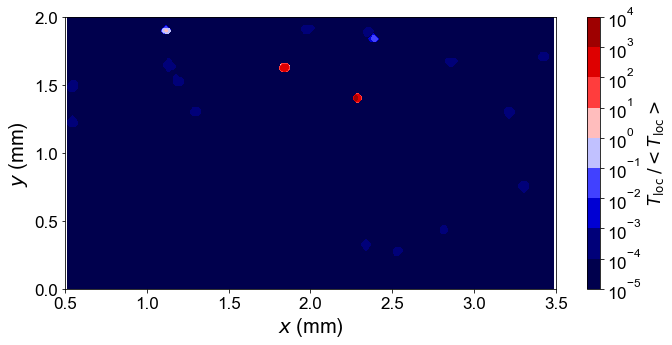


-----------------------------------------------------


Read granular temperature at 275


Reading particle info 275...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 275 successful

Read coordinate done


Interpolation done



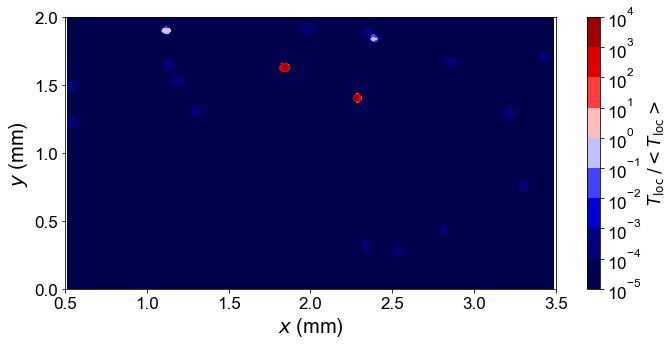


-----------------------------------------------------


Read granular temperature at 276


Reading particle info 276...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 276 successful

Read coordinate done


Interpolation done



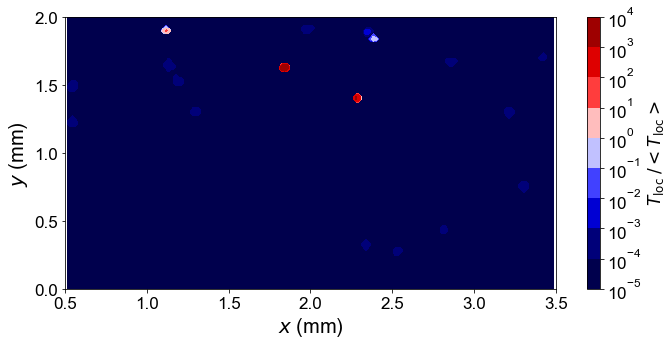


-----------------------------------------------------


Read granular temperature at 277


Reading particle info 277...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 277 successful

Read coordinate done


Interpolation done



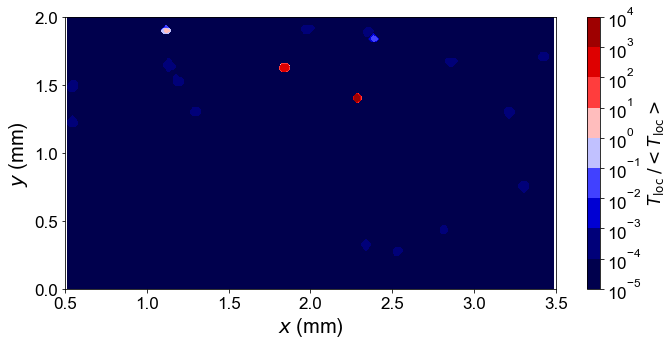


-----------------------------------------------------


Read granular temperature at 278


Reading particle info 278...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 278 successful

Read coordinate done


Interpolation done



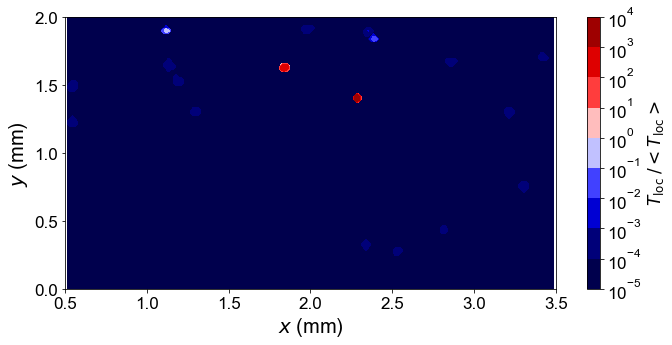


-----------------------------------------------------


Read granular temperature at 279


Reading particle info 279...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 279 successful

Read coordinate done


Interpolation done



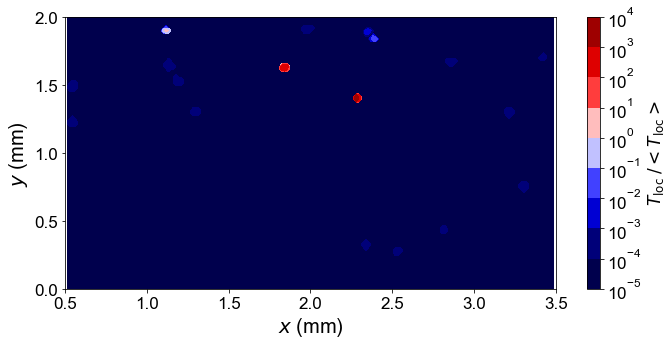


-----------------------------------------------------


Read granular temperature at 280


Reading particle info 280...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 280 successful

Read coordinate done


Interpolation done



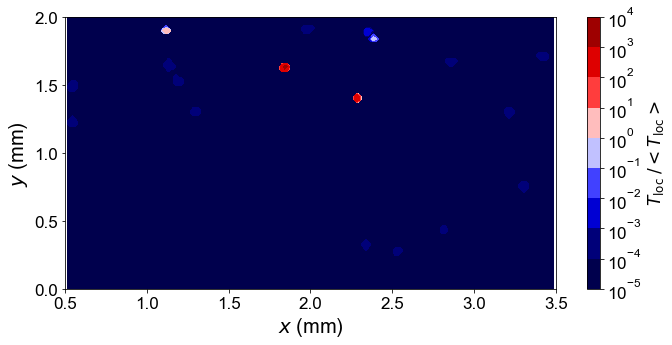


-----------------------------------------------------


Read granular temperature at 281


Reading particle info 281...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 281 successful

Read coordinate done


Interpolation done



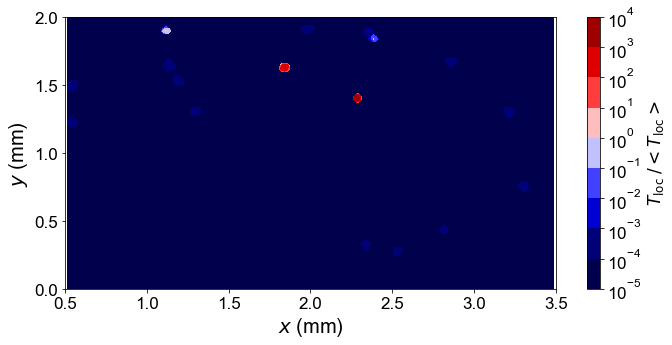


-----------------------------------------------------


Read granular temperature at 282


Reading particle info 282...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 282 successful

Read coordinate done


Interpolation done



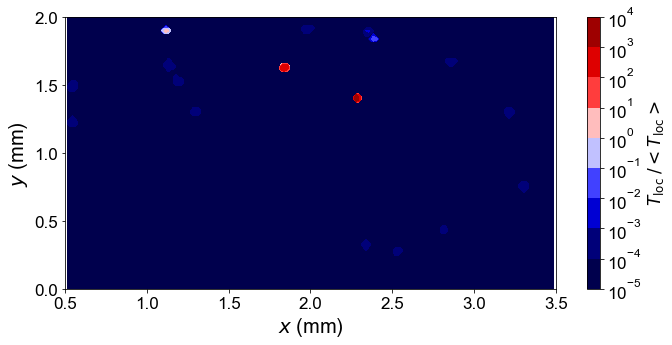


-----------------------------------------------------


Read granular temperature at 283


Reading particle info 283...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 283 successful

Read coordinate done


Interpolation done



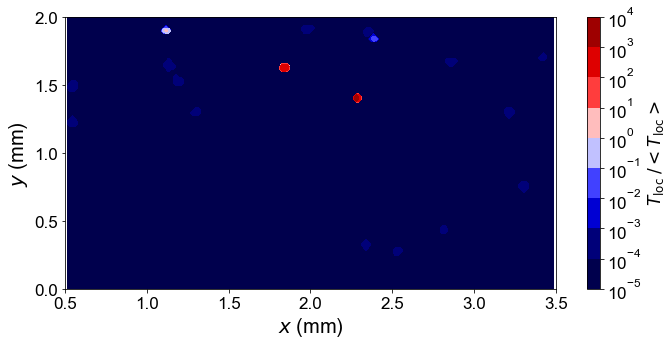


-----------------------------------------------------


Read granular temperature at 284


Reading particle info 284...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 284 successful

Read coordinate done


Interpolation done



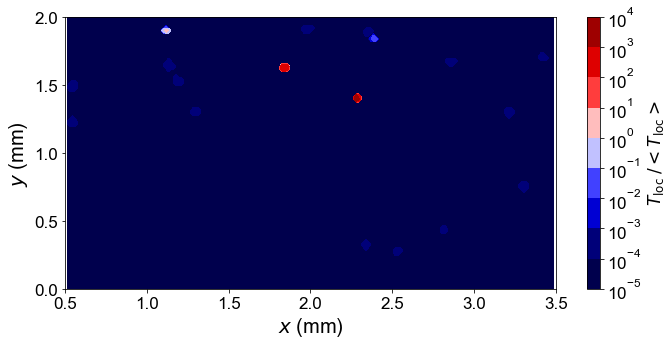


-----------------------------------------------------


Read granular temperature at 285


Reading particle info 285...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 285 successful

Read coordinate done


Interpolation done



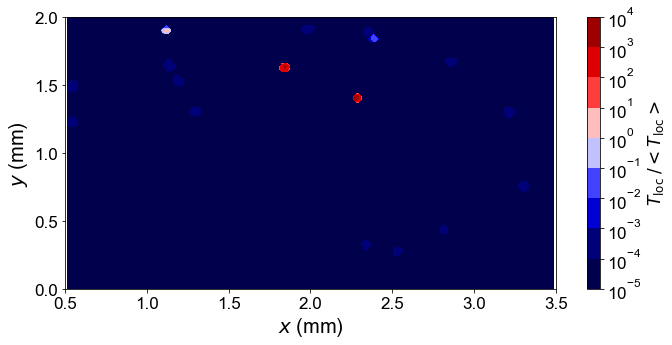


-----------------------------------------------------


Read granular temperature at 286


Reading particle info 286...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 286 successful

Read coordinate done


Interpolation done



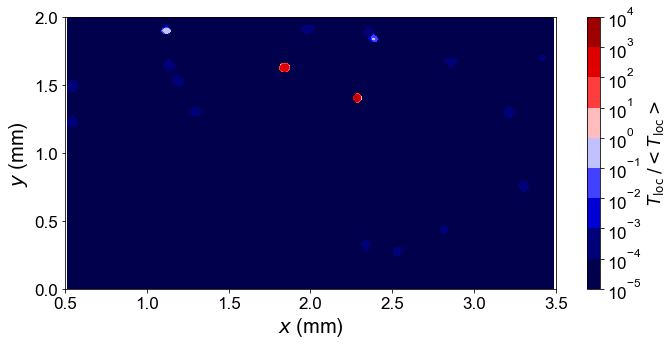


-----------------------------------------------------


Read granular temperature at 287


Reading particle info 287...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 287 successful

Read coordinate done


Interpolation done



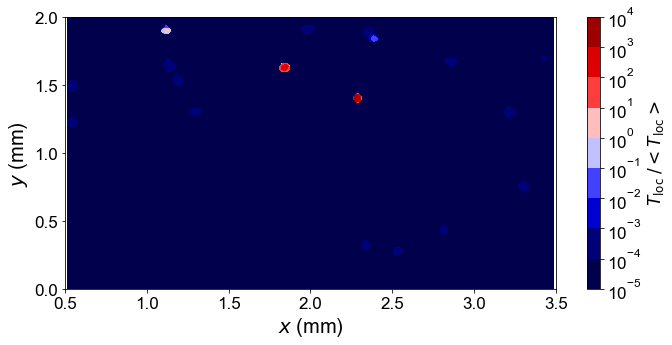


-----------------------------------------------------


Read granular temperature at 288


Reading particle info 288...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 288 successful

Read coordinate done


Interpolation done



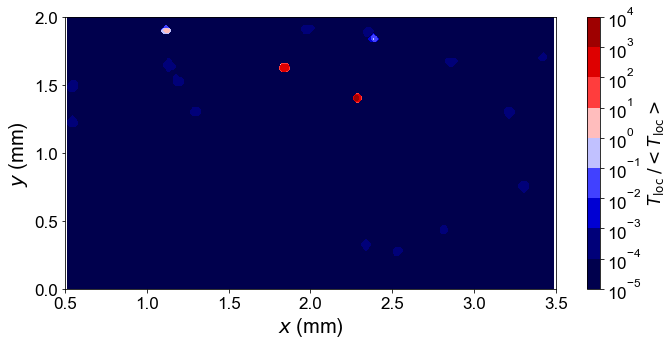


-----------------------------------------------------


Read granular temperature at 289


Reading particle info 289...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 289 successful

Read coordinate done


Interpolation done



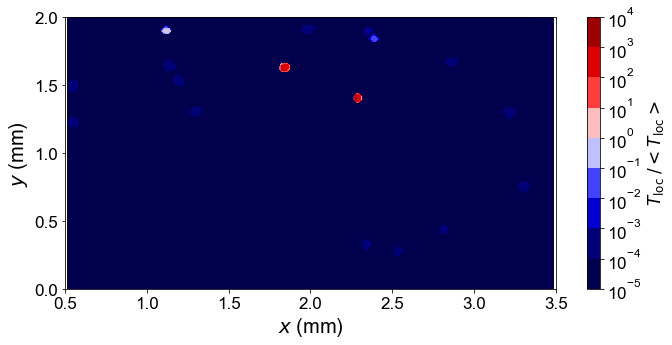


-----------------------------------------------------


Read granular temperature at 290


Reading particle info 290...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 290 successful

Read coordinate done


Interpolation done



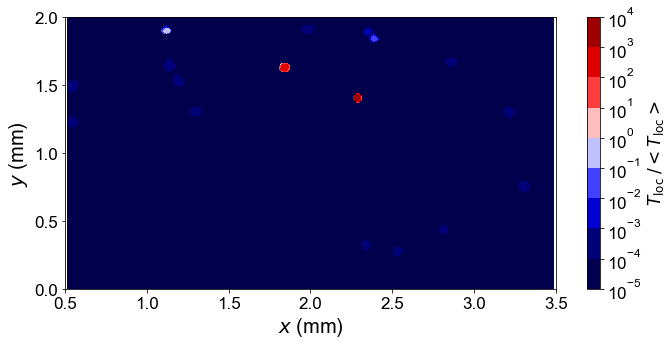


-----------------------------------------------------


Read granular temperature at 291


Reading particle info 291...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 291 successful

Read coordinate done


Interpolation done



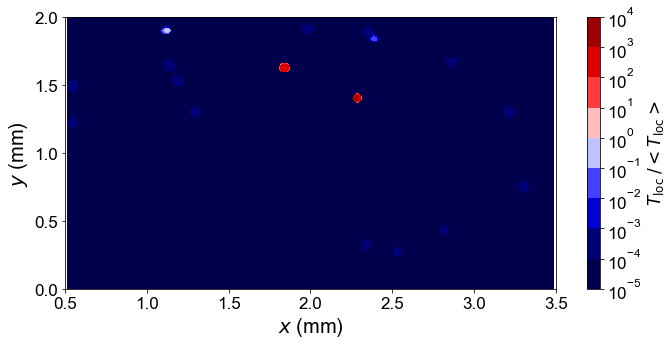


-----------------------------------------------------


Read granular temperature at 292


Reading particle info 292...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 292 successful

Read coordinate done


Interpolation done



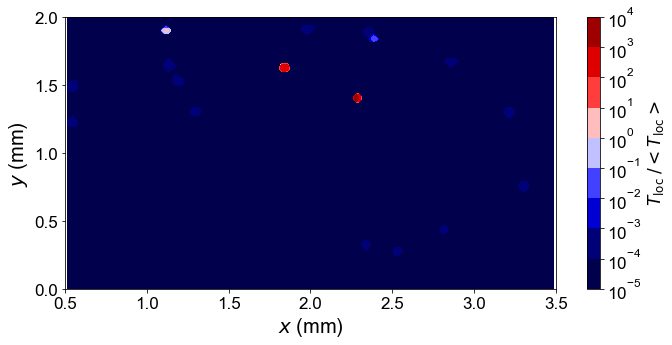


-----------------------------------------------------


Read granular temperature at 293


Reading particle info 293...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 293 successful

Read coordinate done


Interpolation done



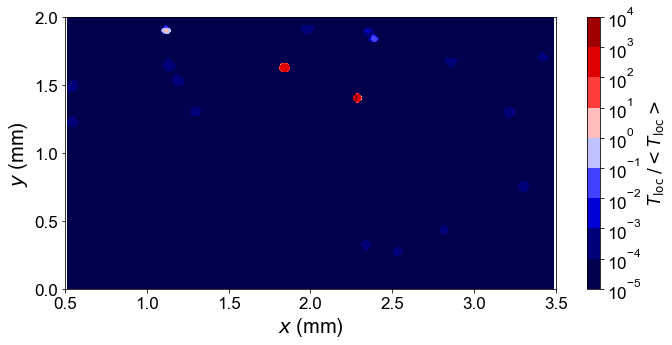


-----------------------------------------------------


Read granular temperature at 294


Reading particle info 294...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 294 successful

Read coordinate done


Interpolation done



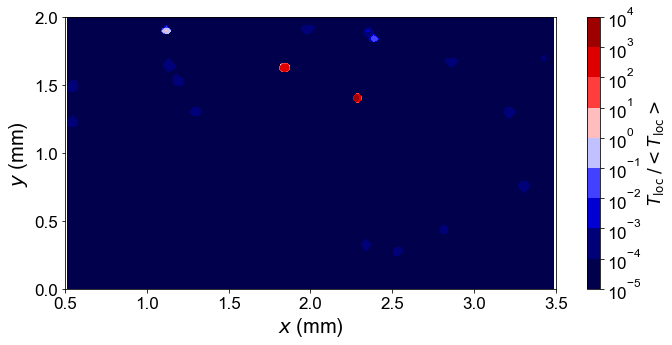


-----------------------------------------------------


Read granular temperature at 295


Reading particle info 295...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 295 successful

Read coordinate done


Interpolation done



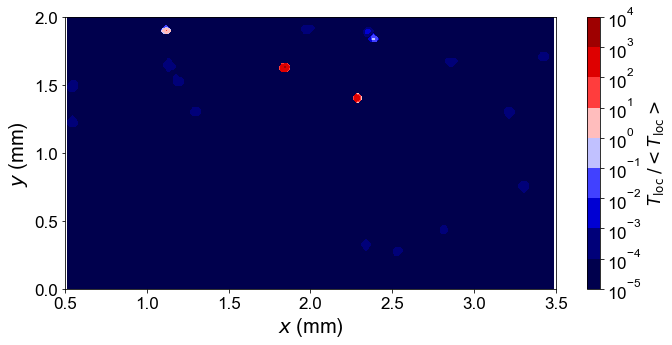


-----------------------------------------------------


Read granular temperature at 296


Reading particle info 296...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 296 successful

Read coordinate done


Interpolation done



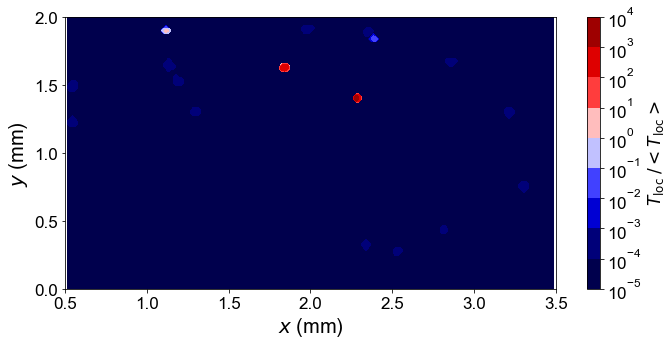


-----------------------------------------------------


Read granular temperature at 297


Reading particle info 297...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 297 successful

Read coordinate done


Interpolation done



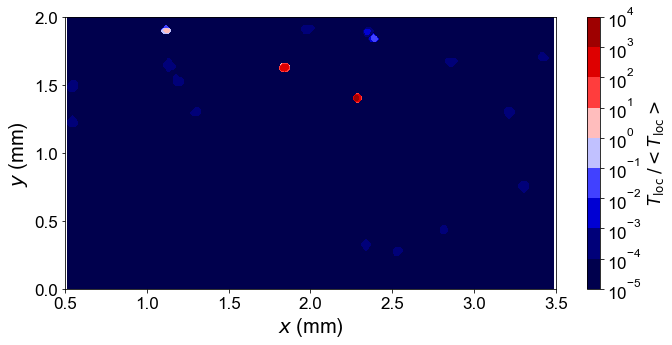


-----------------------------------------------------


Read granular temperature at 298


Reading particle info 298...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 298 successful

Read coordinate done


Interpolation done



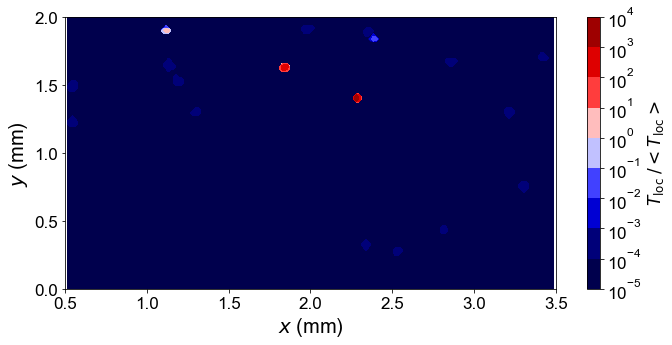


-----------------------------------------------------


Read granular temperature at 299


Reading particle info 299...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 299 successful

Read coordinate done


Interpolation done



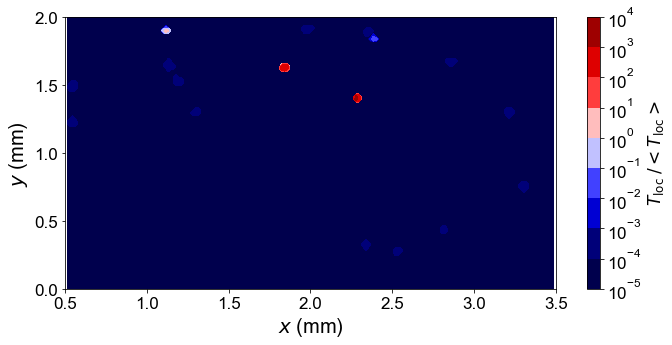


-----------------------------------------------------


Read granular temperature at 300


Reading particle info 300...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 300 successful

Read coordinate done


Interpolation done



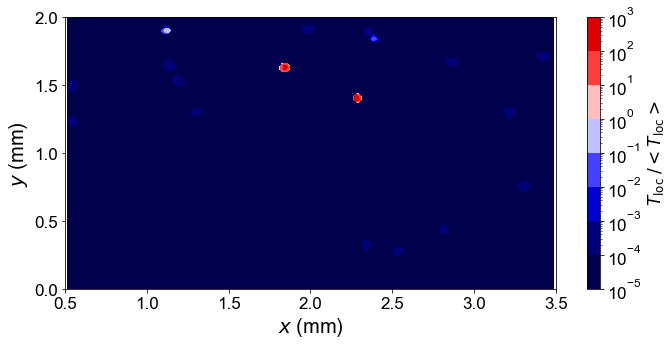


-----------------------------------------------------


Read granular temperature at 301


Reading particle info 301...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 301 successful

Read coordinate done


Interpolation done



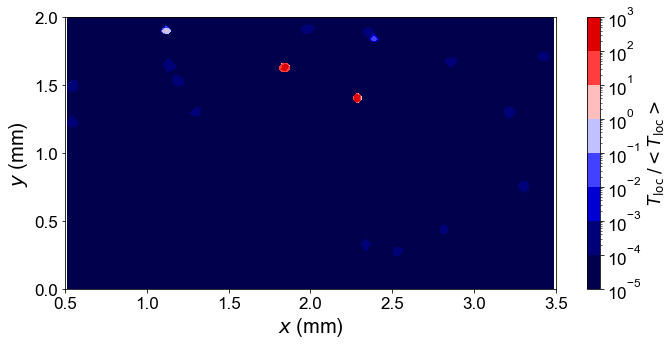


-----------------------------------------------------


Read granular temperature at 302


Reading particle info 302...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 302 successful

Read coordinate done


Interpolation done



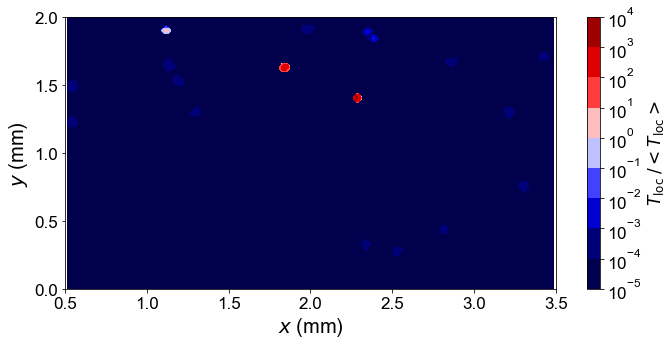


-----------------------------------------------------


Read granular temperature at 303


Reading particle info 303...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 303 successful

Read coordinate done


Interpolation done



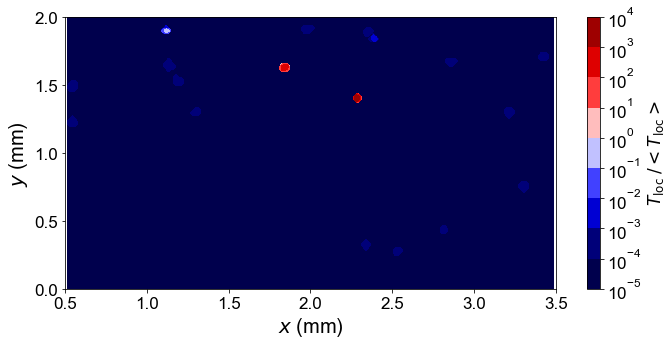


-----------------------------------------------------


Read granular temperature at 304


Reading particle info 304...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 304 successful

Read coordinate done


Interpolation done



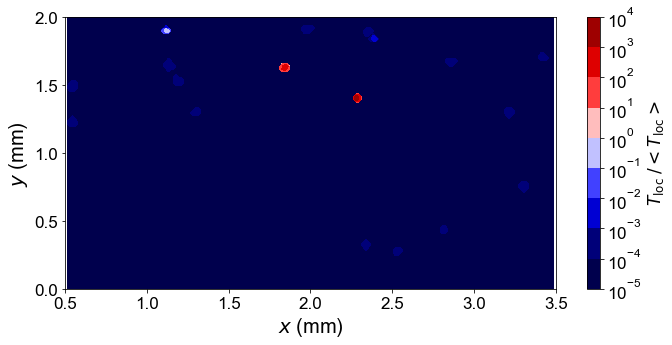


-----------------------------------------------------


Read granular temperature at 305


Reading particle info 305...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 305 successful

Read coordinate done


Interpolation done



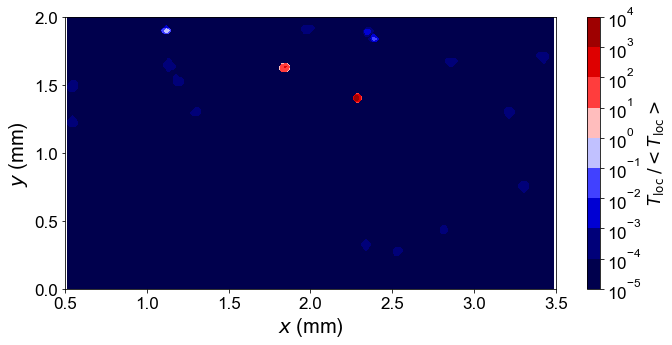


-----------------------------------------------------


Read granular temperature at 306


Reading particle info 306...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 306 successful

Read coordinate done


Interpolation done



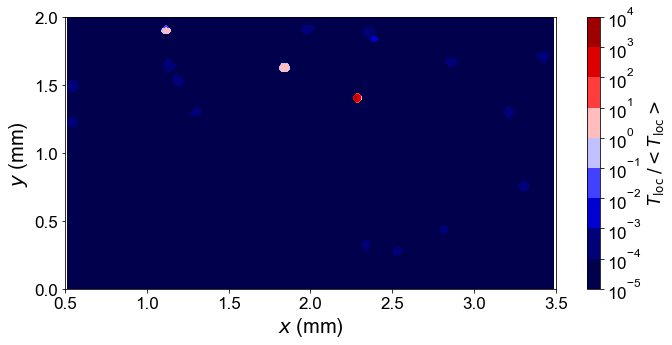


-----------------------------------------------------


Read granular temperature at 307


Reading particle info 307...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 307 successful

Read coordinate done


Interpolation done



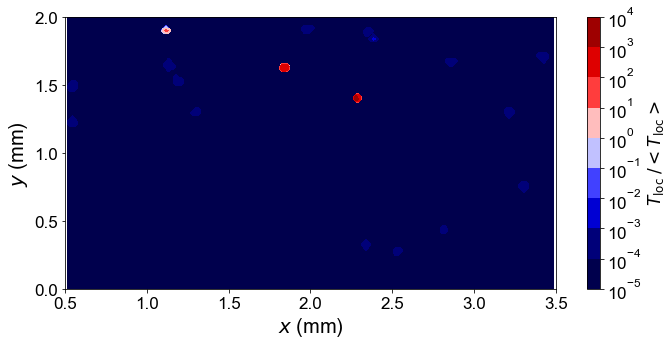


-----------------------------------------------------


Read granular temperature at 308


Reading particle info 308...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 308 successful

Read coordinate done


Interpolation done



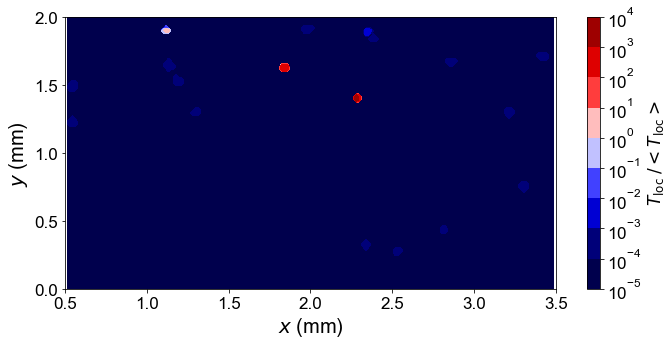


-----------------------------------------------------


Read granular temperature at 309


Reading particle info 309...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 309 successful

Read coordinate done


Interpolation done



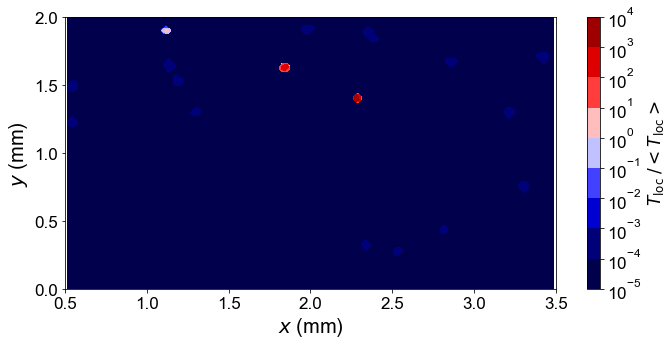


-----------------------------------------------------


Read granular temperature at 310


Reading particle info 310...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 310 successful

Read coordinate done


Interpolation done



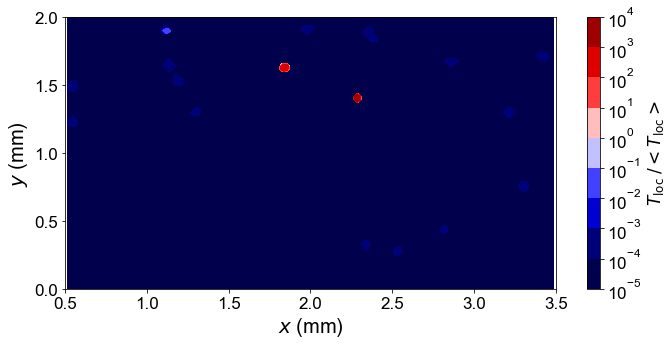


-----------------------------------------------------


Read granular temperature at 311


Reading particle info 311...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 311 successful

Read coordinate done


Interpolation done



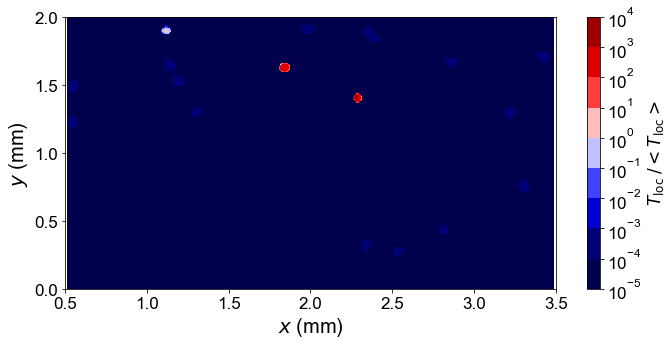


-----------------------------------------------------


Read granular temperature at 312


Reading particle info 312...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 312 successful

Read coordinate done


Interpolation done



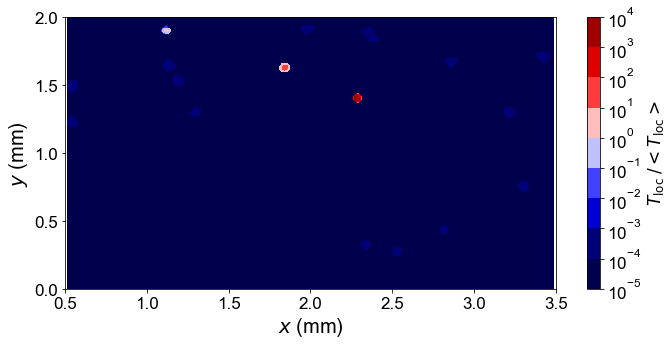


-----------------------------------------------------


Read granular temperature at 313


Reading particle info 313...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 313 successful

Read coordinate done


Interpolation done



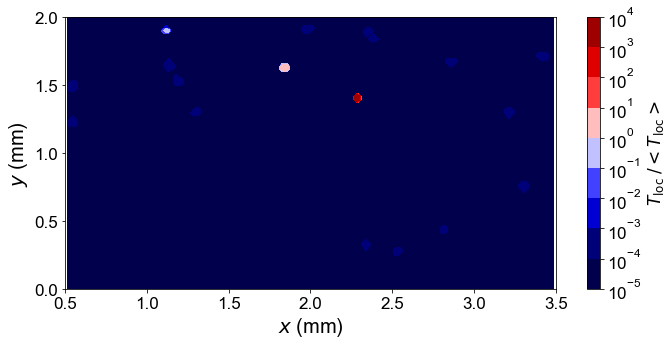


-----------------------------------------------------


Read granular temperature at 314


Reading particle info 314...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 314 successful

Read coordinate done


Interpolation done



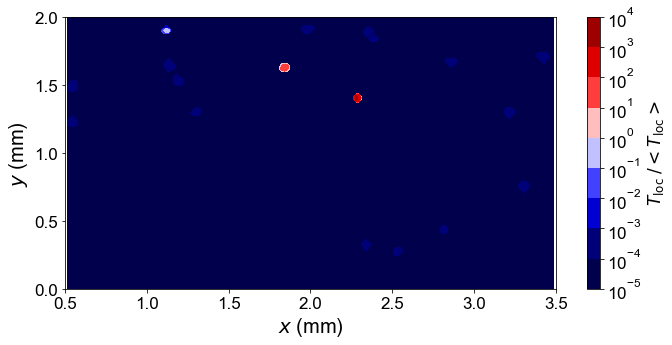


-----------------------------------------------------


Read granular temperature at 315


Reading particle info 315...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 315 successful

Read coordinate done


Interpolation done



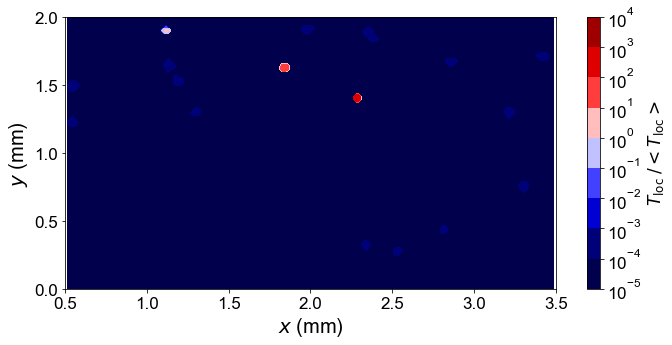


-----------------------------------------------------


Read granular temperature at 316


Reading particle info 316...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 316 successful

Read coordinate done


Interpolation done



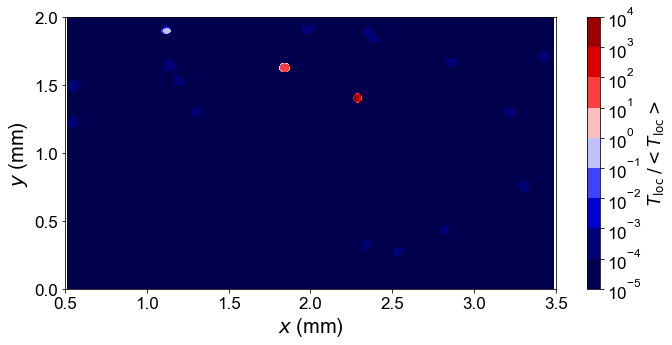


-----------------------------------------------------


Read granular temperature at 317


Reading particle info 317...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 317 successful

Read coordinate done


Interpolation done



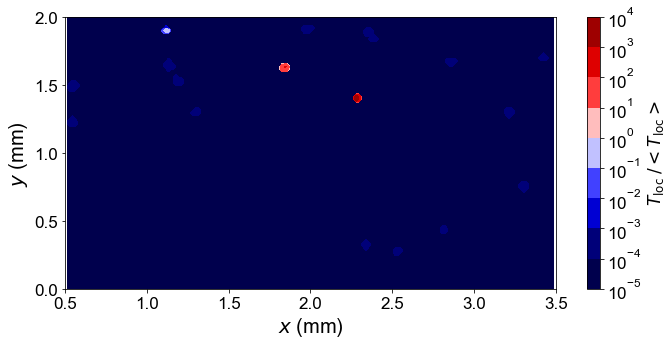


-----------------------------------------------------


Read granular temperature at 318


Reading particle info 318...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 318 successful

Read coordinate done


Interpolation done



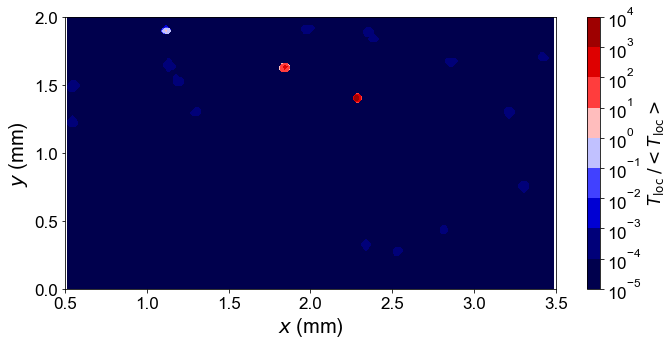


-----------------------------------------------------


Read granular temperature at 319


Reading particle info 319...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 319 successful

Read coordinate done


Interpolation done



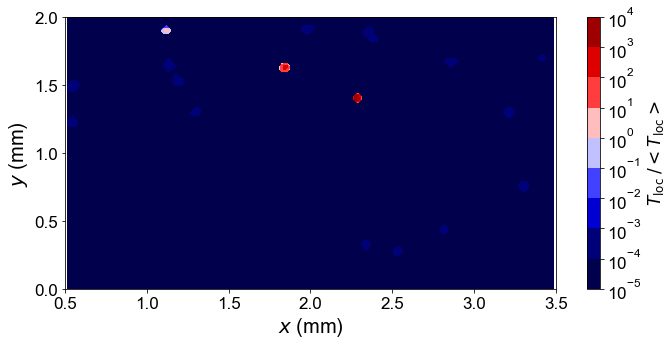


-----------------------------------------------------


Read granular temperature at 320


Reading particle info 320...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 320 successful

Read coordinate done


Interpolation done



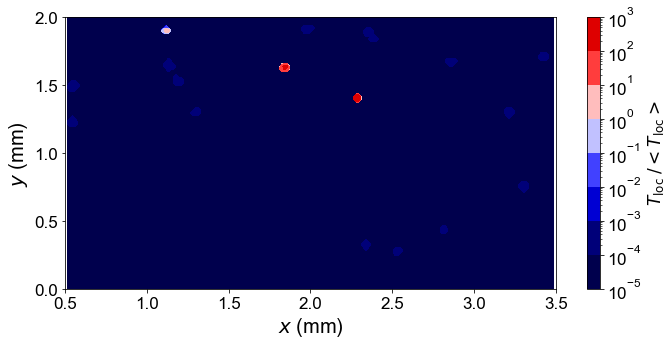


-----------------------------------------------------


Read granular temperature at 321


Reading particle info 321...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 321 successful

Read coordinate done


Interpolation done



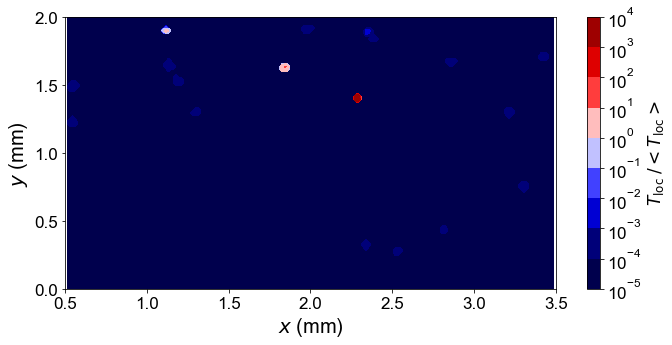


-----------------------------------------------------


Read granular temperature at 322


Reading particle info 322...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 322 successful

Read coordinate done


Interpolation done



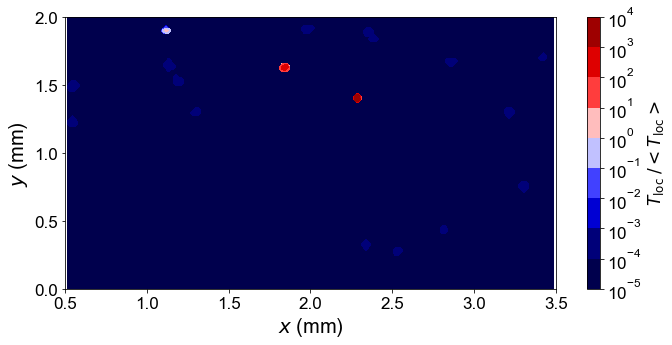


-----------------------------------------------------


Read granular temperature at 323


Reading particle info 323...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 323 successful

Read coordinate done


Interpolation done



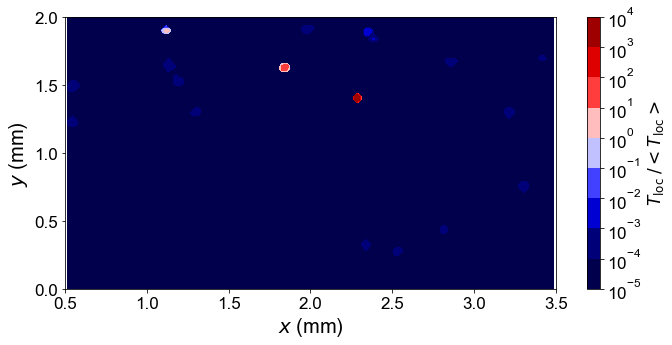


-----------------------------------------------------


Read granular temperature at 324


Reading particle info 324...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 324 successful

Read coordinate done


Interpolation done



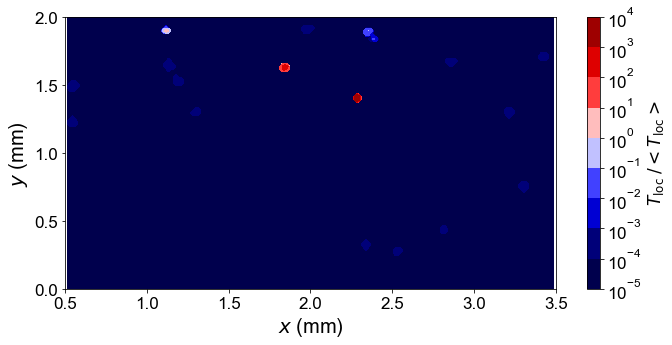


-----------------------------------------------------


Read granular temperature at 325


Reading particle info 325...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 325 successful

Read coordinate done


Interpolation done



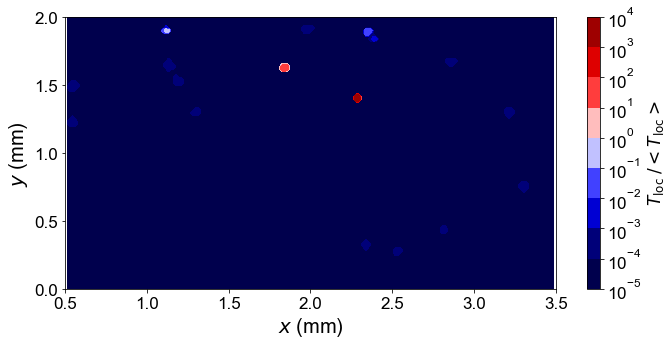


-----------------------------------------------------


Read granular temperature at 326


Reading particle info 326...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 326 successful

Read coordinate done


Interpolation done



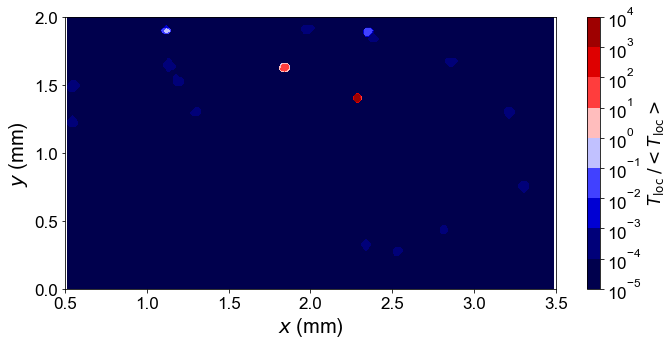


-----------------------------------------------------


Read granular temperature at 327


Reading particle info 327...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 327 successful

Read coordinate done


Interpolation done



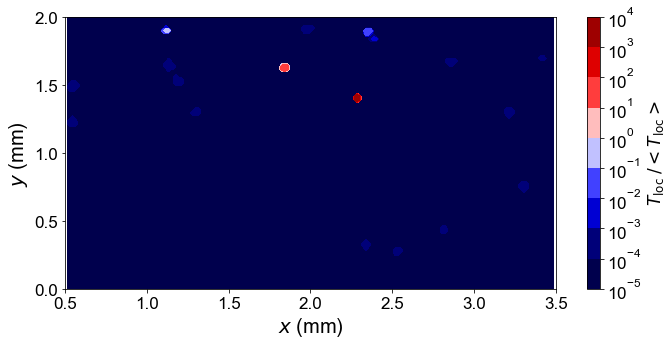


-----------------------------------------------------


Read granular temperature at 328


Reading particle info 328...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 328 successful

Read coordinate done


Interpolation done



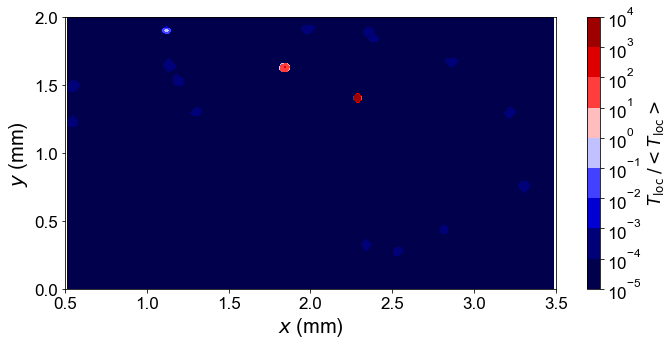


-----------------------------------------------------


Read granular temperature at 329


Reading particle info 329...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 329 successful

Read coordinate done


Interpolation done



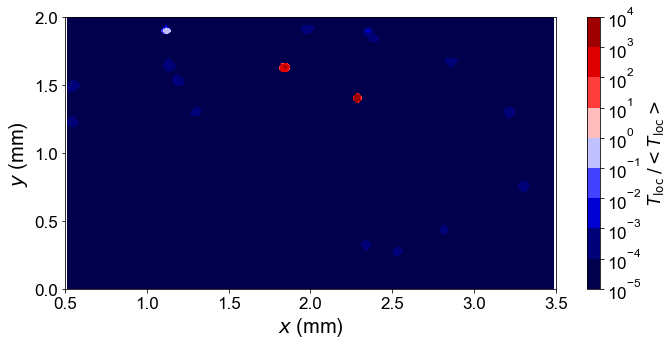


-----------------------------------------------------


Read granular temperature at 330


Reading particle info 330...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 330 successful

Read coordinate done


Interpolation done



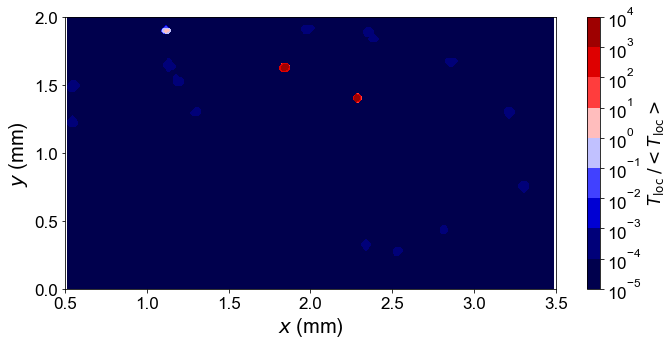


-----------------------------------------------------


Read granular temperature at 331


Reading particle info 331...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 331 successful

Read coordinate done


Interpolation done



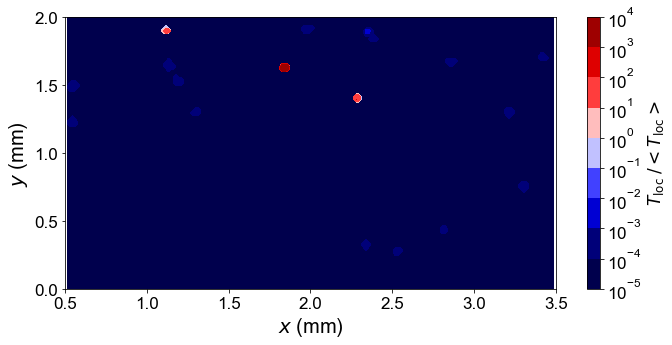


-----------------------------------------------------


Read granular temperature at 332


Reading particle info 332...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 332 successful

Read coordinate done


Interpolation done



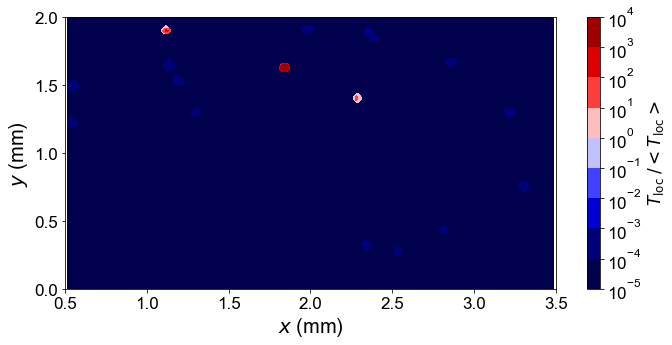


-----------------------------------------------------


Read granular temperature at 333


Reading particle info 333...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 333 successful

Read coordinate done


Interpolation done



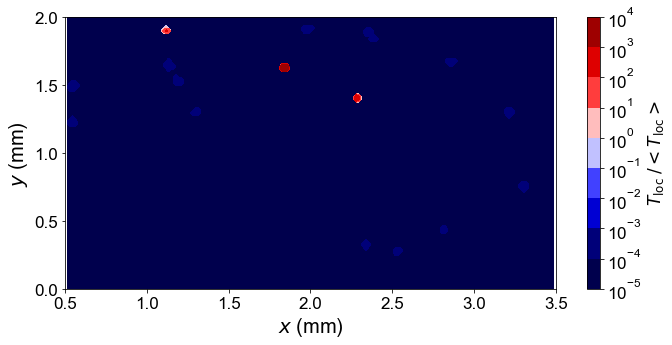


-----------------------------------------------------


Read granular temperature at 334


Reading particle info 334...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 334 successful

Read coordinate done


Interpolation done



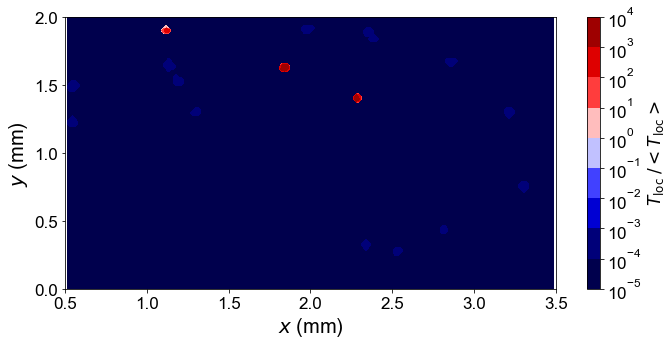


-----------------------------------------------------


Read granular temperature at 335


Reading particle info 335...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 335 successful

Read coordinate done


Interpolation done



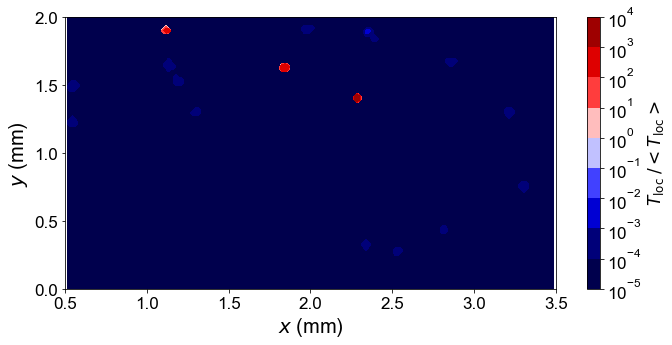


-----------------------------------------------------


Read granular temperature at 336


Reading particle info 336...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 336 successful

Read coordinate done


Interpolation done



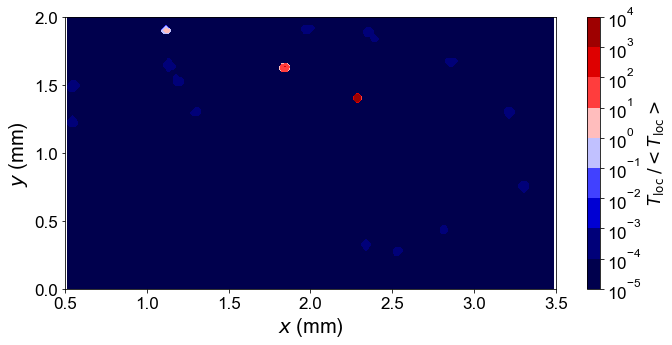


-----------------------------------------------------


Read granular temperature at 337


Reading particle info 337...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 337 successful

Read coordinate done


Interpolation done



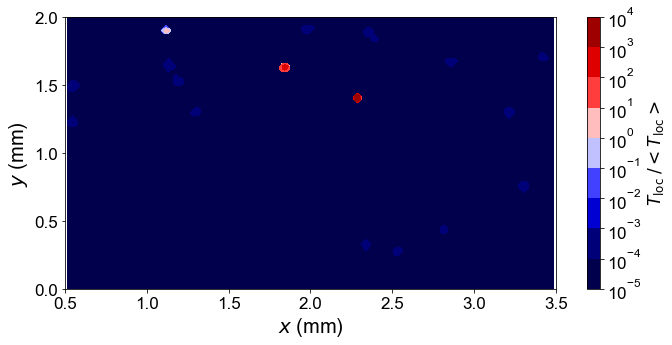


-----------------------------------------------------


Read granular temperature at 338


Reading particle info 338...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 338 successful

Read coordinate done


Interpolation done



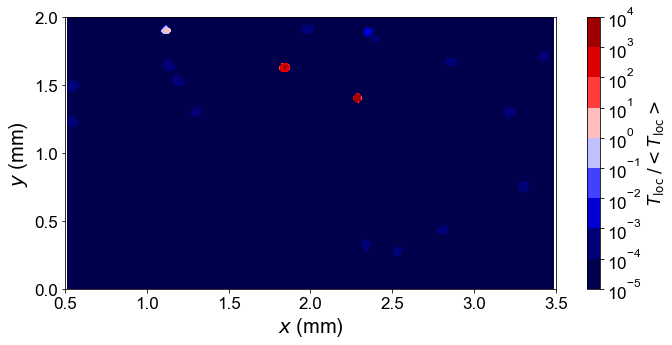


-----------------------------------------------------


Read granular temperature at 339


Reading particle info 339...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 339 successful

Read coordinate done


Interpolation done



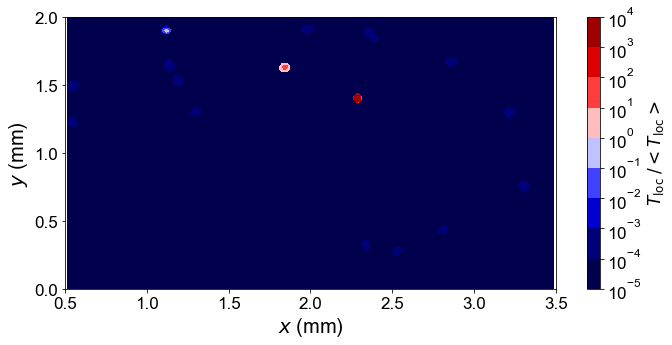


-----------------------------------------------------


Read granular temperature at 340


Reading particle info 340...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 340 successful

Read coordinate done


Interpolation done



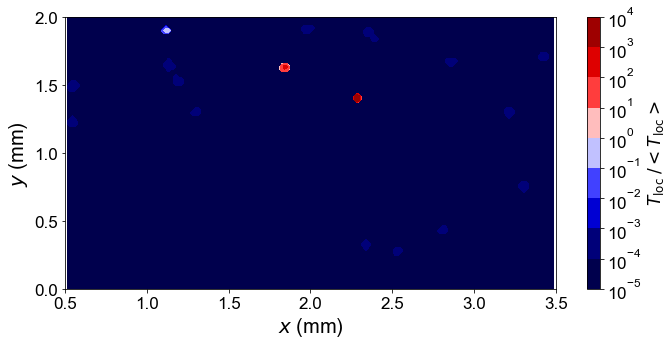


-----------------------------------------------------


Read granular temperature at 341


Reading particle info 341...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 341 successful

Read coordinate done


Interpolation done



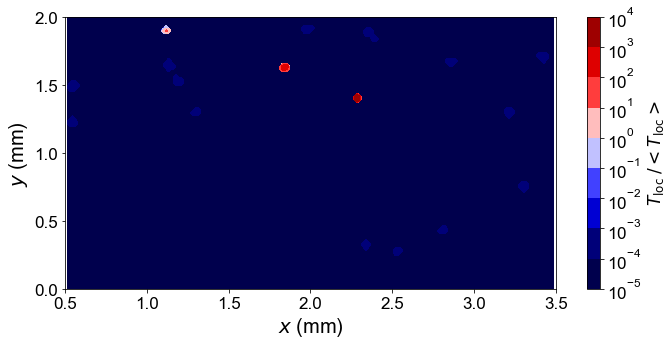


-----------------------------------------------------


Read granular temperature at 342


Reading particle info 342...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 342 successful

Read coordinate done


Interpolation done



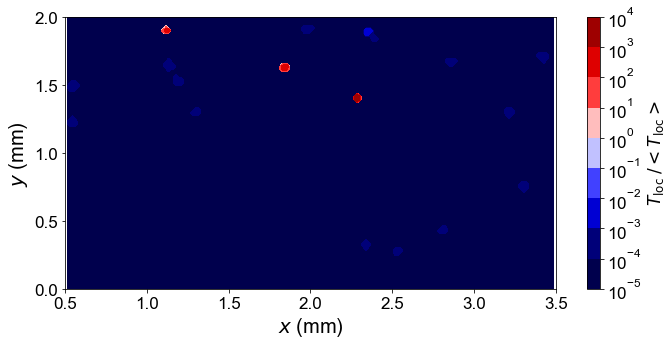


-----------------------------------------------------


Read granular temperature at 343


Reading particle info 343...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 343 successful

Read coordinate done


Interpolation done



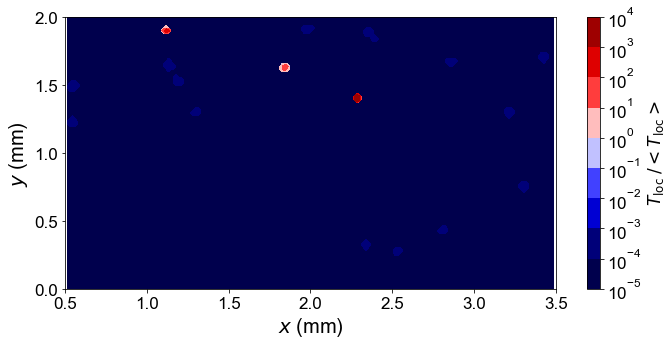


-----------------------------------------------------


Read granular temperature at 344


Reading particle info 344...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 344 successful

Read coordinate done


Interpolation done



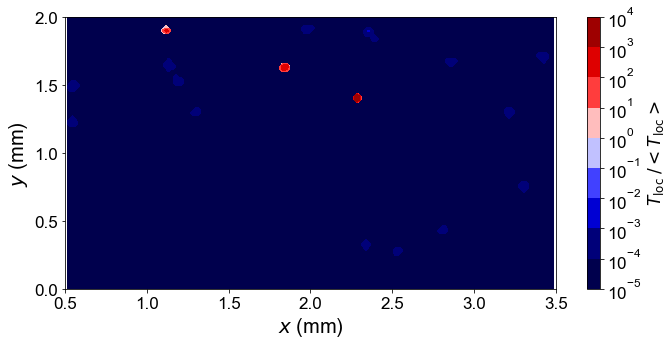


-----------------------------------------------------


Read granular temperature at 345


Reading particle info 345...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 345 successful

Read coordinate done


Interpolation done



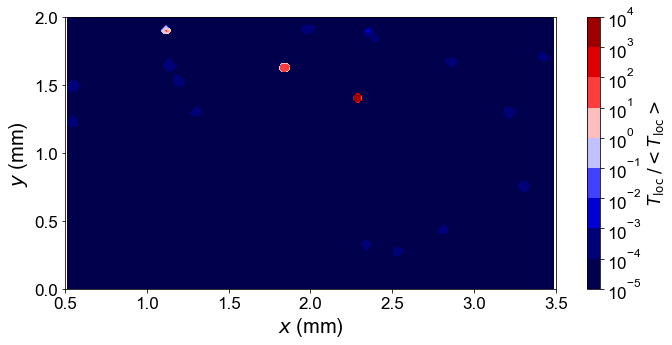


-----------------------------------------------------


Read granular temperature at 346


Reading particle info 346...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 346 successful

Read coordinate done


Interpolation done



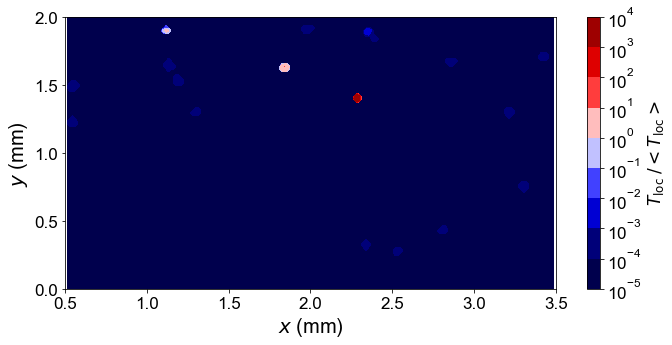


-----------------------------------------------------


Read granular temperature at 347


Reading particle info 347...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 347 successful

Read coordinate done


Interpolation done



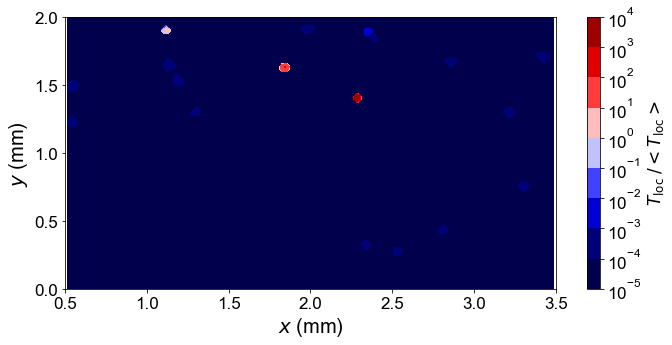


-----------------------------------------------------


Read granular temperature at 348


Reading particle info 348...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 348 successful

Read coordinate done


Interpolation done



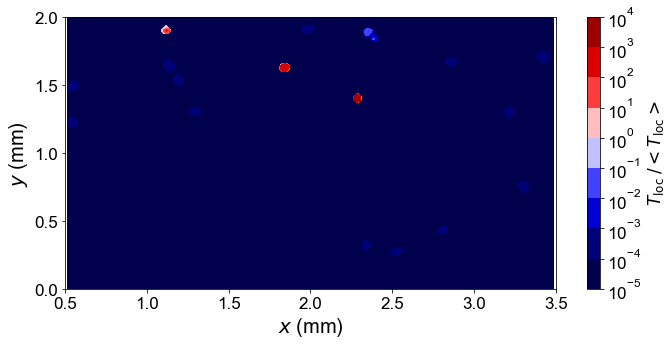


-----------------------------------------------------


Read granular temperature at 349


Reading particle info 349...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 349 successful

Read coordinate done


Interpolation done



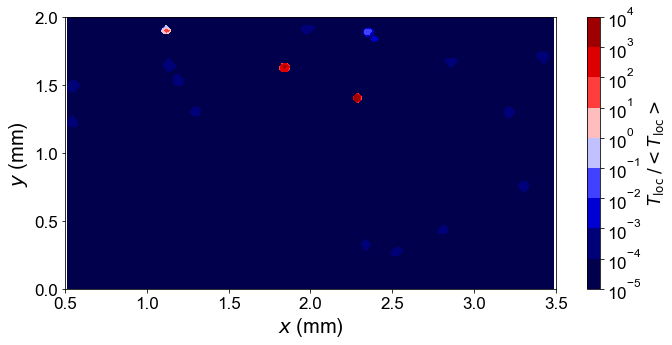


-----------------------------------------------------


Read granular temperature at 350


Reading particle info 350...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 350 successful

Read coordinate done


Interpolation done



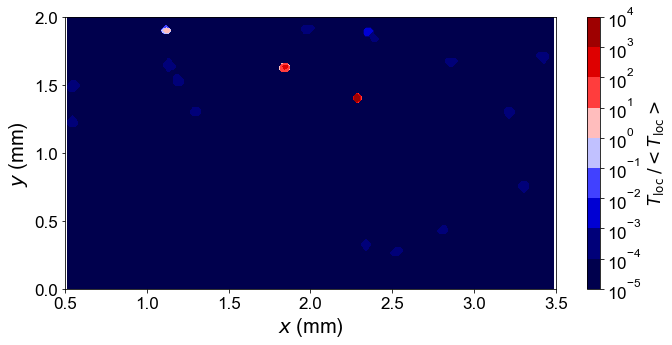


-----------------------------------------------------


Read granular temperature at 351


Reading particle info 351...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 351 successful

Read coordinate done


Interpolation done



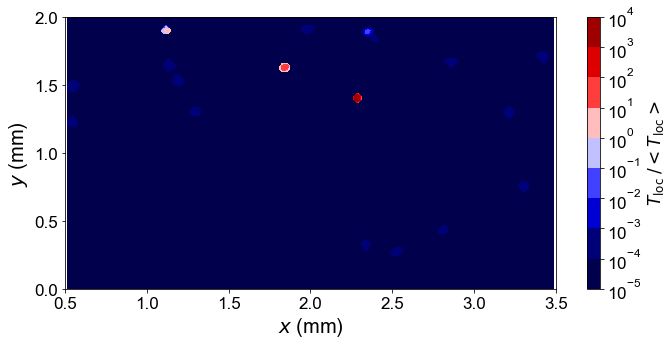


-----------------------------------------------------


Read granular temperature at 352


Reading particle info 352...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 352 successful

Read coordinate done


Interpolation done



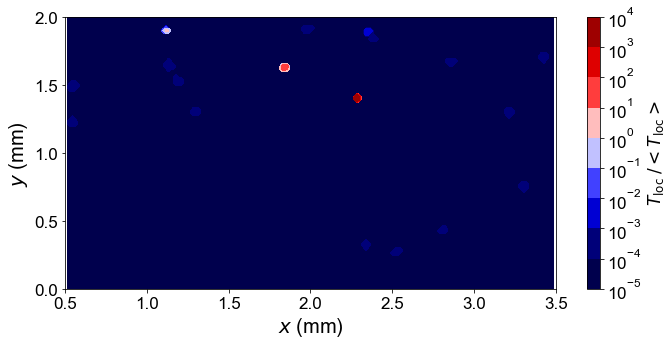


-----------------------------------------------------


Read granular temperature at 353


Reading particle info 353...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 353 successful

Read coordinate done


Interpolation done



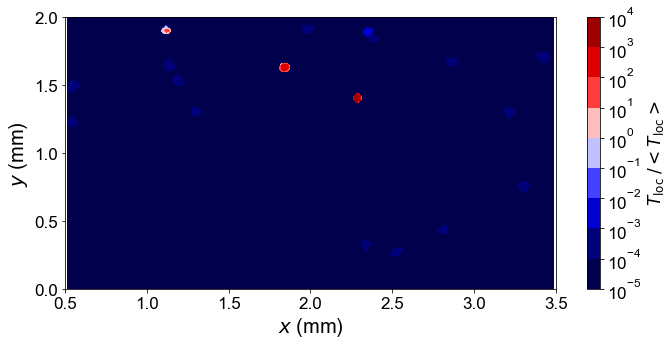


-----------------------------------------------------


Read granular temperature at 354


Reading particle info 354...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 354 successful

Read coordinate done


Interpolation done



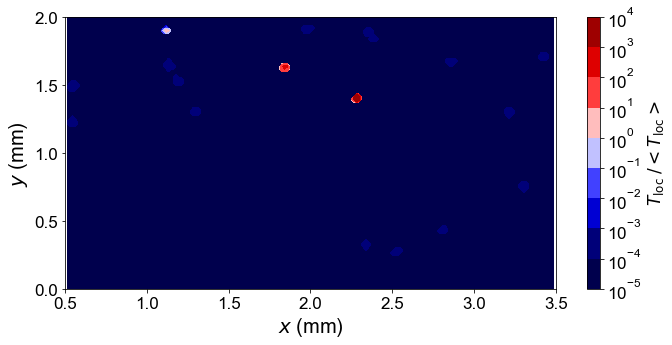


-----------------------------------------------------


Read granular temperature at 355


Reading particle info 355...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 355 successful

Read coordinate done


Interpolation done



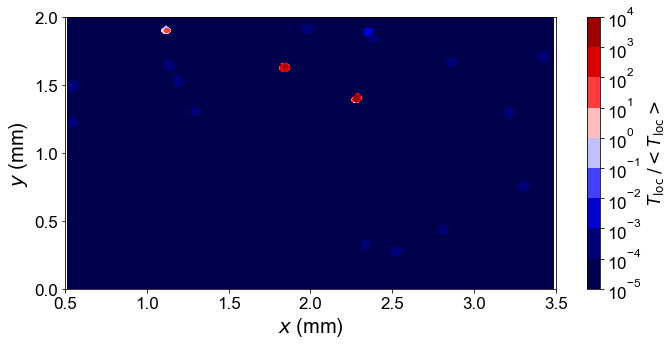


-----------------------------------------------------


Read granular temperature at 356


Reading particle info 356...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 356 successful

Read coordinate done


Interpolation done



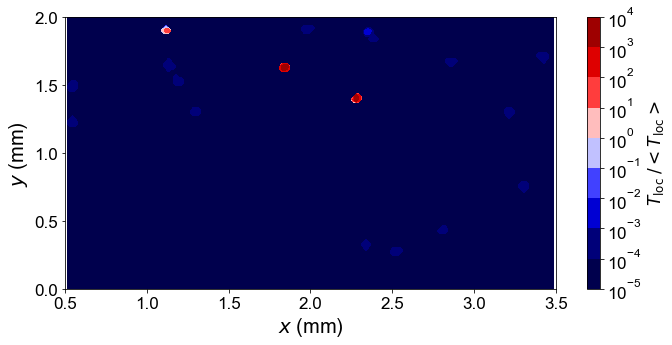


-----------------------------------------------------


Read granular temperature at 357


Reading particle info 357...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 357 successful

Read coordinate done


Interpolation done



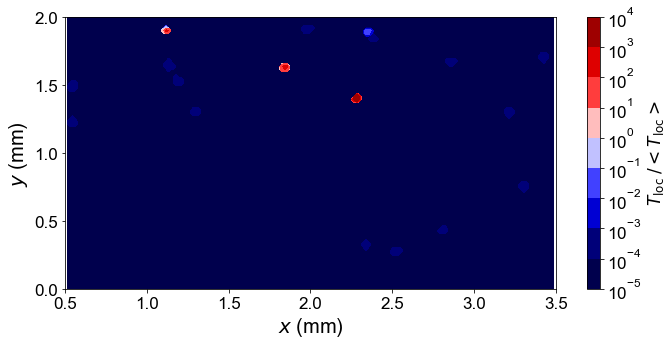


-----------------------------------------------------


Read granular temperature at 358


Reading particle info 358...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 358 successful

Read coordinate done


Interpolation done



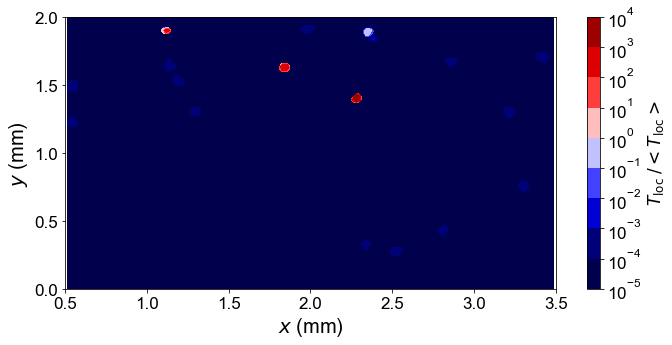


-----------------------------------------------------


Read granular temperature at 359


Reading particle info 359...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 359 successful

Read coordinate done


Interpolation done



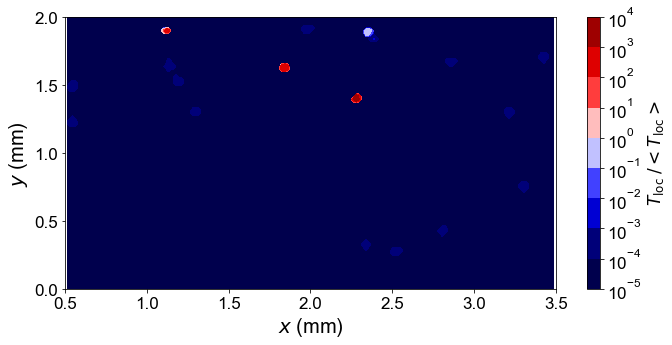


-----------------------------------------------------


Read granular temperature at 360


Reading particle info 360...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 360 successful

Read coordinate done


Interpolation done



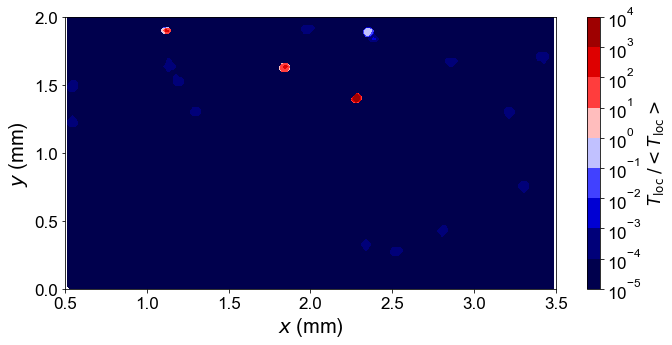


-----------------------------------------------------


Read granular temperature at 361


Reading particle info 361...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 361 successful

Read coordinate done


Interpolation done



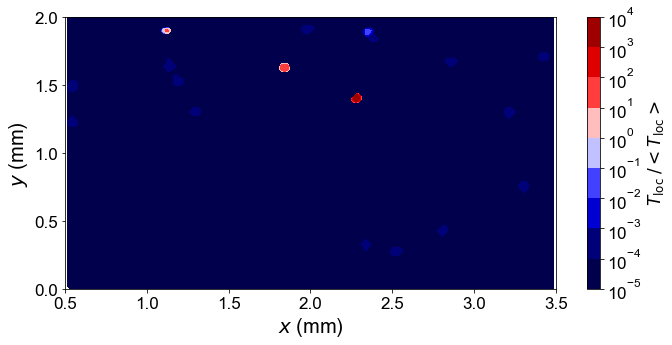


-----------------------------------------------------


Read granular temperature at 362


Reading particle info 362...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 362 successful

Read coordinate done


Interpolation done



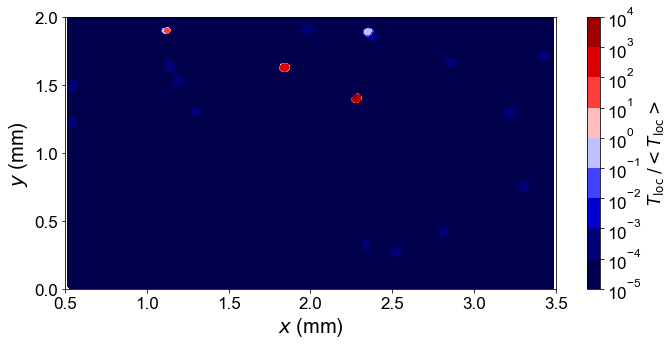


-----------------------------------------------------


Read granular temperature at 363


Reading particle info 363...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 363 successful

Read coordinate done


Interpolation done



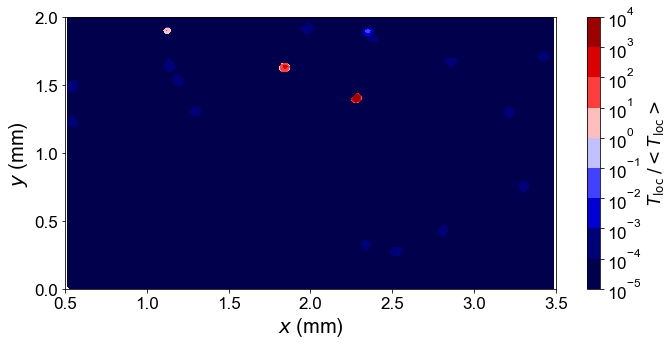


-----------------------------------------------------


Read granular temperature at 364


Reading particle info 364...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 364 successful

Read coordinate done


Interpolation done



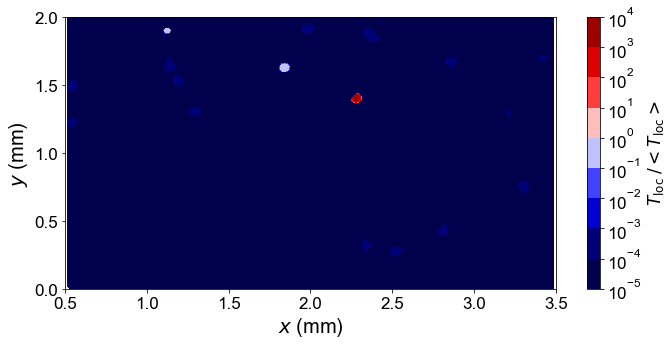


-----------------------------------------------------


Read granular temperature at 365


Reading particle info 365...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 365 successful

Read coordinate done


Interpolation done



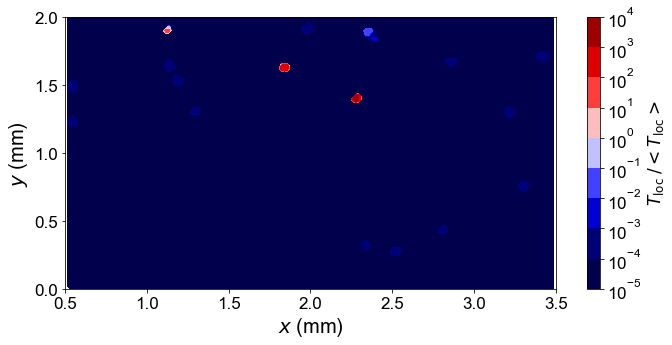


-----------------------------------------------------


Read granular temperature at 366


Reading particle info 366...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 366 successful

Read coordinate done


Interpolation done



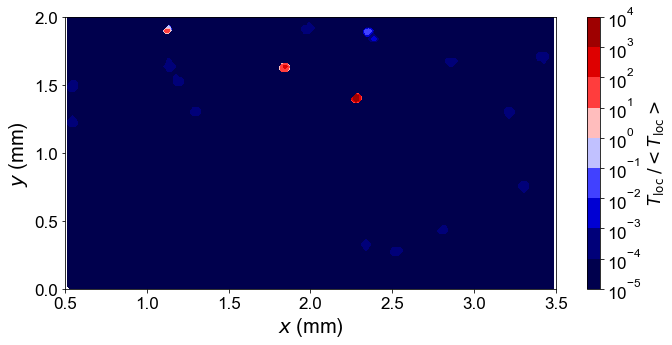


-----------------------------------------------------


Read granular temperature at 367


Reading particle info 367...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 367 successful

Read coordinate done


Interpolation done



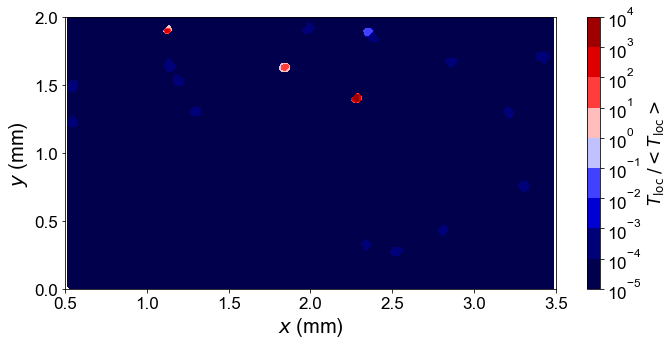


-----------------------------------------------------


Read granular temperature at 368


Reading particle info 368...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 368 successful

Read coordinate done


Interpolation done



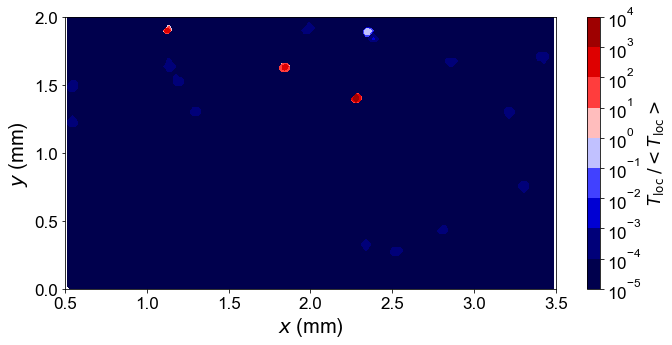


-----------------------------------------------------


Read granular temperature at 369


Reading particle info 369...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 369 successful

Read coordinate done


Interpolation done



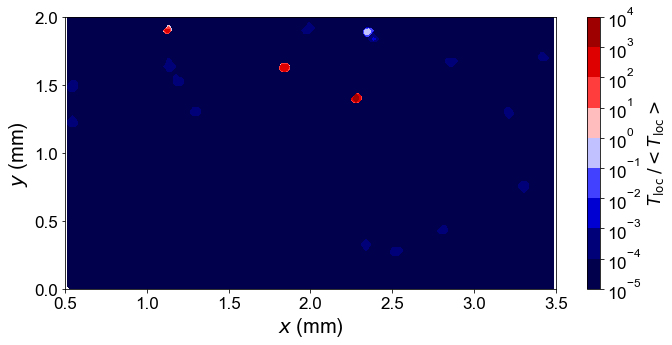


-----------------------------------------------------


Read granular temperature at 370


Reading particle info 370...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 370 successful

Read coordinate done


Interpolation done



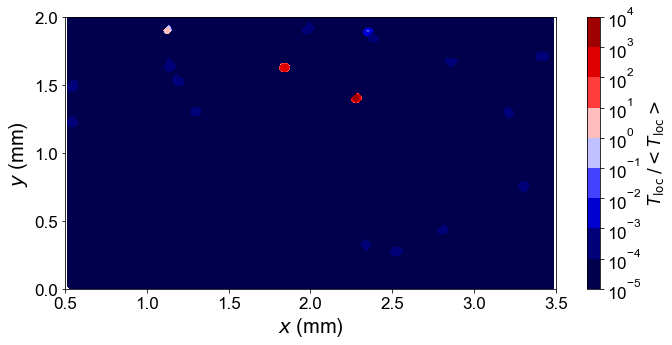


-----------------------------------------------------


Read granular temperature at 371


Reading particle info 371...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 371 successful

Read coordinate done


Interpolation done



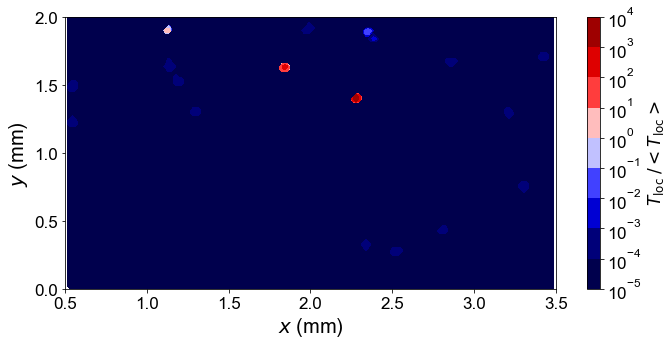


-----------------------------------------------------


Read granular temperature at 372


Reading particle info 372...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 372 successful

Read coordinate done


Interpolation done



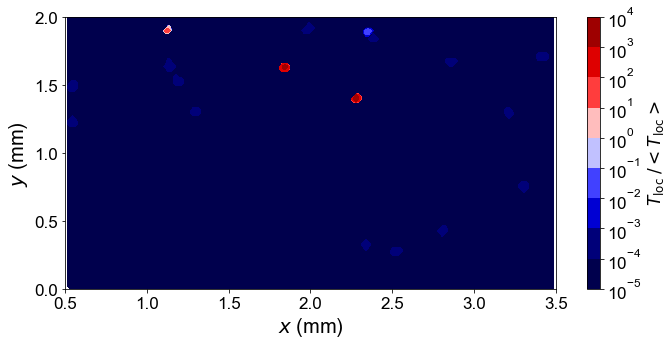


-----------------------------------------------------


Read granular temperature at 373


Reading particle info 373...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 373 successful

Read coordinate done


Interpolation done



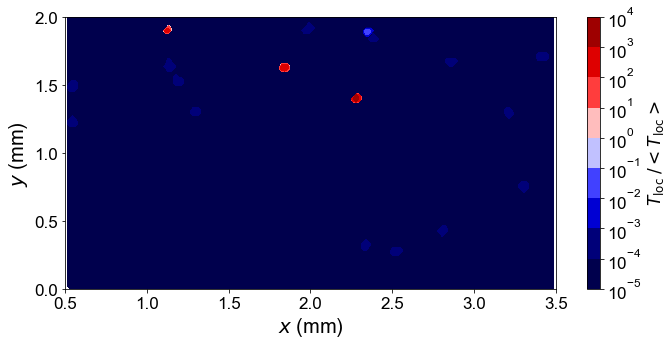


-----------------------------------------------------


Read granular temperature at 374


Reading particle info 374...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 374 successful

Read coordinate done


Interpolation done



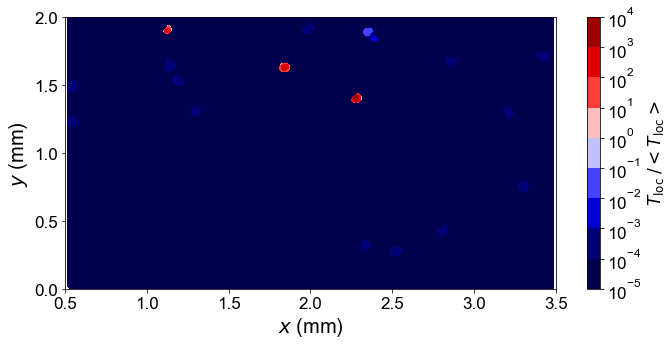


-----------------------------------------------------


Read granular temperature at 375


Reading particle info 375...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 375 successful

Read coordinate done


Interpolation done



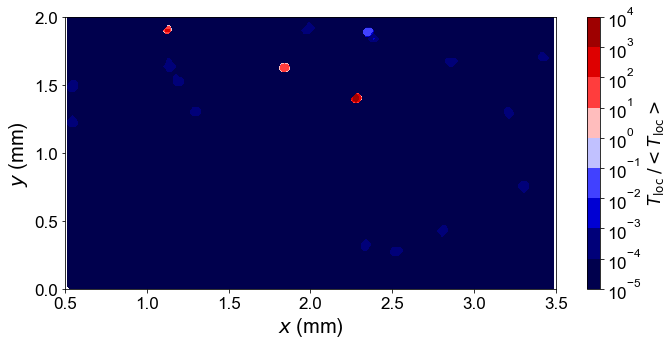


-----------------------------------------------------


Read granular temperature at 376


Reading particle info 376...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 376 successful

Read coordinate done


Interpolation done



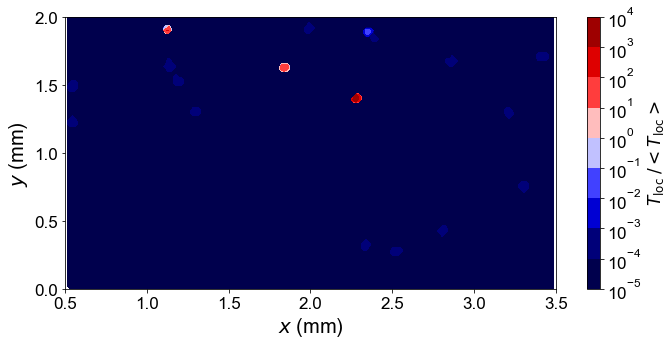


-----------------------------------------------------


Read granular temperature at 377


Reading particle info 377...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 377 successful

Read coordinate done


Interpolation done



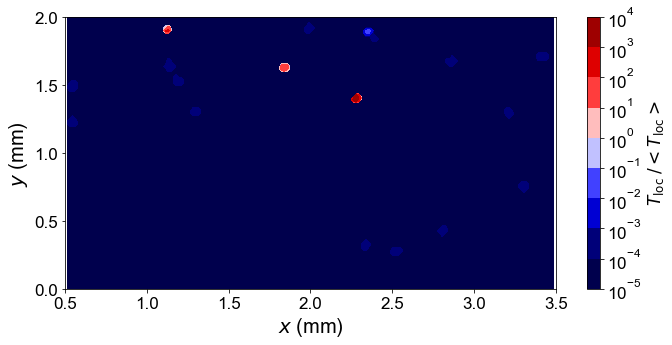


-----------------------------------------------------


Read granular temperature at 378


Reading particle info 378...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 378 successful

Read coordinate done


Interpolation done



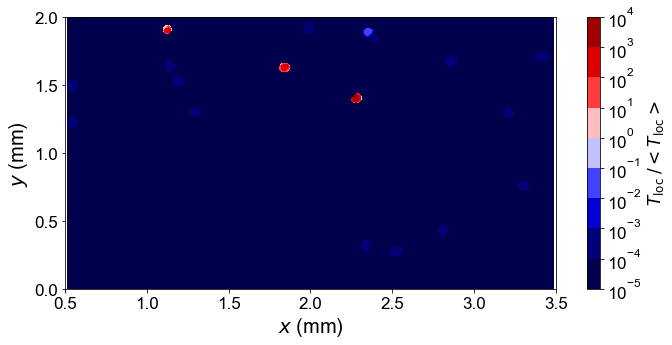


-----------------------------------------------------


Read granular temperature at 379


Reading particle info 379...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 379 successful

Read coordinate done


Interpolation done



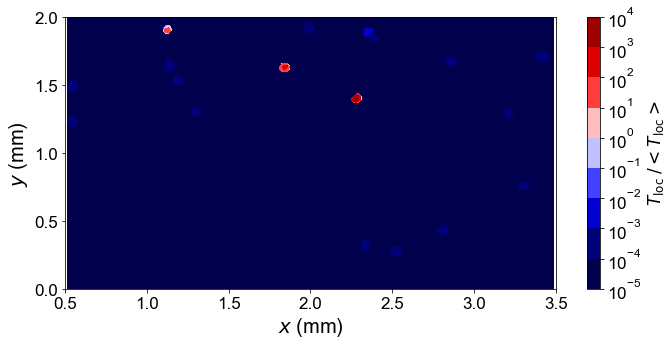


-----------------------------------------------------


Read granular temperature at 380


Reading particle info 380...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 380 successful

Read coordinate done


Interpolation done



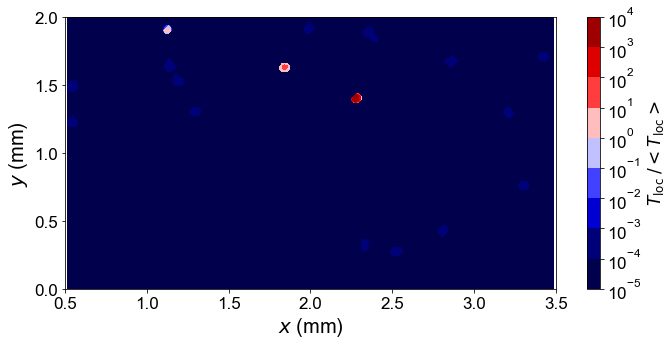


-----------------------------------------------------


Read granular temperature at 381


Reading particle info 381...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 381 successful

Read coordinate done


Interpolation done



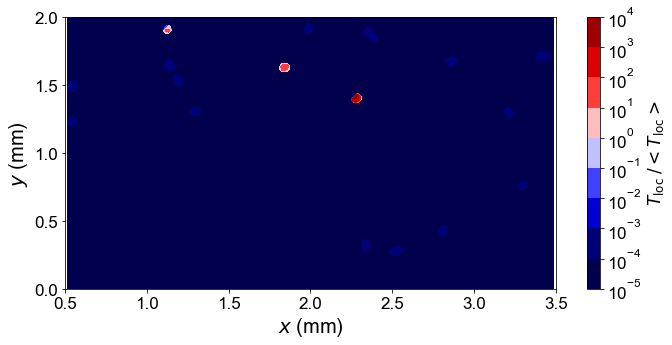


-----------------------------------------------------


Read granular temperature at 382


Reading particle info 382...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 382 successful

Read coordinate done


Interpolation done



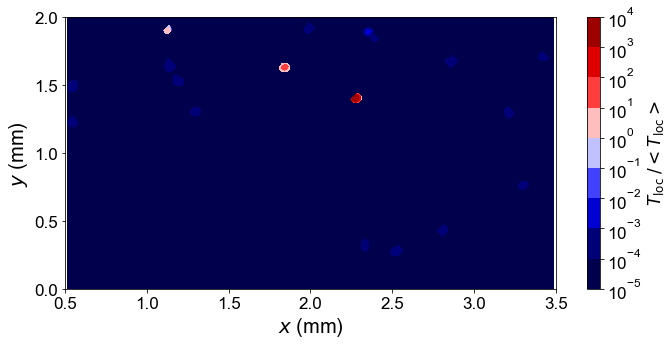


-----------------------------------------------------


Read granular temperature at 383


Reading particle info 383...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 383 successful

Read coordinate done


Interpolation done



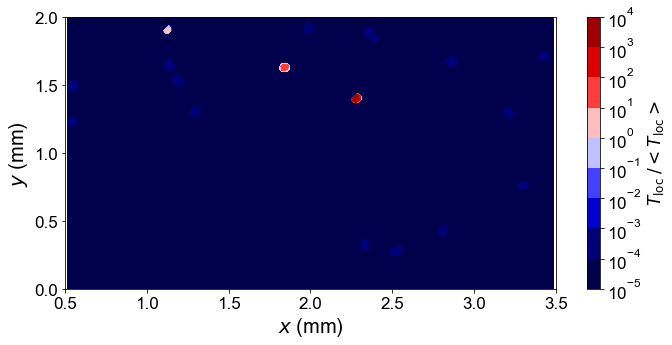


-----------------------------------------------------


Read granular temperature at 384


Reading particle info 384...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 384 successful

Read coordinate done


Interpolation done



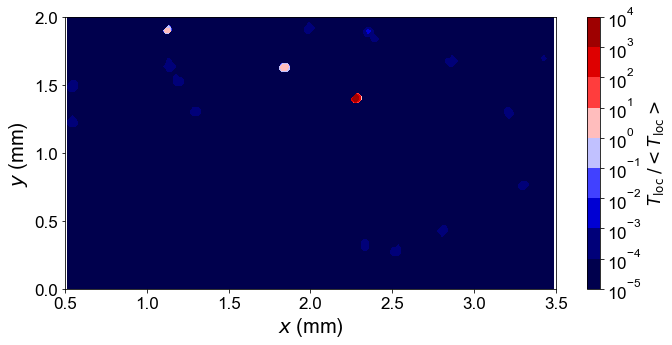


-----------------------------------------------------


Read granular temperature at 385


Reading particle info 385...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 385 successful

Read coordinate done


Interpolation done



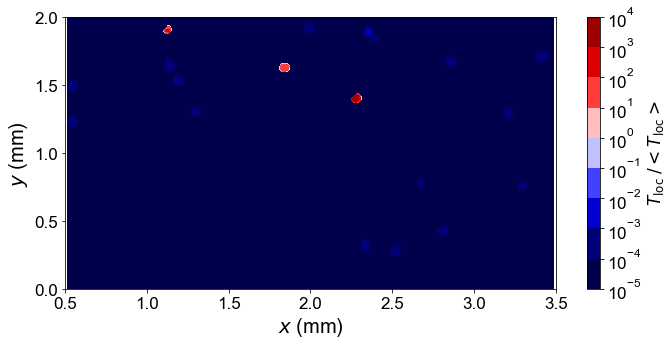


-----------------------------------------------------


Read granular temperature at 386


Reading particle info 386...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 386 successful

Read coordinate done


Interpolation done



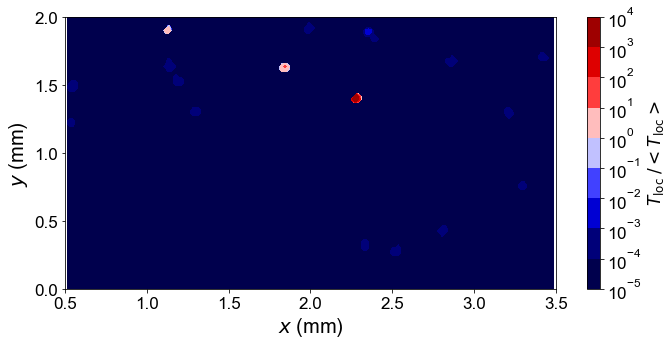


-----------------------------------------------------


Read granular temperature at 387


Reading particle info 387...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 387 successful

Read coordinate done


Interpolation done



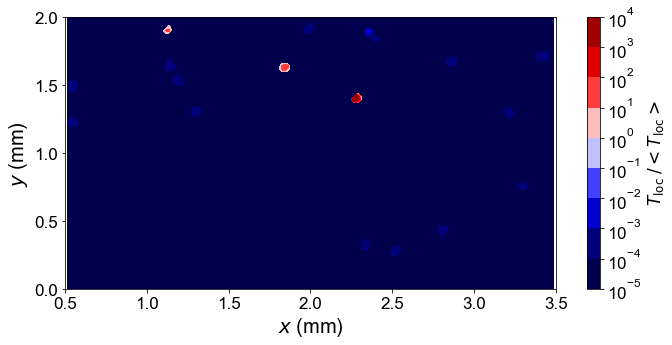


-----------------------------------------------------


Read granular temperature at 388


Reading particle info 388...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 388 successful

Read coordinate done


Interpolation done



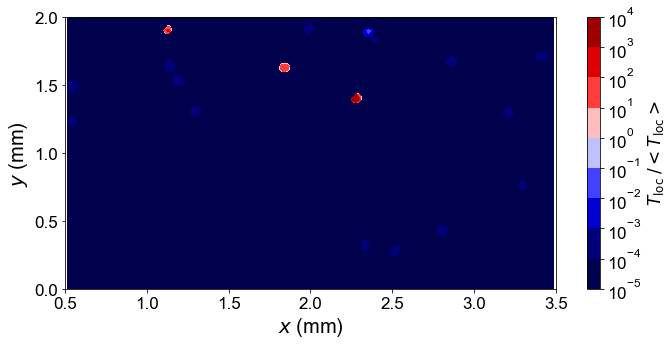


-----------------------------------------------------


Read granular temperature at 389


Reading particle info 389...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 389 successful

Read coordinate done


Interpolation done



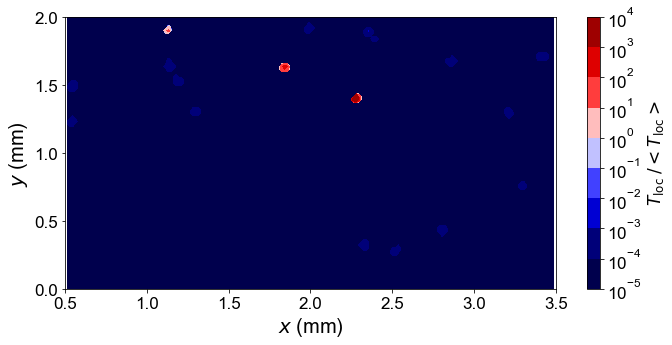


-----------------------------------------------------


Read granular temperature at 390


Reading particle info 390...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 390 successful

Read coordinate done


Interpolation done



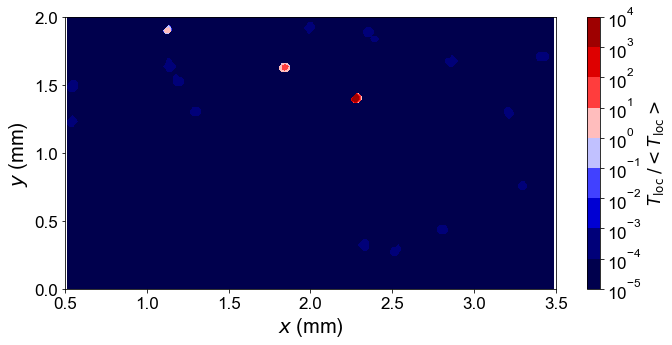


-----------------------------------------------------


Read granular temperature at 391


Reading particle info 391...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 391 successful

Read coordinate done


Interpolation done



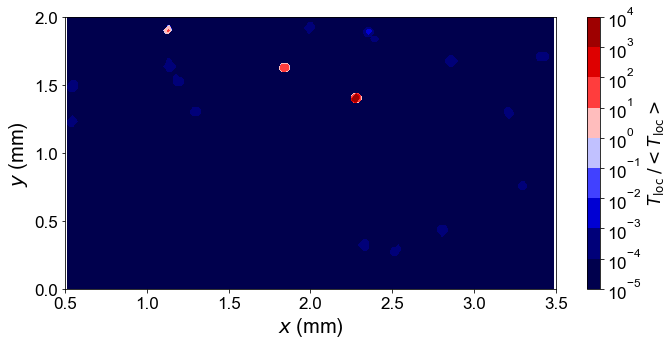


-----------------------------------------------------


Read granular temperature at 392


Reading particle info 392...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 392 successful

Read coordinate done


Interpolation done



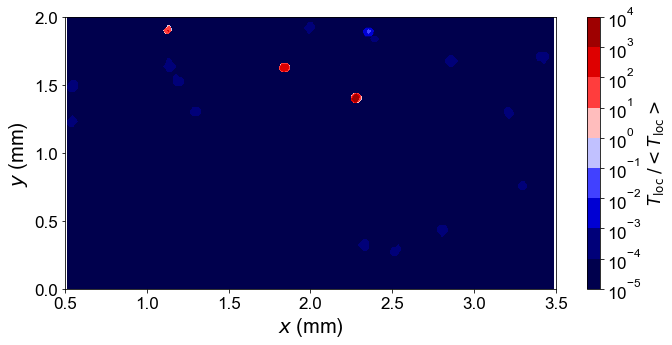


-----------------------------------------------------


Read granular temperature at 393


Reading particle info 393...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 393 successful

Read coordinate done


Interpolation done



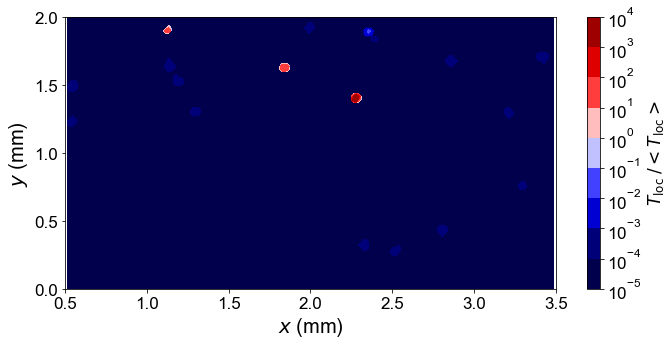


-----------------------------------------------------


Read granular temperature at 394


Reading particle info 394...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 394 successful

Read coordinate done


Interpolation done



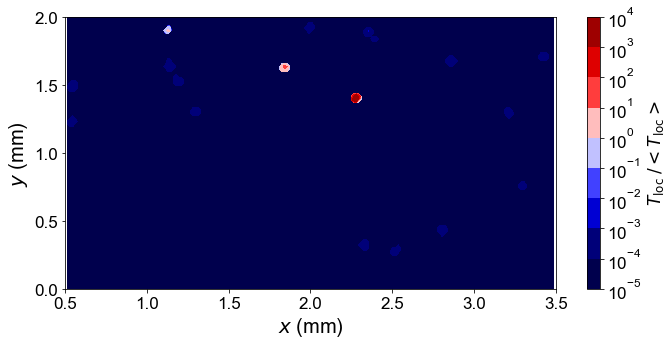


-----------------------------------------------------


Read granular temperature at 395


Reading particle info 395...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 395 successful

Read coordinate done


Interpolation done



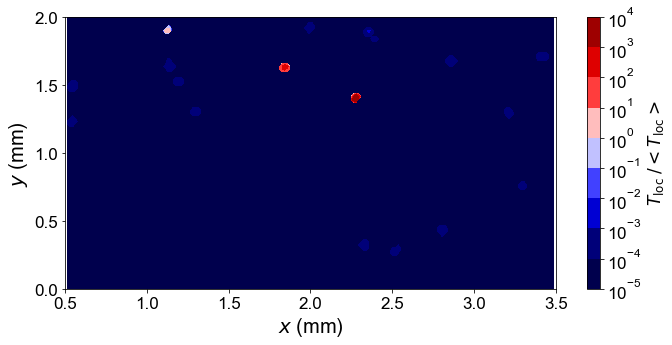


-----------------------------------------------------


Read granular temperature at 396


Reading particle info 396...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 396 successful

Read coordinate done


Interpolation done



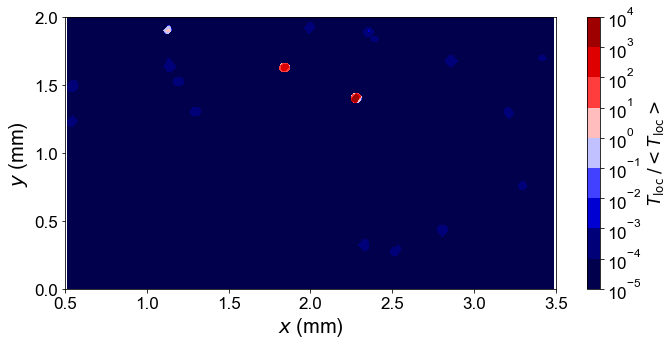


-----------------------------------------------------


Read granular temperature at 397


Reading particle info 397...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 397 successful

Read coordinate done


Interpolation done



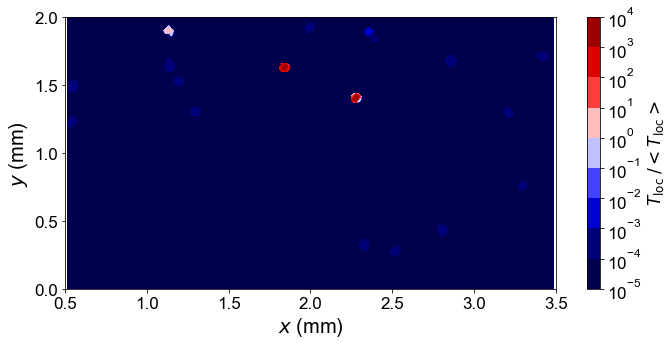


-----------------------------------------------------


Read granular temperature at 398


Reading particle info 398...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 398 successful

Read coordinate done


Interpolation done



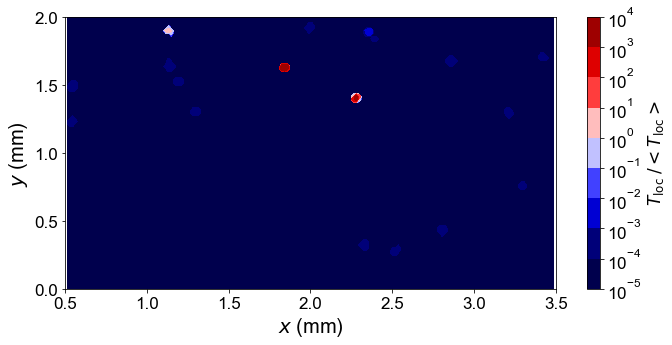


-----------------------------------------------------


Read granular temperature at 399


Reading particle info 399...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 399 successful

Read coordinate done


Interpolation done



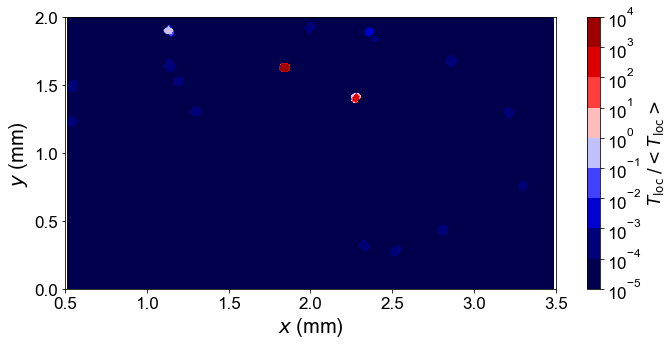


-----------------------------------------------------


Read granular temperature at 400


Reading particle info 400...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 400 successful

Read coordinate done


Interpolation done



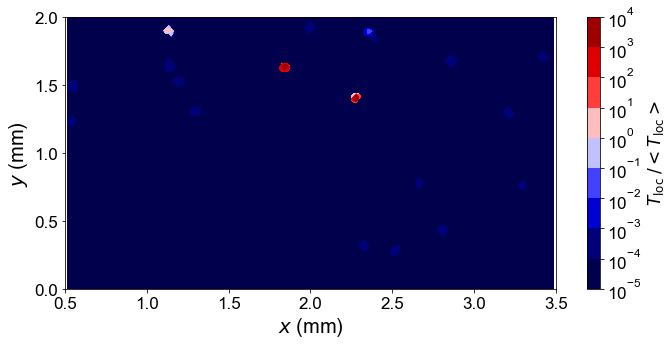


-----------------------------------------------------


Read granular temperature at 401


Reading particle info 401...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 401 successful

Read coordinate done


Interpolation done



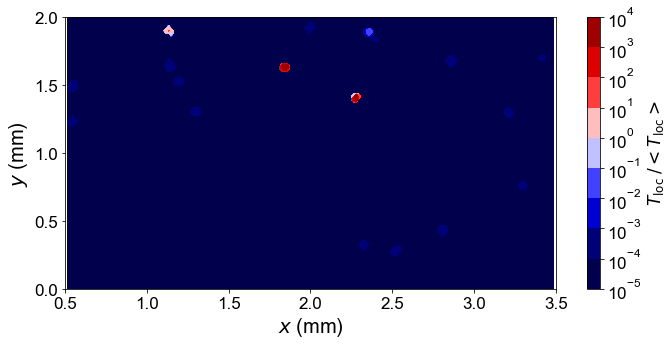


-----------------------------------------------------


Read granular temperature at 402


Reading particle info 402...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 402 successful

Read coordinate done


Interpolation done



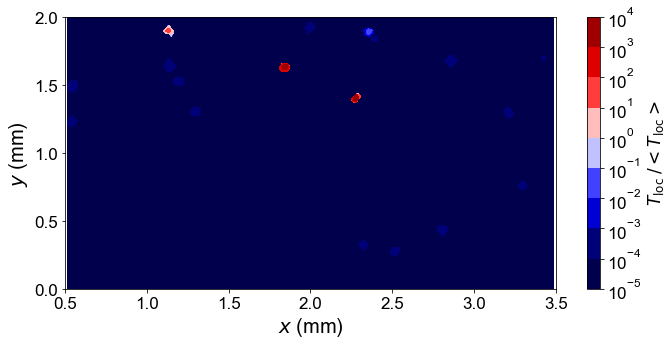


-----------------------------------------------------


Read granular temperature at 403


Reading particle info 403...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 403 successful

Read coordinate done


Interpolation done



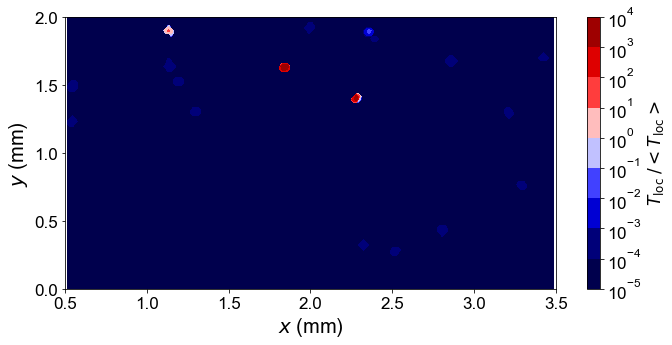


-----------------------------------------------------


Read granular temperature at 404


Reading particle info 404...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 404 successful

Read coordinate done


Interpolation done



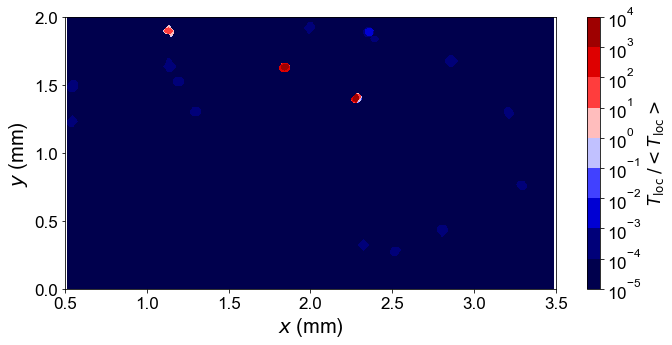


-----------------------------------------------------


Read granular temperature at 405


Reading particle info 405...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 405 successful

Read coordinate done


Interpolation done



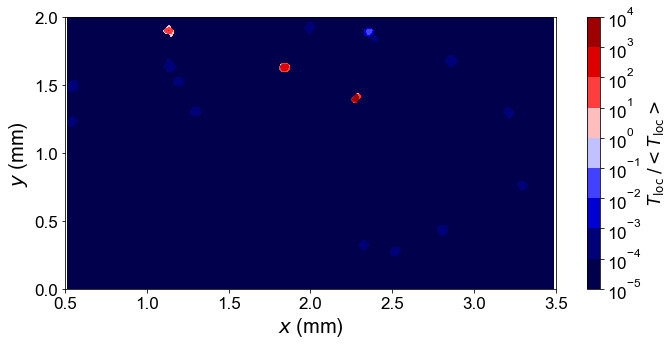


-----------------------------------------------------


Read granular temperature at 406


Reading particle info 406...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 406 successful

Read coordinate done


Interpolation done



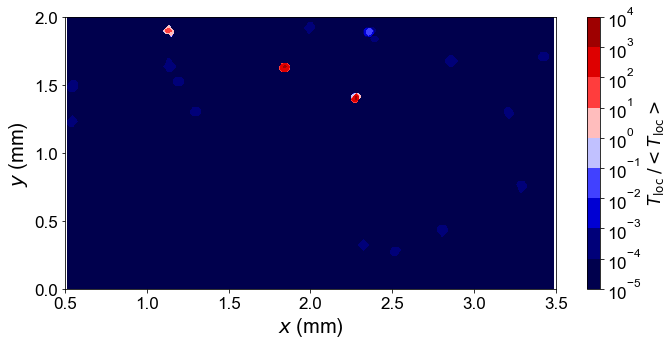


-----------------------------------------------------


Read granular temperature at 407


Reading particle info 407...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 407 successful

Read coordinate done


Interpolation done



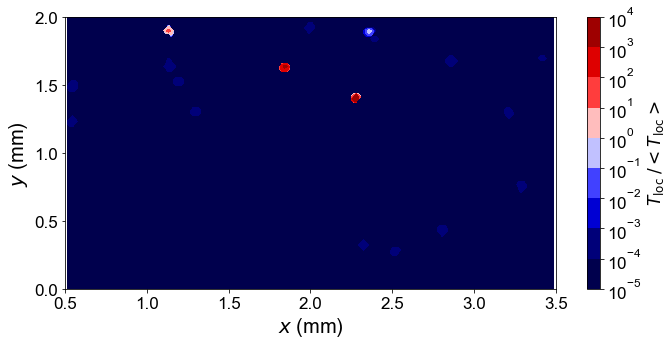


-----------------------------------------------------


Read granular temperature at 408


Reading particle info 408...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 408 successful

Read coordinate done


Interpolation done



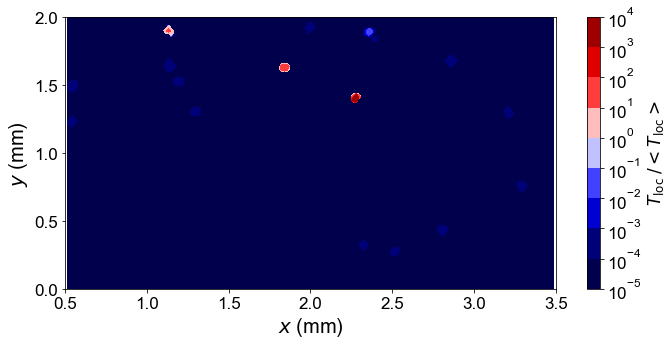


-----------------------------------------------------


Read granular temperature at 409


Reading particle info 409...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 409 successful

Read coordinate done


Interpolation done



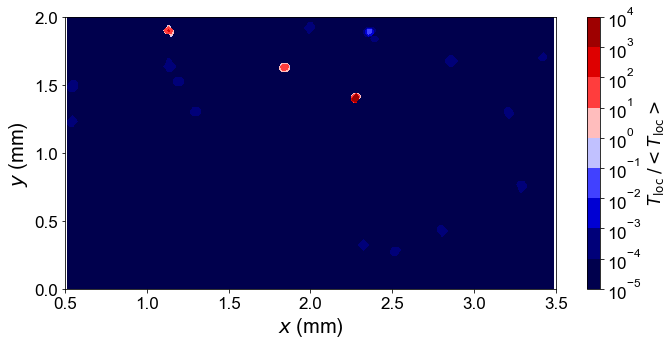


-----------------------------------------------------


Read granular temperature at 410


Reading particle info 410...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 410 successful

Read coordinate done


Interpolation done



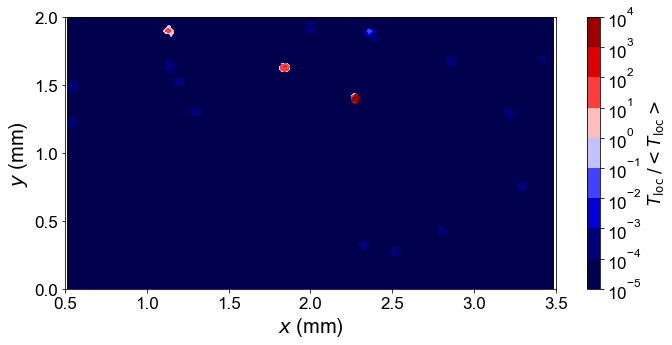


-----------------------------------------------------


Read granular temperature at 411


Reading particle info 411...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 411 successful

Read coordinate done


Interpolation done



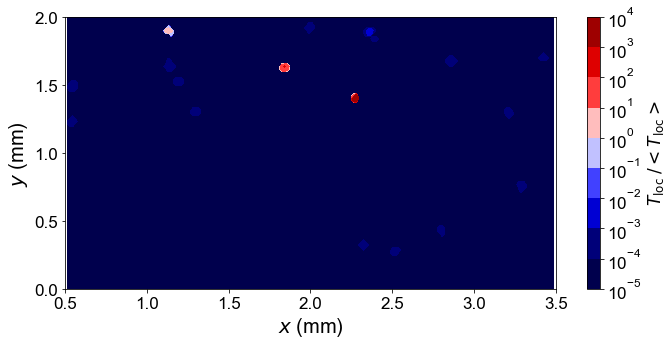


-----------------------------------------------------


Read granular temperature at 412


Reading particle info 412...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 412 successful

Read coordinate done


Interpolation done



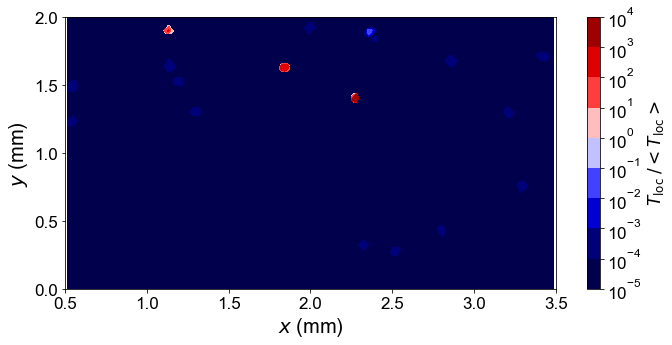


-----------------------------------------------------


Read granular temperature at 413


Reading particle info 413...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 413 successful

Read coordinate done


Interpolation done



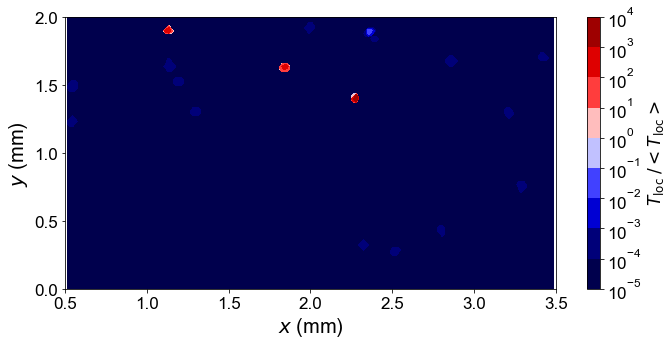


-----------------------------------------------------


Read granular temperature at 414


Reading particle info 414...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 414 successful

Read coordinate done


Interpolation done



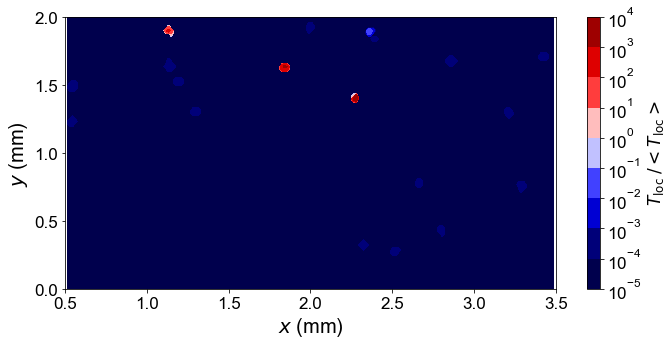


-----------------------------------------------------


Read granular temperature at 415


Reading particle info 415...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 415 successful

Read coordinate done


Interpolation done



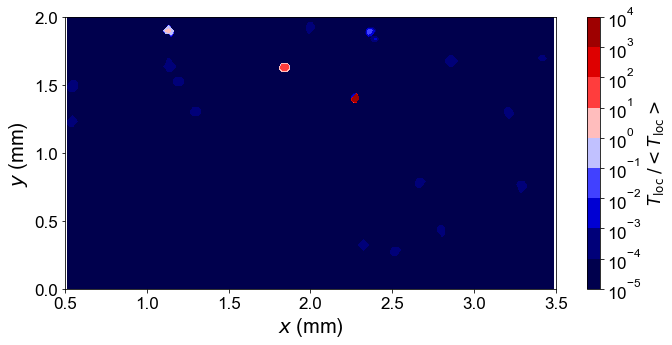


-----------------------------------------------------


Read granular temperature at 416


Reading particle info 416...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 416 successful

Read coordinate done


Interpolation done



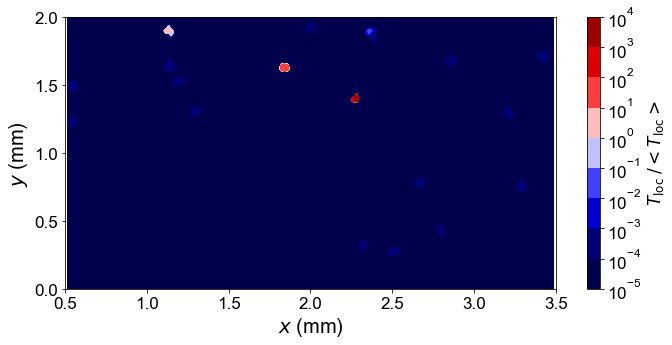


-----------------------------------------------------


Read granular temperature at 417


Reading particle info 417...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 417 successful

Read coordinate done


Interpolation done



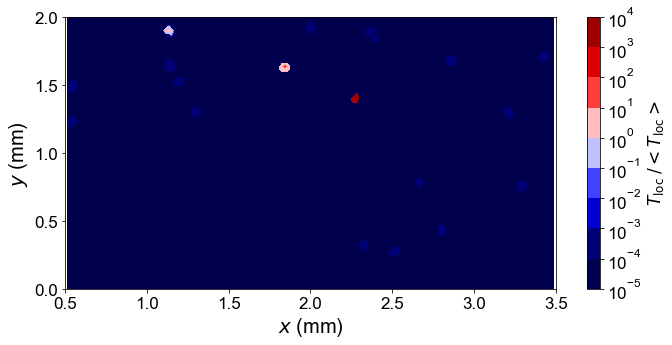


-----------------------------------------------------


Read granular temperature at 418


Reading particle info 418...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 418 successful

Read coordinate done


Interpolation done



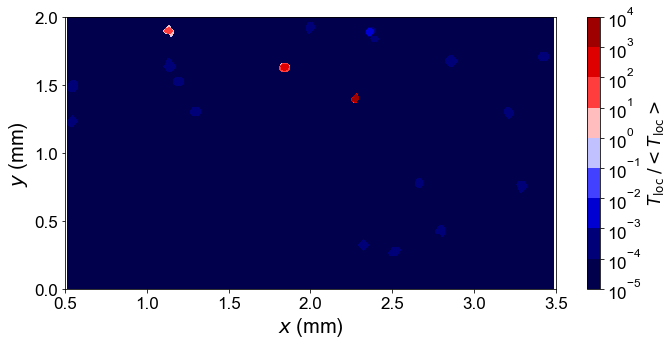


-----------------------------------------------------


Read granular temperature at 419


Reading particle info 419...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 419 successful

Read coordinate done


Interpolation done



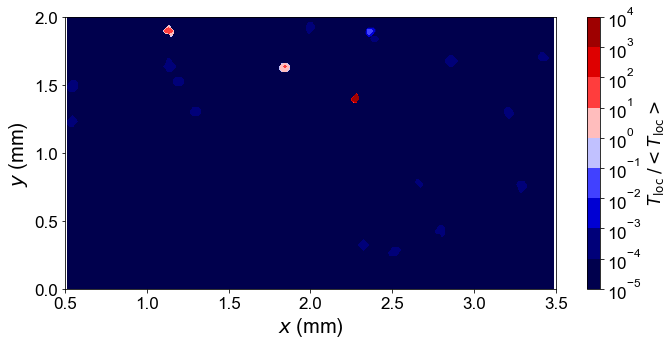


-----------------------------------------------------


Read granular temperature at 420


Reading particle info 420...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 420 successful

Read coordinate done


Interpolation done



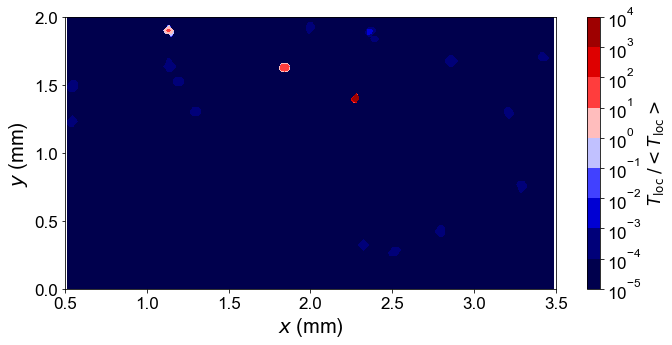


-----------------------------------------------------


Read granular temperature at 421


Reading particle info 421...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 421 successful

Read coordinate done


Interpolation done



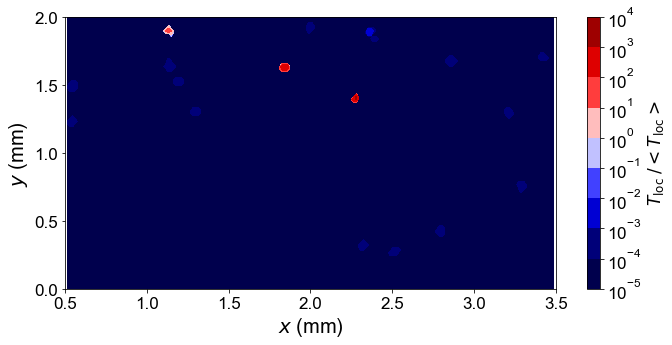


-----------------------------------------------------


Read granular temperature at 422


Reading particle info 422...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 422 successful

Read coordinate done


Interpolation done



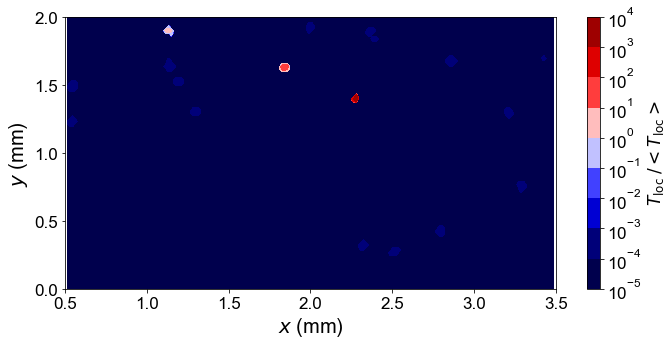


-----------------------------------------------------


Read granular temperature at 423


Reading particle info 423...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 423 successful

Read coordinate done


Interpolation done



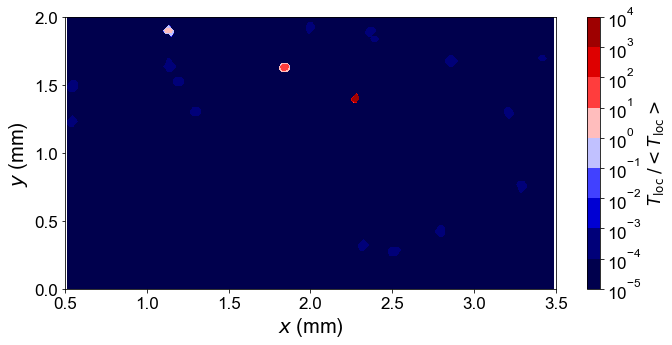


-----------------------------------------------------


Read granular temperature at 424


Reading particle info 424...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 424 successful

Read coordinate done


Interpolation done



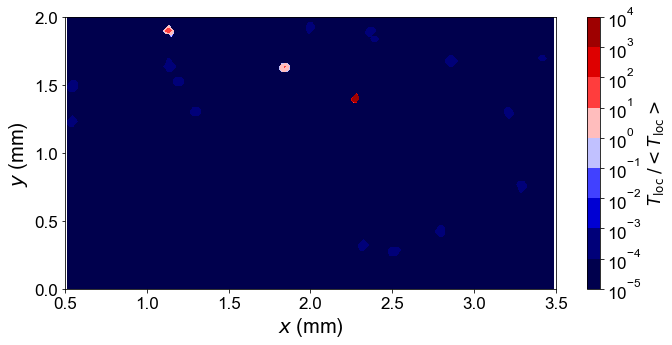


-----------------------------------------------------


Read granular temperature at 425


Reading particle info 425...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 425 successful

Read coordinate done


Interpolation done



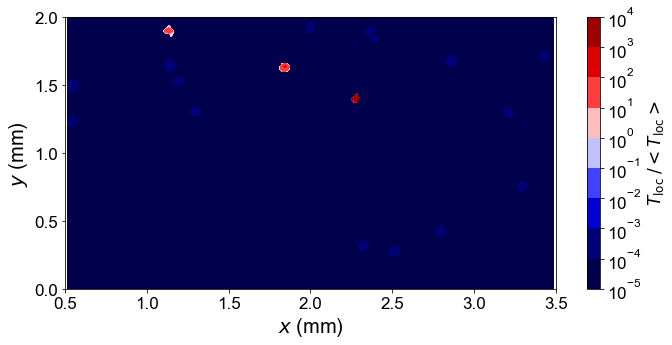


-----------------------------------------------------


Read granular temperature at 426


Reading particle info 426...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 426 successful

Read coordinate done


Interpolation done



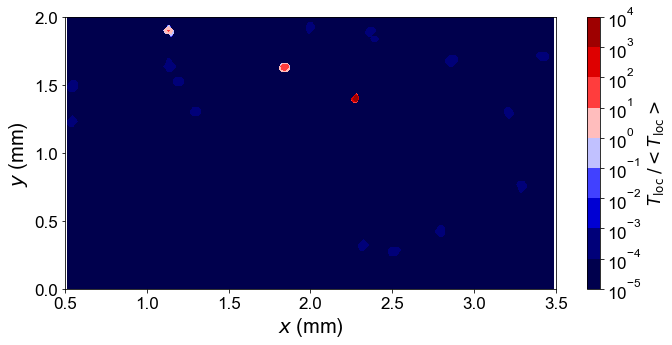


-----------------------------------------------------


Read granular temperature at 427


Reading particle info 427...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 427 successful

Read coordinate done


Interpolation done



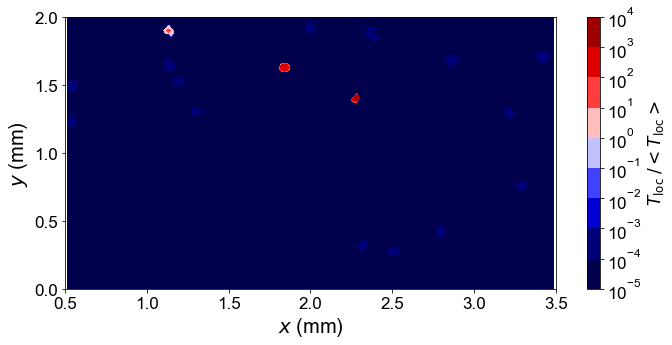


-----------------------------------------------------


Read granular temperature at 428


Reading particle info 428...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 428 successful

Read coordinate done


Interpolation done



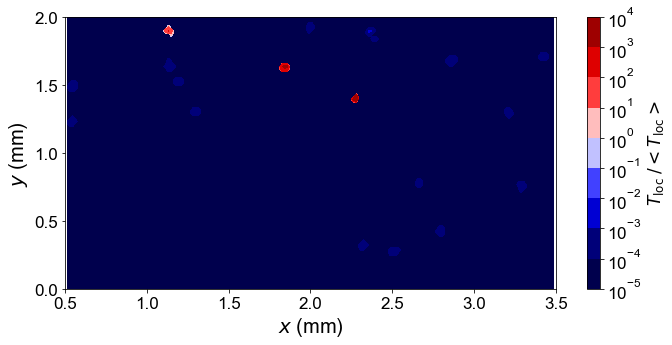


-----------------------------------------------------


Read granular temperature at 429


Reading particle info 429...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 429 successful

Read coordinate done


Interpolation done



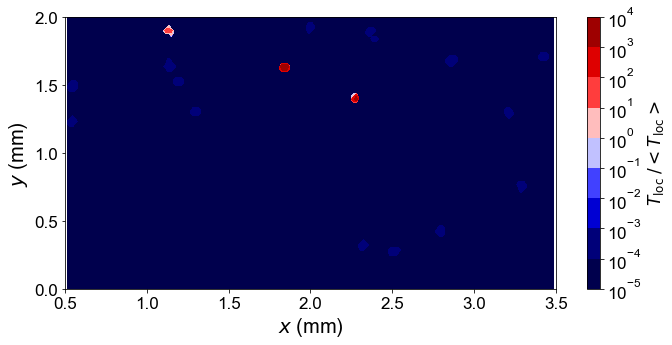


-----------------------------------------------------


Read granular temperature at 430


Reading particle info 430...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 430 successful

Read coordinate done


Interpolation done



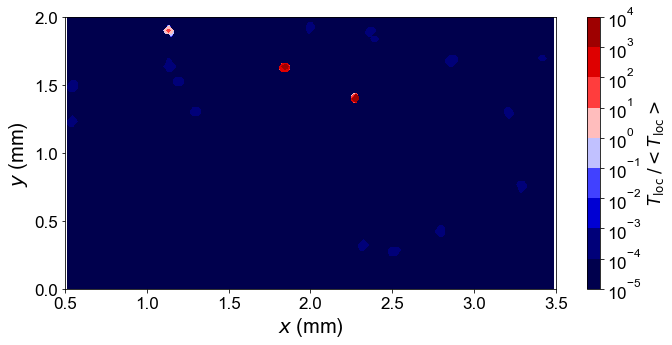


-----------------------------------------------------


Read granular temperature at 431


Reading particle info 431...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 431 successful

Read coordinate done


Interpolation done



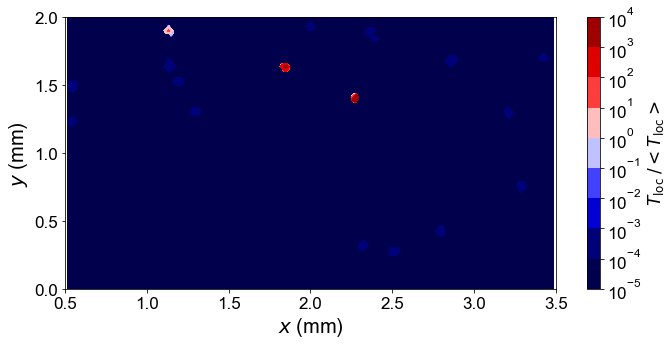


-----------------------------------------------------


Read granular temperature at 432


Reading particle info 432...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 432 successful

Read coordinate done


Interpolation done



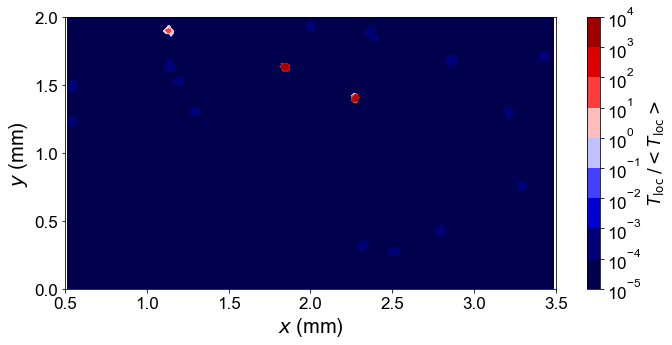


-----------------------------------------------------


Read granular temperature at 433


Reading particle info 433...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 433 successful

Read coordinate done


Interpolation done



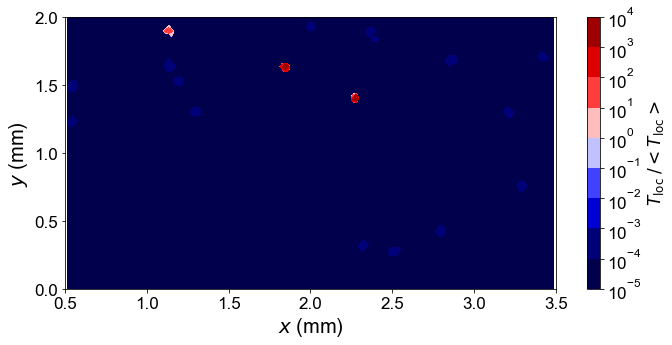


-----------------------------------------------------


Read granular temperature at 434


Reading particle info 434...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 434 successful

Read coordinate done


Interpolation done



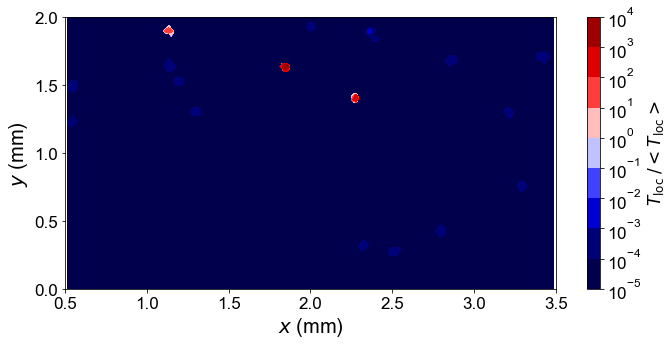


-----------------------------------------------------


Read granular temperature at 435


Reading particle info 435...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 435 successful

Read coordinate done


Interpolation done



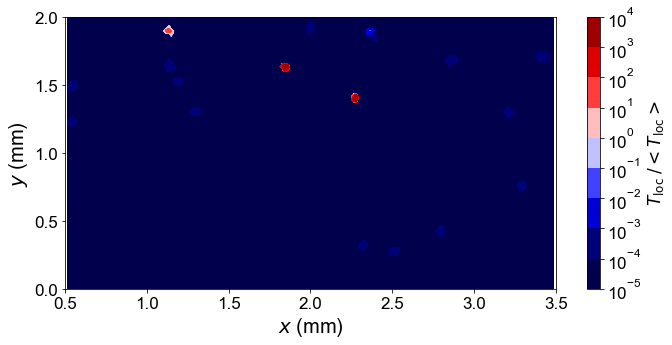


-----------------------------------------------------


Read granular temperature at 436


Reading particle info 436...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 436 successful

Read coordinate done


Interpolation done



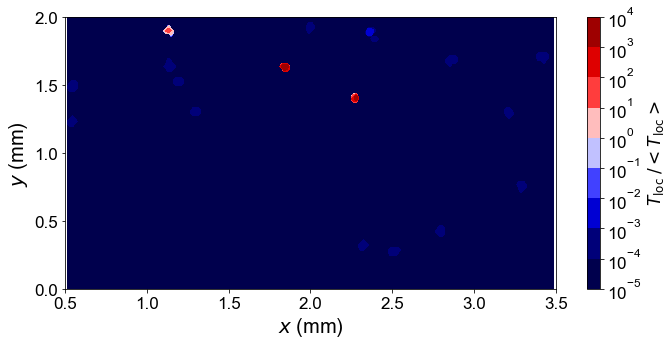


-----------------------------------------------------


Read granular temperature at 437


Reading particle info 437...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 437 successful

Read coordinate done


Interpolation done



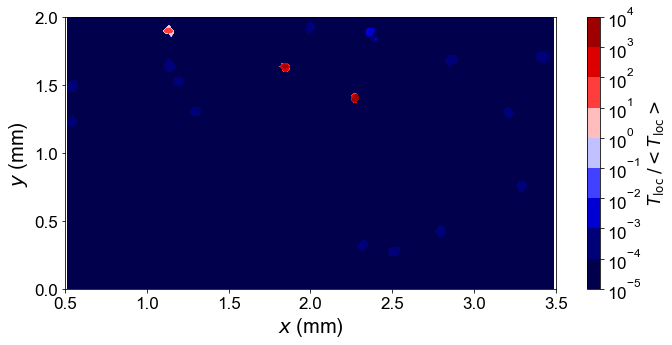


-----------------------------------------------------


Read granular temperature at 438


Reading particle info 438...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 438 successful

Read coordinate done


Interpolation done



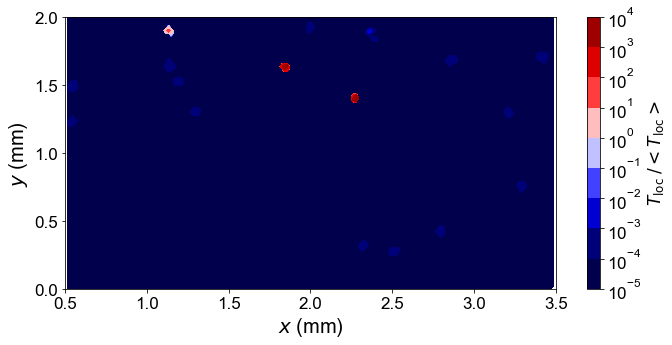


-----------------------------------------------------


Read granular temperature at 439


Reading particle info 439...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 439 successful

Read coordinate done


Interpolation done



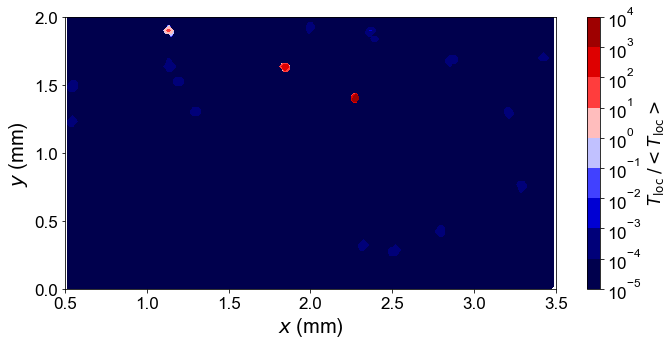


-----------------------------------------------------


Read granular temperature at 440


Reading particle info 440...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 440 successful

Read coordinate done


Interpolation done



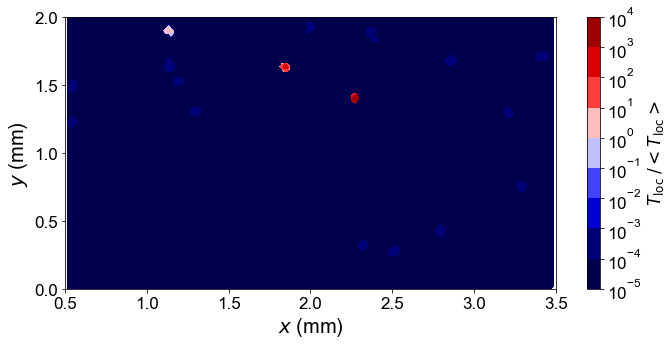


-----------------------------------------------------


Read granular temperature at 441


Reading particle info 441...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 441 successful

Read coordinate done


Interpolation done



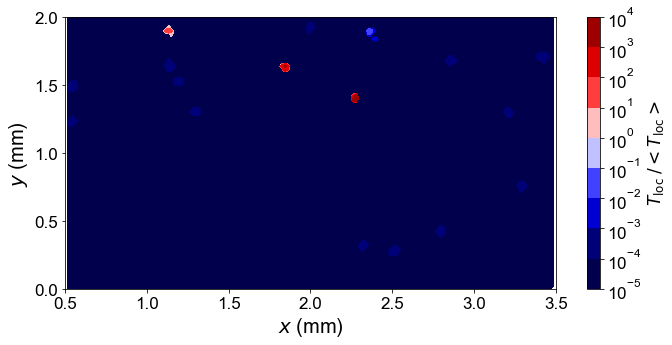


-----------------------------------------------------


Read granular temperature at 442


Reading particle info 442...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 442 successful

Read coordinate done


Interpolation done



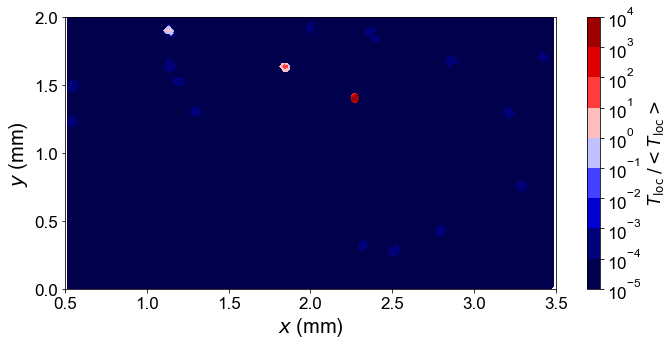


-----------------------------------------------------


Read granular temperature at 443


Reading particle info 443...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 443 successful

Read coordinate done


Interpolation done



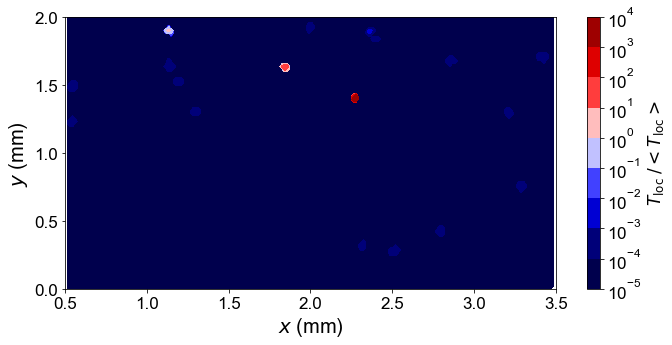


-----------------------------------------------------


Read granular temperature at 444


Reading particle info 444...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 444 successful

Read coordinate done


Interpolation done



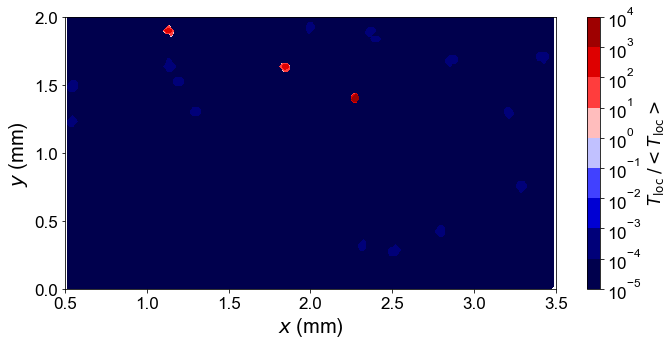


-----------------------------------------------------


Read granular temperature at 445


Reading particle info 445...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 445 successful

Read coordinate done


Interpolation done



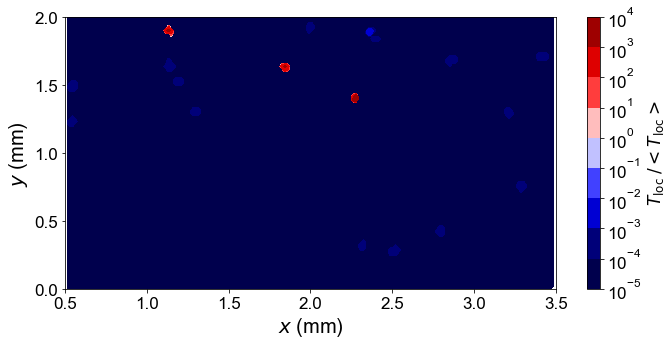


-----------------------------------------------------


Read granular temperature at 446


Reading particle info 446...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 446 successful

Read coordinate done


Interpolation done



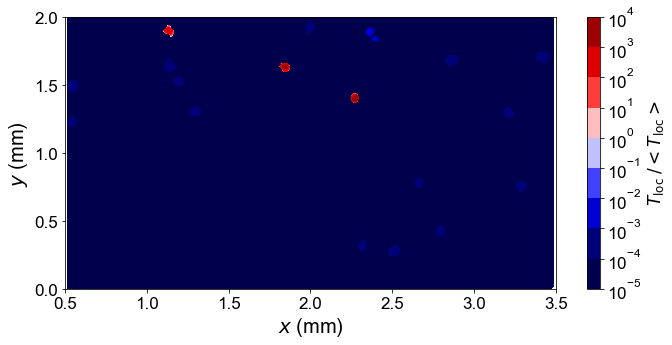


-----------------------------------------------------


Read granular temperature at 447


Reading particle info 447...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 447 successful

Read coordinate done


Interpolation done



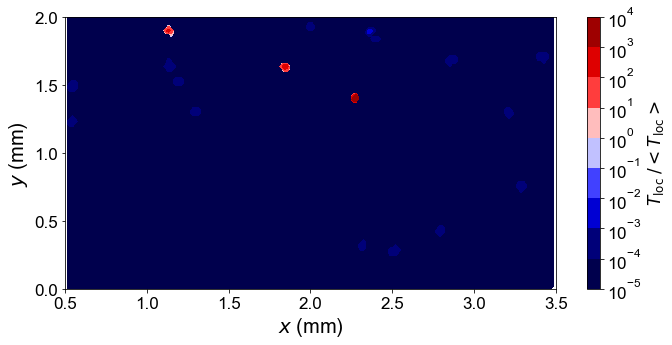


-----------------------------------------------------


Read granular temperature at 448


Reading particle info 448...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 448 successful

Read coordinate done


Interpolation done



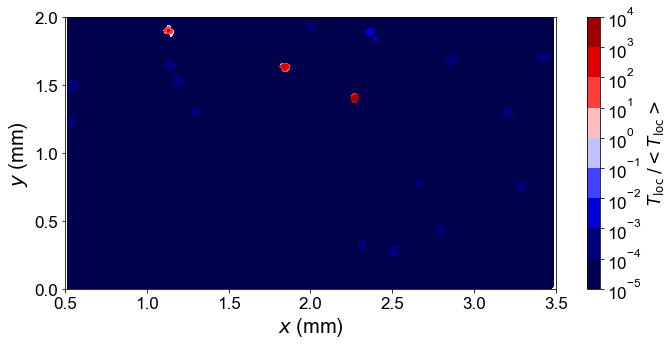


-----------------------------------------------------


Read granular temperature at 449


Reading particle info 449...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 449 successful

Read coordinate done


Interpolation done



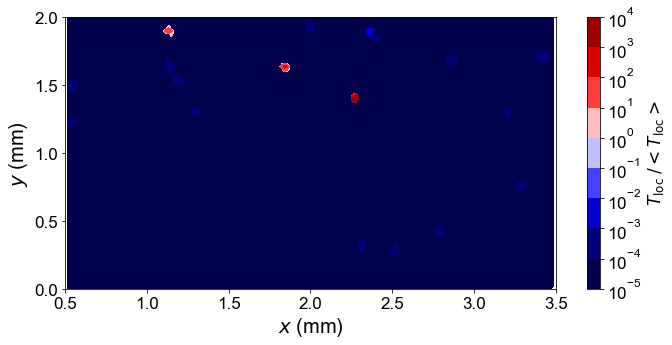


-----------------------------------------------------


Read granular temperature at 450


Reading particle info 450...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 450 successful

Read coordinate done


Interpolation done



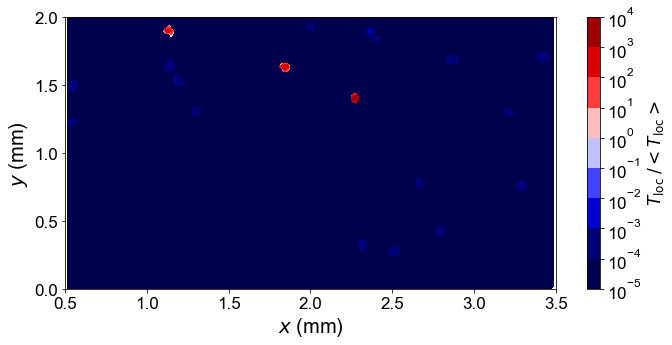


-----------------------------------------------------


Read granular temperature at 451


Reading particle info 451...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 451 successful

Read coordinate done


Interpolation done



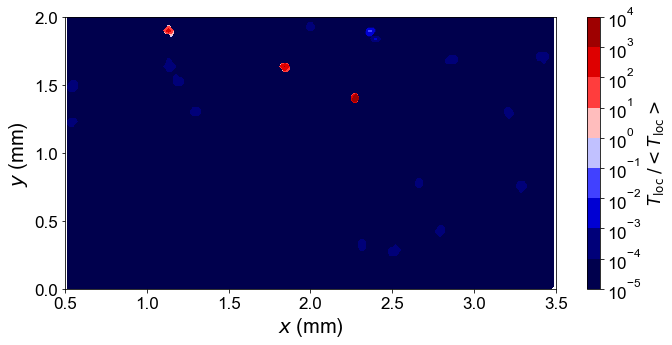


-----------------------------------------------------


Read granular temperature at 452


Reading particle info 452...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 452 successful

Read coordinate done


Interpolation done



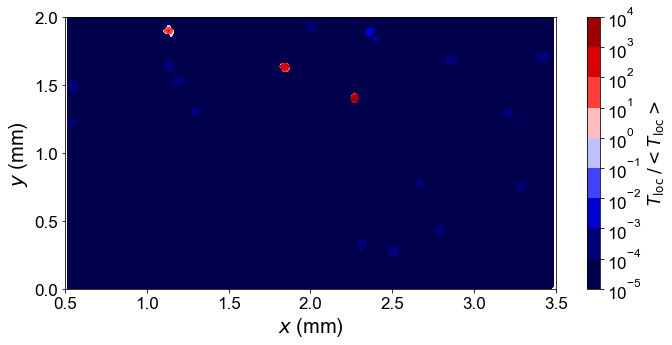


-----------------------------------------------------


Read granular temperature at 453


Reading particle info 453...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 453 successful

Read coordinate done


Interpolation done



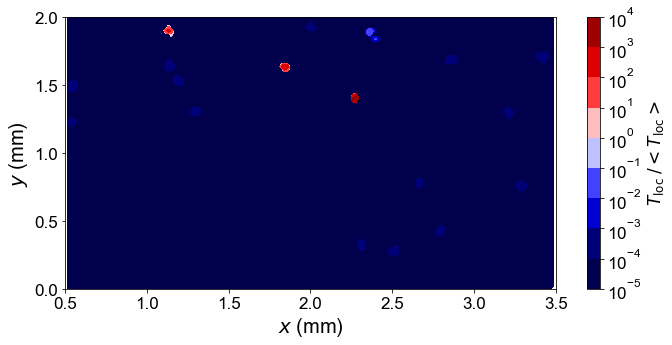


-----------------------------------------------------


Read granular temperature at 454


Reading particle info 454...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 454 successful

Read coordinate done


Interpolation done



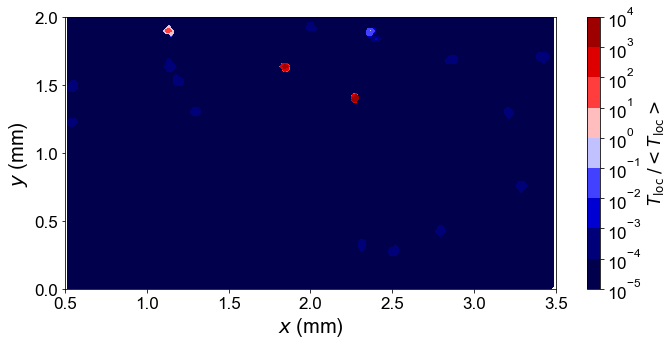


-----------------------------------------------------


Read granular temperature at 455


Reading particle info 455...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 455 successful

Read coordinate done


Interpolation done



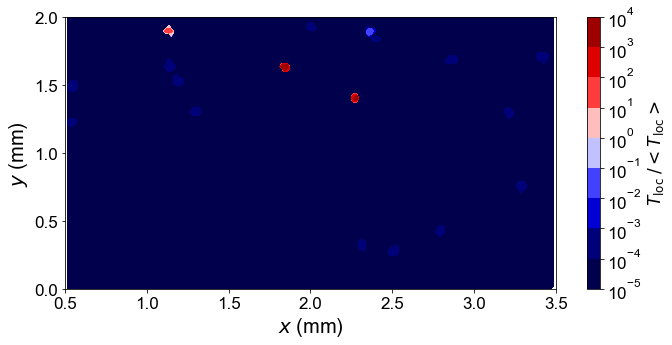


-----------------------------------------------------


Read granular temperature at 456


Reading particle info 456...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 456 successful

Read coordinate done


Interpolation done



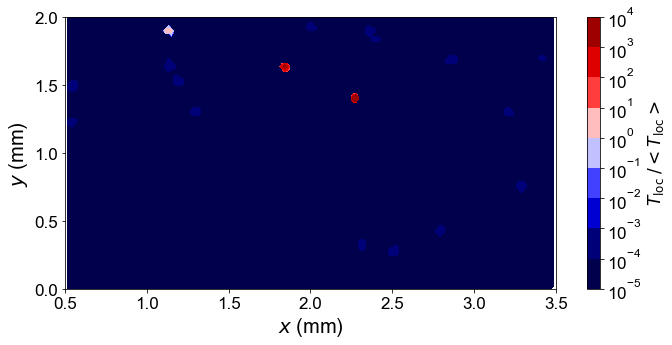


-----------------------------------------------------


Read granular temperature at 457


Reading particle info 457...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 457 successful

Read coordinate done


Interpolation done



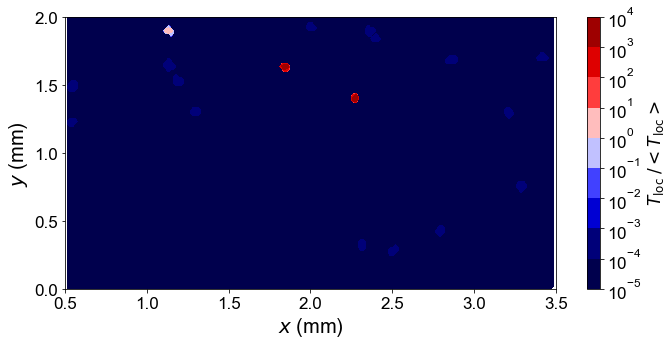


-----------------------------------------------------


Read granular temperature at 458


Reading particle info 458...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 458 successful

Read coordinate done


Interpolation done



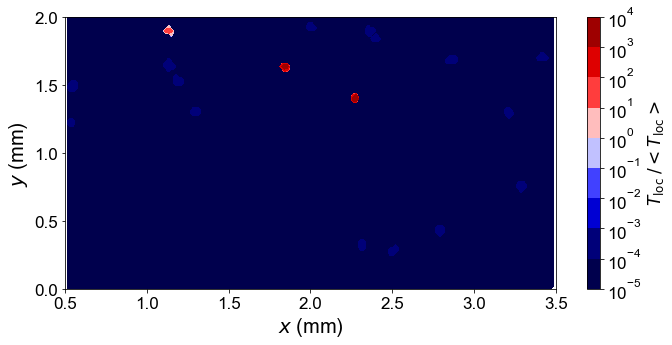


-----------------------------------------------------


Read granular temperature at 459


Reading particle info 459...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 459 successful

Read coordinate done


Interpolation done



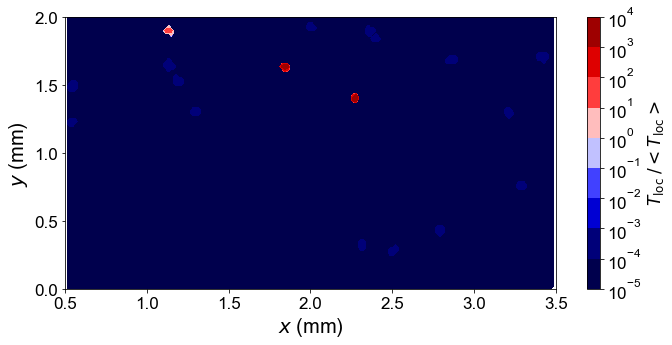


-----------------------------------------------------


Read granular temperature at 460


Reading particle info 460...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 460 successful

Read coordinate done


Interpolation done



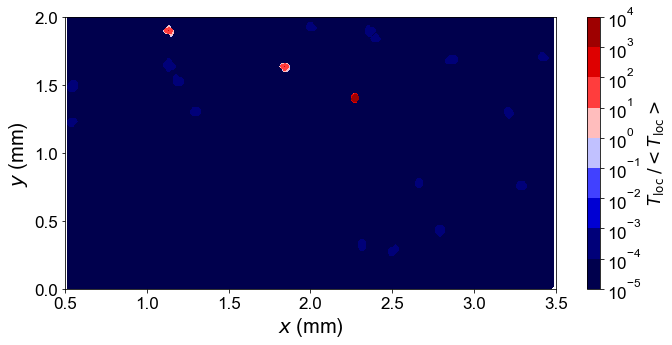


-----------------------------------------------------


Read granular temperature at 461


Reading particle info 461...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 461 successful

Read coordinate done


Interpolation done



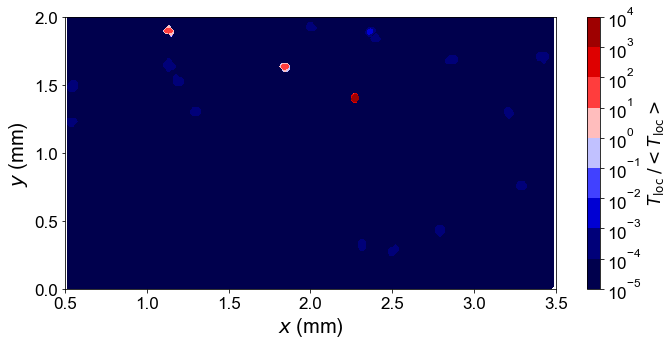


-----------------------------------------------------


Read granular temperature at 462


Reading particle info 462...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 462 successful

Read coordinate done


Interpolation done



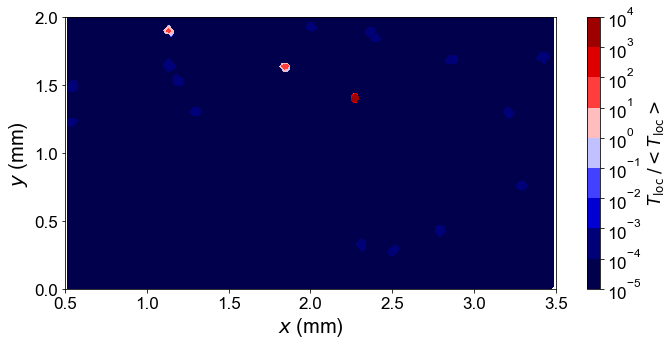


-----------------------------------------------------


Read granular temperature at 463


Reading particle info 463...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 463 successful

Read coordinate done


Interpolation done



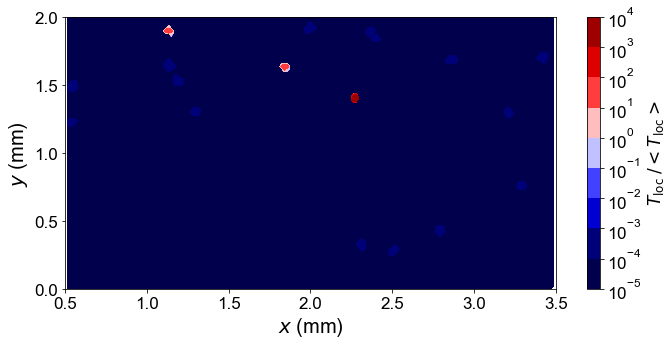


-----------------------------------------------------


Read granular temperature at 464


Reading particle info 464...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 464 successful

Read coordinate done


Interpolation done



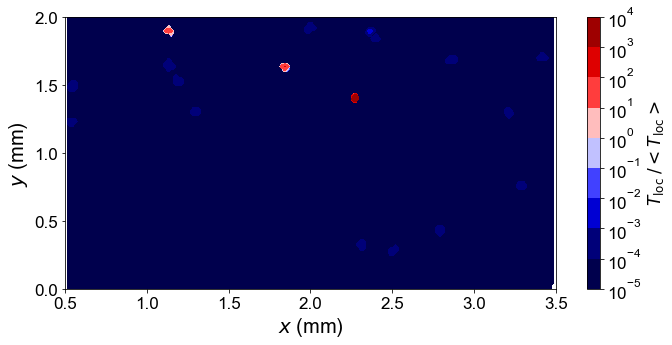


-----------------------------------------------------


Read granular temperature at 465


Reading particle info 465...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 465 successful

Read coordinate done


Interpolation done



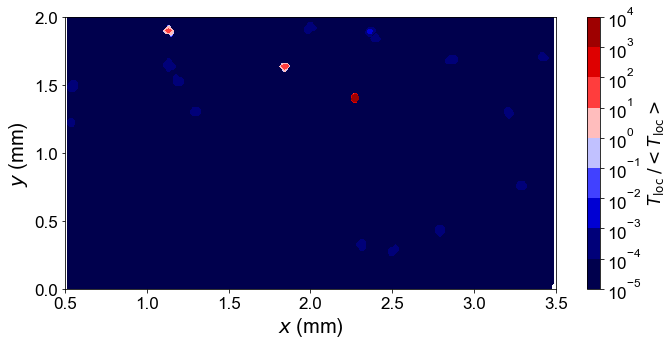


-----------------------------------------------------


Read granular temperature at 466


Reading particle info 466...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 466 successful

Read coordinate done


Interpolation done



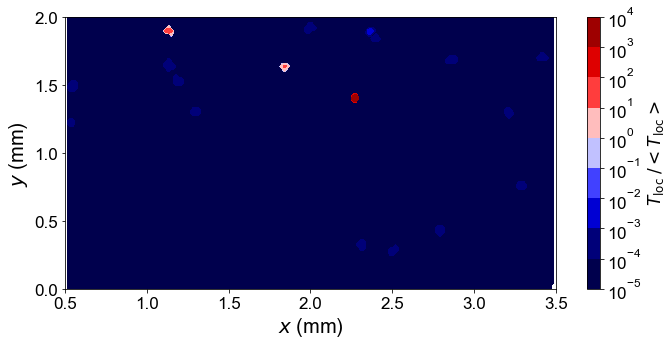


-----------------------------------------------------


Read granular temperature at 467


Reading particle info 467...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 467 successful

Read coordinate done


Interpolation done



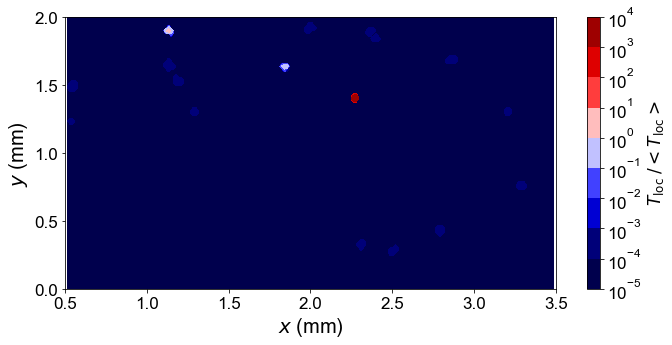


-----------------------------------------------------


Read granular temperature at 468


Reading particle info 468...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 468 successful

Read coordinate done


Interpolation done



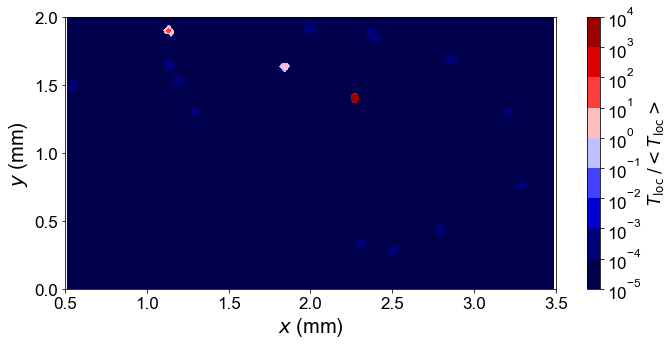


-----------------------------------------------------


Read granular temperature at 469


Reading particle info 469...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 469 successful

Read coordinate done


Interpolation done



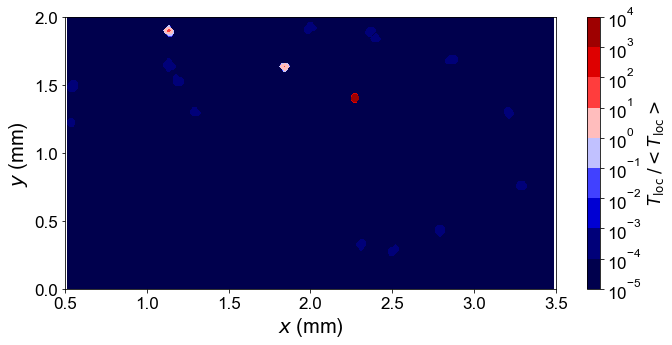


-----------------------------------------------------


Read granular temperature at 470


Reading particle info 470...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 470 successful

Read coordinate done


Interpolation done



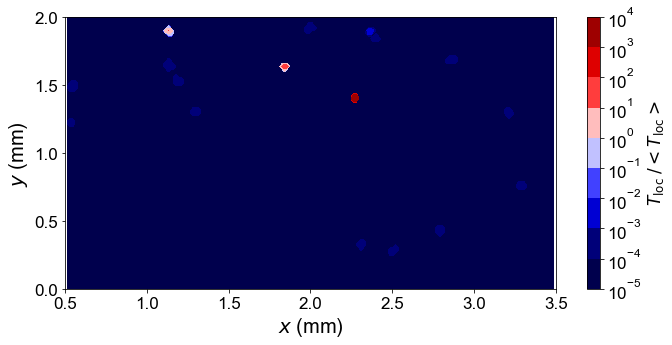


-----------------------------------------------------


Read granular temperature at 471


Reading particle info 471...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 471 successful

Read coordinate done


Interpolation done



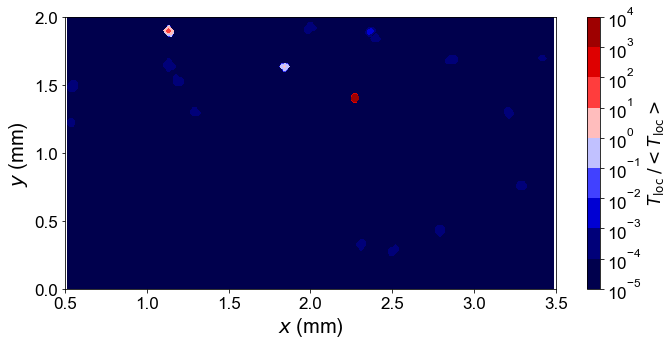


-----------------------------------------------------


Read granular temperature at 472


Reading particle info 472...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 472 successful

Read coordinate done


Interpolation done



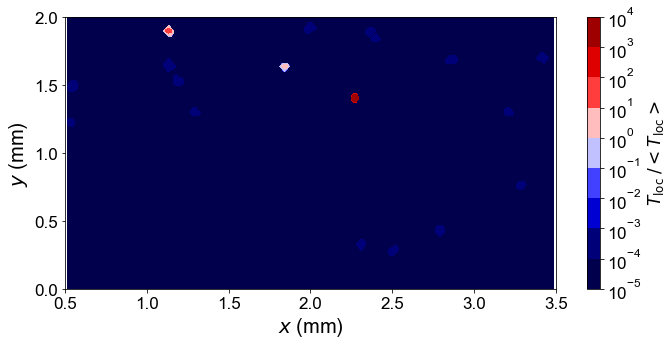


-----------------------------------------------------


Read granular temperature at 473


Reading particle info 473...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 473 successful

Read coordinate done


Interpolation done



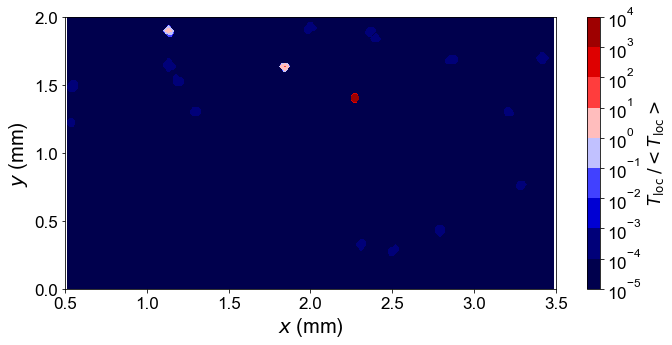


-----------------------------------------------------


Read granular temperature at 474


Reading particle info 474...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 474 successful

Read coordinate done


Interpolation done



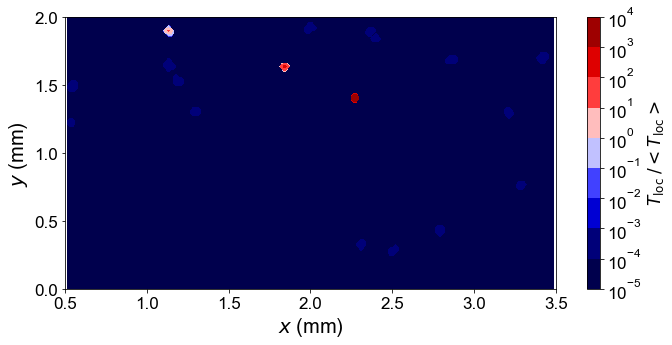


-----------------------------------------------------


Read granular temperature at 475


Reading particle info 475...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 475 successful

Read coordinate done


Interpolation done



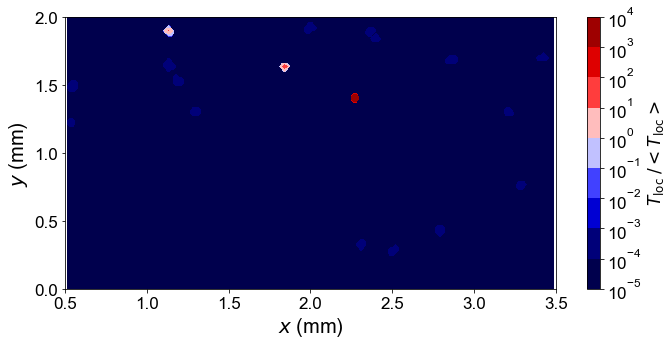


-----------------------------------------------------


Read granular temperature at 476


Reading particle info 476...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 476 successful

Read coordinate done


Interpolation done



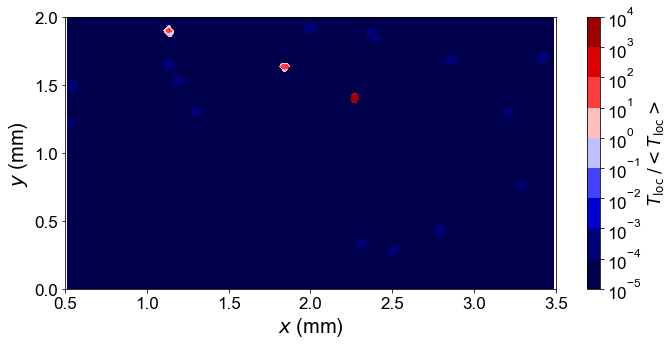


-----------------------------------------------------


Read granular temperature at 477


Reading particle info 477...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 477 successful

Read coordinate done


Interpolation done



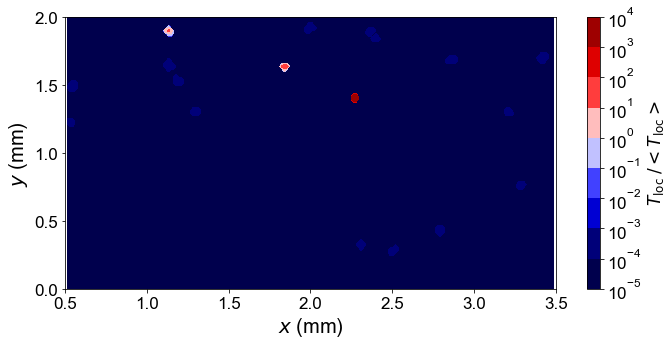


-----------------------------------------------------


Read granular temperature at 478


Reading particle info 478...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 478 successful

Read coordinate done


Interpolation done



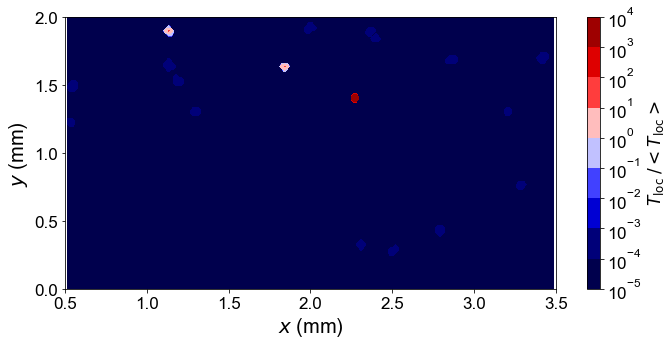


-----------------------------------------------------


Read granular temperature at 479


Reading particle info 479...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 479 successful

Read coordinate done


Interpolation done



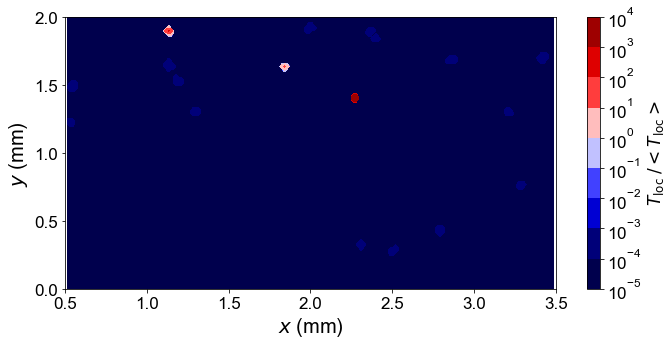


-----------------------------------------------------


Read granular temperature at 480


Reading particle info 480...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 480 successful

Read coordinate done


Interpolation done



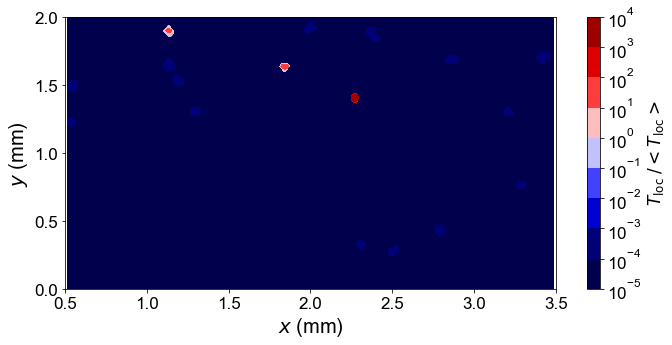


-----------------------------------------------------


Read granular temperature at 481


Reading particle info 481...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 481 successful

Read coordinate done


Interpolation done



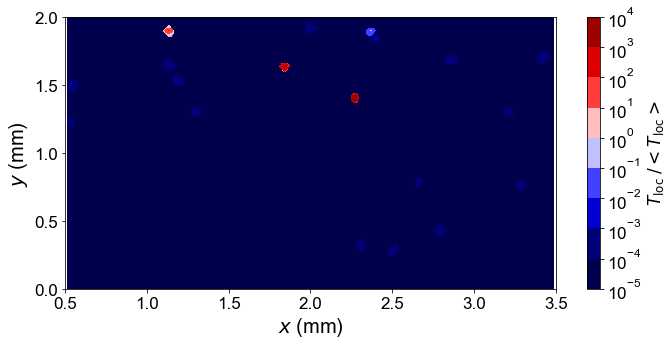


-----------------------------------------------------


Read granular temperature at 482


Reading particle info 482...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 482 successful

Read coordinate done


Interpolation done



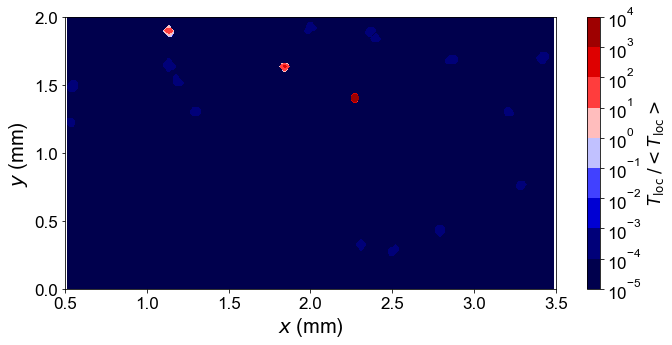


-----------------------------------------------------


Read granular temperature at 483


Reading particle info 483...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 483 successful

Read coordinate done


Interpolation done



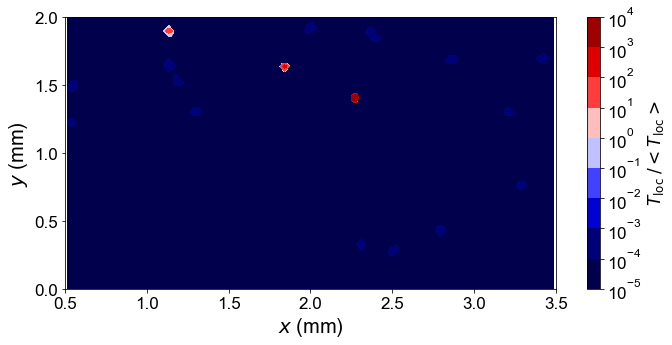


-----------------------------------------------------


Read granular temperature at 484


Reading particle info 484...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 484 successful

Read coordinate done


Interpolation done



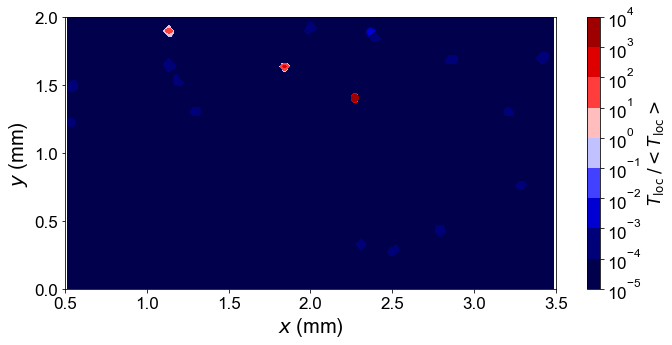


-----------------------------------------------------


Read granular temperature at 485


Reading particle info 485...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 485 successful

Read coordinate done


Interpolation done



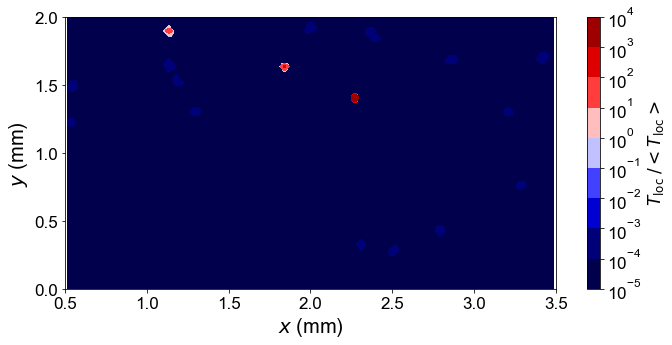


-----------------------------------------------------


Read granular temperature at 486


Reading particle info 486...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 486 successful

Read coordinate done


Interpolation done



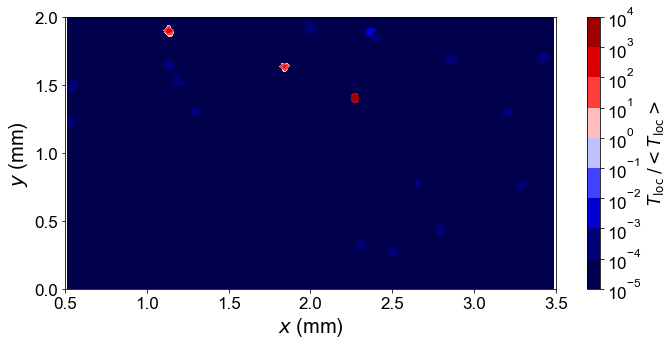


-----------------------------------------------------


Read granular temperature at 487


Reading particle info 487...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 487 successful

Read coordinate done


Interpolation done



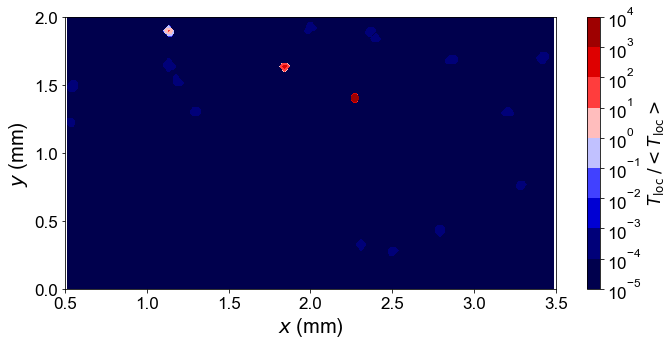


-----------------------------------------------------


Read granular temperature at 488


Reading particle info 488...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 488 successful

Read coordinate done


Interpolation done



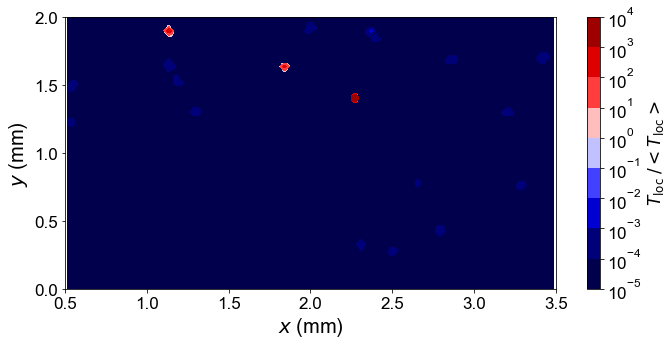


-----------------------------------------------------


Read granular temperature at 489


Reading particle info 489...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 489 successful

Read coordinate done


Interpolation done



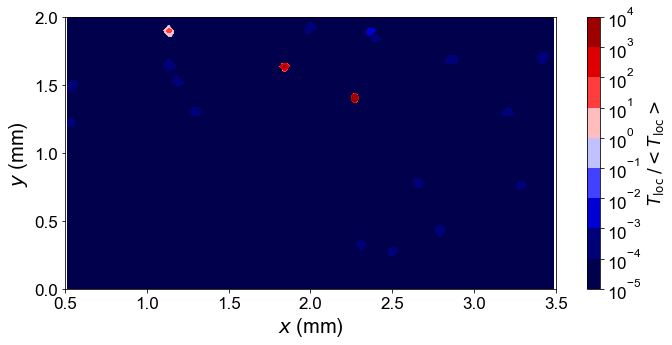


-----------------------------------------------------


Read granular temperature at 490


Reading particle info 490...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 490 successful

Read coordinate done


Interpolation done



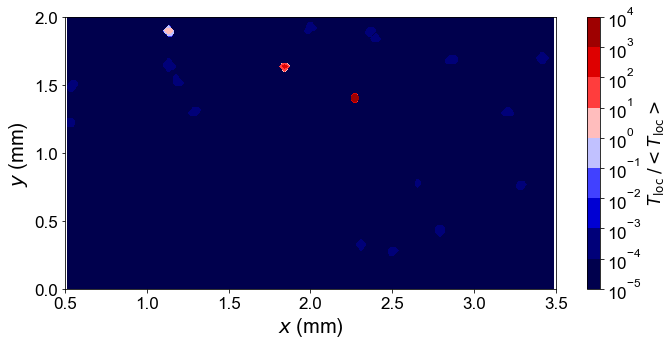


-----------------------------------------------------


Read granular temperature at 491


Reading particle info 491...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 491 successful

Read coordinate done


Interpolation done



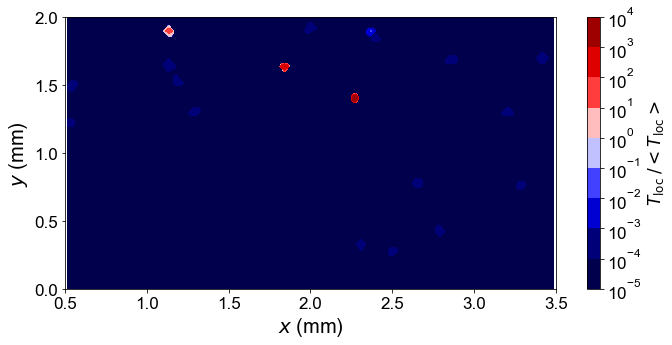


-----------------------------------------------------


Read granular temperature at 492


Reading particle info 492...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 492 successful

Read coordinate done


Interpolation done



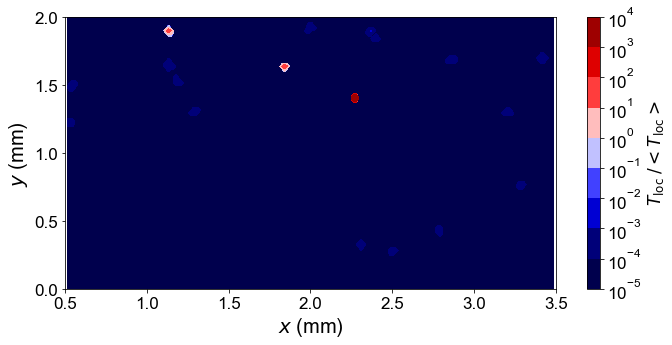


-----------------------------------------------------


Read granular temperature at 493


Reading particle info 493...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 493 successful

Read coordinate done


Interpolation done



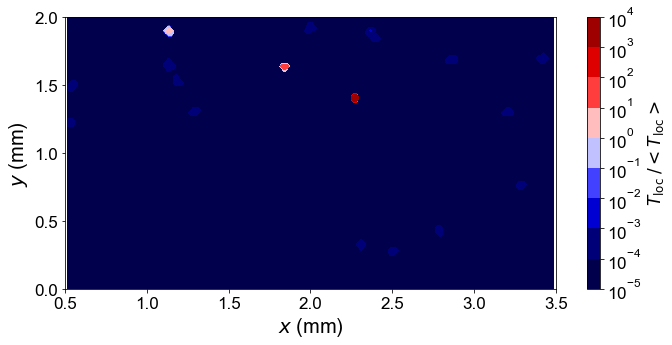


-----------------------------------------------------


Read granular temperature at 494


Reading particle info 494...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 494 successful

Read coordinate done


Interpolation done



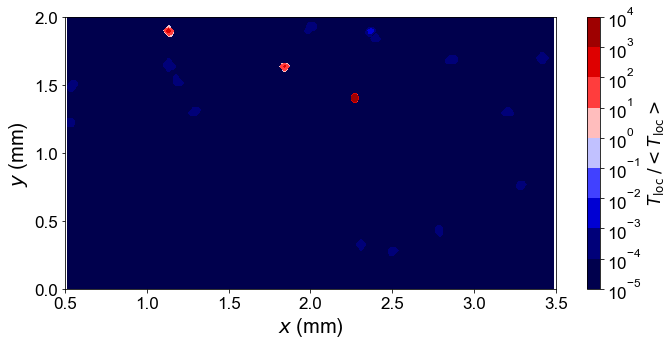


-----------------------------------------------------


Read granular temperature at 495


Reading particle info 495...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 495 successful

Read coordinate done


Interpolation done



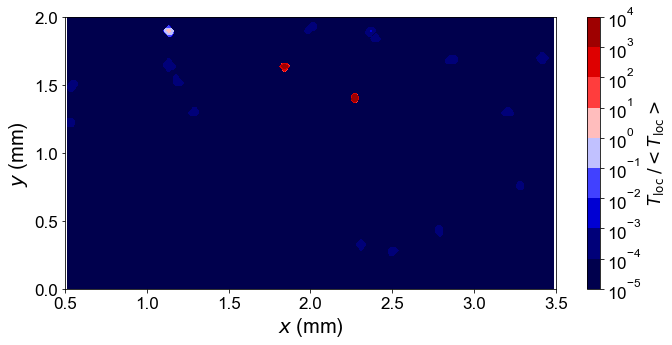


-----------------------------------------------------


Read granular temperature at 496


Reading particle info 496...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 496 successful

Read coordinate done


Interpolation done



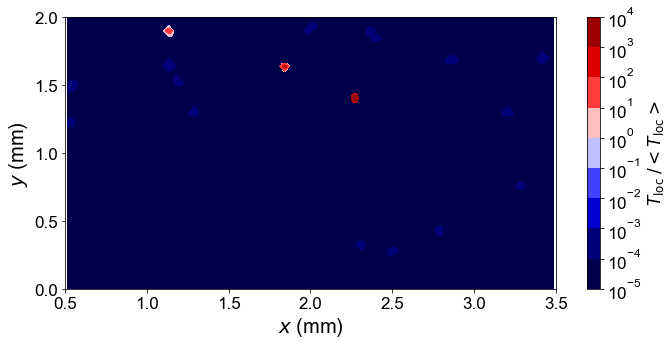


-----------------------------------------------------


Read granular temperature at 497


Reading particle info 497...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 497 successful

Read coordinate done


Interpolation done



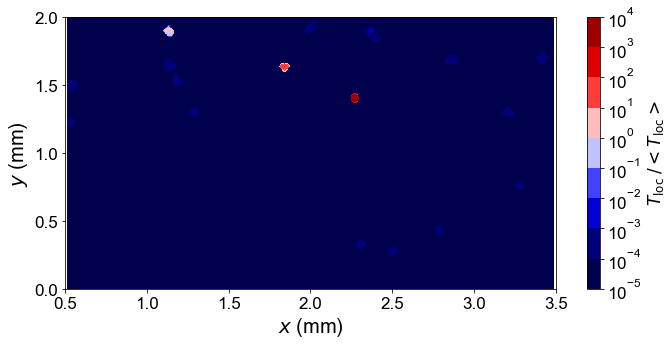


-----------------------------------------------------


Read granular temperature at 498


Reading particle info 498...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 498 successful

Read coordinate done


Interpolation done



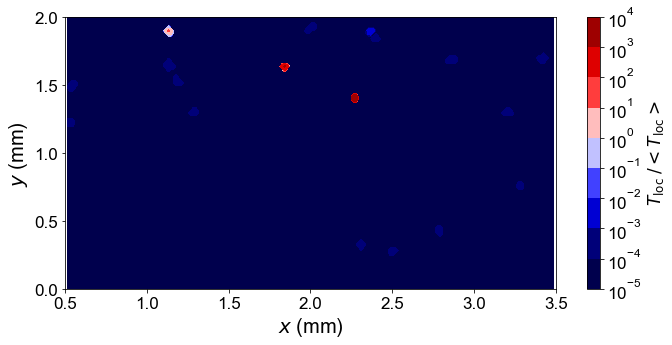


-----------------------------------------------------


Read granular temperature at 499


Reading particle info 499...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 499 successful

Read coordinate done


Interpolation done



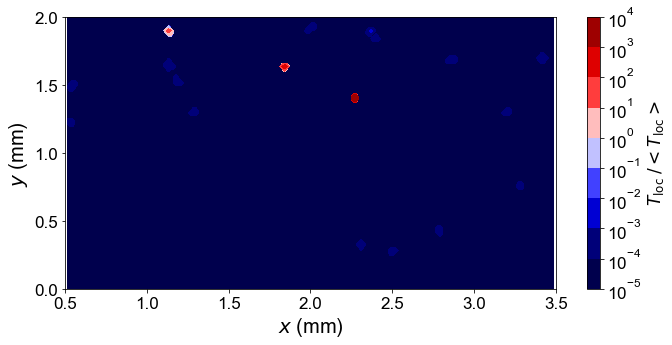


-----------------------------------------------------


Read granular temperature at 500


Reading particle info 500...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 500 successful

Read coordinate done


Interpolation done



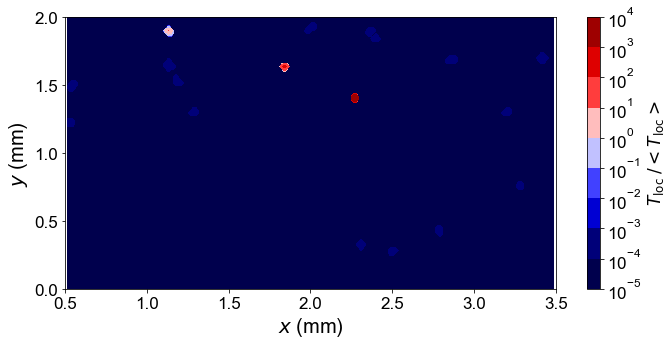


-----------------------------------------------------


Read granular temperature at 501


Reading particle info 501...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 501 successful

Read coordinate done


Interpolation done



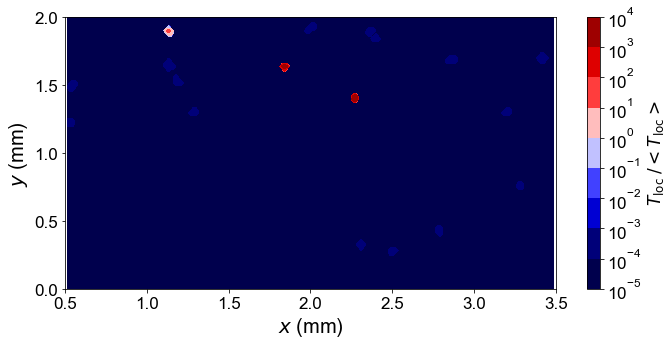


-----------------------------------------------------


Read granular temperature at 502


Reading particle info 502...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 502 successful

Read coordinate done


Interpolation done



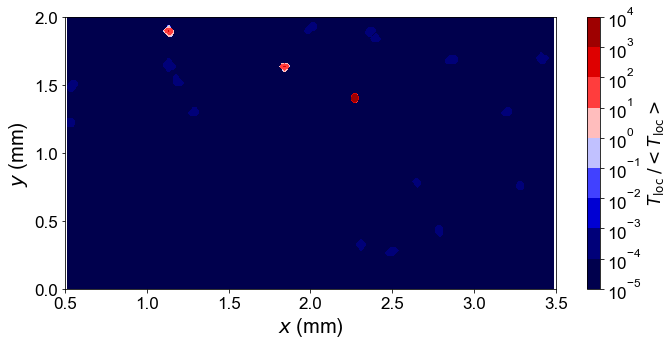


-----------------------------------------------------


Read granular temperature at 503


Reading particle info 503...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 503 successful

Read coordinate done


Interpolation done



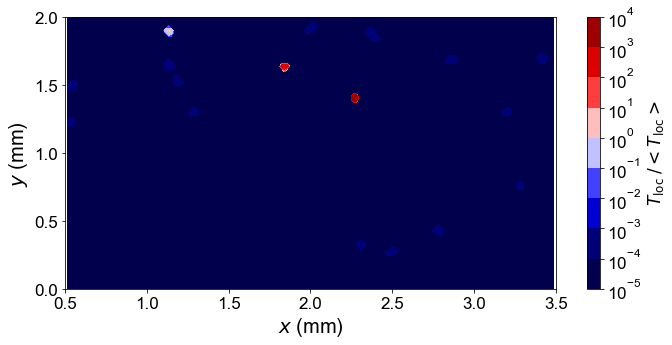


-----------------------------------------------------


Read granular temperature at 504


Reading particle info 504...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 504 successful

Read coordinate done


Interpolation done



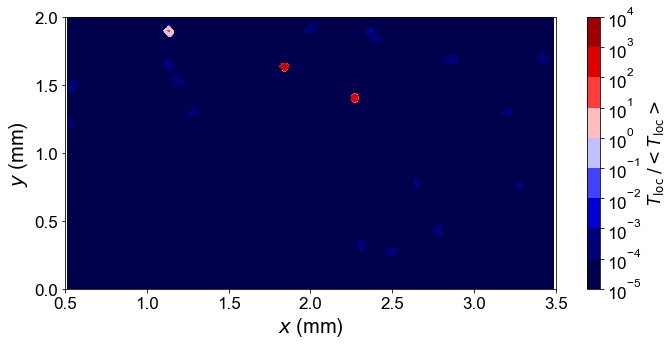


-----------------------------------------------------


Read granular temperature at 505


Reading particle info 505...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 505 successful

Read coordinate done


Interpolation done



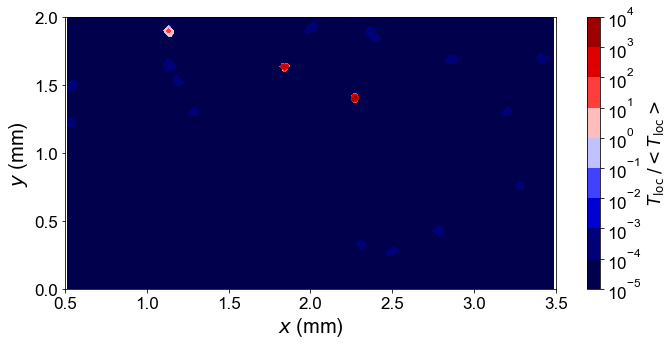


-----------------------------------------------------


Read granular temperature at 506


Reading particle info 506...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 506 successful

Read coordinate done


Interpolation done



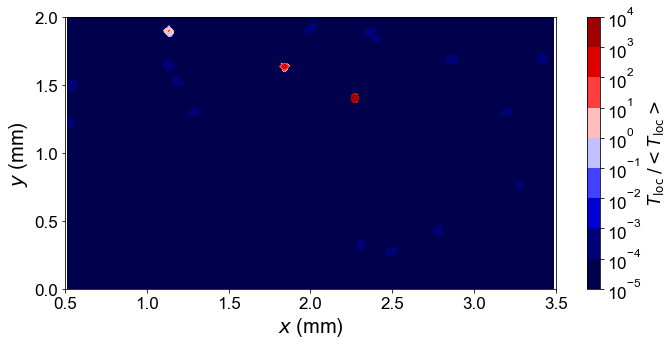


-----------------------------------------------------


Read granular temperature at 507


Reading particle info 507...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 507 successful

Read coordinate done


Interpolation done



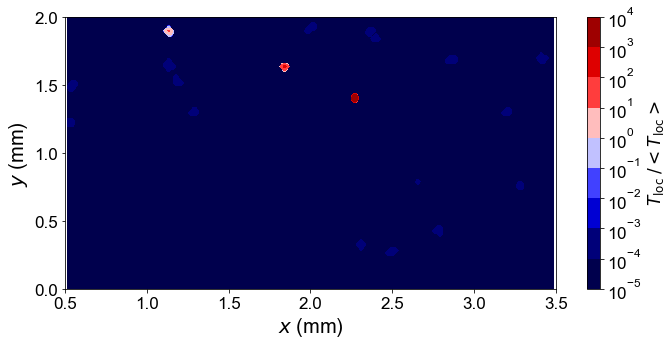


-----------------------------------------------------


Read granular temperature at 508


Reading particle info 508...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 508 successful

Read coordinate done


Interpolation done



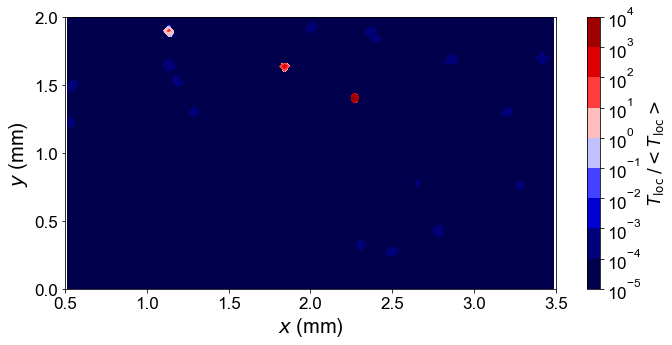


-----------------------------------------------------


Read granular temperature at 509


Reading particle info 509...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 509 successful

Read coordinate done


Interpolation done



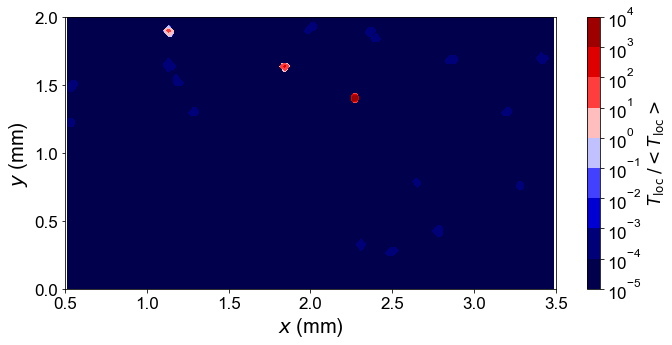


-----------------------------------------------------


Read granular temperature at 510


Reading particle info 510...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 510 successful

Read coordinate done


Interpolation done



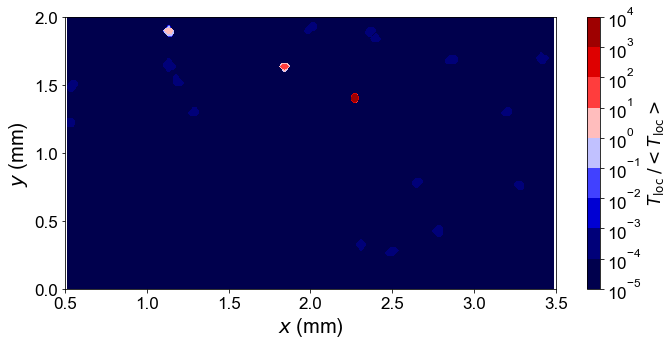


-----------------------------------------------------


Read granular temperature at 511


Reading particle info 511...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 511 successful

Read coordinate done


Interpolation done



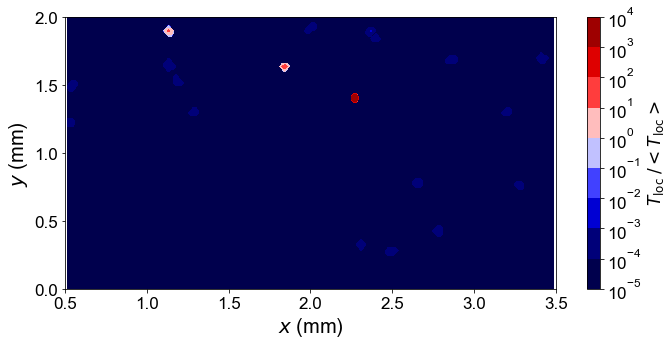


-----------------------------------------------------


Read granular temperature at 512


Reading particle info 512...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 512 successful

Read coordinate done


Interpolation done



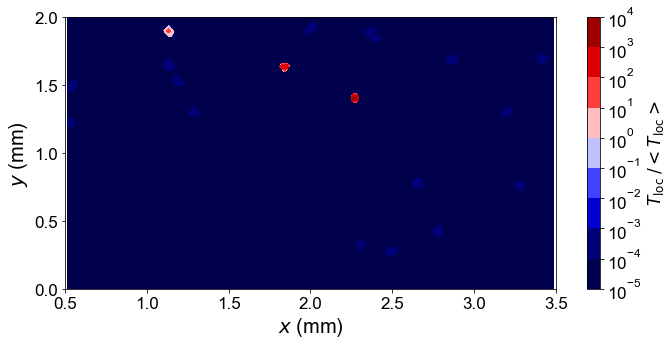


-----------------------------------------------------


Read granular temperature at 513


Reading particle info 513...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 513 successful

Read coordinate done


Interpolation done



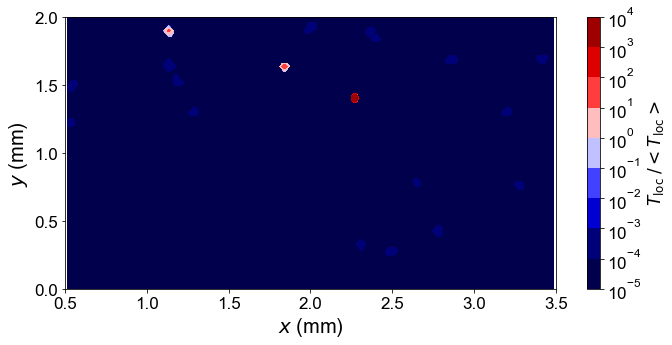


-----------------------------------------------------


Read granular temperature at 514


Reading particle info 514...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 514 successful

Read coordinate done


Interpolation done



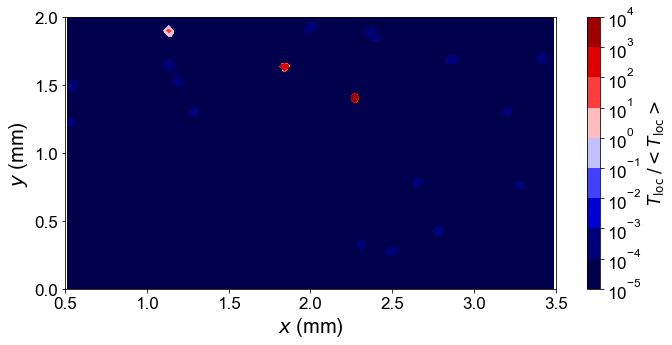


-----------------------------------------------------


Read granular temperature at 515


Reading particle info 515...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 515 successful

Read coordinate done


Interpolation done



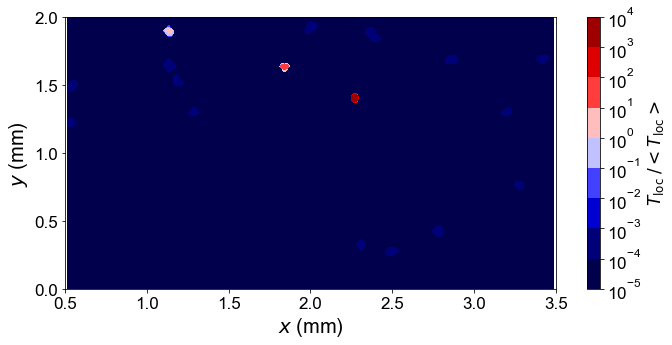


-----------------------------------------------------


Read granular temperature at 516


Reading particle info 516...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 516 successful

Read coordinate done


Interpolation done



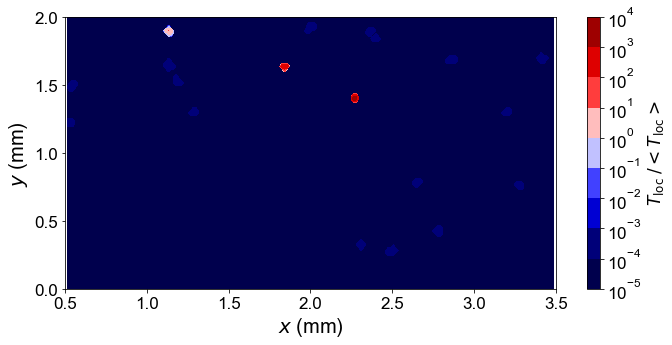


-----------------------------------------------------


Read granular temperature at 517


Reading particle info 517...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 517 successful

Read coordinate done


Interpolation done



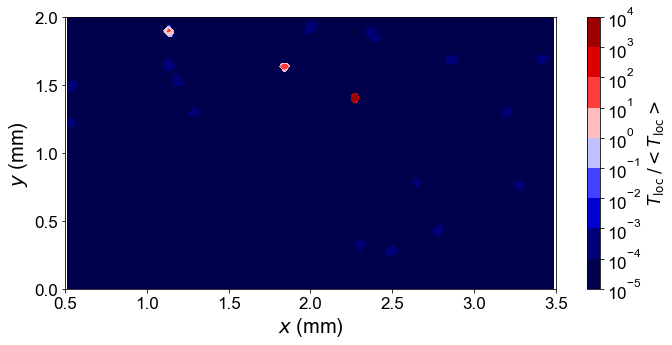


-----------------------------------------------------


Read granular temperature at 518


Reading particle info 518...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 518 successful

Read coordinate done


Interpolation done



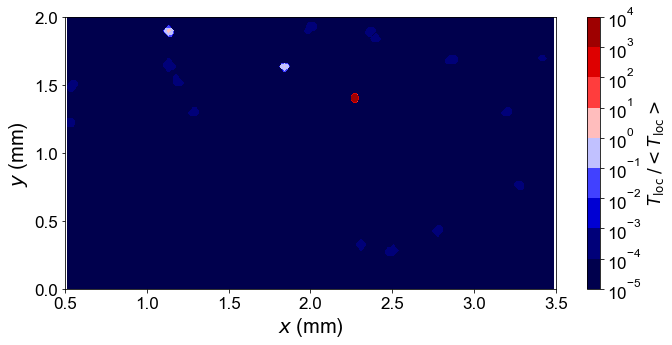


-----------------------------------------------------


Read granular temperature at 519


Reading particle info 519...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 519 successful

Read coordinate done


Interpolation done



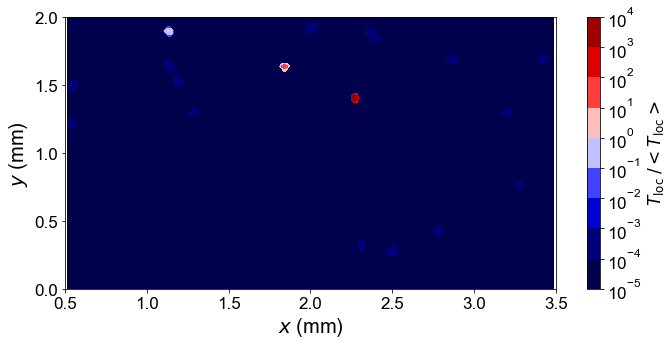


-----------------------------------------------------


Read granular temperature at 520


Reading particle info 520...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 520 successful

Read coordinate done


Interpolation done



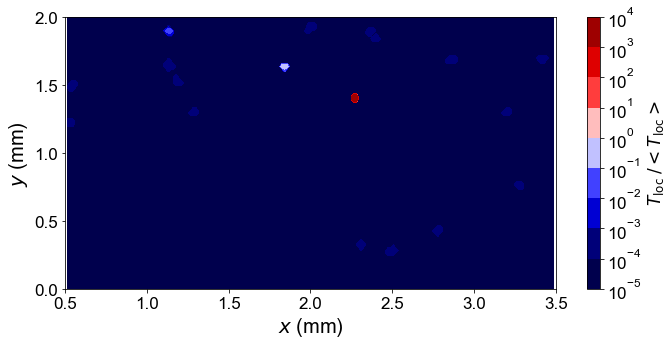


-----------------------------------------------------


Read granular temperature at 521


Reading particle info 521...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 521 successful

Read coordinate done


Interpolation done



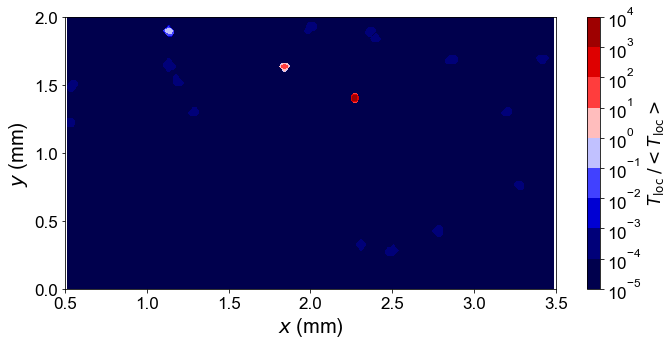


-----------------------------------------------------


Read granular temperature at 522


Reading particle info 522...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 522 successful

Read coordinate done


Interpolation done



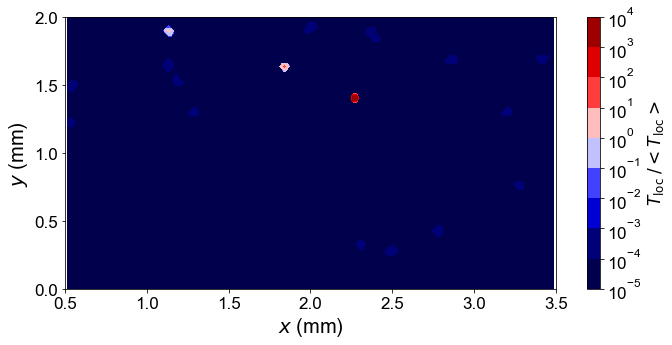


-----------------------------------------------------


Read granular temperature at 523


Reading particle info 523...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 523 successful

Read coordinate done


Interpolation done



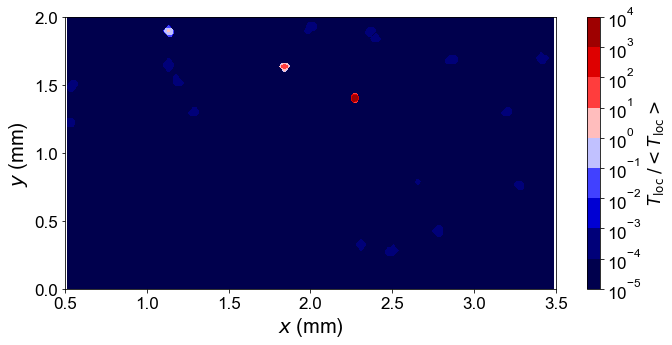


-----------------------------------------------------


Read granular temperature at 524


Reading particle info 524...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 524 successful

Read coordinate done


Interpolation done



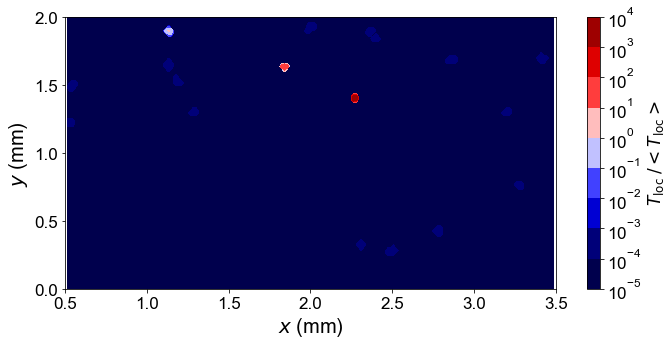


-----------------------------------------------------


Read granular temperature at 525


Reading particle info 525...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 525 successful

Read coordinate done


Interpolation done



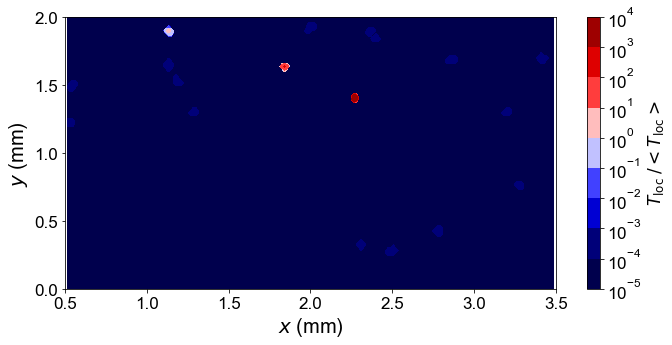


-----------------------------------------------------


Read granular temperature at 526


Reading particle info 526...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 526 successful

Read coordinate done


Interpolation done



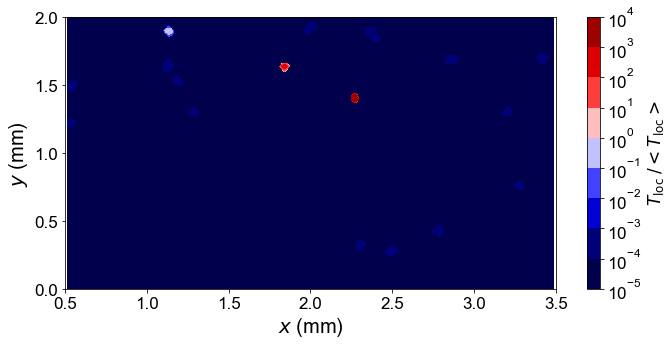


-----------------------------------------------------


Read granular temperature at 527


Reading particle info 527...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 527 successful

Read coordinate done


Interpolation done



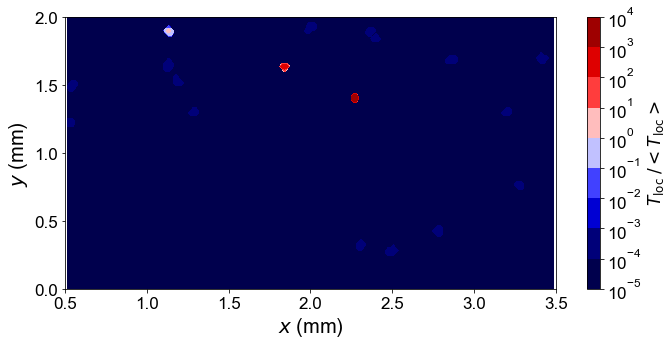


-----------------------------------------------------


Read granular temperature at 528


Reading particle info 528...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 528 successful

Read coordinate done


Interpolation done



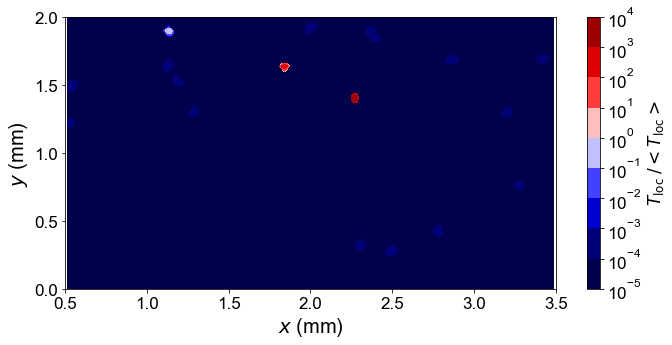


-----------------------------------------------------


Read granular temperature at 529


Reading particle info 529...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 529 successful

Read coordinate done


Interpolation done



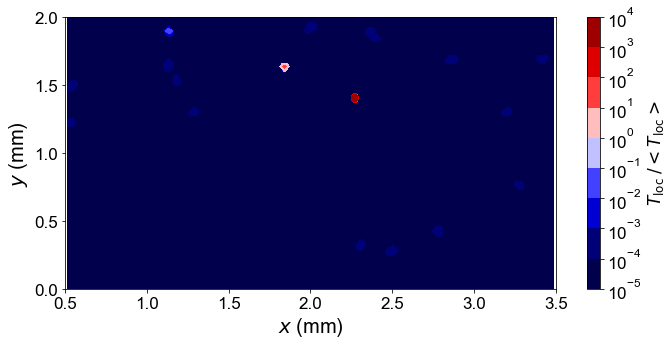


-----------------------------------------------------


Read granular temperature at 530


Reading particle info 530...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 530 successful

Read coordinate done


Interpolation done



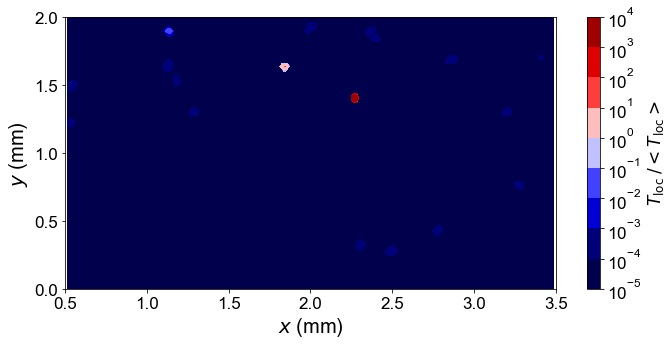


-----------------------------------------------------


Read granular temperature at 531


Reading particle info 531...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 531 successful

Read coordinate done


Interpolation done



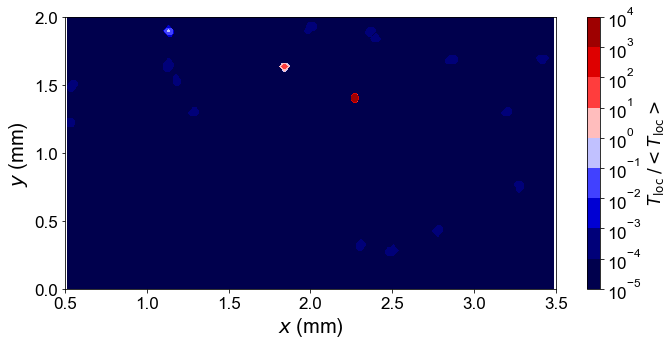


-----------------------------------------------------


Read granular temperature at 532


Reading particle info 532...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 532 successful

Read coordinate done


Interpolation done



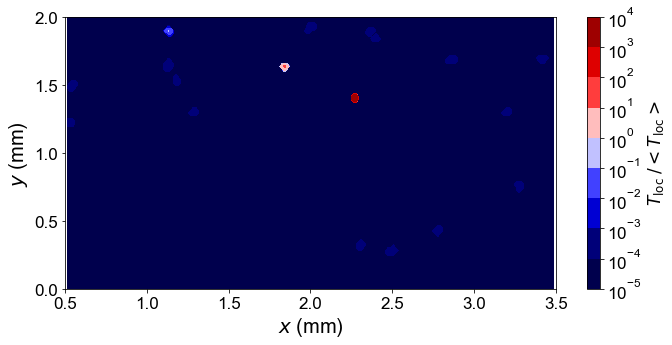


-----------------------------------------------------


Read granular temperature at 533


Reading particle info 533...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 533 successful

Read coordinate done


Interpolation done



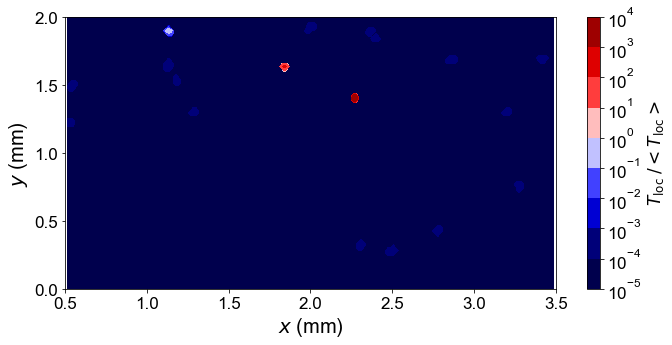


-----------------------------------------------------


Read granular temperature at 534


Reading particle info 534...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 534 successful

Read coordinate done


Interpolation done



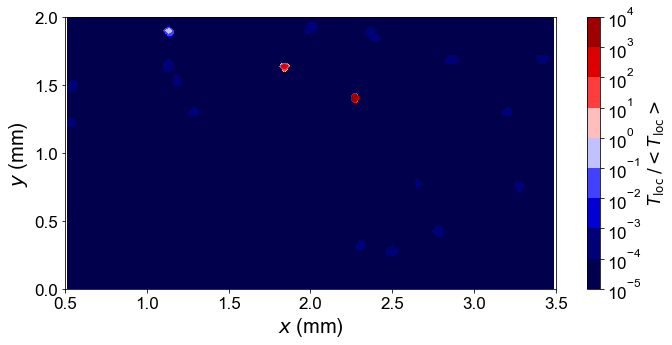


-----------------------------------------------------


Read granular temperature at 535


Reading particle info 535...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 535 successful

Read coordinate done


Interpolation done



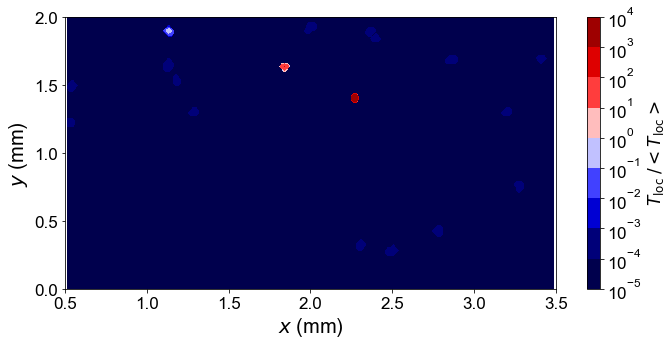


-----------------------------------------------------


Read granular temperature at 536


Reading particle info 536...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 536 successful

Read coordinate done


Interpolation done



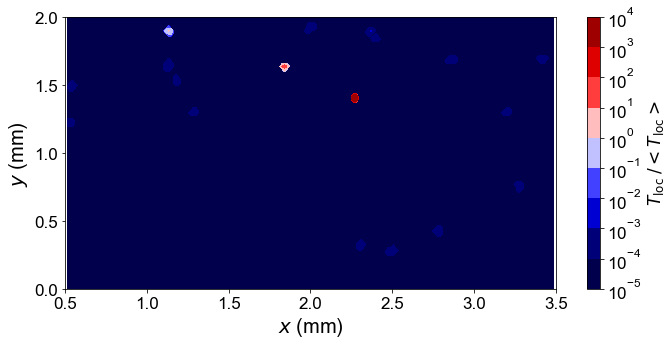


-----------------------------------------------------


Read granular temperature at 537


Reading particle info 537...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 537 successful

Read coordinate done


Interpolation done



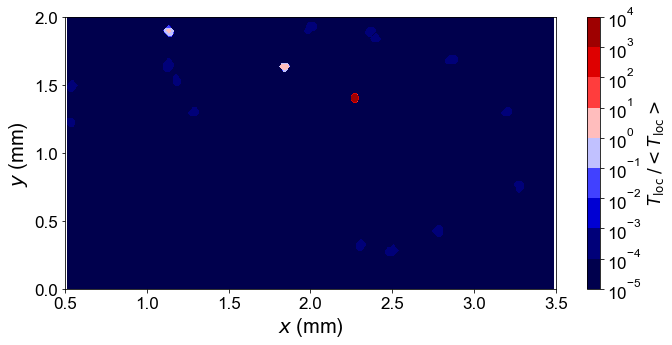


-----------------------------------------------------


Read granular temperature at 538


Reading particle info 538...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 538 successful

Read coordinate done


Interpolation done



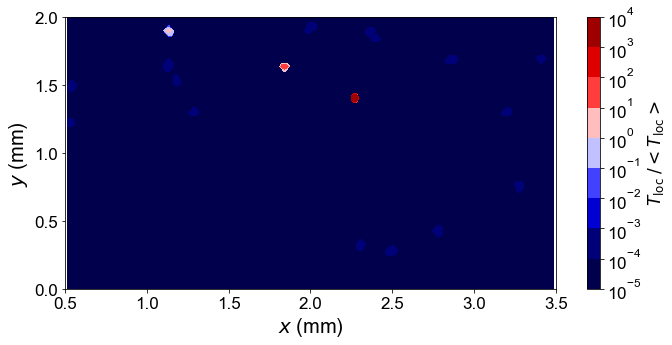


-----------------------------------------------------


Read granular temperature at 539


Reading particle info 539...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 539 successful

Read coordinate done


Interpolation done



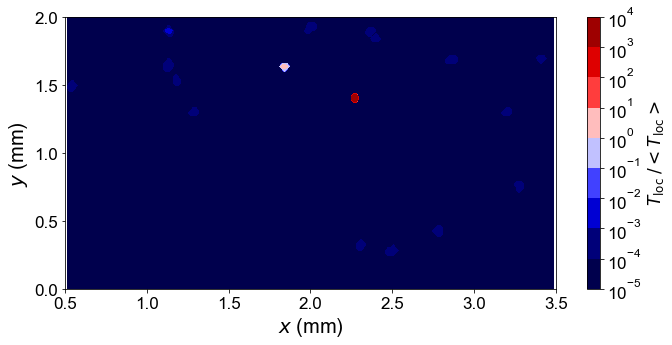


-----------------------------------------------------


Read granular temperature at 540


Reading particle info 540...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 540 successful

Read coordinate done


Interpolation done



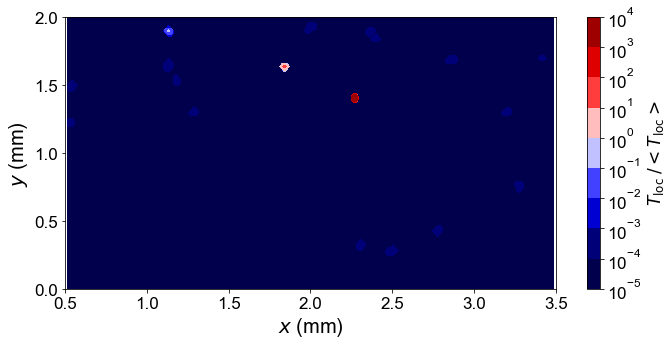


-----------------------------------------------------


Read granular temperature at 541


Reading particle info 541...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 541 successful

Read coordinate done


Interpolation done



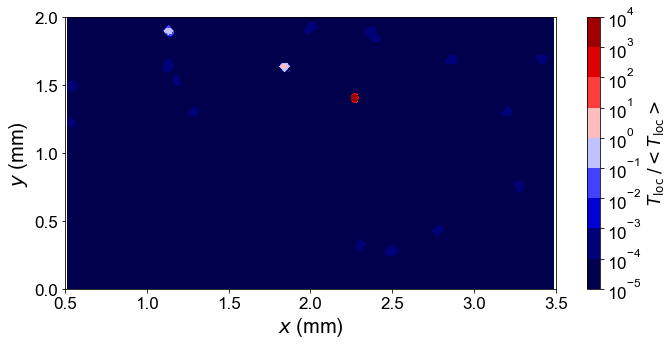


-----------------------------------------------------


Read granular temperature at 542


Reading particle info 542...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 542 successful

Read coordinate done


Interpolation done



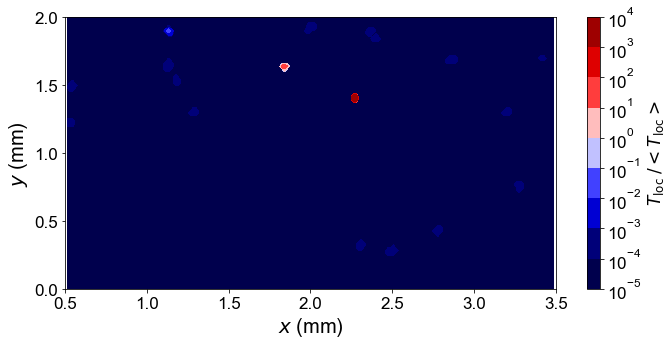


-----------------------------------------------------


Read granular temperature at 543


Reading particle info 543...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 543 successful

Read coordinate done


Interpolation done



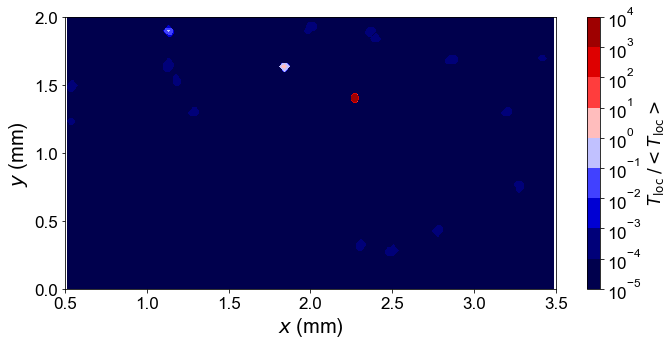


-----------------------------------------------------


Read granular temperature at 544


Reading particle info 544...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 544 successful

Read coordinate done


Interpolation done



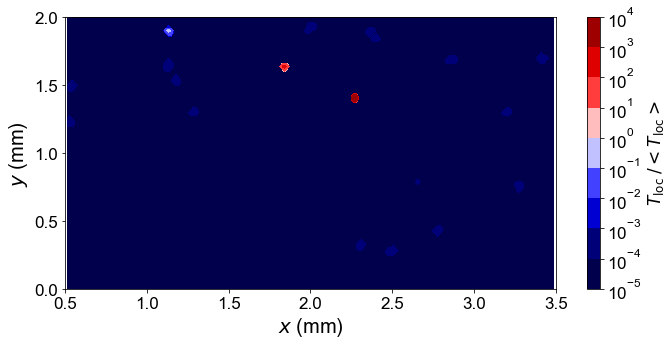


-----------------------------------------------------


Read granular temperature at 545


Reading particle info 545...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 545 successful

Read coordinate done


Interpolation done



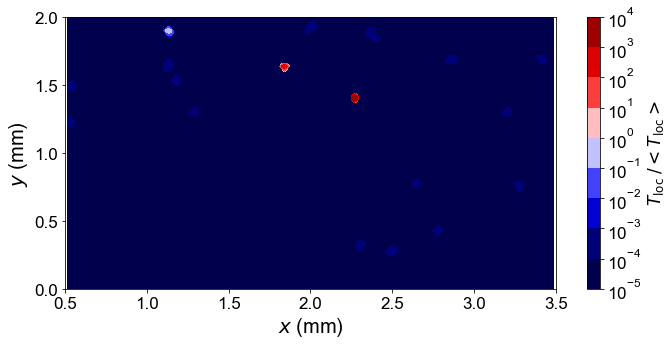


-----------------------------------------------------


Read granular temperature at 546


Reading particle info 546...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 546 successful

Read coordinate done


Interpolation done



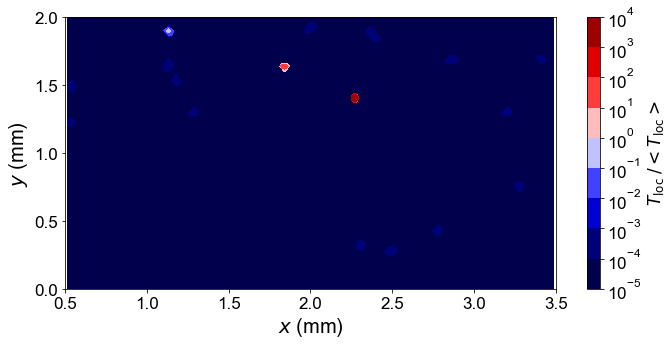


-----------------------------------------------------


Read granular temperature at 547


Reading particle info 547...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 547 successful

Read coordinate done


Interpolation done



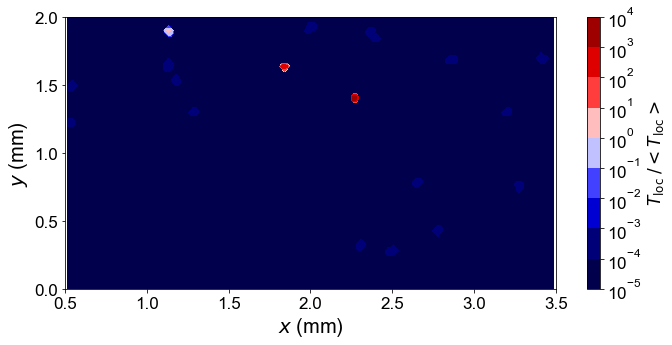


-----------------------------------------------------


Read granular temperature at 548


Reading particle info 548...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 548 successful

Read coordinate done


Interpolation done



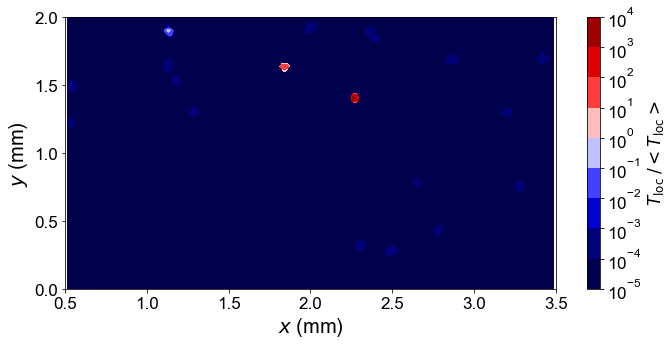


-----------------------------------------------------


Read granular temperature at 549


Reading particle info 549...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 549 successful

Read coordinate done


Interpolation done



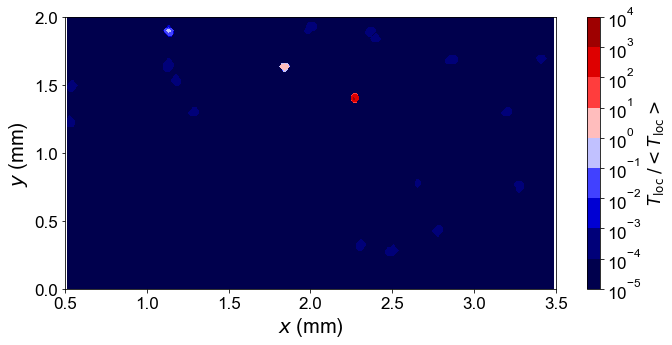


-----------------------------------------------------


Read granular temperature at 550


Reading particle info 550...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 550 successful

Read coordinate done


Interpolation done



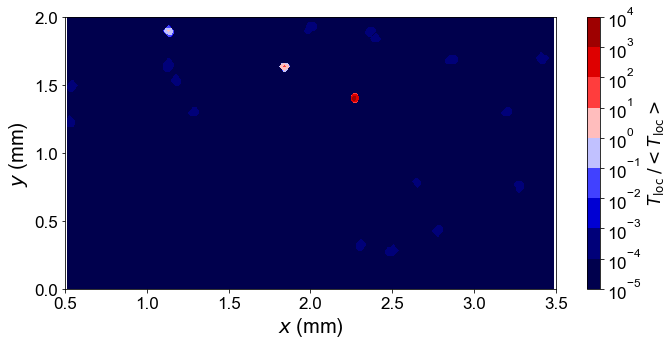


-----------------------------------------------------


Read granular temperature at 551


Reading particle info 551...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 551 successful

Read coordinate done


Interpolation done



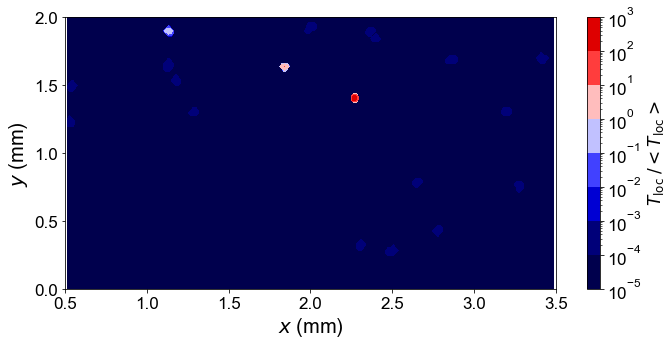


-----------------------------------------------------


Read granular temperature at 552


Reading particle info 552...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 552 successful

Read coordinate done


Interpolation done



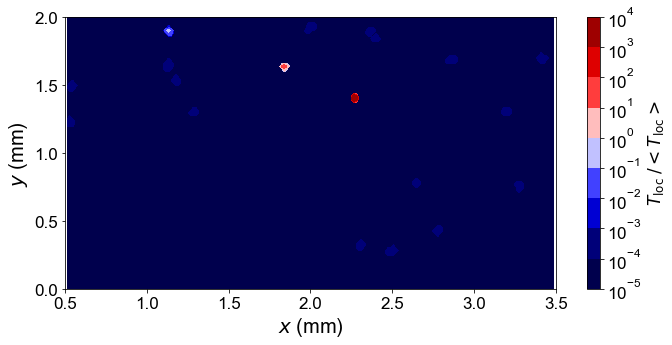


-----------------------------------------------------


Read granular temperature at 553


Reading particle info 553...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 553 successful

Read coordinate done


Interpolation done



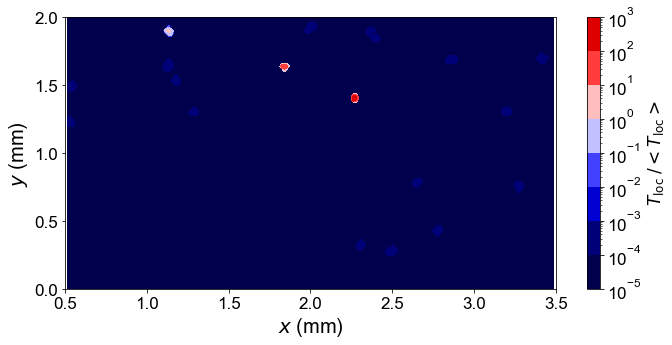


-----------------------------------------------------


Read granular temperature at 554


Reading particle info 554...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 554 successful

Read coordinate done


Interpolation done



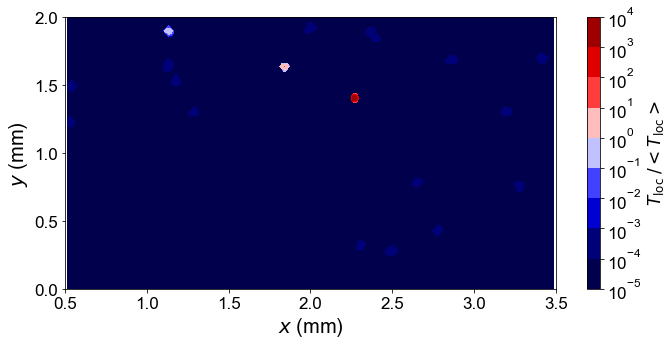


-----------------------------------------------------


Read granular temperature at 555


Reading particle info 555...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 555 successful

Read coordinate done


Interpolation done



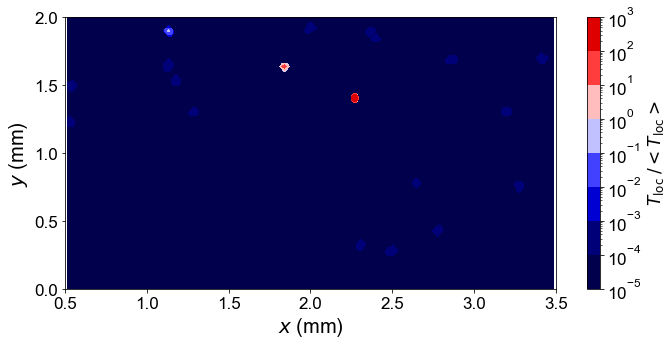


-----------------------------------------------------


Read granular temperature at 556


Reading particle info 556...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 556 successful

Read coordinate done


Interpolation done



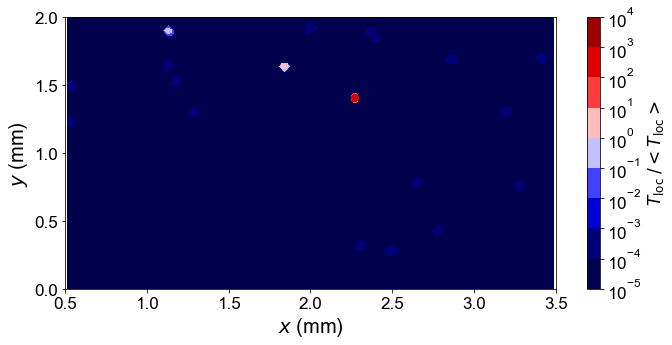


-----------------------------------------------------


Read granular temperature at 557


Reading particle info 557...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 557 successful

Read coordinate done


Interpolation done



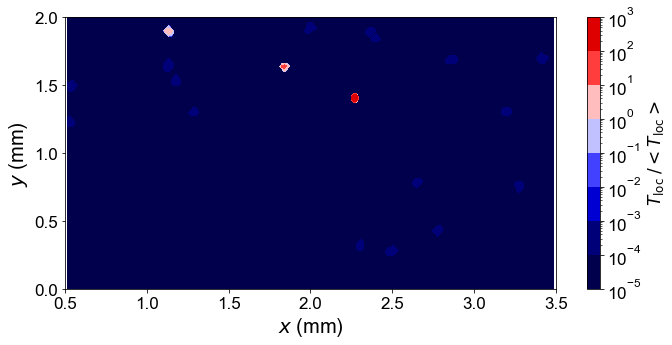


-----------------------------------------------------


Read granular temperature at 558


Reading particle info 558...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 558 successful

Read coordinate done


Interpolation done



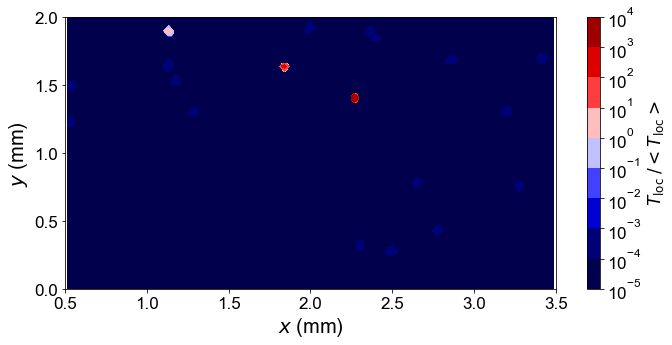


-----------------------------------------------------


Read granular temperature at 559


Reading particle info 559...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 559 successful

Read coordinate done


Interpolation done



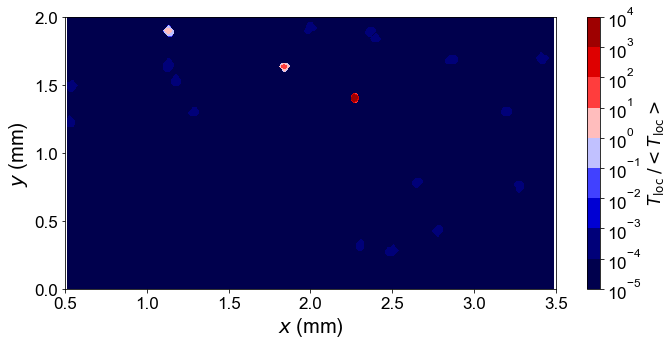


-----------------------------------------------------


Read granular temperature at 560


Reading particle info 560...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 560 successful

Read coordinate done


Interpolation done



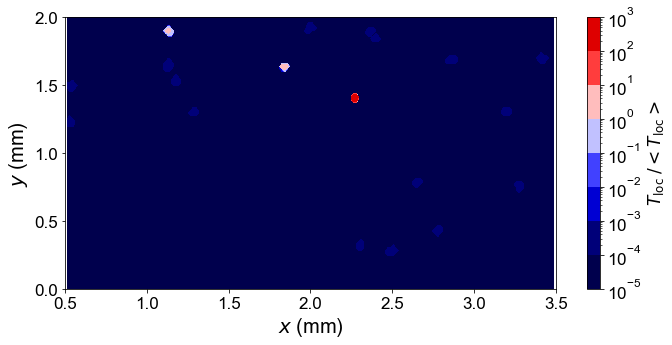


-----------------------------------------------------


Read granular temperature at 561


Reading particle info 561...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 561 successful

Read coordinate done


Interpolation done



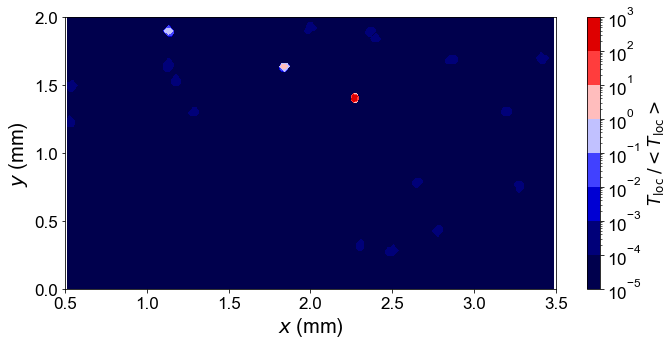


-----------------------------------------------------


Read granular temperature at 562


Reading particle info 562...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 562 successful

Read coordinate done


Interpolation done



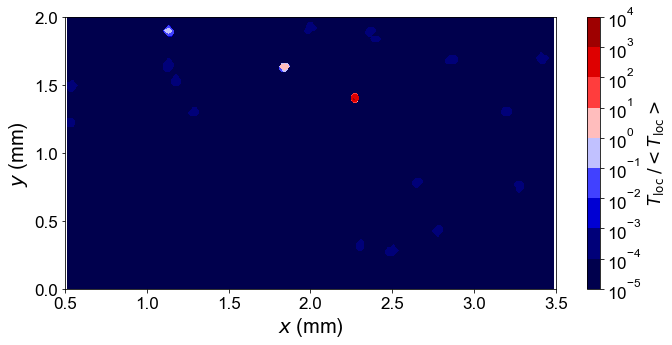


-----------------------------------------------------


Read granular temperature at 563


Reading particle info 563...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 563 successful

Read coordinate done


Interpolation done



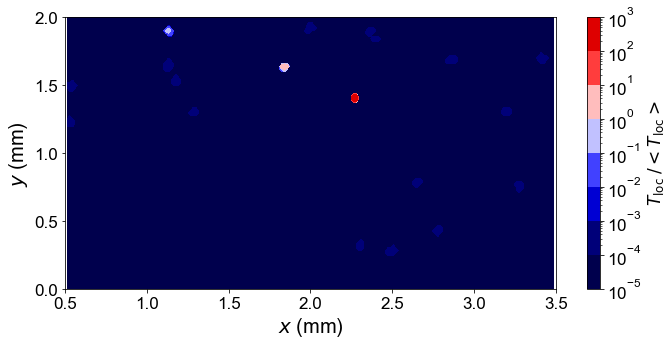


-----------------------------------------------------


Read granular temperature at 564


Reading particle info 564...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 564 successful

Read coordinate done


Interpolation done



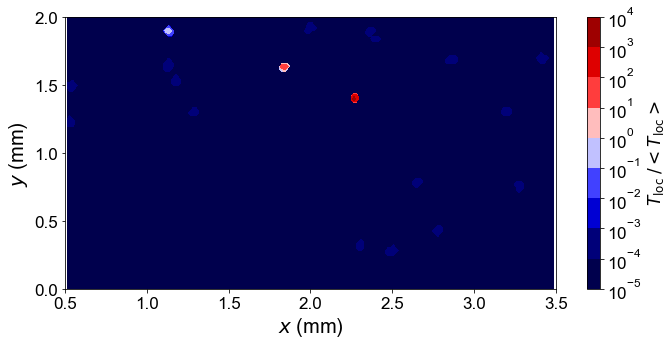


-----------------------------------------------------


Read granular temperature at 565


Reading particle info 565...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 565 successful

Read coordinate done


Interpolation done



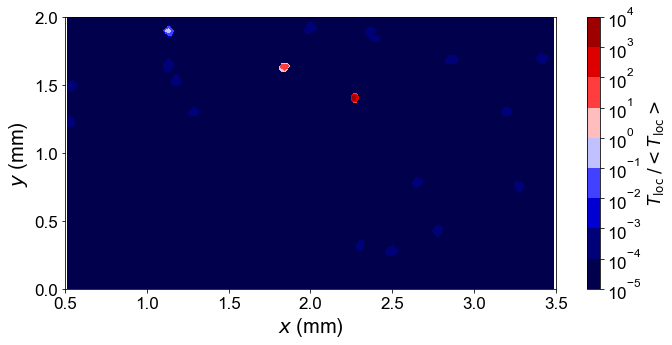


-----------------------------------------------------


Read granular temperature at 566


Reading particle info 566...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 566 successful

Read coordinate done


Interpolation done



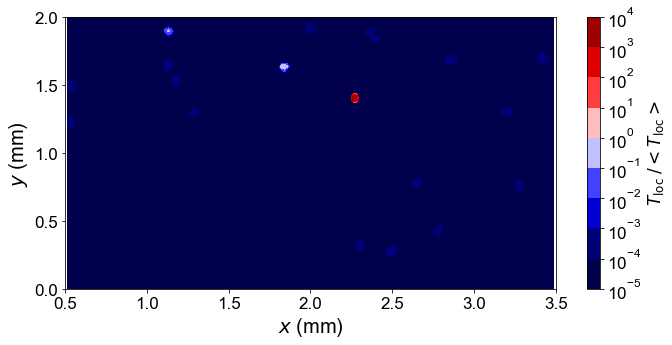


-----------------------------------------------------


Read granular temperature at 567


Reading particle info 567...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 567 successful

Read coordinate done


Interpolation done



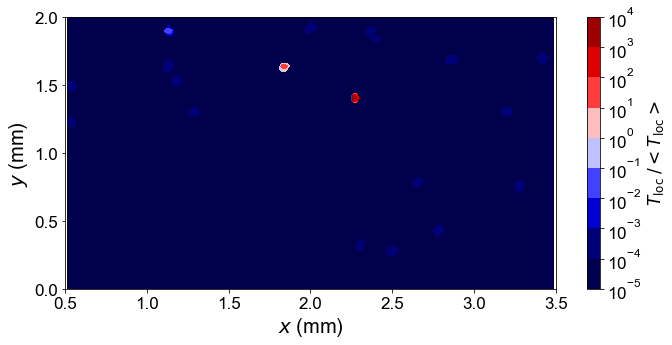


-----------------------------------------------------


Read granular temperature at 568


Reading particle info 568...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 568 successful

Read coordinate done


Interpolation done



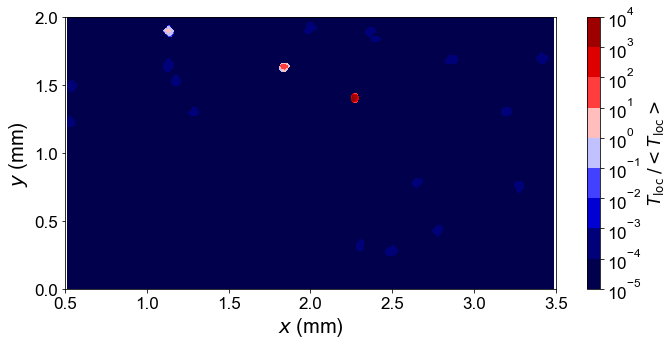


-----------------------------------------------------


Read granular temperature at 569


Reading particle info 569...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 569 successful

Read coordinate done


Interpolation done



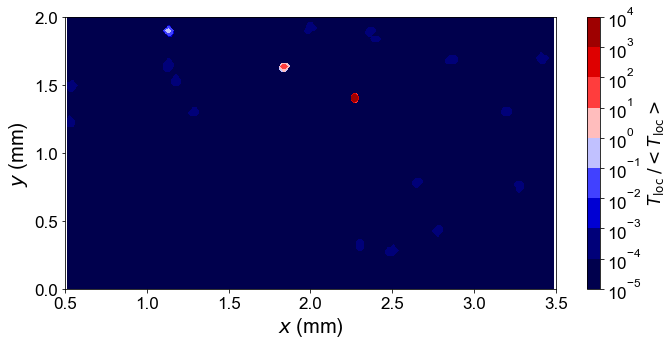


-----------------------------------------------------


Read granular temperature at 570


Reading particle info 570...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 570 successful

Read coordinate done


Interpolation done



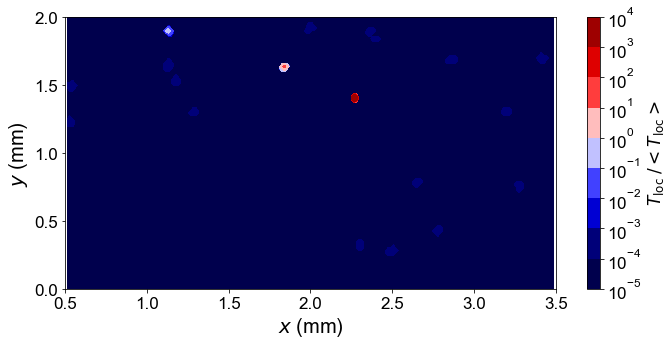


-----------------------------------------------------


Read granular temperature at 571


Reading particle info 571...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 571 successful

Read coordinate done


Interpolation done



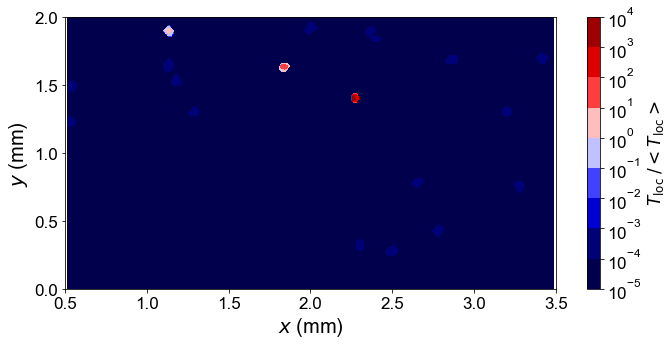


-----------------------------------------------------


Read granular temperature at 572


Reading particle info 572...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 572 successful

Read coordinate done


Interpolation done



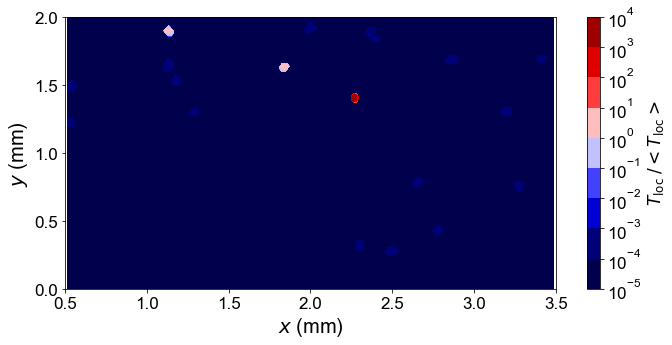


-----------------------------------------------------


Read granular temperature at 573


Reading particle info 573...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 573 successful

Read coordinate done


Interpolation done



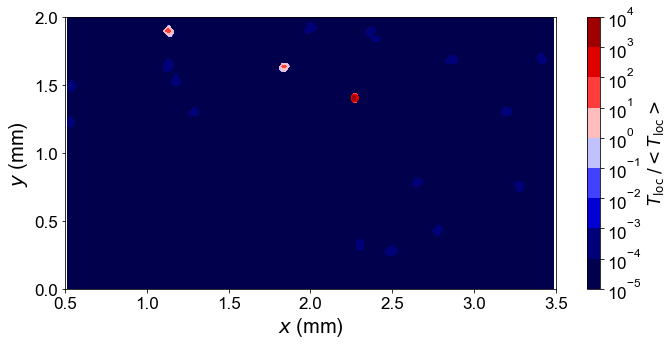


-----------------------------------------------------


Read granular temperature at 574


Reading particle info 574...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 574 successful

Read coordinate done


Interpolation done



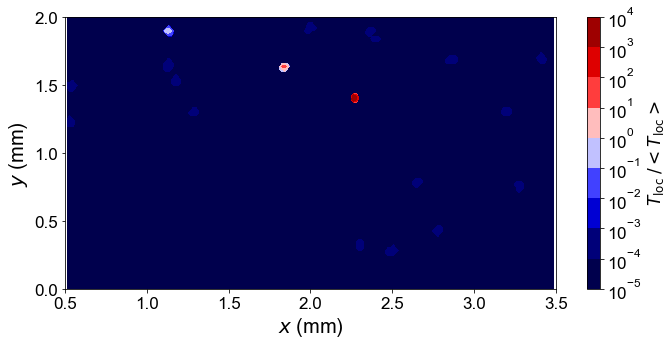


-----------------------------------------------------


Read granular temperature at 575


Reading particle info 575...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 575 successful

Read coordinate done


Interpolation done



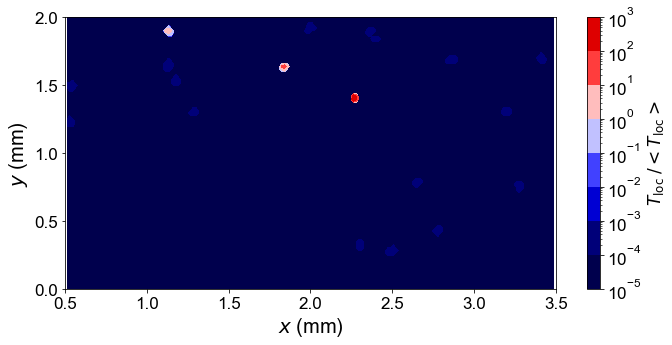


-----------------------------------------------------


Read granular temperature at 576


Reading particle info 576...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 576 successful

Read coordinate done


Interpolation done



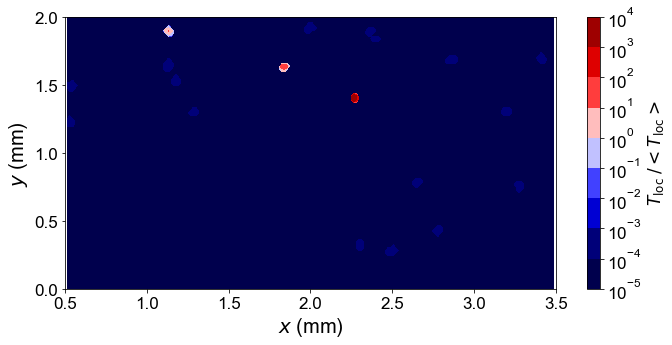


-----------------------------------------------------


Read granular temperature at 577


Reading particle info 577...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 577 successful

Read coordinate done


Interpolation done



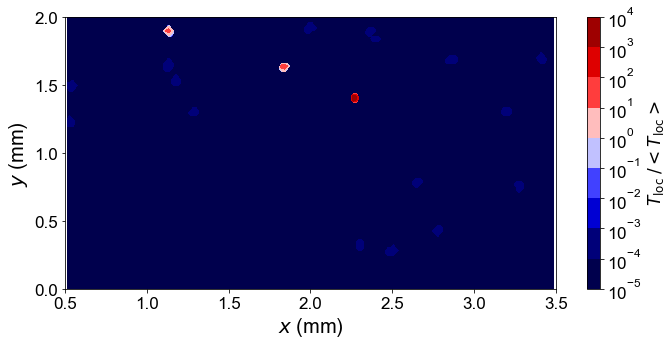


-----------------------------------------------------


Read granular temperature at 578


Reading particle info 578...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 578 successful

Read coordinate done


Interpolation done



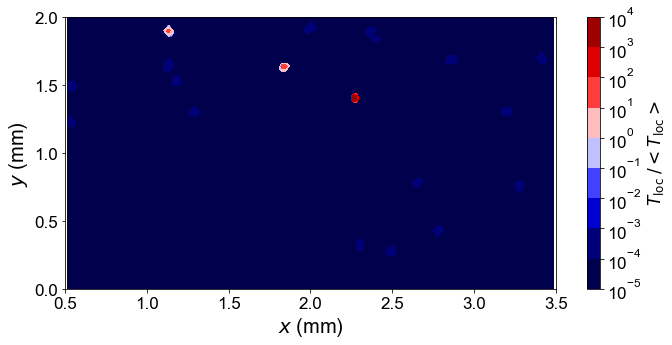


-----------------------------------------------------


Read granular temperature at 579


Reading particle info 579...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 579 successful

Read coordinate done


Interpolation done



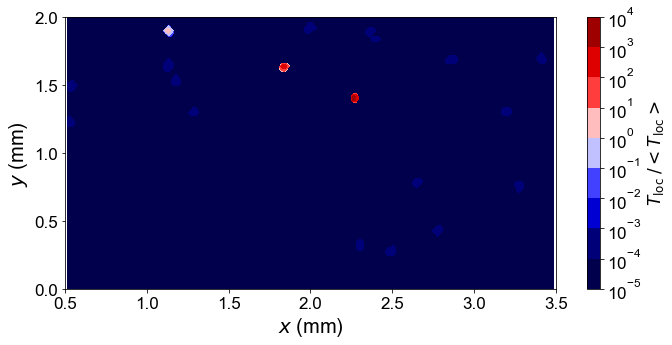


-----------------------------------------------------


Read granular temperature at 580


Reading particle info 580...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 580 successful

Read coordinate done


Interpolation done



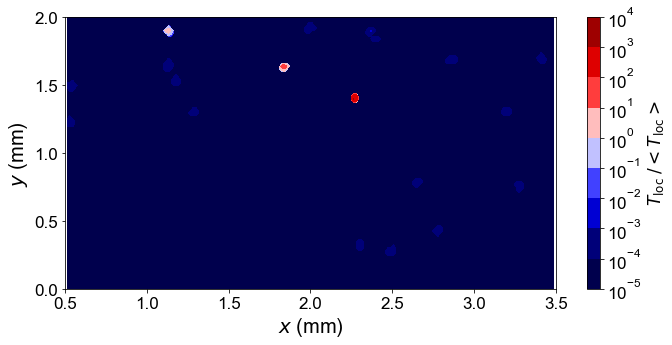


-----------------------------------------------------


Read granular temperature at 581


Reading particle info 581...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 581 successful

Read coordinate done


Interpolation done



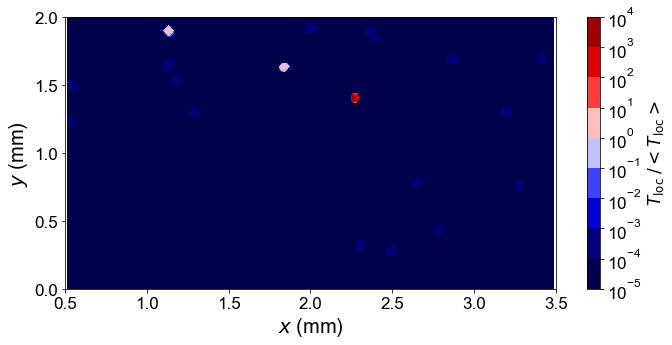


-----------------------------------------------------


Read granular temperature at 582


Reading particle info 582...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 582 successful

Read coordinate done


Interpolation done



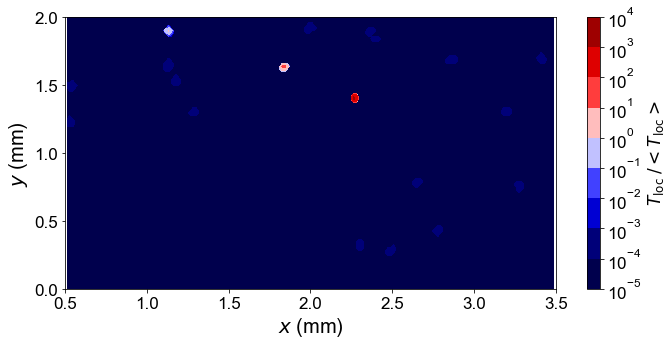


-----------------------------------------------------


Read granular temperature at 583


Reading particle info 583...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 583 successful

Read coordinate done


Interpolation done



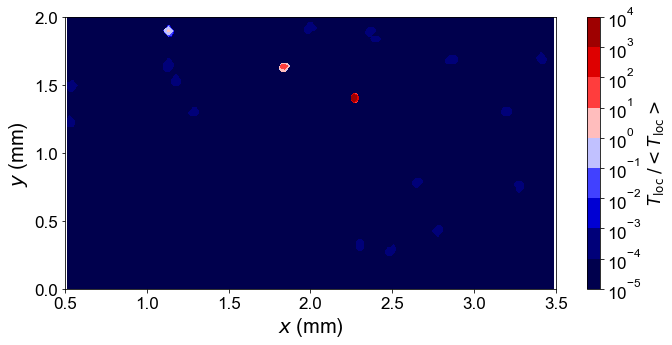


-----------------------------------------------------


Read granular temperature at 584


Reading particle info 584...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 584 successful

Read coordinate done


Interpolation done



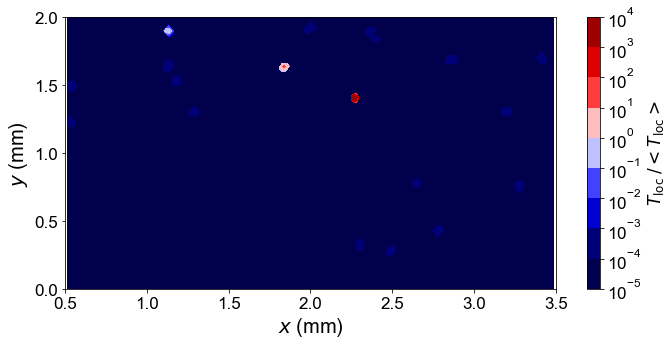


-----------------------------------------------------


Read granular temperature at 585


Reading particle info 585...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 585 successful

Read coordinate done


Interpolation done



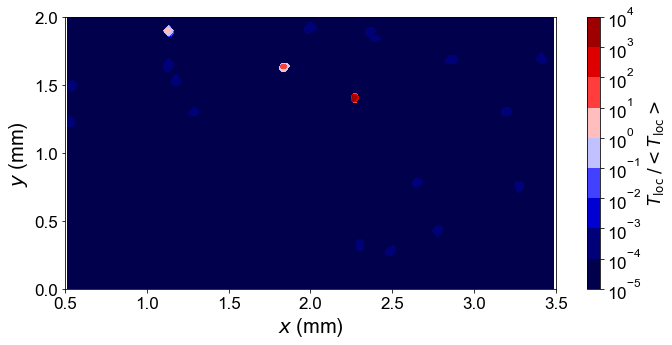


-----------------------------------------------------


Read granular temperature at 586


Reading particle info 586...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 586 successful

Read coordinate done


Interpolation done



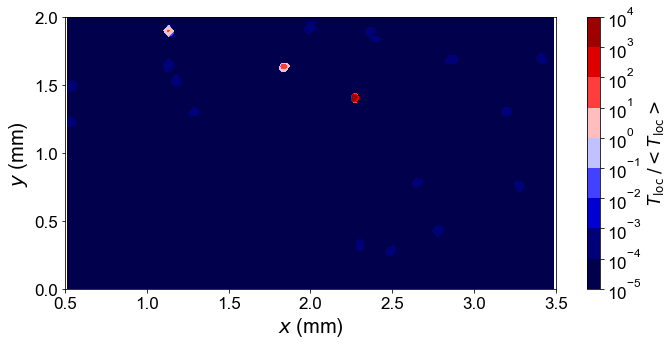


-----------------------------------------------------


Read granular temperature at 587


Reading particle info 587...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 587 successful

Read coordinate done


Interpolation done



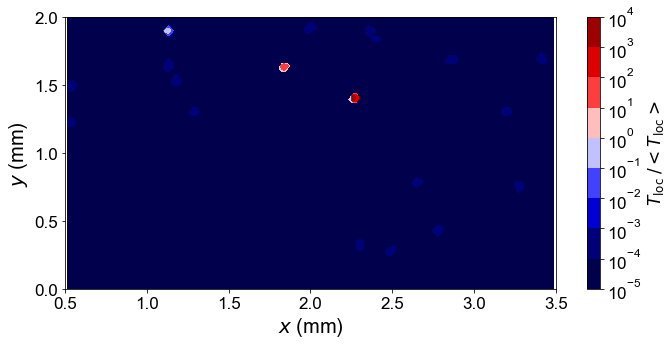


-----------------------------------------------------


Read granular temperature at 588


Reading particle info 588...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 588 successful

Read coordinate done


Interpolation done



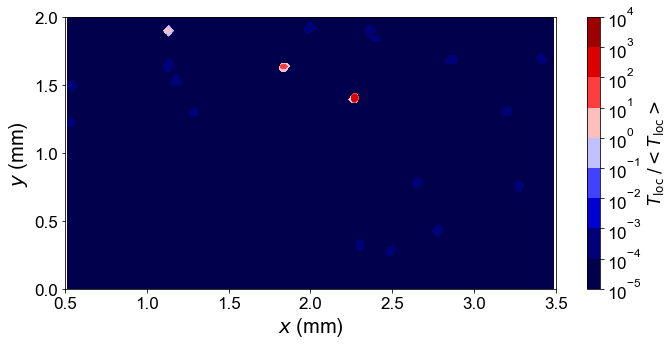


-----------------------------------------------------


Read granular temperature at 589


Reading particle info 589...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 589 successful

Read coordinate done


Interpolation done



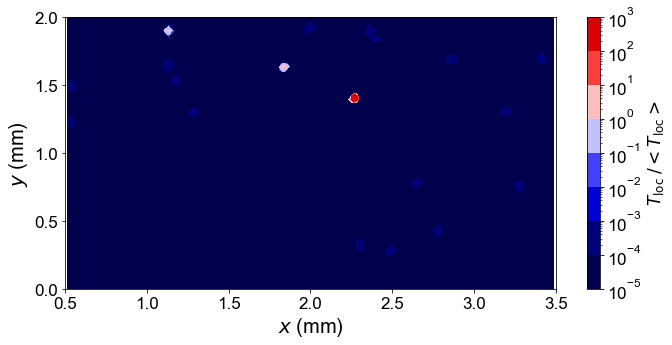


-----------------------------------------------------


Read granular temperature at 590


Reading particle info 590...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 590 successful

Read coordinate done


Interpolation done



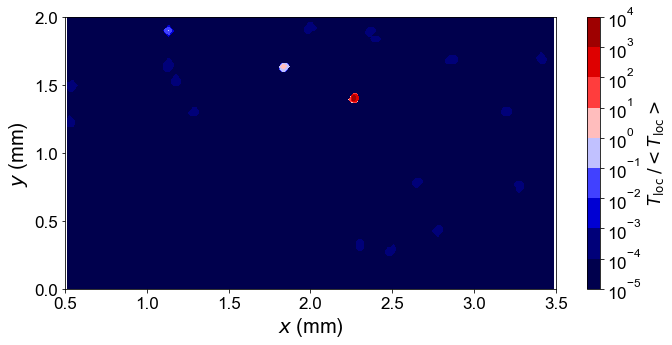


-----------------------------------------------------


Read granular temperature at 591


Reading particle info 591...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 591 successful

Read coordinate done


Interpolation done



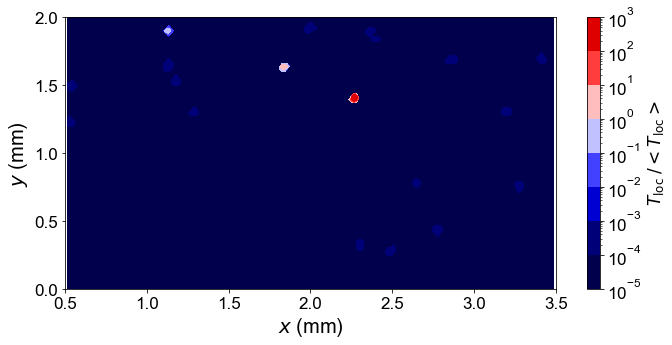


-----------------------------------------------------


Read granular temperature at 592


Reading particle info 592...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 592 successful

Read coordinate done


Interpolation done



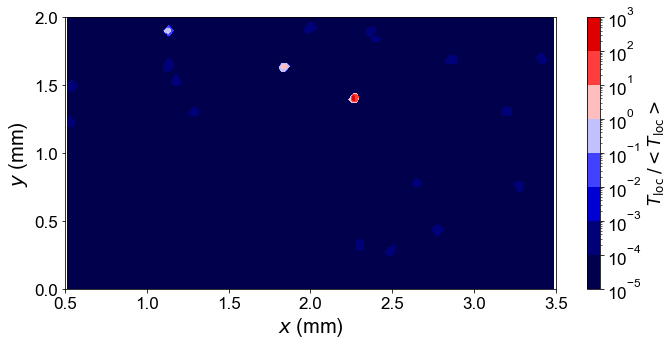


-----------------------------------------------------


Read granular temperature at 593


Reading particle info 593...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 593 successful

Read coordinate done


Interpolation done



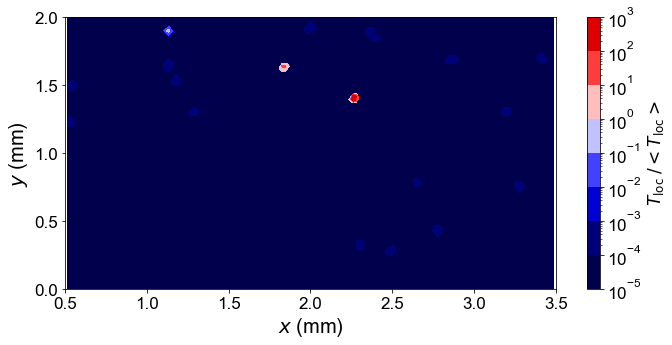


-----------------------------------------------------


Read granular temperature at 594


Reading particle info 594...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 594 successful

Read coordinate done


Interpolation done



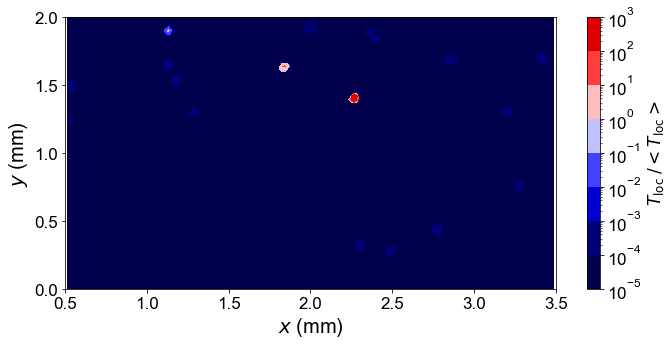


-----------------------------------------------------


Read granular temperature at 595


Reading particle info 595...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 595 successful

Read coordinate done


Interpolation done



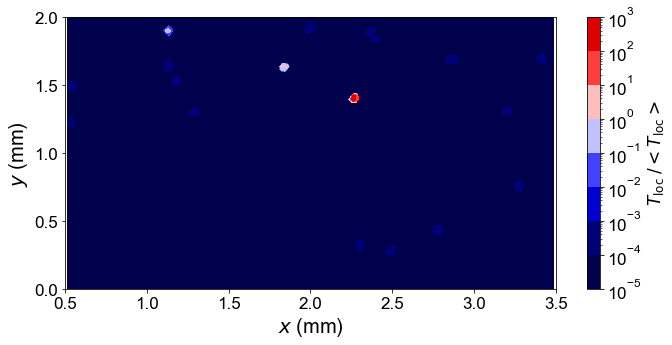


-----------------------------------------------------


Read granular temperature at 596


Reading particle info 596...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 596 successful

Read coordinate done


Interpolation done



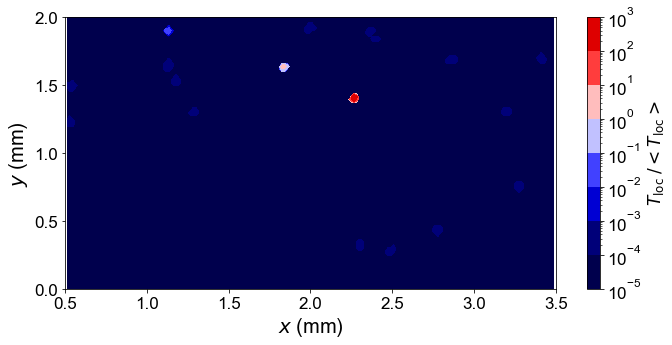


-----------------------------------------------------


Read granular temperature at 597


Reading particle info 597...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 597 successful

Read coordinate done


Interpolation done



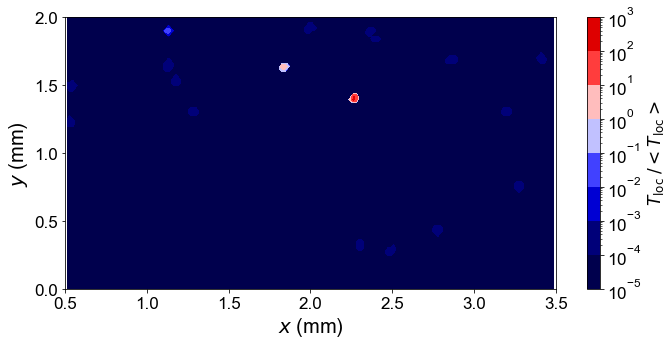


-----------------------------------------------------


Read granular temperature at 598


Reading particle info 598...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 598 successful

Read coordinate done


Interpolation done



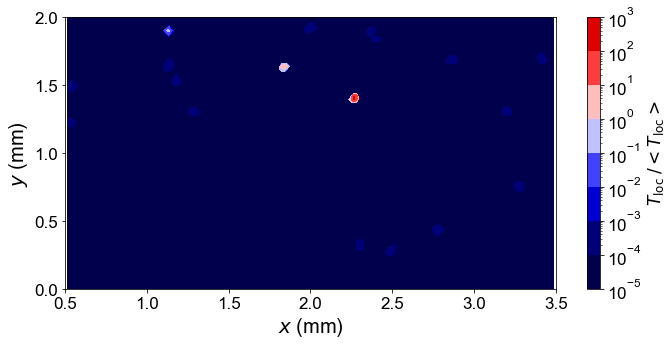


-----------------------------------------------------


Read granular temperature at 599


Reading particle info 599...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 599 successful

Read coordinate done


Interpolation done



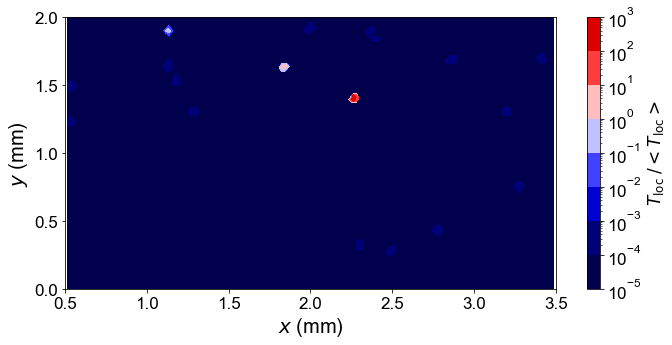


-----------------------------------------------------


Read granular temperature at 600


Reading particle info 600...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 600 successful

Read coordinate done


Interpolation done



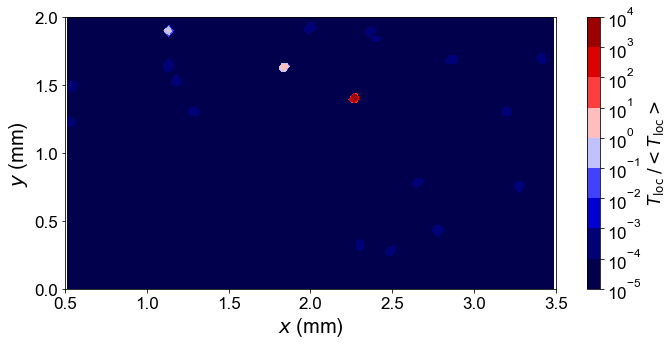


-----------------------------------------------------


!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!



In [6]:
#%% start the calculation
steps_ = len(index_)
for i_ in range(steps_):
    # import data
    granular_temperature_ = np.load('granular_temperature_data/temperature_at_%d.npy' % \
            (index_[i_]))
    print('\nRead granular temperature at %d\n' % (index_[i_]))
    ParticleInfo_ = read_ParticleInfo('../particle_info/particle_info_%d.txt', index_[i_])
    c_ = ParticleInfo_[:,[1,2]] # the coordinate of former particles
    c_ = c_.astype('float64')
    print('\nRead coordinate done\n')
    
    # traslate value
    for j_ in range(c_.shape[0]):
        c_[j_][0] = c_[j_][0] + thresh_trans_ / 1000
        if c_[j_][0] > 4 / 1000:
            c_[j_][0] -= 4 / 1000
            
    # screen value to avoid BC
    c_screened_, v_screened_ = screen_grains_by_x(x_lol_, x_upl_, c_, granular_temperature_ /  np.mean(granular_temperature_))    
    
    # interpolation
    granular_temperature_interpolation_ = griddata(c_screened_, v_screened_, (grid_xx_, grid_yy_), method='linear')
    print('\nInterpolation done\n')
    # plot and save
    plt.rc('font', family = 'Arial')
    plt.rcParams['font.size'] = 17
    plt.figure(figsize=(11, 5))
    plt.contourf(grid_xx_*1000, grid_yy_*1000 - 1, granular_temperature_interpolation_ + vmin_,locator=ticker.LogLocator(), \
                 levels = 10000, cmap = 'seismic', vmax = vmax_, vmin = vmin_)

    plt.ylabel('$\\mathit{y}$ (mm)', fontsize = 20)
    plt.xlabel('$\\mathit{x}$ (mm)', fontsize = 20)
#     plt.rcParams['xtick.direction'] = 'in'
#     plt.rcParams['ytick.direction'] = 'in'
    cb = plt.colorbar()
    cb.set_label(label = '$\\mathit{T}$'+ '$_\\mathrm{loc}$'+  ' $\\mathrm{/ <}$' +  '$\\mathit{T}$'+ '$_\\mathrm{loc}$' + '$\\mathrm{>}$')
    plt.savefig('note_book_plot/temperature_animation/granular_temperature_at_%d.svg' % (index_[i_]), dpi=600, format='svg')
    plt.show()
    print('\n-----------------------------------------------------\n')
print('\n!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!!\n') 
    

In [7]:
# define a function to statistic vertical to fault
#%% average over a certain distance
def average_along_y(y_, v_, n_):
    '''
    y_ - the y coodinate
    v_ - the corresponding coordinate
    n_ - the number of bins

    Returns
    -------
    centers_ - the center of each bins
    values_ - the average value of each bins

    '''
    centers_, values_ = np.zeros(n_), np.zeros(n_)
    count_ = np.zeros(n_)
    max_ = np.max(y_)
    min_ = np.min(y_)
    range_ = (max_ - min_)
    bins_ = np.linspace(min_, max_, n_ + 1)

    # calculate centers
    for i_ in range(n_):
        centers_[i_] = (bins_[i_] + bins_[i_+ 1]) / 2
    
    # calculate values
    for i_ in range(len(y_)):
        index_ = int( (y_[i_] - min_) / (max_ - min_) * n_ )
        if index_ == n_:
            index_ -= 1
        values_[index_] += v_[i_]
        count_[index_] += 1
        # print(index_)
    values_ = values_/count_
    # print(max_)
    # print(min_)
    # print(centers_)
    return centers_, values_
    
#  centers_, values_ = average_along_y(ynew_, vnew_, 10)  



In [8]:
# define a function to delete extreme value
#%% remove extreme value 
def remove_extreme_value(c_, v_, thresh_, y_lol_, y_upl_):
    '''
    c_ - c coodinate
    v_ - corresponding variables
    thresh_ - the threshold
    
    returns:
        cnew_ - the coodinate with no extrem values
        vnew_ - the correspnding coodinate 
    
    '''
    cnew_, vnew_ = [], [] # initialize
    for i_ in range(c_.shape[0]):
        if v_[i_] <= thresh_:
            if c_[i_][1] < y_upl_:
                if c_[i_][1] > y_lol_:
                    cnew_.append(c_[i_, :])
                    vnew_.append(v_[i_])

    return np.array(cnew_), np.array(vnew_)  # return handled coodinate and variables.

# cnew_, vnew_ = remove_extreme_value(c_, v_, thresh_)



Read granular temperature at 250


Reading particle info 250...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 250 successful

Read coordinate done



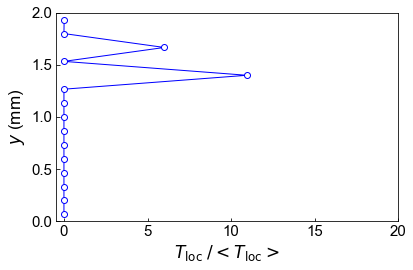


Read granular temperature at 370


Reading particle info 370...
Index(['ID', ' cx', ' cy', ' dx', ' dy', ' vx', ' vy', ' Cxx', ' Cxy', ' Cyy'], dtype='object')

Read particle info 370 successful

Read coordinate done



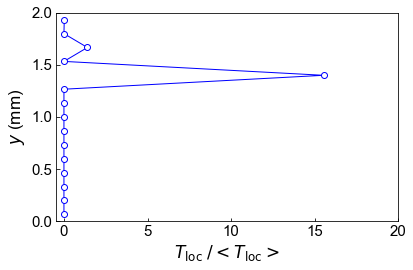

In [9]:
#%% start the calculation
steps_ = len(index_fig_)
for i_ in range(steps_):
    
    # import data
    temperature_ =     granular_temperature_ = np.load('granular_temperature_data/temperature_at_%d.npy' % \
            (index_fig_[i_]))
    print('\nRead granular temperature at %d\n' % (index_fig_[i_]))
    ParticleInfo_ = read_ParticleInfo('../particle_info/particle_info_%d.txt', index_fig_[i_])
    c_ = ParticleInfo_[:,[1,2]] # the coordinate of former particles
    c_ = c_.astype('float64')
    print('\nRead coordinate done\n')
    # screen value to avoid BC
    c_screened_, v_screened_ = screen_grains_by_x(x_lol_, x_upl_, c_, temperature_)
    # remove extreme value of nonaffine
    cnew_, vnew_ = remove_extreme_value(c_screened_, v_screened_ / np.mean(v_screened_), thresh_, y_lol_, y_upl_)
    # statictics along coordinate y
    centers_, values_ = average_along_y(cnew_[:, 1], vnew_, n_layers_)   
    # plot the results
    plt.rcParams['xtick.direction'] = 'in'
    plt.rcParams['ytick.direction'] = 'in'
    plt.rc('font', family = 'Arial')
    plt.rcParams['font.size'] = 15    
    plt.plot(values_, centers_ * 1000 - 1, marker = 'o',markerfacecolor = 'w', linewidth = 1, color = 'b')
    plt.ylim([0,2])
    plt.xlim([-0.5, 20])
    plt.ylabel('$\\mathit{y}$ (mm)', fontsize = 17)
    plt.xlabel( '$\\mathit{T}$'+ '$_\\mathrm{loc}$'+  ' $\\mathrm{/ <}$' +  '$\\mathit{T}$'+ '$_\\mathrm{loc}$' + '$\\mathrm{>}$', fontsize = 17)
    plt.tight_layout()
    # plt.title('Stick')
#     plt.text( 9, 0.0002, 'Stick')

    plt.savefig('note_book_plot/average_of_granular_temperature_at_%d.svg' % (index_fig_[i_]), format='svg')
    plt.show()